In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import pandas as pd

file_path = "laptopData.csv"

df = pd.read_csv(file_path)
df.head(n=10)


,Unnamed: 0,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price
0,0.0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832
1,1.0,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
2,2.0,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000
3,3.0,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360
4,4.0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080
5,5.0,Acer,Notebook,15.6,1366x768,AMD A9-Series 9420 3GHz,4GB,500GB HDD,AMD Radeon R5,Windows 10,2.1kg,21312.0000
6,6.0,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.2GHz,16GB,256GB Flash Storage,Intel Iris Pro Graphics,Mac OS X,2.04kg,114017.6016
7,7.0,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,256GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,61735.5360
8,8.0,Asus,Ultrabook,14,Full HD 1920x1080,Intel Core i7 8550U 1.8GHz,16GB,512GB SSD,Nvidia GeForce MX150,Windows 10,1.3kg,79653.6000
9,9.0,Acer,Ultrabook,14,IPS Panel Full HD 1920x1080,Intel Core i5 8250U 1.6GHz,8GB,256GB SSD,Intel UHD Graphics 620,Windows 10,1.6kg,41025.6000


In [3]:
df = df.drop(columns = 'Unnamed: 0')

In [4]:
df.head()

,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1303 entries, 0 to 1302
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Company           1273 non-null   object 
 1   TypeName          1273 non-null   object 
 2   Inches            1273 non-null   object 
 3   ScreenResolution  1273 non-null   object 
 4   Cpu               1273 non-null   object 
 5   Ram               1273 non-null   object 
 6   Memory            1273 non-null   object 
 7   Gpu               1273 non-null   object 
 8   OpSys             1273 non-null   object 
 9   Weight            1273 non-null   object 
 10  Price             1273 non-null   float64
dtypes: float64(1), object(10)
memory usage: 112.1+ KB


In [6]:
df.columns = df.columns.str.lower()

In [7]:
df.isnull().sum()

company             30
typename            30
inches              30
screenresolution    30
cpu                 30
ram                 30
memory              30
gpu                 30
opsys               30
weight              30
price               30
dtype: int64

In [8]:
df[df['company'].isnull()]  # these all the rows are null. so dropping them
df = df.dropna(how = 'all')

In [9]:
df.duplicated().sum()

29

In [10]:
df = df.drop_duplicates(keep = 'first')

In [11]:
df['company'].unique()  

array(['Apple', 'HP', 'Acer', 'Asus', 'Dell', 'Lenovo', 'Chuwi', 'MSI',
       'Microsoft', 'Toshiba', 'Huawei', 'Xiaomi', 'Vero', 'Razer',
       'Mediacom', 'Samsung', 'Google', 'Fujitsu', 'LG'], dtype=object)

In [12]:
df['typename'].unique() 

array(['Ultrabook', 'Notebook', 'Gaming', '2 in 1 Convertible',
       'Workstation', 'Netbook'], dtype=object)

In [13]:
df['inches'].unique()  # ?

array(['13.3', '15.6', '15.4', '14', '12', '17.3', '13.5', '12.5', '13',
       '18.4', '13.9', '11.6', '25.6', '35.6', '12.3', '27.3', '24',
       '33.5', '?', '31.6', '17', '15', '14.1', '11.3', '10.1'],
      dtype=object)

In [14]:
df['screenresolution'].value_counts()

screenresolution
Full HD 1920x1080                                493
1366x768                                         255
IPS Panel Full HD 1920x1080                      222
IPS Panel Full HD / Touchscreen 1920x1080         50
Full HD / Touchscreen 1920x1080                   45
1600x900                                          23
Touchscreen 1366x768                              16
Quad HD+ / Touchscreen 3200x1800                  14
IPS Panel 4K Ultra HD 3840x2160                   12
IPS Panel 4K Ultra HD / Touchscreen 3840x2160     11
4K Ultra HD / Touchscreen 3840x2160                9
IPS Panel 1366x768                                 7
4K Ultra HD 3840x2160                              7
Touchscreen 2560x1440                              6
IPS Panel Retina Display 2304x1440                 6
IPS Panel Retina Display 2560x1600                 6
Touchscreen 2256x1504                              6
IPS Panel Touchscreen 2560x1440                    5
1440x900                     

In [15]:
df['screenresolution'].isnull().sum()

0

In [16]:
df['cpu'].unique()

array(['Intel Core i5 2.3GHz', 'Intel Core i5 1.8GHz',
       'Intel Core i5 7200U 2.5GHz', 'Intel Core i7 2.7GHz',
       'Intel Core i5 3.1GHz', 'AMD A9-Series 9420 3GHz',
       'Intel Core i7 2.2GHz', 'Intel Core i7 8550U 1.8GHz',
       'Intel Core i5 8250U 1.6GHz', 'Intel Core i3 6006U 2GHz',
       'Intel Core i7 2.8GHz', 'Intel Core M m3 1.2GHz',
       'Intel Core i7 7500U 2.7GHz', 'Intel Core i7 2.9GHz',
       'Intel Core i3 7100U 2.4GHz', 'Intel Core i5 7300HQ 2.5GHz',
       'AMD E-Series E2-9000e 1.5GHz', 'Intel Core i5 1.6GHz',
       'Intel Core i7 8650U 1.9GHz', 'Intel Atom x5-Z8300 1.44GHz',
       'AMD E-Series E2-6110 1.5GHz', 'AMD A6-Series 9220 2.5GHz',
       'Intel Celeron Dual Core N3350 1.1GHz',
       'Intel Core i3 7130U 2.7GHz', 'Intel Core i7 7700HQ 2.8GHz',
       'Intel Core i5 2.0GHz', 'AMD Ryzen 1700 3GHz',
       'Intel Pentium Quad Core N4200 1.1GHz',
       'Intel Celeron Dual Core N3060 1.6GHz', 'Intel Core i5 1.3GHz',
       'AMD FX 9830P 3GHz', '

In [17]:
df['cpu'].isnull().sum()

0

In [18]:
df['ram'].isnull().sum()

0

In [19]:
df['ram'].value_counts()

ram
8GB     595
4GB     358
16GB    192
6GB      34
12GB     25
32GB     17
2GB      16
64GB      3
24GB      3
1GB       1
Name: count, dtype: int64

In [20]:
df[df['ram'] == '1GB']
# windows 10 cant run on the 1GB system.
df[df['ram'] == '2GB']  # this is still possible chrome os and windows 10 can run on 2 GB ram
df[df['ram'] == '24GB'] # they are possible.
df[df['ram'] == '32GB'] # they are possible.
df[df['ram'] == '64GB'] # they are possible.

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
71,Dell,Ultrabook,13.3,IPS Panel Full HD 1920x1080,Intel Core i7 8550U 1.8GHz,64GB,256GB SSD,AMD Radeon 530,Windows 10,1.4kg,50882.4000
720,Lenovo,Ultrabook,14,IPS Panel Quad HD+ 2560x1440,Intel Core i7 6500U 2.5GHz,64GB,512GB SSD,Intel HD Graphics 520,Windows 10,1.17kg,89864.1792
1066,Asus,Gaming,17.3,IPS Panel Full HD 1920x1080,Intel Core i7 6820HK 2.7GHz,64GB,1TB SSD,Nvidia GeForce GTX 980,Windows 10,3.58kg,211788.0000


In [21]:
# will change later. -- ram 1gb.

- memory has ?
- memory has flash storage , hdd and ssd -- three cols can be created.
- id 903,824,609,319 -- their flash storage means ssd along with all the apple devices.
- id 447 has both flash storage and hdd

In [22]:
df['memory'].value_counts()

memory
256GB SSD                        401
1TB HDD                          209
500GB HDD                        121
512GB SSD                        112
128GB SSD +  1TB HDD              92
128GB SSD                         72
256GB SSD +  1TB HDD              71
32GB Flash Storage                35
2TB HDD                           16
512GB SSD +  1TB HDD              14
1TB SSD                           13
64GB Flash Storage                12
256GB SSD +  2TB HDD              10
256GB Flash Storage                8
16GB Flash Storage                 7
1.0TB Hybrid                       7
32GB SSD                           6
128GB Flash Storage                4
180GB SSD                          4
16GB SSD                           3
512GB SSD +  2TB HDD               3
256GB SSD +  500GB HDD             2
128GB SSD +  2TB HDD               2
256GB SSD +  256GB SSD             2
1TB SSD +  1TB HDD                 2
512GB Flash Storage                2
512GB SSD +  512GB SSD         

In [23]:
df[df['memory'].str.contains('Flash', case = False)]

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
6,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.2GHz,16GB,256GB Flash Storage,Intel Iris Pro Graphics,Mac OS X,2.04kg,114017.6016
7,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,256GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,61735.5360
26,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.6GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,Mac OS X,1.35kg,58554.7200
30,Chuwi,Notebook,15.6,Full HD 1920x1080,Intel Atom x5-Z8300 1.44GHz,4GB,64GB Flash Storage,Intel HD Graphics,Windows 10,1.89kg,13053.0672
...,...,...,...,...,...,...,...,...,...,...,...
1193,Apple,Ultrabook,12,IPS Panel Retina Display 2304x1440,Intel Core M 1.1GHz,8GB,256GB Flash Storage,Intel HD Graphics 5300,Mac OS X,0.920kg,61964.6400
1210,Apple,Ultrabook,12,IPS Panel Retina Display 2304x1440,Intel Core M 1.2GHz,8GB,512GB Flash Storage,Intel HD Graphics 515,Mac OS X,0.920kg,68145.1200
1234,Apple,Ultrabook,11.6,1366x768,Intel Core i5 1.6GHz,4GB,256GB Flash Storage,Intel HD Graphics 6000,Mac OS X,1.08kg,51095.5200
1268,HP,Netbook,11.6,1366x768,Intel Celeron Dual Core N3060 1.6GHz,2GB,32GB Flash Storage,Intel HD Graphics 400,Windows 10,1.17kg,11135.5200


In [24]:
df[(df['memory'].str.contains('Flash',case = False)) & ~(df['company'] == 'Apple')]

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
30,Chuwi,Notebook,15.6,Full HD 1920x1080,Intel Atom x5-Z8300 1.44GHz,4GB,64GB Flash Storage,Intel HD Graphics,Windows 10,1.89kg,13053.0672
31,Asus,Notebook,14,1366x768,AMD E-Series E2-6110 1.5GHz,2GB,32GB Flash Storage,AMD Radeon R2,Windows 10,1.65kg,10602.7200
35,Lenovo,Notebook,14,1366x768,Intel Celeron Dual Core N3350 1.1GHz,4GB,64GB Flash Storage,Intel HD Graphics 500,Windows 10,1.44kg,13266.7200
191,Vero,Notebook,14,IPS Panel Full HD 1920x1080,Intel Celeron Dual Core N3350 1.1GHz,4GB,32GB Flash Storage,Intel HD Graphics 500,Windows 10,1.3kg,13852.8000
314,Asus,2 in 1 Convertible,11.6,Touchscreen 1366x768,Intel Celeron Dual Core N3350 1.1GHz,2GB,32GB Flash Storage,Intel HD Graphics 500,Windows 10,1.1kg,14652.0000
317,Lenovo,Notebook,13.3,1366x768,Intel Celeron Dual Core 3855U 1.6GHz,4GB,16GB Flash Storage,Intel HD Graphics 510,Chrome OS,1.45kg,24503.4720
319,Acer,Notebook,11.6,1366x768,Intel Pentium Quad Core N3710 1.6GHz,4GB,128GB Flash Storage,Intel HD Graphics 405,Windows 10,1.4kg,25840.8000
325,Lenovo,Notebook,14,1366x768,Intel Celeron Dual Core N3350 1.1GHz,4GB,32GB Flash Storage,Intel HD Graphics 500,Windows 10,1.44kg,15557.7600
346,HP,Notebook,14,1366x768,Intel Celeron Dual Core N3060 1.6GHz,2GB,32GB Flash Storage,Intel HD Graphics 400,Windows 10,1.44kg,14865.1200
348,Asus,2 in 1 Convertible,11.6,Touchscreen 1366x768,Intel Celeron Dual Core N3350 1.1GHz,4GB,32GB Flash Storage,Intel HD Graphics 500,Windows 10,1.5kg,19980.0000


In [25]:
df['memory'].isnull().sum()

0

- more columns can be made from this gpu column

In [26]:
df['gpu'].isnull().sum()

0

In [27]:
df['gpu'].value_counts()

gpu
Intel HD Graphics 620      269
Intel HD Graphics 520      177
Intel UHD Graphics 620      66
Nvidia GeForce GTX 1050     64
Nvidia GeForce GTX 1060     48
                          ... 
AMD Radeon R7 Graphics       1
AMD Radeon R7 M360           1
Nvidia Quadro M3000M         1
Nvidia GeForce 960M          1
ARM Mali T860 MP4            1
Name: count, Length: 110, dtype: int64

opsys column has - consistency issues.

In [28]:
df['opsys'].value_counts()

opsys
Windows 10      1022
No OS             63
Linux             57
Windows 7         45
Chrome OS         27
macOS             13
Mac OS X           8
Windows 10 S       8
Android            1
Name: count, dtype: int64

In [29]:
df[df['opsys'] == 'Android']
# valid.

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
1114,Lenovo,2 in 1 Convertible,10.1,IPS Panel Touchscreen 1920x1200,Intel Atom x5-Z8550 1.44GHz,4GB,64GB Flash Storage,Intel HD Graphics 400,Android,0.69kg,29250.72


In [30]:
df['weight'].isnull().sum()

0

# Data Cleaning.

In [31]:
# data completeness issue has already been solved.
df.isnull().sum()

company             0
typename            0
inches              0
screenresolution    0
cpu                 0
ram                 0
memory              0
gpu                 0
opsys               0
weight              0
price               0
dtype: int64

In [32]:
# now dealing with the structural issues.
# screenresolution column

In [33]:
df1 = df.copy()

In [34]:
df1['px_height'] = df1['screenresolution'].str.split('x').str.get(1)

In [35]:
df1['px_width'] = df1['screenresolution'].str.split('x').str.get(0).str.split(' ').apply(lambda x:x[-1])

In [36]:
df1['px_height'].isnull().sum()

0

In [37]:
df1['display_ips_panel'] = df1['screenresolution'].str.contains('IPS Panel',case = False)

In [38]:
df = pd.merge(df,df1[['px_width','px_height','display_ips_panel']], on = df.index)

In [39]:
df = df.set_index('key_0')

In [40]:
df['display_is_touch_screen'] = df['screenresolution'].str.contains('Touchscreen', case = False)

In [41]:
df[(df['typename'] == '2 in 1 Convertible') & (df['display_is_touch_screen'] == False)]
# there cannot be a 2 in 1 convertible which doesnt have a touch screen - display as they are meant to be used as both laptops and tablets.

df.loc[(df['typename'] == '2 in 1 Convertible') & (df['display_is_touch_screen'] == False),'display_is_touch_screen'] = True

In [42]:
# cpu column

In [43]:
df2 = df.copy()
df2.head()

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price,px_width,px_height,display_ips_panel,display_is_touch_screen
key_0,,,,,,,,,,,,,,,
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832,2560,1600,True,False
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232,1440,900,False,False
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000,1920,1080,False,False
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360,2880,1800,True,False
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080,2560,1600,True,False


In [44]:
df2['cpu_brand'] = df2['cpu'].str.split(' ', n = 1).str.get(0)

In [45]:
df2['clock_speed'] = df2['cpu'].str.split().apply(lambda x:x[-1])

In [46]:
import numpy as np

# بعد الاستيراد الكود هيشتغل
df2['clock_speed'] = df2['clock_speed'].str.strip('GHz').astype(np.float64)


In [47]:
df2['gpu_brand'] = df2['gpu'].str.split(' ').str.get(0)

In [48]:
df2['gpu_brand']

key_0
0        Intel
1        Intel
2        Intel
3          AMD
4        Intel
         ...  
1269    Nvidia
1270     Intel
1271     Intel
1272     Intel
1273       AMD
Name: gpu_brand, Length: 1244, dtype: object

In [49]:
# now lets get all the indexes where the flash storage means the ssd.
# 903,824,609,319  - consider them
# dont consider flash + hdd index. 

In [50]:
memory_df = pd.DataFrame(df2['memory'].str.split('+').apply(pd.Series))

In [51]:
memory_df.columns = ['ssd_capacity','hdd_capacity']

In [52]:
swapper_index = memory_df[(memory_df['ssd_capacity'].str.contains('HDD',case = False)) | (memory_df['ssd_capacity'].str.contains('Hybrid',case = False))].index

In [53]:
memory_df.loc[swapper_index,:] = memory_df.loc[swapper_index].shift(1,axis = 1)

In [54]:
memory_df['hdd_capacity'] = memory_df['hdd_capacity'].str.strip()

In [55]:
memory_df[memory_df['hdd_capacity'].str.contains('ssd', case = False) == True]

,ssd_capacity,hdd_capacity
key_0,,
28,256GB SSD,256GB SSD
266,512GB SSD,512GB SSD
347,512GB SSD,256GB SSD
901,256GB SSD,256GB SSD


In [56]:
memory_df['ssd_count'] = 0 # just for initialisation.
memory_df['hdd_count'] = 0 # just for initialisation.

In [57]:
memory_df.loc[[28,266,347,901],'ssd_count'] = 2

In [58]:
memory_df.loc[[28,266,347,901],'hdd_capacity'] = None

In [59]:
df[df['memory'].str.contains('hdd', case = False)]['memory'].value_counts()

memory
1TB HDD                          209
500GB HDD                        121
128GB SSD +  1TB HDD              92
256GB SSD +  1TB HDD              71
2TB HDD                           16
512GB SSD +  1TB HDD              14
256GB SSD +  2TB HDD              10
512GB SSD +  2TB HDD               3
256GB SSD +  500GB HDD             2
128GB SSD +  2TB HDD               2
1TB SSD +  1TB HDD                 2
64GB Flash Storage +  1TB HDD      1
1TB HDD +  1TB HDD                 1
32GB HDD                           1
128GB HDD                          1
1.0TB HDD                          1
Name: count, dtype: int64

In [60]:
df[df['memory'] == '1TB HDD +  1TB HDD']
# this case has the 2 HDD - index - 703

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price,px_width,px_height,display_ips_panel,display_is_touch_screen
key_0,,,,,,,,,,,,,,,
703,Lenovo,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,4GB,1TB HDD + 1TB HDD,Intel HD Graphics 620,Windows 10,2.1kg,33110.856,1920,1080,False,False


In [61]:
memory_df.loc[703,'ssd_count'] = 0
memory_df.loc[703,'hdd_count'] = 2

In [62]:
memory_df.loc[703]

ssd_capacity       None
hdd_capacity    1TB HDD
ssd_count             0
hdd_count             2
Name: 703, dtype: object

In [63]:
memory_df[memory_df['hdd_capacity'].str.contains('ssd', case = False) == True]  # fixed.

,ssd_capacity,hdd_capacity,ssd_count,hdd_count
key_0,,,,


In [64]:
memory_df[memory_df['ssd_capacity'].str.contains('hdd', case = False) == True] # fixed.

,ssd_capacity,hdd_capacity,ssd_count,hdd_count
key_0,,,,


In [65]:
# now flash storage problem

In [66]:
# now find the index where the flash storage are actually the ssd only - i.e when company = apple and the index are these 903,824,609,319

In [67]:
flash_is_ssd = df[(df['company'] == 'Apple') & (df['memory'].str.contains('Flash', case = False))].index

In [68]:
memory_df.loc[flash_is_ssd,'ssd_count'] = 1

In [69]:
flash_not_ssd = set(df[~(df['company'] == 'Apple') & (df['memory'].str.contains('Flash', case = False))].index)

In [70]:
index_to_remove = set([903,824,609,319])

In [71]:
flash_not_ssd = list(flash_not_ssd - index_to_remove)

In [72]:
memory_df['flash_storage'] = memory_df.loc[flash_not_ssd]['ssd_capacity']
memory_df.loc[flash_not_ssd,'ssd_capacity'] = None

In [73]:
memory_df.loc[447,'hdd_count'] = 1

In [74]:
memory_df['ssd_capacity'].unique()

array(['128GB SSD', '128GB Flash Storage', '256GB SSD', '512GB SSD', None,
       '256GB Flash Storage', '128GB SSD ', '256GB SSD ', '32GB SSD',
       '64GB SSD', '512GB SSD ', '1TB SSD', '16GB SSD', '180GB SSD',
       '1TB SSD ', '?', '512GB Flash Storage', '240GB SSD', '8GB SSD'],
      dtype=object)

In [75]:
memory_df['ssd_capacity'] = memory_df['ssd_capacity'].str.strip('GB')

In [76]:
memory_df['ssd_capacity'].unique()

array(['128GB SSD', '128GB Flash Storage', '256GB SSD', '512GB SSD', None,
       '256GB Flash Storage', '128GB SSD ', '256GB SSD ', '32GB SSD',
       '64GB SSD', '512GB SSD ', '1TB SSD', '16GB SSD', '180GB SSD',
       '1TB SSD ', '?', '512GB Flash Storage', '240GB SSD', '8GB SSD'],
      dtype=object)

In [77]:
memory_df['ssd_capacity'].value_counts()

ssd_capacity
256GB SSD              401
512GB SSD              112
128GB SSD               94
256GB SSD               86
128GB SSD               72
512GB SSD               20
1TB SSD                 13
256GB Flash Storage      8
32GB SSD                 6
128GB Flash Storage      4
180GB SSD                4
16GB SSD                 3
512GB Flash Storage      2
1TB SSD                  2
64GB SSD                 1
?                        1
240GB SSD                1
8GB SSD                  1
Name: count, dtype: int64

In [78]:
memory_df.loc[memory_df['ssd_capacity'] == '?','ssd_capacity'] = None

In [79]:
memory_df.loc[770]

ssd_capacity     None
hdd_capacity      NaN
ssd_count           0
hdd_count           0
flash_storage     NaN
Name: 770, dtype: object

In [80]:
memory_df['ssd_capacity'] = memory_df['ssd_capacity'].str.split(' ', n= 1).str.get(0)

In [81]:
memory_df['ssd_capacity'].value_counts()

ssd_capacity
256GB    495
128GB    170
512GB    134
1TB       15
32GB       6
180GB      4
16GB       3
64GB       1
240GB      1
8GB        1
Name: count, dtype: int64

In [82]:
memory_df['ssd_capacity'] = memory_df['ssd_capacity'].str.strip('GB').str.strip('TB')

In [83]:
memory_df['ssd_capacity'] = memory_df['ssd_capacity'].astype(np.float64)

In [84]:
ssd_in_tb = memory_df[memory_df['ssd_capacity'] == 1].index

In [85]:
memory_df.loc[ssd_in_tb,'ssd_capacity'] = memory_df.loc[ssd_in_tb,'ssd_capacity']*1024

In [86]:
memory_df['ssd_capacity'].value_counts()

ssd_capacity
256.0     495
128.0     170
512.0     134
1024.0     15
32.0        6
180.0       4
16.0        3
64.0        1
240.0       1
8.0         1
Name: count, dtype: int64

In [87]:
memory_df['hdd_capacity'].value_counts()

hdd_capacity
1TB HDD         390
500GB HDD       123
2TB HDD          31
1.0TB Hybrid      9
32GB HDD          1
128GB HDD         1
508GB Hybrid      1
1.0TB HDD         1
Name: count, dtype: int64

In [88]:
memory_df.loc[:,'hdd_capacity'] = memory_df['hdd_capacity'].str.strip('HDD').str.strip('Hybrid').str.strip('GB').str.strip('TB').str.strip('GB ').str.strip('TB ').astype(np.float64)

In [89]:
hdd_in_tb = memory_df[(memory_df['hdd_capacity'] == 1) | (memory_df['hdd_capacity'] == 2)].index

In [90]:
memory_df.loc[hdd_in_tb,'hdd_capacity'] = memory_df.loc[hdd_in_tb]['hdd_capacity'] * 1024

In [91]:
# 28,266,347,901 - 2ssd
# 703 - 2hdd

In [92]:
memory_df['hdd_capacity'].value_counts()

hdd_capacity
1024.0    400
500.0     123
2048.0     31
32.0        1
128.0       1
508.0       1
Name: count, dtype: int64

In [93]:
index_to_work_on = list(set(memory_df.index) - set([28,266,347,901,703]))

In [94]:
memory_df.loc[index_to_work_on,'ssd_count'] = memory_df.loc[index_to_work_on]['ssd_capacity'].apply(lambda x:1 if pd.notna(x) else 0)

In [95]:
memory_df.loc[index_to_work_on,'hdd_count']  = memory_df.loc[index_to_work_on]['hdd_capacity'].apply(lambda x: 1 if pd.notna(x) else 0)

In [96]:
memory_df['ssd_count'].value_counts()

ssd_count
1    826
0    414
2      4
Name: count, dtype: int64

In [97]:
memory_df.loc[[28,266,347,901]]

,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage
key_0,,,,,
28,256.0,NaN,2,0,NaN
266,512.0,NaN,2,0,NaN
347,512.0,NaN,2,0,NaN
901,256.0,NaN,2,0,NaN


In [98]:
memory_df['flash_storage'].value_counts()

flash_storage
32GB Flash Storage     35
64GB Flash Storage     12
16GB Flash Storage      7
64GB Flash Storage      1
Name: count, dtype: int64

In [99]:
memory_df.loc[:,'flash_storage'] = memory_df['flash_storage'].str.split(' ').str.get(0).str.strip().str.strip('GB')

In [100]:
memory_df['ssd_capacity'].value_counts()

ssd_capacity
256.0     495
128.0     170
512.0     134
1024.0     15
32.0        6
180.0       4
16.0        3
64.0        1
240.0       1
8.0         1
Name: count, dtype: int64

In [101]:
df2 = pd.merge(df2,memory_df, left_index= True, right_index = True, how = 'left')

In [102]:
# 180 and 240 gb ssd are possible - in refurbished laptops/business laptops.

In [103]:
# at index 950 the data for ssd_capacity is wrong. price is high
df2.loc[950,'ssd_capacity'] = np.NaN

In [104]:
df2[df2['ssd_capacity'].isin([8,16,32,64])][['company','typename','ssd_capacity','hdd_capacity','flash_storage','price','opsys']]

,company,typename,ssd_capacity,hdd_capacity,flash_storage,price,opsys
key_0,,,,,,,
67,HP,Notebook,32.0,NaN,NaN,12201.1200,Windows 10
127,Asus,Notebook,64.0,NaN,NaN,14811.3072,Windows 10 S
290,Acer,Notebook,16.0,NaN,NaN,10602.7200,Chrome OS
429,Mediacom,2 in 1 Convertible,32.0,NaN,NaN,15930.7200,Windows 10
504,Lenovo,Netbook,16.0,NaN,NaN,14119.2000,Chrome OS
533,Mediacom,Notebook,32.0,NaN,NaN,19660.3200,Windows 10
575,Mediacom,Notebook,32.0,NaN,NaN,13266.7200,Windows 10
580,Mediacom,Notebook,32.0,NaN,NaN,20725.9200,Windows 10
1102,Acer,Notebook,16.0,NaN,NaN,11135.5200,Chrome OS


In [105]:
# the ssd of this low capacity are possible and common in very low budget devices as these products are also low in price the data is valid.

In [106]:
df = pd.merge(df,df2[['cpu_brand','clock_speed','gpu_brand','ssd_capacity','hdd_capacity','ssd_count','hdd_count','flash_storage']] , left_index = True, right_index = True, how = 'left')

In [107]:
df['ssd_capacity'].value_counts()

ssd_capacity
256.0     495
128.0     170
512.0     134
1024.0     15
32.0        6
180.0       4
16.0        3
64.0        1
240.0       1
Name: count, dtype: int64

In [108]:
df[df['ssd_capacity'].isin([8,16,32,64])][['company','ram','ssd_capacity','hdd_capacity','flash_storage','opsys']]

,company,ram,ssd_capacity,hdd_capacity,flash_storage,opsys
key_0,,,,,,
67,HP,4GB,32.0,NaN,NaN,Windows 10
127,Asus,4GB,64.0,NaN,NaN,Windows 10 S
290,Acer,2GB,16.0,NaN,NaN,Chrome OS
429,Mediacom,4GB,32.0,NaN,NaN,Windows 10
504,Lenovo,4GB,16.0,NaN,NaN,Chrome OS
533,Mediacom,4GB,32.0,NaN,NaN,Windows 10
575,Mediacom,4GB,32.0,NaN,NaN,Windows 10
580,Mediacom,4GB,32.0,NaN,NaN,Windows 10
1102,Acer,4GB,16.0,NaN,NaN,Chrome OS


In [109]:
# these indexes where ssd_capacity is 32 and opsys = windows - they wont even run - so removing them.
index_to_delete = df[(df['opsys'].str.contains('Windows')) & (df['ssd_capacity'] <=32)].index

/usr/local/lib/python3.10/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in less_equal
  return op(a, b)


In [110]:
df = df.drop(index = index_to_delete)

In [111]:
df

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pan

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,...,display_ips_panel,display_is_touch_screen,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage
key_0,,,,,,,,,,,,,,,,,,,,,
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,...,True,False,Intel,2.3,Intel,128.0,NaN,1,0,NaN
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,...,False,False,Intel,1.8,Intel,128.0,NaN,1,0,NaN
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,...,False,False,Intel,2.5,Intel,256.0,NaN,1,0,NaN
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,...,True,False,Intel,2.7,AMD,512.0,NaN,1,0,NaN
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,...,True,False,Intel,3.1,Intel,256.0,NaN,1,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1269,Asus,Notebook,15.6,1366x768,Intel Core i7 6500U 2.5GHz,4GB,500GB HDD,Nvidia GeForce 920M,Windows 10,2.2kg,...,False,False,Intel,2.5,Nvidia,NaN,500.0,0,1,NaN
1270,Lenovo,2 in 1 Convertible,14,IPS Panel Full HD / Touchscreen 1920x1080,Intel Core i7 6500U 2.5GHz,4GB,128GB SSD,Intel HD Graphics 520,Windows 10,1.8kg,...,True,True,Intel,2.5,Intel,128.0,NaN,1,0,NaN
1271,Lenovo,2 in 1 Convertible,13.3,IPS Panel Quad HD+ / Touchscreen 3200x1800,Intel Core i7 6500U 2.5GHz,16GB,512GB SSD,Intel HD Graphics 520,Windows 10,1.3kg,...,True,True,Intel,2.5,Intel,512.0,NaN,1,0,NaN


In [112]:
# data validity issues.
df[df['screenresolution'] == '?']  # cleared.

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,...,display_ips_panel,display_is_touch_screen,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage
key_0,,,,,,,,,,,,,,,,,,,,,


In [113]:
df.loc[df['inches'] == '?','inches'] = np.NaN

In [114]:
df['cpu']

key_0
0                       Intel Core i5 2.3GHz
1                       Intel Core i5 1.8GHz
2                 Intel Core i5 7200U 2.5GHz
3                       Intel Core i7 2.7GHz
4                       Intel Core i5 3.1GHz
                        ...                 
1269              Intel Core i7 6500U 2.5GHz
1270              Intel Core i7 6500U 2.5GHz
1271              Intel Core i7 6500U 2.5GHz
1272    Intel Celeron Dual Core N3050 1.6GHz
1273              Intel Core i7 6500U 2.5GHz
Name: cpu, Length: 1239, dtype: object

In [115]:
df3 = df.copy()

In [116]:
df3['ram'] = df3['ram'].str.strip('GB').astype(np.int64)

In [117]:
df.loc[:,'ram'] = df3.loc[:,'ram']

In [118]:
df3['opsys'] = df3['opsys'].replace({
    'Windows 10' : 'Windows',
    'Windows 10 S' : 'Windows',
    'Windows 7' : 'Windows',
    'macOS': 'Mac Os',
    'Mac OS X' : 'Mac Os',
    
})

In [119]:
df3['opsys'].value_counts()

opsys
Windows      1070
No OS          63
Linux          57
Chrome OS      27
Mac Os         21
Android         1
Name: count, dtype: int64

In [120]:
df.loc[:,'opsys'] = df3.loc[:,'opsys']

In [121]:
df3['weight'] = df3['weight'].str.strip('kg')

In [122]:
df3.loc[df3['weight'] == '?','weight'] = np.NaN

In [123]:
df3['weight'] = df3['weight'].astype(np.float64)

In [124]:
df.loc[:,'weight'] = df3.loc[:,'weight']

In [125]:
df = df.drop(columns = ['gpu','memory'])

In [126]:
df.isnull().sum()

company                       0
typename                      0
inches                        1
screenresolution              0
cpu                           0
ram                           0
opsys                         0
weight                        1
price                         0
px_width                      0
px_height                     0
display_ips_panel             0
display_is_touch_screen       0
cpu_brand                     0
clock_speed                   0
gpu_brand                     0
ssd_capacity                415
hdd_capacity                682
ssd_count                     0
hdd_count                     0
flash_storage              1184
dtype: int64

In [127]:
df[df['weight'].isnull()]
df[df['inches'].isnull()]

,company,typename,inches,screenresolution,cpu,ram,opsys,weight,price,px_width,...,display_ips_panel,display_is_touch_screen,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage
key_0,,,,,,,,,,,,,,,,,,,,,
476,Dell,Workstation,NaN,Full HD 1920x1080,Intel Core i7 7700HQ 2.8GHz,8,Windows,1.78,128298.24,1920,...,False,False,Intel,2.8,Nvidia,256.0,NaN,1,0,NaN


In [128]:
df.loc[:,'ssd_capacity'] = df['ssd_capacity'].fillna(0)
df.loc[:,'hdd_capacity'] = df['hdd_capacity'].fillna(0)
df.loc[:,'flash_storage'] = df['flash_storage'].fillna(0)

<ipython-input-128-090bbf684be6>:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.loc[:,'hdd_capacity'] = df['hdd_capacity'].fillna(0)


In [129]:
df.isnull().sum()

company                    0
typename                   0
inches                     1
screenresolution           0
cpu                        0
ram                        0
opsys                      0
weight                     1
price                      0
px_width                   0
px_height                  0
display_ips_panel          0
display_is_touch_screen    0
cpu_brand                  0
clock_speed                0
gpu_brand                  0
ssd_capacity               0
hdd_capacity               0
ssd_count                  0
hdd_count                  0
flash_storage              0
dtype: int64

In [130]:
df[df['inches'].isnull()]

,company,typename,inches,screenresolution,cpu,ram,opsys,weight,price,px_width,...,display_ips_panel,display_is_touch_screen,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage
key_0,,,,,,,,,,,,,,,,,,,,,
476,Dell,Workstation,NaN,Full HD 1920x1080,Intel Core i7 7700HQ 2.8GHz,8,Windows,1.78,128298.24,1920,...,False,False,Intel,2.8,Nvidia,256.0,0.0,1,0,0


In [131]:
df[(df['company'] == 'Dell') & (df['typename'] == 'Workstation')]['inches'].mode()[0]

'15.6'

In [132]:
df['inches'] = df['inches'].fillna('15.6')

In [133]:
df['inches'].isnull().sum()

0

In [134]:
df['inches'] = df['inches'].astype(np.float64)

In [135]:
df[df['weight'].isnull()]

,company,typename,inches,screenresolution,cpu,ram,opsys,weight,price,px_width,...,display_ips_panel,display_is_touch_screen,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage
key_0,,,,,,,,,,,,,,,,,,,,,
208,Dell,Ultrabook,13.3,Full HD 1920x1080,Intel Core i7 8550U 1.8GHz,8,Windows,NaN,77202.72,1920,...,False,False,Intel,1.8,Intel,256.0,0.0,1,0,0


In [136]:
df[(df['company'] == 'Dell') & (df['typename'] == 'Ultrabook')]['weight'].mode()[0]

1.2

In [137]:
df[(df['company'] == 'Dell') & (df['typename'] == 'Ultrabook')]['weight'].median()

1.29

In [138]:
# used 1.2 because - std weight for ultrabooks.
df.loc[:,'weight'] = df['weight'].fillna(1.2)

<ipython-input-138-91544cbc48c7>:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.loc[:,'weight'] = df['weight'].fillna(1.2)


In [139]:
df['cpu_details'] = df['cpu'].str.split(' ', n = 1).str.get(1).str.split(' ').apply(lambda x:x[::-1]).apply(lambda x:x[1:][::-1])

In [140]:
df['cpu_details'] = df['cpu_details'].apply(lambda x:' '.join(x))

In [141]:
df['cpu_details'].isnull().sum()

0

In [142]:
df = df.drop(columns = 'cpu')

In [143]:
df.columns

Index(['company', 'typename', 'inches', 'screenresolution', 'ram', 'opsys',
       'weight', 'price', 'px_width', 'px_height', 'display_ips_panel',
       'display_is_touch_screen', 'cpu_brand', 'clock_speed', 'gpu_brand',
       'ssd_capacity', 'hdd_capacity', 'ssd_count', 'hdd_count',
       'flash_storage', 'cpu_details'],
      dtype='object')

In [144]:
# correcting the dtypes of columns
df

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,display_is_touch_screen,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details
key_0,,,,,,,,,,,,,,,,,,,,,
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,8,Mac Os,1.37,71378.6832,2560,1600,...,False,Intel,2.3,Intel,128.0,0.0,1,0,0,Core i5
1,Apple,Ultrabook,13.3,1440x900,8,Mac Os,1.34,47895.5232,1440,900,...,False,Intel,1.8,Intel,128.0,0.0,1,0,0,Core i5
2,HP,Notebook,15.6,Full HD 1920x1080,8,No OS,1.86,30636.0000,1920,1080,...,False,Intel,2.5,Intel,256.0,0.0,1,0,0,Core i5 7200U
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,16,Mac Os,1.83,135195.3360,2880,1800,...,False,Intel,2.7,AMD,512.0,0.0,1,0,0,Core i7
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,8,Mac Os,1.37,96095.8080,2560,1600,...,False,Intel,3.1,Intel,256.0,0.0,1,0,0,Core i5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1269,Asus,Notebook,15.6,1366x768,4,Windows,2.2,38378.6496,1366,768,...,False,Intel,2.5,Nvidia,0.0,500.0,0,1,0,Core i7 6500U
1270,Lenovo,2 in 1 Convertible,14.0,IPS Panel Full HD / Touchscreen 1920x1080,4,Windows,1.8,33992.6400,1920,1080,...,True,Intel,2.5,Intel,128.0,0.0,1,0,0,Core i7 6500U
1271,Lenovo,2 in 1 Convertible,13.3,IPS Panel Quad HD+ / Touchscreen 3200x1800,16,Windows,1.3,79866.7200,3200,1800,...,True,Intel,2.5,Intel,512.0,0.0,1,0,0,Core i7 6500U


# EDA.

Labelling of Columns.
- numerical - inches,weight,price,clock_speed.
- categorical - company,ram,px_width,px_height,typename,opsys,display_is_ips_panel,display_is_touch_screen,cpu_brand,gpu_brand,ssd_capacity,hdd_capacity
ssd_count,hdd_count,flash_storage.
- mixed - screenresolution,cpu_details

In [145]:
df = df.astype({
    'ram' : np.int64,
    'px_width' : np.int64,
    'px_height' : np.int64,
    'flash_storage' : np.float64
})

In [146]:
# univariate analysis


<Axes: xlabel='company'>

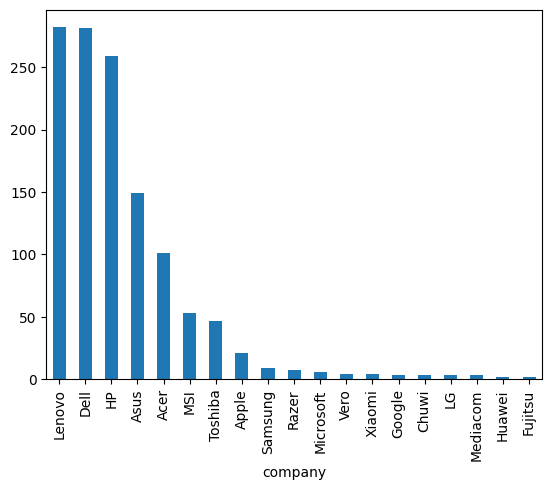

In [147]:
df['company'].value_counts().plot(kind = 'bar')

<Axes: xlabel='typename'>

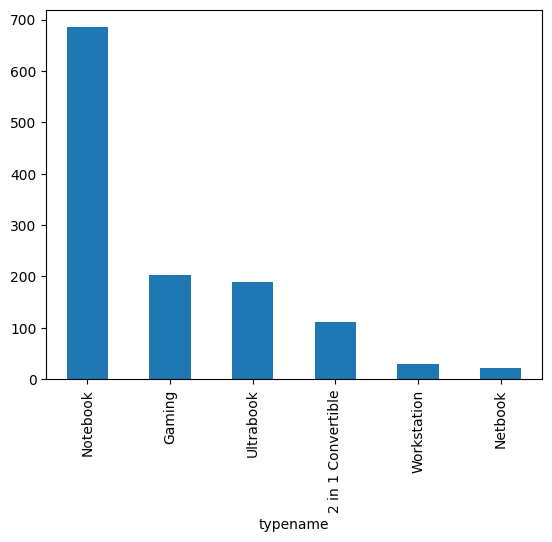

In [148]:

df['typename'].value_counts().plot(kind = 'bar')

<Axes: ylabel='count'>

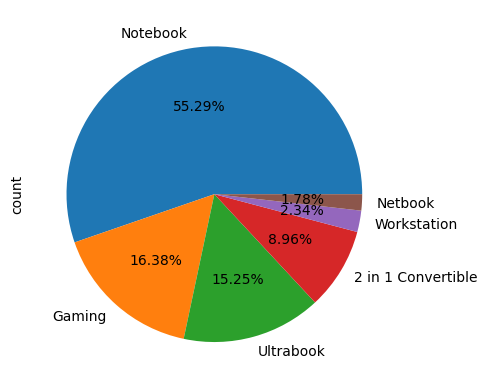

In [149]:
df['typename'].value_counts().plot(kind = 'pie', autopct = '%1.2f%%')

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


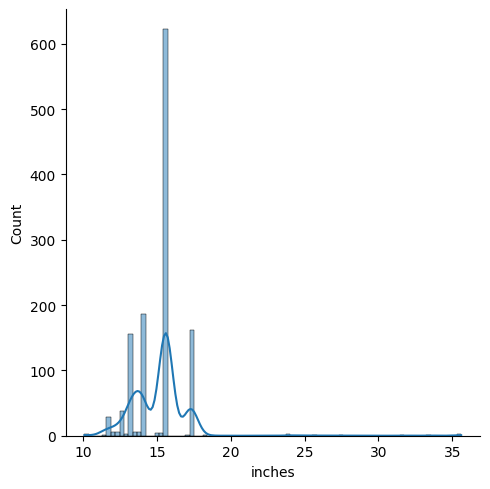

In [150]:
import seaborn as sns
import matplotlib.pyplot as plt  # دا مهم عشان الرسم يظهر

sns.displot(data=df, x='inches', kind='hist', kde=True)
plt.show()


In [151]:
df['inches'].skew()  # data is skewed.

4.078537669856716

<Axes: >

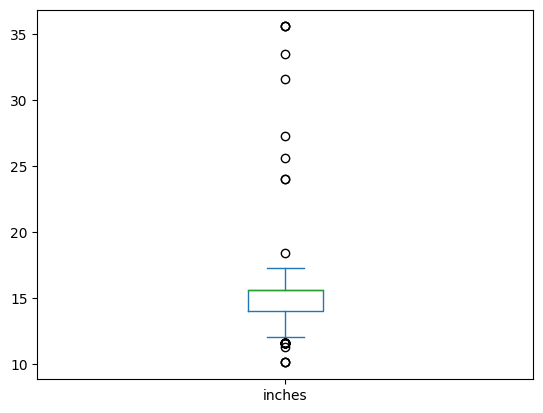

In [152]:
df['inches'].plot(kind = 'box')

In [153]:
# these values are not possible.
invalid_indexes_inches = df[df['inches'] > 18].index
df.loc[invalid_indexes_inches,'inches'] = np.NaN

<Axes: >

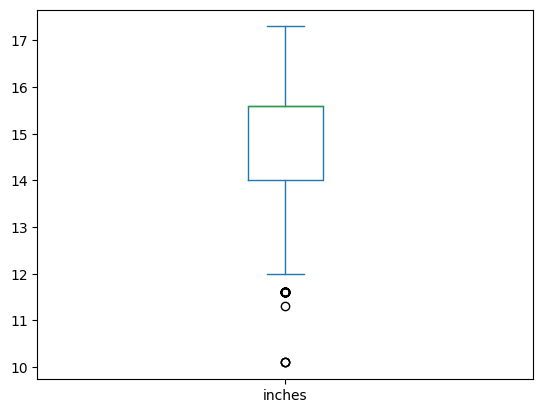

In [154]:
df['inches'].plot(kind = 'box') # these lower values are not real outliers as the laptops do come in these sizes.

In [155]:
df['inches'].isnull().sum()

10

<Axes: xlabel='ram'>

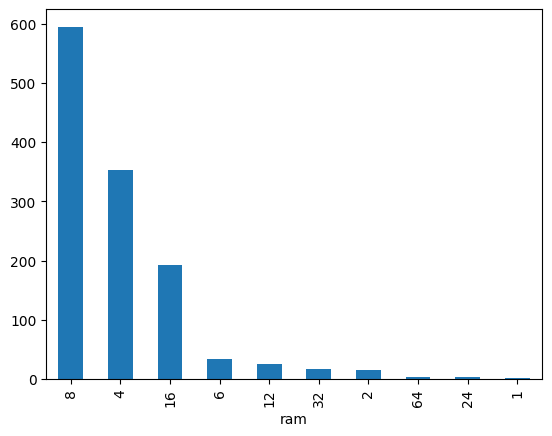

In [156]:
df['ram'].value_counts().plot(kind = 'bar')

<Axes: ylabel='count'>

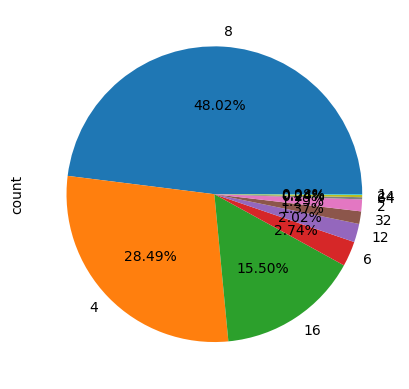

In [157]:
df['ram'].value_counts().plot(kind = 'pie', autopct = '%1.2f%%')

In [158]:
df[df['ram'] == 1] # not possible
df.loc[706,'ram'] = np.NaN

In [159]:
df[df['ram'] == 64] # this 64 gb is possible - for the specialised laptops.

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,display_is_touch_screen,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details
key_0,,,,,,,,,,,,,,,,,,,,,
71,Dell,Ultrabook,13.3,IPS Panel Full HD 1920x1080,64.0,Windows,1.4,50882.4000,1920,1080,...,False,Intel,1.8,AMD,256.0,0.0,1,0,0.0,Core i7 8550U
720,Lenovo,Ultrabook,14.0,IPS Panel Quad HD+ 2560x1440,64.0,Windows,1.17,89864.1792,2560,1440,...,False,Intel,2.5,Intel,512.0,0.0,1,0,0.0,Core i7 6500U
1066,Asus,Gaming,17.3,IPS Panel Full HD 1920x1080,64.0,Windows,3.58,211788.0000,1920,1080,...,False,Intel,2.7,Nvidia,1024.0,0.0,1,0,0.0,Core i7 6820HK


In [160]:
df[df['ram'] == 32] # specialised laptops.

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pan

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,display_is_touch_screen,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details
key_0,,,,,,,,,,,,,,,,,,,,,
177,MSI,Gaming,NaN,Full HD 1920x1080,32.0,Windows,4.4,149130.7200,1920,1080,...,False,Intel,2.9,Nvidia,512.0,1024.0,1,1,0.0,Core i7 6920HQ
196,Razer,Gaming,17.3,4K Ultra HD / Touchscreen 3840x2160,32.0,Windows,3.49,324954.7200,3840,2160,...,True,Intel,2.9,Nvidia,1024.0,0.0,1,0,0.0,Core i7 7820HK
238,Asus,Gaming,17.3,Full HD 1920x1080,32.0,Windows,4.7,207259.2000,1920,1080,...,False,Intel,2.9,Nvidia,512.0,1024.0,1,1,0.0,Core i7 7820HK
329,Dell,Notebook,15.6,4K Ultra HD / Touchscreen 3840x2160,32.0,Windows,2.06,140605.9200,3840,2160,...,True,Intel,2.8,Nvidia,1024.0,0.0,1,0,0.0,Core i7 7700HQ
491,Toshiba,Ultrabook,13.3,Full HD / Touchscreen 1920x1080,32.0,Windows,1.05,149130.7200,1920,1080,...,True,Intel,2.7,Intel,512.0,0.0,1,0,0.0,Core i7 7500U
577,Lenovo,Gaming,17.3,IPS Panel Full HD 1920x1080,32.0,Windows,4.6,141884.6400,1920,1080,...,False,Intel,2.7,Nvidia,256.0,1024.0,1,1,0.0,Core i7 6820HK
610,Lenovo,Notebook,15.6,IPS Panel 4K Ultra HD 3840x2160,32.0,Windows,2.5,261018.7200,3840,2160,...,False,Intel,3.1,Nvidia,1024.0,0.0,1,0,0.0,Xeon E3-1535M v6
650,Asus,Gaming,17.3,IPS Panel Full HD 1920x1080,32.0,Windows,3.8,149130.7200,1920,1080,...,False,Intel,2.7,Nvidia,512.0,0.0,1,0,0.0,Core i7 6820HK
659,Dell,Gaming,17.3,IPS Panel 4K Ultra HD 3840x2160,32.0,Windows,4.42,167691.8736,3840,2160,...,False,Intel,2.8,Nvidia,512.0,1024.0,1,1,0.0,Core i7 7700HQ


<Axes: xlabel='opsys'>

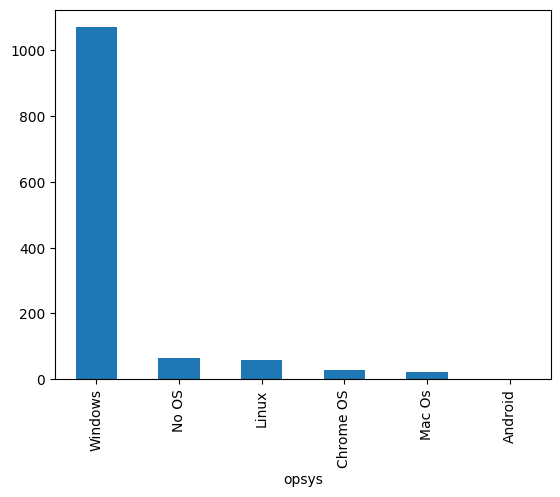

In [161]:
df['opsys'].value_counts().plot(kind = 'bar')

<Axes: ylabel='count'>

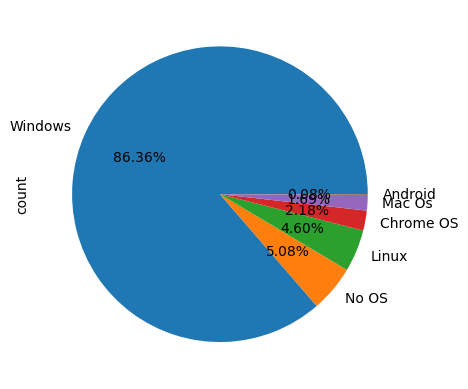

In [162]:
df['opsys'].value_counts().plot(kind = 'pie', autopct = '%1.2f%%')

In [163]:
df['opsys'].isnull().sum()

0

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


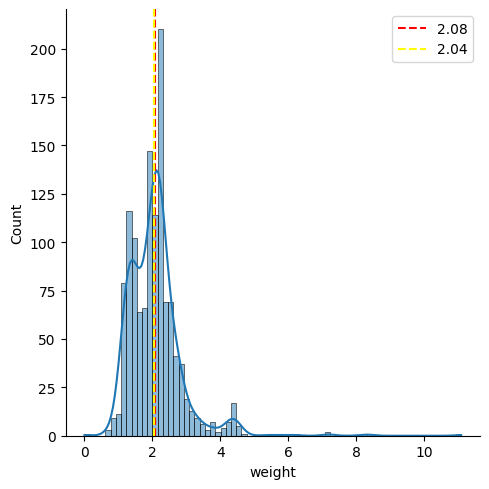

In [164]:
sns.displot(data = df,kind = 'hist', x = 'weight', kde = True)
plt.axvline(df['weight'].mean(), color = 'red', linestyle = 'dashed',label = np.round(df['weight'].mean(),2))
plt.axvline(df['weight'].median(), color = 'yellow', linestyle = 'dashed', label = np.round(df['weight'].median(),2))
plt.legend()
plt.show()

In [165]:
df['weight'].skew()  # skewed to right.

3.0250034960308807

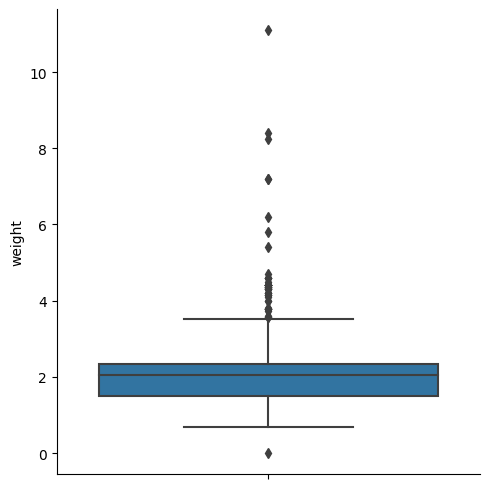

In [166]:
sns.catplot(data = df, kind = 'box', y = 'weight')

In [167]:
outlier_weight_index = df[df['weight'] > 5].index

In [168]:
df.loc[outlier_weight_index,'weight'] = np.NaN

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pan

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,display_is_touch_screen,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details
key_0,,,,,,,,,,,,,,,,,,,,,
177,MSI,Gaming,NaN,Full HD 1920x1080,32.0,Windows,4.4,149130.7200,1920,1080,...,False,Intel,2.9,Nvidia,512.0,1024.0,1,1,0.0,Core i7 6920HQ
224,Dell,Gaming,17.3,IPS Panel Full HD 1920x1080,16.0,Windows,4.42,130873.7952,1920,1080,...,False,Intel,2.8,Nvidia,256.0,1024.0,1,1,0.0,Core i7 7700HQ
238,Asus,Gaming,17.3,Full HD 1920x1080,32.0,Windows,4.7,207259.2000,1920,1080,...,False,Intel,2.9,Nvidia,512.0,1024.0,1,1,0.0,Core i7 7820HK
251,Asus,Gaming,17.3,Full HD 1920x1080,16.0,Windows,4.3,95850.7200,1920,1080,...,False,Intel,2.8,Nvidia,256.0,1024.0,1,1,0.0,Core i7 7700HQ
258,MSI,Gaming,17.3,Full HD 1920x1080,16.0,Windows,4.14,133146.7200,1920,1080,...,False,Intel,2.8,Nvidia,512.0,1024.0,1,1,0.0,Core i7 7700HQ
266,Asus,2 in 1 Convertible,13.3,Full HD / Touchscreen 1920x1080,8.0,Windows,4.1,79866.7200,1920,1080,...,True,Intel,1.8,Intel,512.0,0.0,2,0,0.0,Core i7 8550U
424,Dell,Gaming,NaN,IPS Panel 2560x1440,16.0,Windows,4.42,149130.7200,2560,1440,...,False,Intel,2.9,Nvidia,256.0,1024.0,1,1,0.0,Core i7 7820HK
456,Dell,Notebook,17.3,IPS Panel Full HD 1920x1080,8.0,Windows,4.42,109010.8800,1920,1080,...,False,Intel,2.7,Nvidia,0.0,1024.0,0,1,0.0,Core i7 7700HQ
494,Asus,Gaming,17.3,IPS Panel Full HD / Touchscreen 1920x1080,24.0,Windows,4.33,67612.3200,1920,1080,...,True,Intel,2.6,Nvidia,256.0,1024.0,1,1,0.0,Core i7 6700HQ


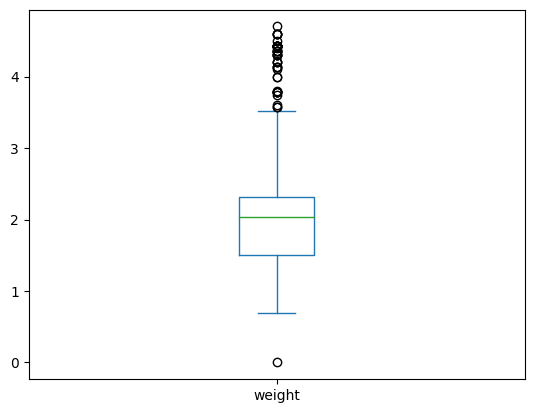

In [169]:
df['weight'].plot(kind = 'box')
df[df['weight'] > 4]  # justified as all are gaming laptops.

In [170]:
df[df['weight'] < 1]
df.loc[349,'weight'] = np.NaN  # was 0.0002 kg - not possible

In [171]:
df[df['weight'] < 1]

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,display_is_touch_screen,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details
key_0,,,,,,,,,,,,,,,,,,,,,
14,Apple,Ultrabook,12.0,IPS Panel Retina Display 2304x1440,8.0,Mac Os,0.92,67260.6720,2304,1440,...,False,Intel,1.20,Intel,256.0,0.0,1,0,0.0,Core M m3
81,Apple,Ultrabook,12.0,IPS Panel Retina Display 2304x1440,8.0,Mac Os,0.92,80452.8000,2304,1440,...,False,Intel,1.30,Intel,512.0,0.0,1,0,0.0,Core i5
146,HP,Ultrabook,12.5,IPS Panel 4K Ultra HD / Touchscreen 3840x2160,8.0,Windows,0.97,107305.9200,3840,2160,...,True,Intel,1.20,Intel,512.0,0.0,1,0,0.0,Core M 6Y75
489,Asus,Ultrabook,12.5,Full HD 1920x1080,16.0,Windows,0.91,103896.0000,1920,1080,...,False,Intel,2.70,Intel,512.0,0.0,1,0,0.0,Core i7 7500U
746,Samsung,Ultrabook,13.3,Full HD 1920x1080,16.0,Windows,0.81,87858.7200,1920,1080,...,False,Intel,2.70,Intel,256.0,0.0,1,0,0.0,Core i7 7500U
794,Apple,Ultrabook,12.0,IPS Panel Retina Display 2304x1440,8.0,Mac Os,0.92,62071.2000,2304,1440,...,False,Intel,1.20,Intel,512.0,0.0,1,0,0.0,Core M
812,Samsung,Ultrabook,13.3,Full HD 1920x1080,8.0,Windows,0.81,79866.7200,1920,1080,...,False,Intel,2.50,Intel,256.0,0.0,1,0,0.0,Core i5 7200U
909,LG,Ultrabook,14.0,IPS Panel Full HD / Touchscreen 1920x1080,8.0,Windows,0.98,101178.7200,1920,1080,...,True,Intel,2.70,Intel,512.0,0.0,1,0,0.0,Core i7 7500U
990,HP,Netbook,12.5,Full HD 1920x1080,8.0,Windows,0.97,101658.2400,1920,1080,...,False,Intel,1.20,Intel,512.0,0.0,1,0,0.0,Core M 6Y75


In [172]:
# these 2 in one convertible - are very old models and can be used as laptops and tablets.

<Axes: >

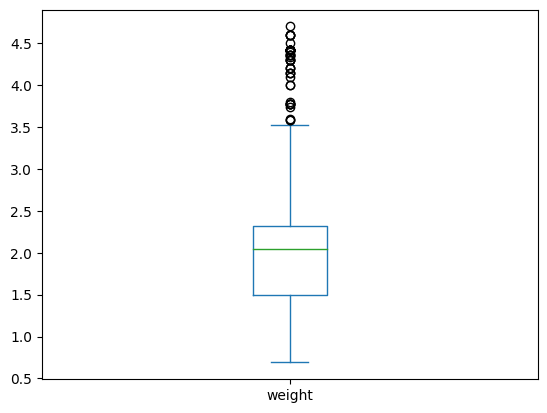

In [173]:
df['weight'].plot(kind = 'box')  # rest of these outliers are valid.

In [174]:
df['weight'].describe()

count     1230.0
unique     172.0
top          2.2
freq       109.0
Name: weight, dtype: float64

In [175]:
df['weight'].isnull().sum()

9

In [176]:
df['price'].describe()

count      1239.000000
mean      60784.792887
std       37393.505426
min        9270.720000
25%       32793.840000
50%       52747.200000
75%       79840.080000
max      324954.720000
Name: price, dtype: float64

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


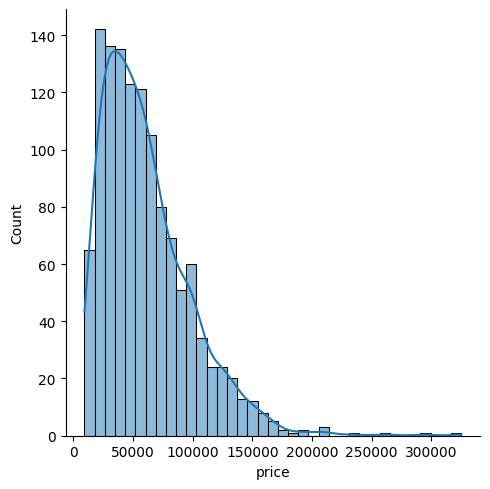

In [177]:
sns.displot(data = df, kind = 'hist', kde = True, x = 'price')

In [178]:
df['price'].skew()

1.5223465047444706

<Axes: >

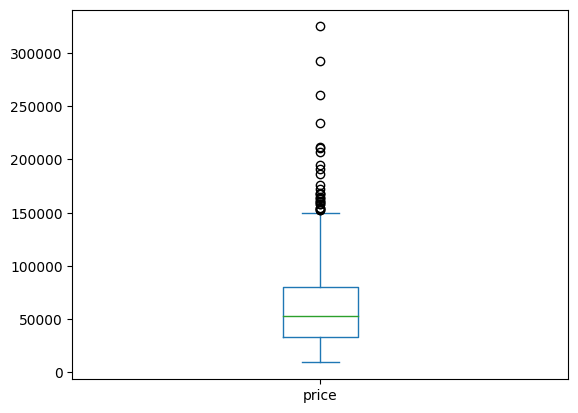

In [179]:
df['price'].plot(kind = 'box')

In [180]:
# the dataset is 0ld and the specs are top notch - for 2017. so justified price.
df[df['price'] > 200000]

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,display_is_touch_screen,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details
key_0,,,,,,,,,,,,,,,,,,,,,
196,Razer,Gaming,17.3,4K Ultra HD / Touchscreen 3840x2160,32.0,Windows,3.49,324954.720,3840,2160,...,True,Intel,2.9,Nvidia,1024.0,0.0,1,0,0.0,Core i7 7820HK
238,Asus,Gaming,17.3,Full HD 1920x1080,32.0,Windows,4.7,207259.200,1920,1080,...,False,Intel,2.9,Nvidia,512.0,1024.0,1,1,0.0,Core i7 7820HK
610,Lenovo,Notebook,15.6,IPS Panel 4K Ultra HD 3840x2160,32.0,Windows,2.5,261018.720,3840,2160,...,False,Intel,3.1,Nvidia,1024.0,0.0,1,0,0.0,Xeon E3-1535M v6
749,HP,Workstation,17.3,IPS Panel Full HD 1920x1080,16.0,Windows,3.0,233845.920,1920,1080,...,False,Intel,2.9,Nvidia,256.0,0.0,1,0,0.0,Xeon E3-1535M v5
830,Razer,Gaming,17.3,4K Ultra HD / Touchscreen 3840x2160,32.0,Windows,3.49,292986.720,3840,2160,...,True,Intel,2.9,Nvidia,512.0,0.0,1,0,0.0,Core i7 7820HK
1066,Asus,Gaming,17.3,IPS Panel Full HD 1920x1080,64.0,Windows,3.58,211788.000,1920,1080,...,False,Intel,2.7,Nvidia,1024.0,0.0,1,0,0.0,Core i7 6820HK
1136,HP,Workstation,17.3,IPS Panel Full HD 1920x1080,8.0,Windows,3.0,210424.032,1920,1080,...,False,Intel,2.6,Nvidia,256.0,0.0,1,0,0.0,Core i7 6700HQ


In [181]:
df['price'].isnull().sum()

0

<Axes: xlabel='px_width'>

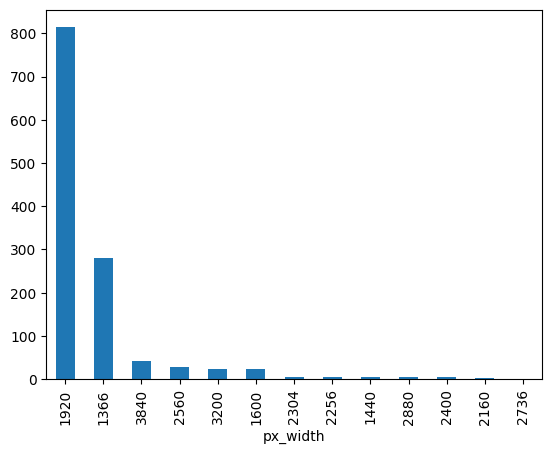

In [182]:
df['px_width'].value_counts().plot(kind = 'bar')

<Axes: ylabel='count'>

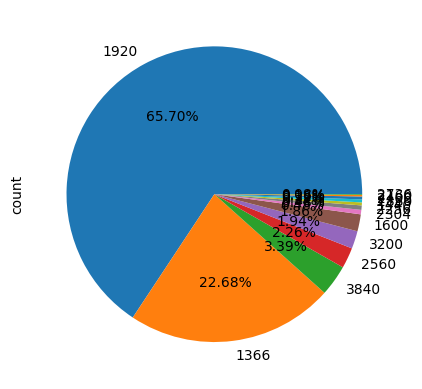

In [183]:
df['px_width'].value_counts().plot(kind = 'pie', autopct = '%1.2f%%')

In [184]:
df['px_width'].isnull().sum()

0

In [185]:
df['px_height'].isnull().sum()

0

<Axes: xlabel='px_height'>

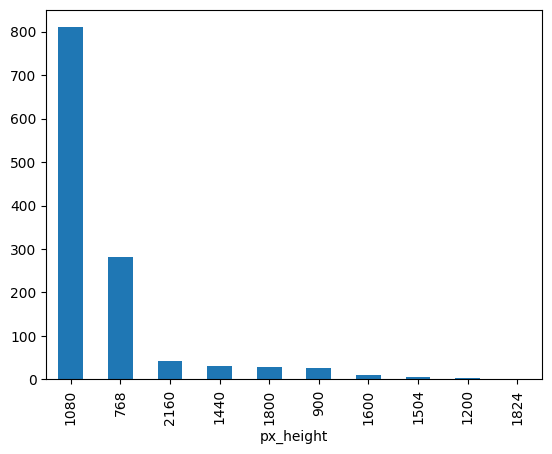

In [186]:
df['px_height'].value_counts().plot(kind = 'bar')

<Axes: ylabel='count'>

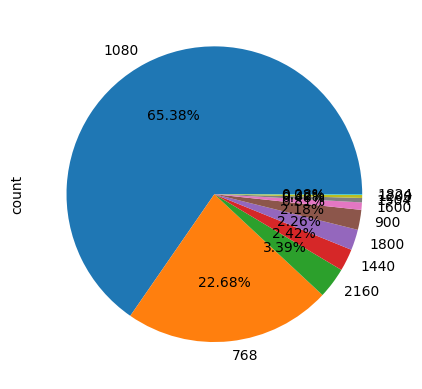

In [187]:
df['px_height'].value_counts().plot(kind = 'pie', autopct = '%1.2f%%')

<Axes: xlabel='display_ips_panel'>

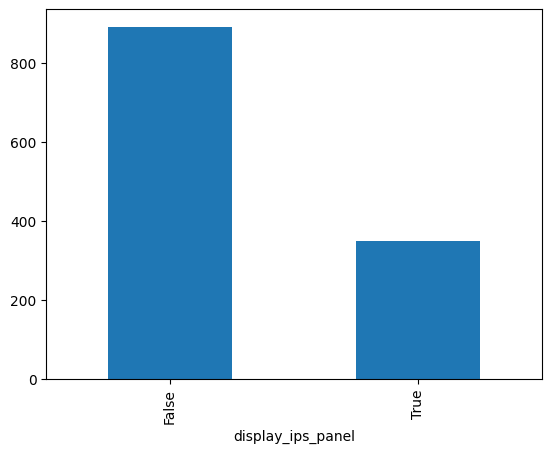

In [188]:
df['display_ips_panel'].value_counts().plot(kind = 'bar')

<Axes: ylabel='count'>

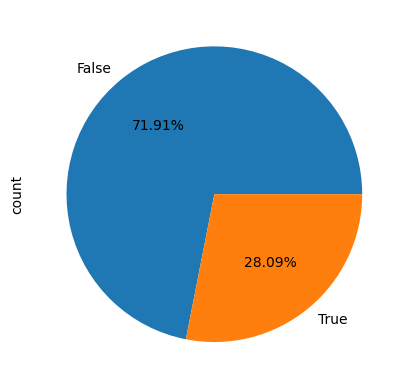

In [189]:
df['display_ips_panel'].value_counts().plot(kind = 'pie', autopct = '%1.2f%%')

In [190]:
df['display_ips_panel'].isnull().sum()

0

In [191]:
df['display_is_touch_screen'].isnull().sum()

0

<Axes: xlabel='display_is_touch_screen'>

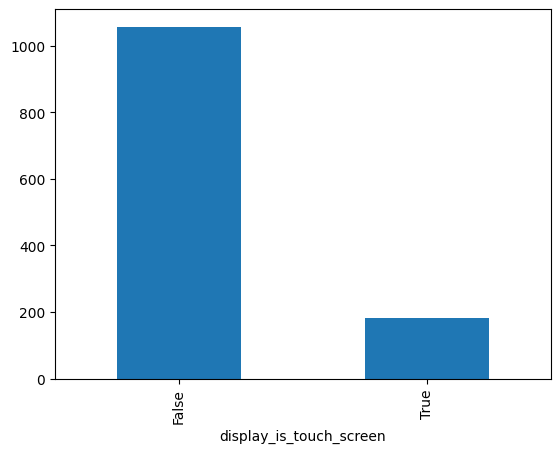

In [192]:
df['display_is_touch_screen'].value_counts().plot(kind = 'bar')

<Axes: ylabel='count'>

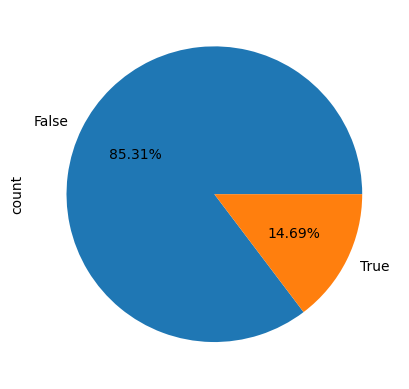

In [193]:
df['display_is_touch_screen'].value_counts().plot(kind = 'pie', autopct = '%1.2f%%')

In [194]:
df['cpu_brand'].isnull().sum()

0

In [195]:
df['hdd_capacity'].value_counts(

)

hdd_capacity
0.0       682
1024.0    400
500.0     123
2048.0     31
32.0        1
128.0       1
508.0       1
Name: count, dtype: int64

In [196]:
# this 500 and 508 means 512gb - total and out of which 500 and 508 gb are usable.
df['hdd_capacity'] = df['hdd_capacity'].replace(
    [508,500],512)

<ipython-input-196-0af59712c6de>:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['hdd_capacity'] = df['hdd_capacity'].replace(


In [197]:
def categorical_plotter(df,col):
    fig = plt.figure(figsize = (12,6))
    ax1 = fig.add_subplot(1,2,1)
    df[col].value_counts().plot(kind = 'bar', ax = ax1)
    ax1.set_title(f'Freq Plot of {col}')
    ax1.set_xlabel(col)
    ax1.set_ylabel('Freq')

    ax2 = fig.add_subplot(1,2,2)
    df[col].value_counts().plot(kind = 'pie', ax = ax2, autopct = '%1.2f%%')
    ax2.set_title(f'Pie Chart of {col}')
    ax2.set_xlabel(col)

    plt.tight_layout()
    plt.show()

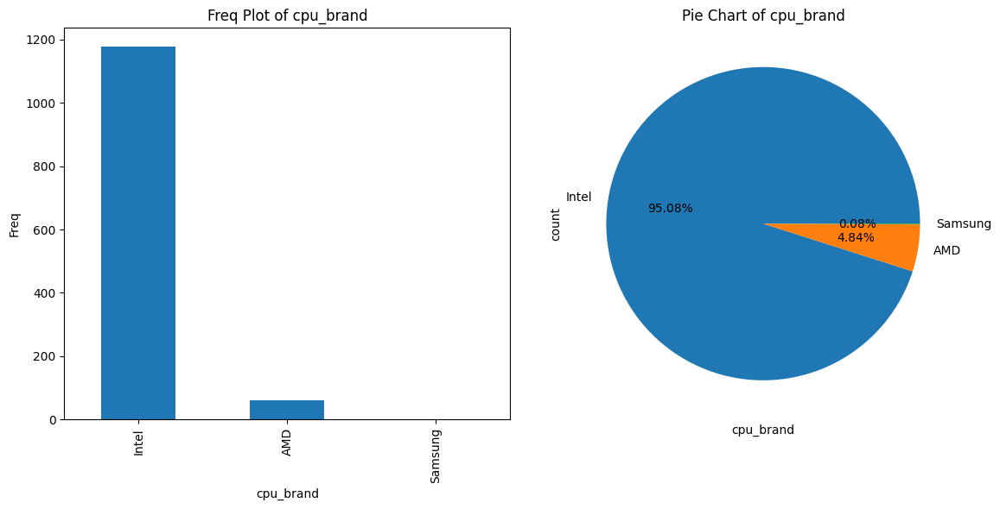

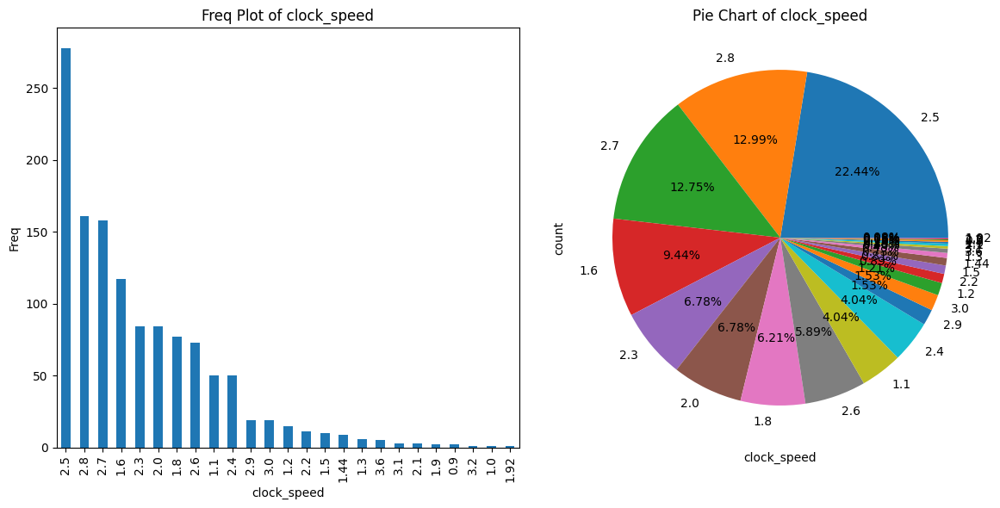

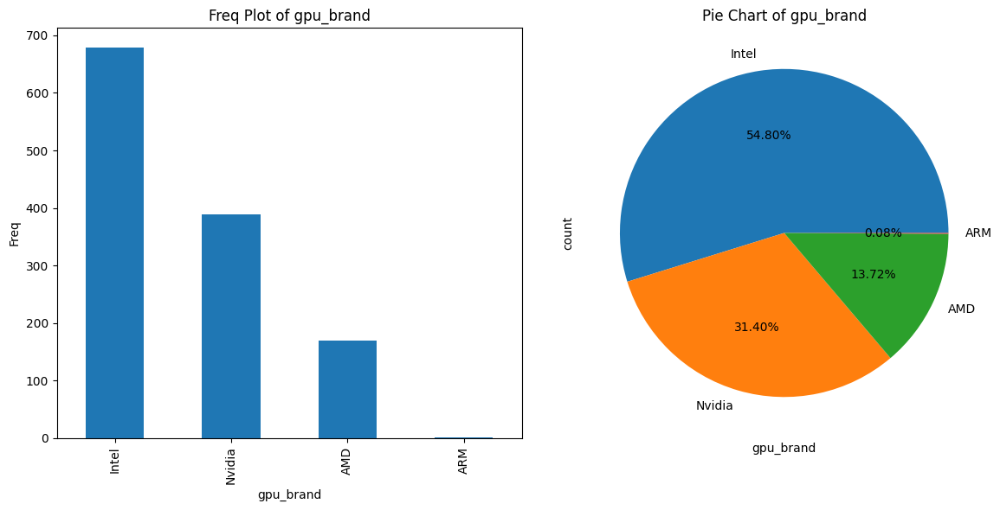

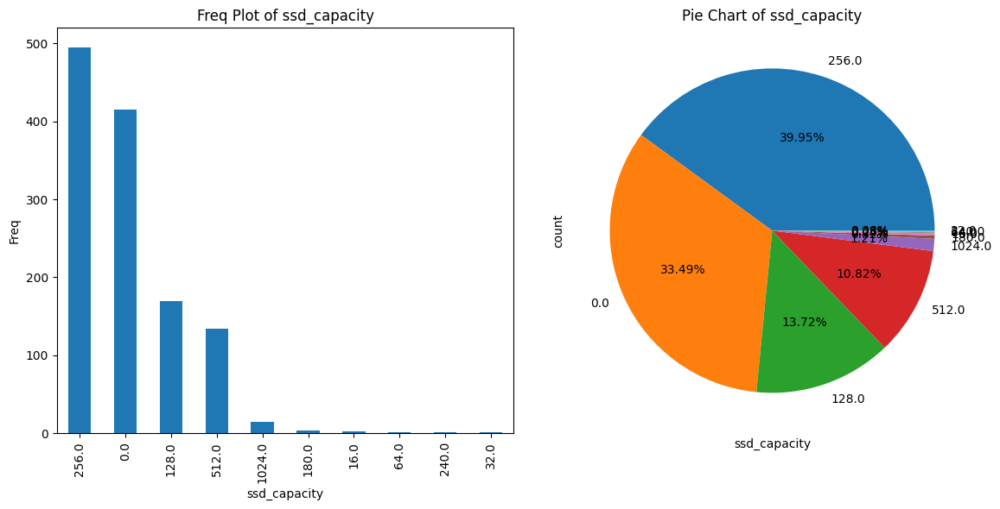

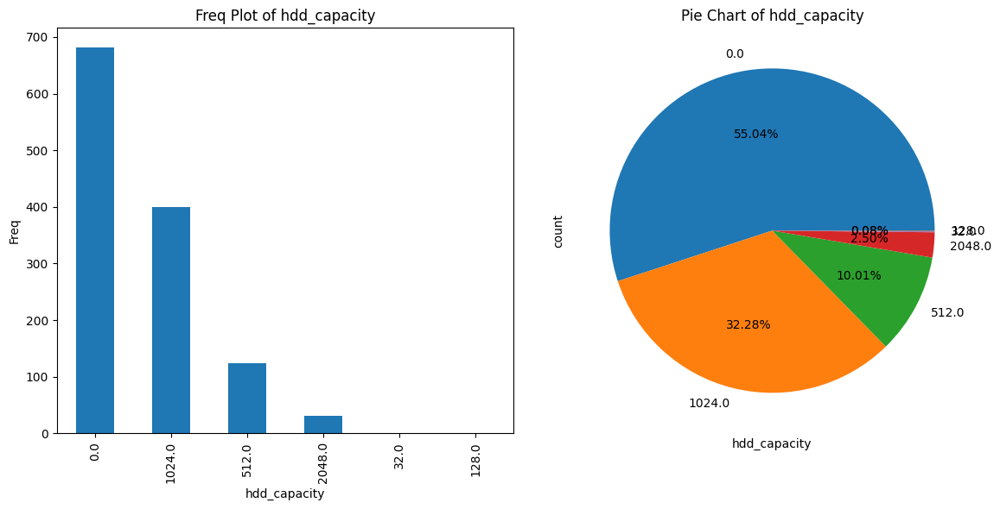

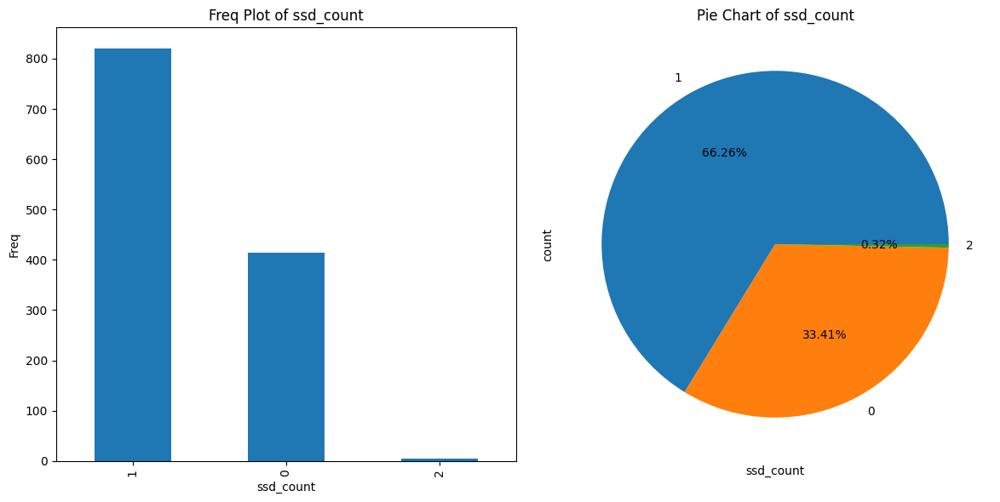

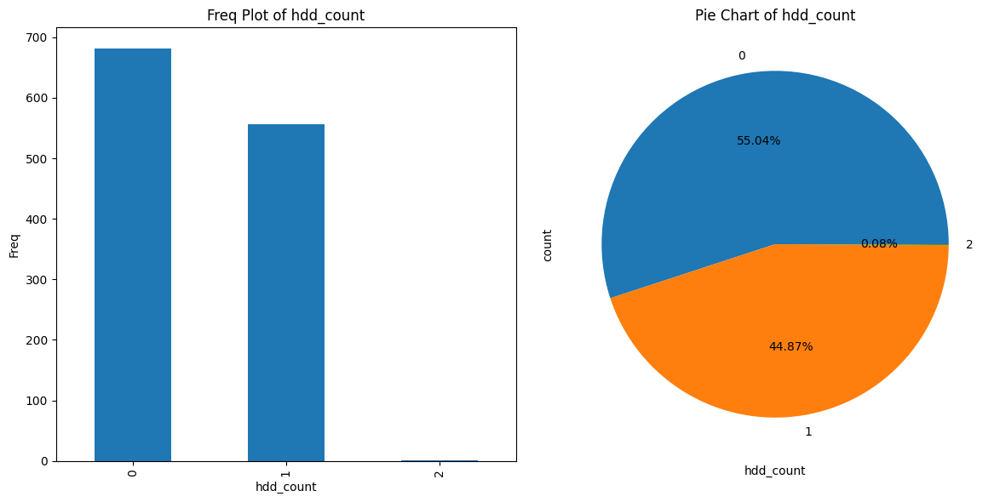

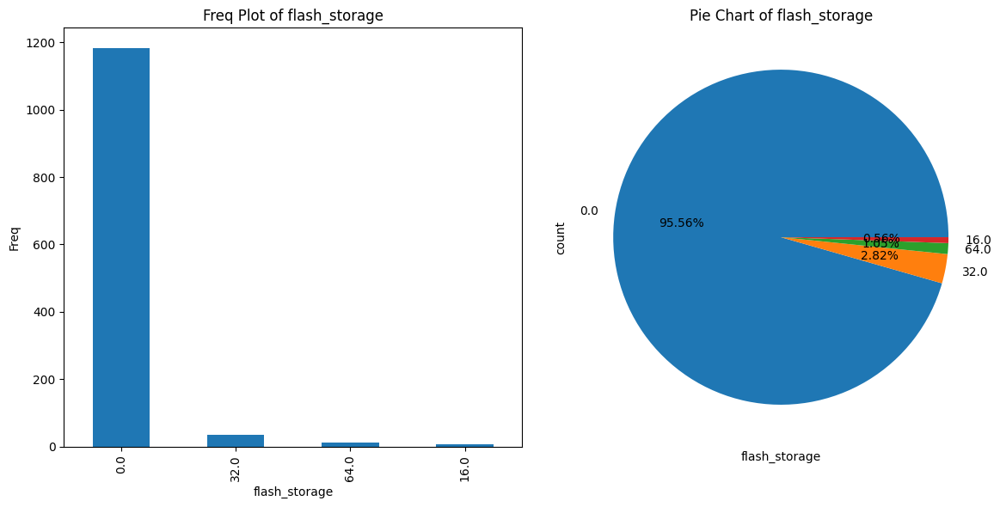

In [198]:
rem_categorical_columns = ['cpu_brand', 'clock_speed', 'gpu_brand','ssd_capacity', 'hdd_capacity', 'ssd_count', 'hdd_count','flash_storage']
for i in rem_categorical_columns:
    categorical_plotter(df,i)

In [199]:
# none of them have null values in them.
for i in rem_categorical_columns:
    print(i,df[i].isnull().sum())

cpu_brand 0
clock_speed 0
gpu_brand 0
ssd_capacity 0
hdd_capacity 0
ssd_count 0
hdd_count 0
flash_storage 0


<Axes: ylabel='Frequency'>

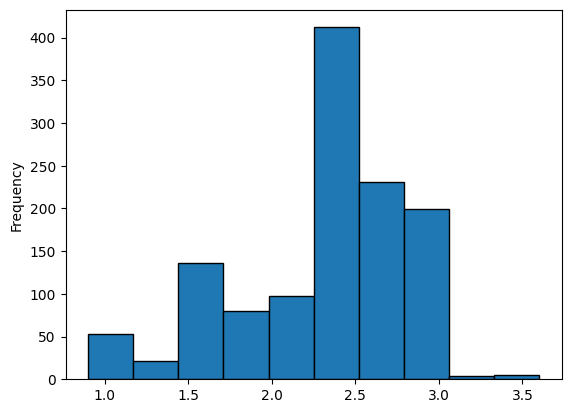

In [200]:
df['clock_speed'].plot(kind = 'hist', edgecolor = 'black')

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,display_is_touch_screen,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details
key_0,,,,,,,,,,,,,,,,,,,,,
697,Asus,2 in 1 Convertible,12.5,Full HD / Touchscreen 1920x1080,4.0,Chrome OS,1.2,35644.32,1920,1080,...,True,Intel,0.9,Intel,0.0,0.0,0,0,64.0,Core M M3-6Y30
1261,Asus,Ultrabook,13.3,IPS Panel Full HD 1920x1080,8.0,Windows,1.2,38841.12,1920,1080,...,False,Intel,0.9,Intel,512.0,0.0,1,0,0.0,Core M 6Y30


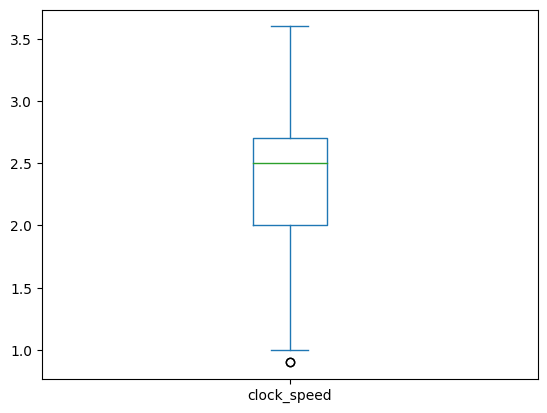

In [201]:
df['clock_speed'].plot(kind = 'box')
df[df['clock_speed'] < 1]  # valid.

In [202]:
df.columns

Index(['company', 'typename', 'inches', 'screenresolution', 'ram', 'opsys',
       'weight', 'price', 'px_width', 'px_height', 'display_ips_panel',
       'display_is_touch_screen', 'cpu_brand', 'clock_speed', 'gpu_brand',
       'ssd_capacity', 'hdd_capacity', 'ssd_count', 'hdd_count',
       'flash_storage', 'cpu_details'],
      dtype='object')

In [203]:
# Bivariate analysis.
# main colum = price.

<Axes: >

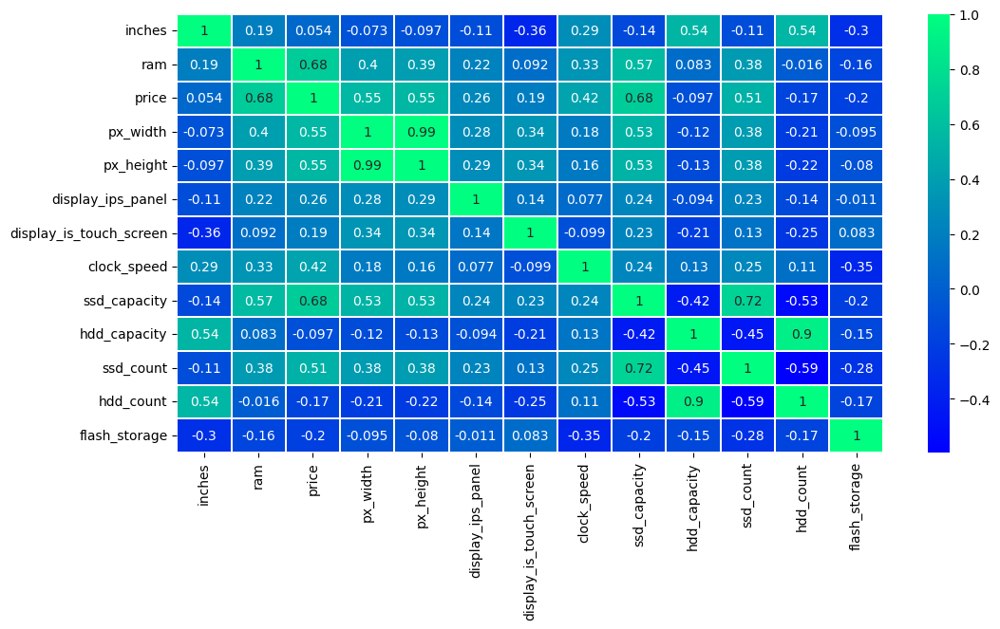

In [204]:
plt.figure(figsize = (12,6))
sns.heatmap(df.select_dtypes(include = [np.float64,np.int64,bool]).corr(),cmap = 'winter', annot = True, linewidth = 0.1)

In [205]:
df.select_dtypes(include = [np.float64,np.int64,bool]).corr()['price']

inches                     0.054461
ram                        0.681182
price                      1.000000
px_width                   0.553897
px_height                  0.550083
display_ips_panel          0.257585
display_is_touch_screen    0.186600
clock_speed                0.422046
ssd_capacity               0.676851
hdd_capacity              -0.096546
ssd_count                  0.513941
hdd_count                 -0.168153
flash_storage             -0.200529
Name: price, dtype: float64

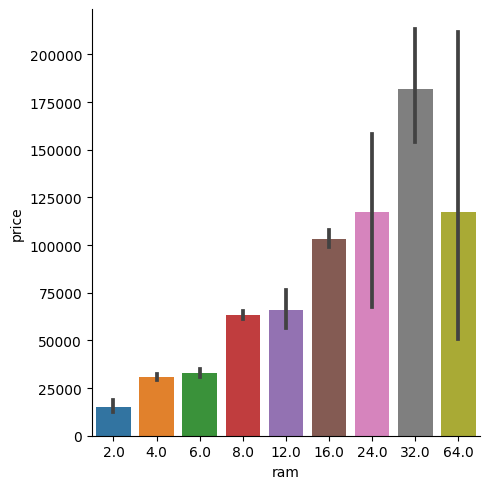

In [206]:
# numerical - categorical
# price - ram.
sns.catplot(kind = 'bar', data = df, x = 'ram', y = 'price', estimator = 'mean')
# visual trend shows that the price and ram are definetly related.

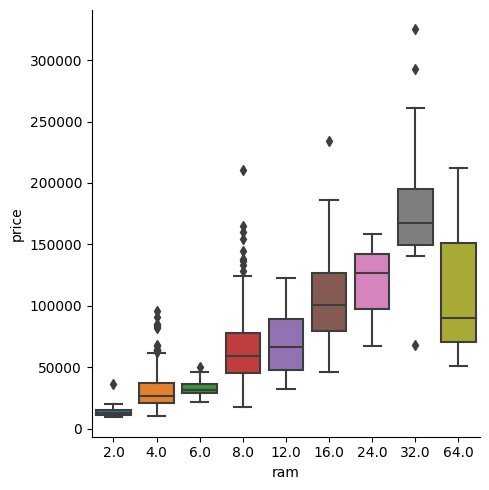

In [207]:
sns.catplot(kind = 'box', data = df, x = 'ram', y = 'price')
# for the lower ram - the price doesnt vary a lot
# but as the ram increases the price also varies(iqr increasing) - and also median price is increasing.
# so price also affected by some other factors.

<Axes: xlabel='inches', ylabel='price'>

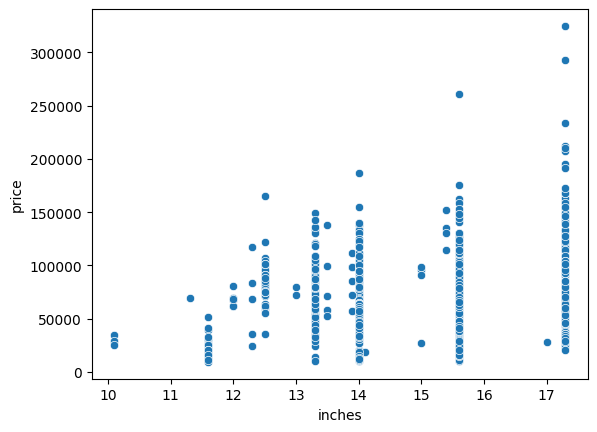

In [208]:
# price vs inches.
# numerical vs categorical/numerical
sns.scatterplot(data = df, x = 'inches', y = 'price')  
# cant conclude much as the price varies a lot at the same screen size.
# and the corr is also 0.05 - low.

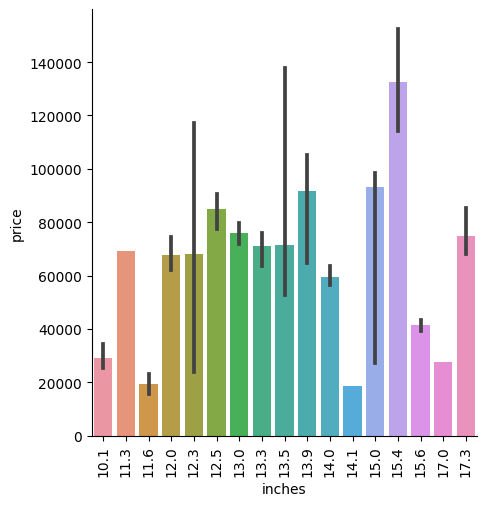

In [209]:
sns.catplot(data = df, x = 'inches', y = 'price', estimator = 'median', kind = 'bar')
plt.xticks(rotation = 90)
plt.show()
# no clear conclusion.

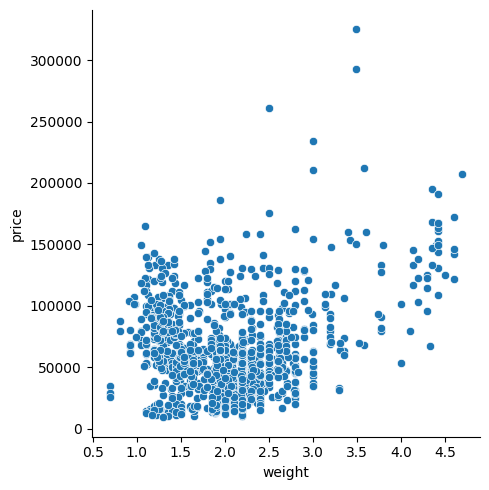

In [210]:
# price and weight.  -- corr = 0.214
# numerical and numerical.
df['weight'].nunique() # 172
sns.relplot(data = df,x = 'weight', y = 'price', kind = 'scatter')  # slight positive correlation

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


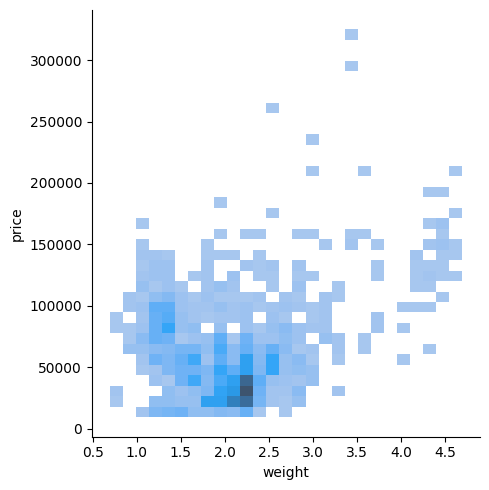

In [211]:
sns.displot(data = df, kind = 'hist', x = 'weight', y = 'price')

0.5538970644654984


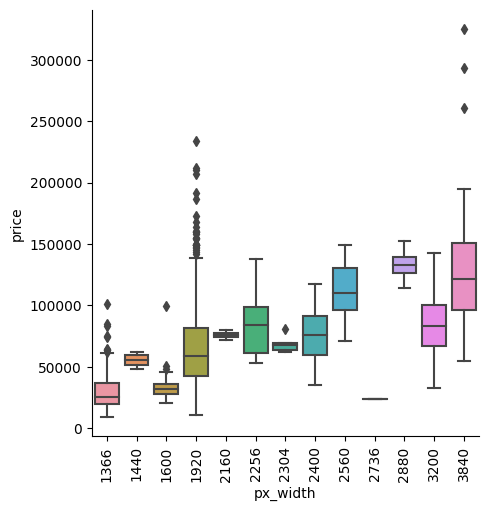

In [212]:
# price and px_width  -- corr = 0.55
print(df['price'].corr(df['px_width']))
# numerical and categorical
sns.catplot(data = df, kind = 'box',x = 'px_width', y = 'price')
plt.xticks(rotation = 90)
plt.show()
# overall trend is increaing median price as px_width increases.
# but there is variability in price at 1920 and 3840 value of px_width.

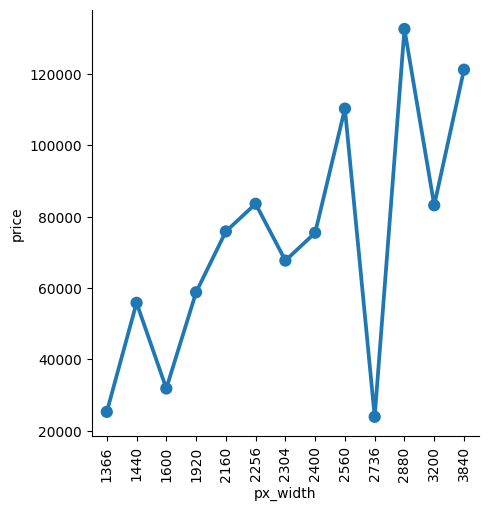

In [213]:
sns.catplot(data = df, kind ='point',x = 'px_width', y = 'price', estimator = 'median', errorbar = None)
plt.xticks(rotation = 90)
plt.show()
# in general increasing trend.

0.5500831353630918


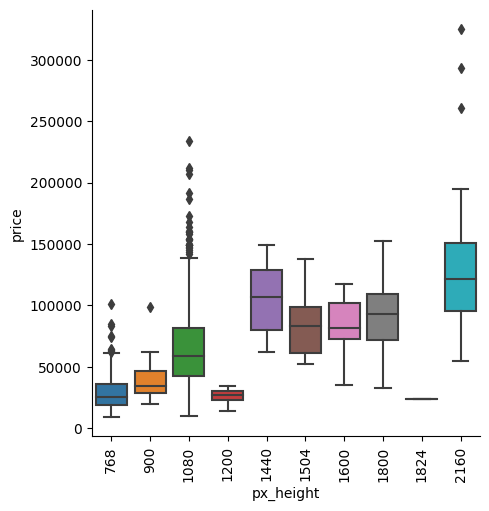

In [214]:
# price vs px_height.
# numerical and categorical
print(df['price'].corr(df['px_height']))
sns.catplot(data = df, kind = 'box',x = 'px_height', y = 'price')
plt.xticks(rotation = 90)
plt.show()

# corr of 0.55 - slight positive correlation.
# at common resolution of 1080 - price varies a lot - present in both high and low end devices.

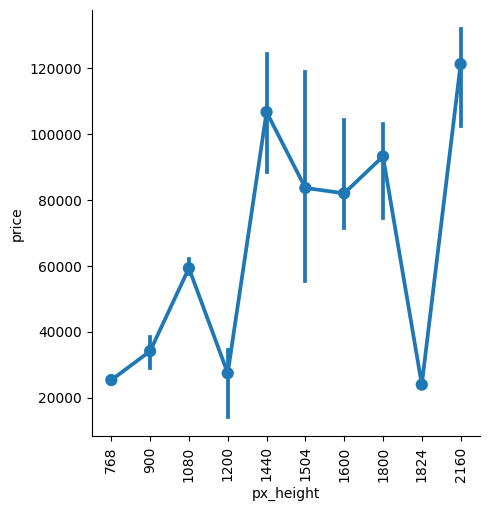

In [215]:
sns.catplot(data = df, kind = 'point',x = 'px_height', y = 'price', estimator = 'median')
plt.xticks(rotation = 90)
plt.show()

In [216]:
df['ppi_whole'] = np.round(((df['px_width']**2 + df['px_height']**2)**0.5) / df['inches'])

In [217]:
# df = df.drop(columns = 'ppi')

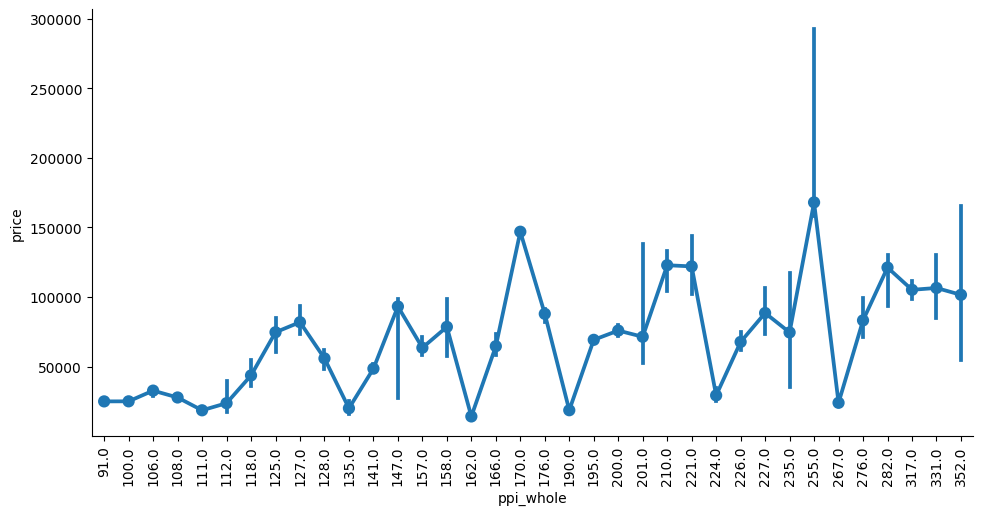

In [218]:
df['ppi_whole'].corr(df['price'])
sns.catplot(data = df, kind = 'point', x = 'ppi_whole', y = 'price', height = 5,aspect = 2, estimator = 'median')
plt.xticks(rotation = 90)
plt.show()
# as the ppi increase the price tends to increase slightly.
# price varies a lot at ppi 127 and 255 - means present for both the low end and higher end devices.

0.2575852279561478


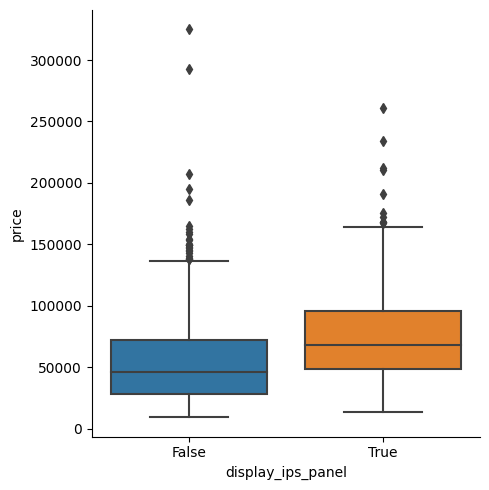

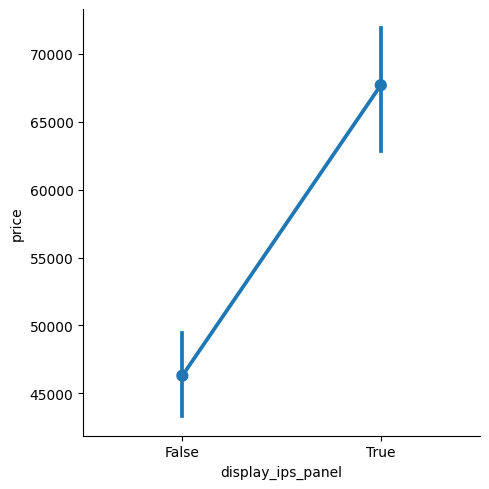

In [219]:
# price vs display_ips_panel
# numerical vs categorical
print(df['display_ips_panel'].corr(df['price'])) # 0.257
sns.catplot(data = df, x = 'display_ips_panel', y = 'price', kind = 'box')
sns.catplot(data = df, x = 'display_ips_panel', y = 'price', kind = 'point', estimator = 'median')
# the median price for the device with the ips panel display is only slightly higher.

In [220]:
df[df['display_ips_panel'] == True]['price'].median() - df[df['display_ips_panel'] == False]['price'].median()
# median price difference is of 20000.

21391.387200000005

0.1865997441445289


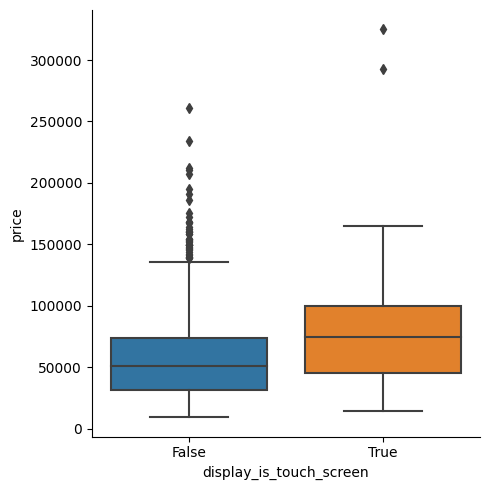

In [221]:
# price vs display_is_touch_screen: 
#numerical vs categorical column.
print(df['display_is_touch_screen'].corr(df['price'])) # low +ve correlation.

sns.catplot(data = df, x = 'display_is_touch_screen', y = 'price', kind = 'box')
# the median price for the devices with the touch screen is higher but for the devices with no touch screen the price fluctuates a lot.
# means lots of higher priced devices doesnt have touch screen.

0.4220456733227343


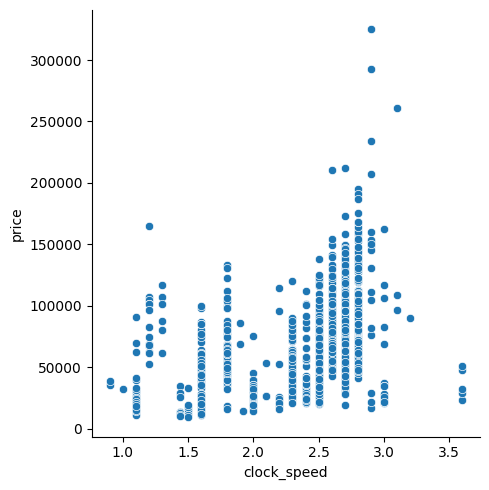

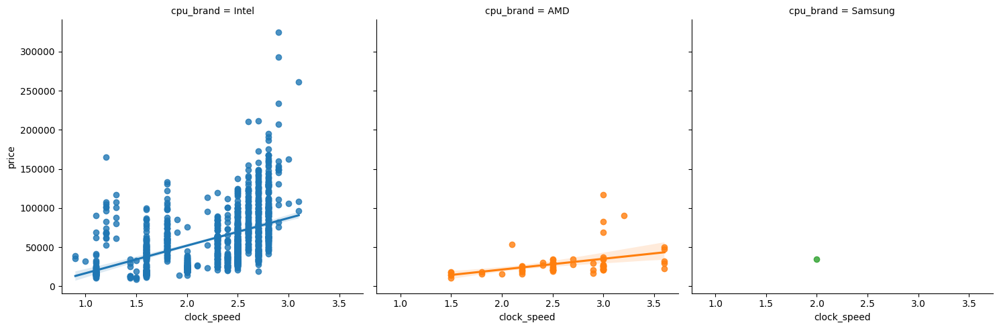

In [222]:
# price vs clock_speed 
# numerical vs numerical column
print(df['price'].corr(df['clock_speed'])) # corr - 0.422 -- +ve correlation.
sns.relplot(data = df, x = 'clock_speed',y = 'price', kind = 'scatter')
# generally the price tends to increase but - even at same clock_speed the price tends to fluctuate.
sns.lmplot(data = df,x = 'clock_speed', y = 'price', hue = 'cpu_brand',col = 'cpu_brand', col_wrap = 3) # regression plot.
# the price increases for every brand cpu as the clock speed increases.

In [223]:
df.loc[911,'ssd_capacity'] = 256

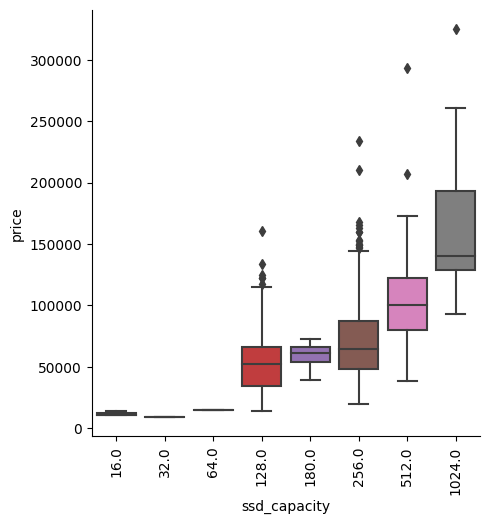

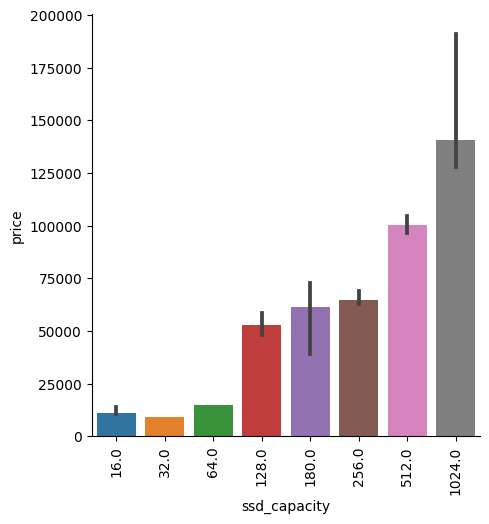

0.5440459108551785


In [224]:
# price vs ssd_capacity
# numerical vs categorical
temp_df = df[['price','ssd_capacity']].copy()
temp_df['ssd_capacity'] = temp_df['ssd_capacity'].replace(0,np.NaN)
sns.catplot(data = temp_df, x = 'ssd_capacity', y = 'price', kind = 'box')
plt.xticks(rotation = 90)

sns.catplot(data = temp_df, x = 'ssd_capacity', y = 'price', kind = 'bar', estimator = 'median')
plt.xticks(rotation = 90)
plt.show()
print(temp_df['price'].corr(temp_df['ssd_capacity']))
# as the ssd_capacity increases median price increases.
# the lower ssd capacity - devices are very few in data and in the lower price range.
# the most popular ssd is 256gb - and present in both the lower priced and higher priced devices.

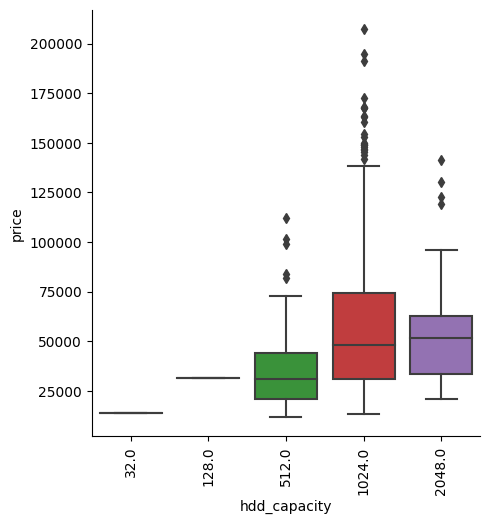

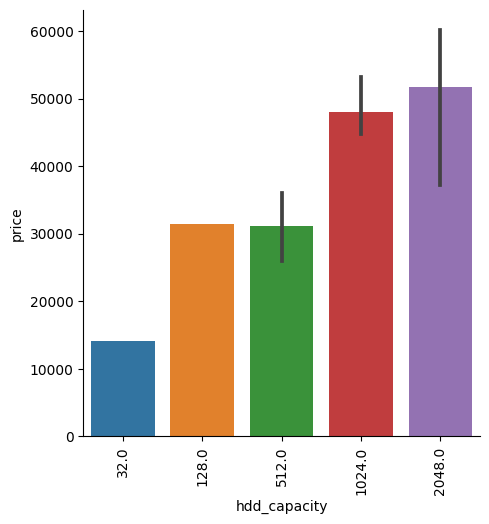

0.199352300085724


In [225]:
# price vs hdd_capacity
# numerical and categorical

# just ignore when hdd_capacity = 0.  -- because there mostly ssd is present so price will be higher - as +ve correlation.

temp_df_2 = pd.DataFrame(df[['price','hdd_capacity']])
temp_df_2['hdd_capacity'] = temp_df_2['hdd_capacity'].replace(0,np.NaN)
sns.catplot(data = temp_df_2, x = 'hdd_capacity', y = 'price', kind = 'box')
plt.xticks(rotation = 90)

sns.catplot(data = temp_df_2, x = 'hdd_capacity', y = 'price', kind = 'bar', estimator = 'median')
plt.xticks(rotation = 90)
plt.show()
print(temp_df_2['price'].corr(temp_df_2['hdd_capacity']))

0.5139405981991125

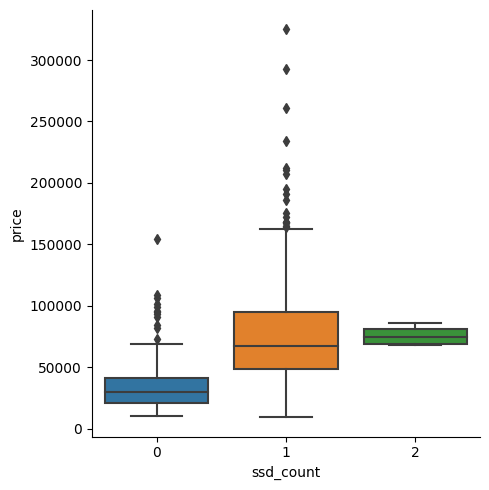

In [226]:
# price vs ssd_count
# numerical vs categorical.
sns.catplot(data = df, x = 'ssd_count', y = 'price', kind = 'box')
df['ssd_count'].corr(df['price'])
# at 1 ssd count price varies - lot of higher priced devices have a single ssd.
# and lower priced devices also have 1 ssd.


-0.02477801291940662

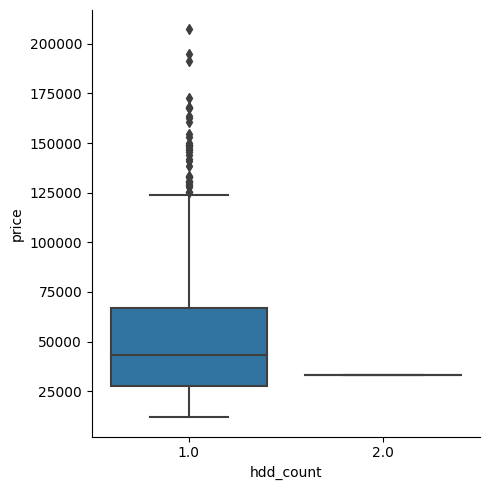

In [227]:
# price vs hdd_count
# numerical vs categorical.
temp_df_3 = df[['hdd_count','price']].copy()
temp_df_3['hdd_count'] = temp_df_3['hdd_count'].replace(0,np.NaN)
sns.catplot(data = temp_df_3, x = 'hdd_count', y = 'price', kind = 'box')
temp_df_3['hdd_count'].corr(temp_df_3['price'])

# only single device of hdd_count2 is present and price is lesser than the median price for hdd_count = 1.
# HDD_COUNT = 1 has lot of price fluctuation = present in both the low priced and higher price devices.

In [228]:
df[df['hdd_count'] == 2]

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,cpu_brand,clock_speed,gpu_brand,ssd_capacity,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details,ppi_whole
key_0,,,,,,,,,,,,,,,,,,,,,
703,Lenovo,Notebook,15.6,Full HD 1920x1080,4.0,Windows,2.1,33110.856,1920,1080,...,Intel,2.5,Intel,0.0,1024.0,0,2,0.0,Core i5 7200U,141.0


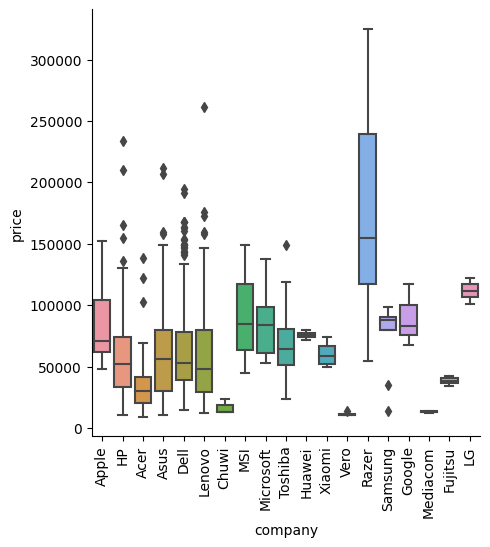

In [229]:
# price vs company.
# numerical vs categorical values.
sns.catplot(data = df, x = 'company', y = 'price', kind = 'box')
plt.xticks(rotation = 90)
plt.show()

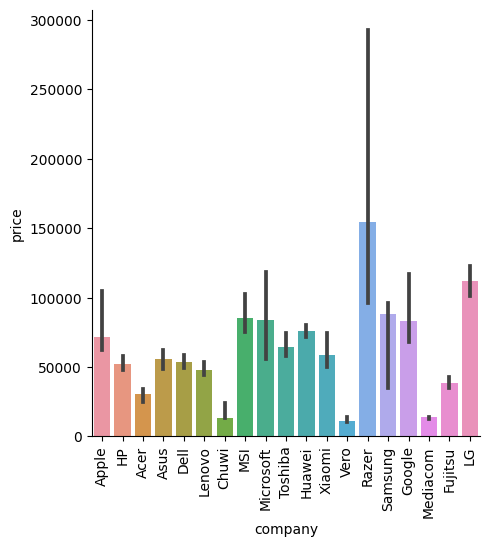

In [230]:
sns.catplot(data = df, x = 'company', y = 'price', kind = 'bar',estimator = 'median')
plt.xticks(rotation = 90)
plt.show()
# company name or brand does seem to have some effect on the - price
# like apple,razor,lg,do seem to have higher priced products.

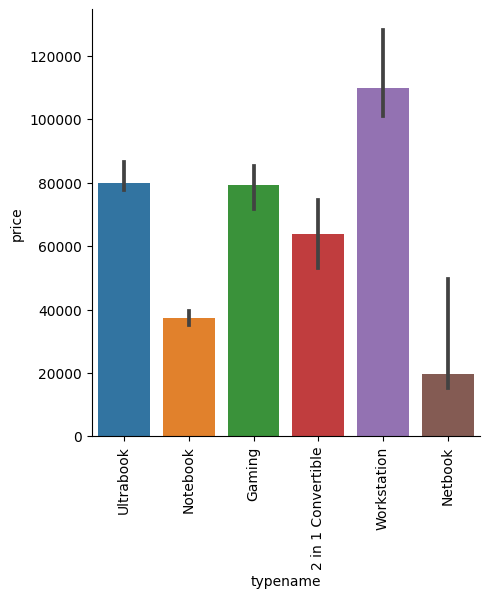

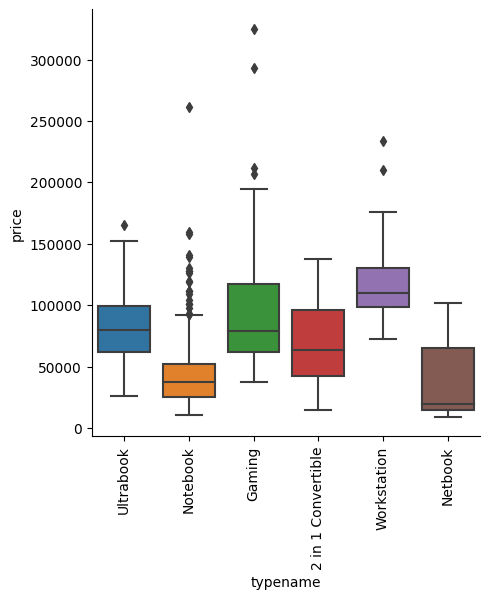

In [231]:
# price vs typename
sns.catplot(data = df, x = 'typename', y = 'price', kind = 'bar',estimator = 'median')
plt.xticks(rotation = 90)

sns.catplot(data = df, x = 'typename', y = 'price', kind = 'box')
plt.xticks(rotation = 90)
plt.show()
# workstation are more expensive. - price varies.
# gaming and ultrabooks are also expensive.
# netbooks and notebooks are cheaper - light browsing , reading etc.

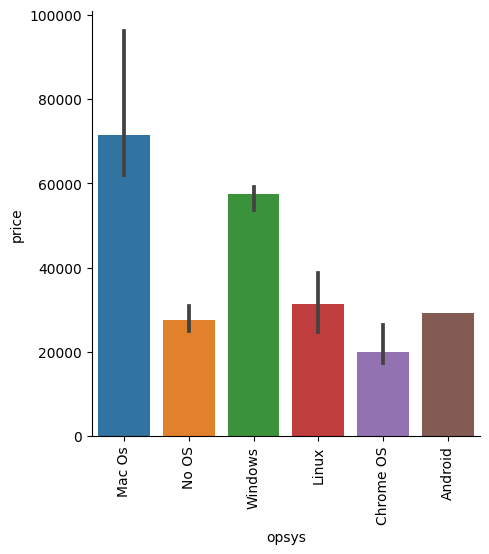

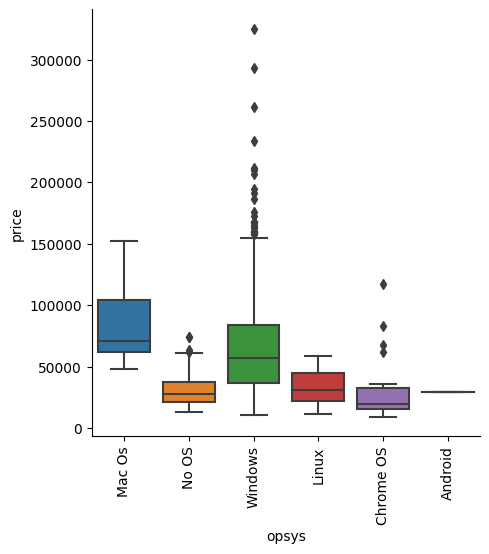

In [232]:
# price vs opsys
sns.catplot(data = df, x = 'opsys', y = 'price', kind = 'bar',estimator = 'median')
plt.xticks(rotation = 90)

sns.catplot(data = df, x = 'opsys', y = 'price', kind = 'box')
plt.xticks(rotation = 90)
plt.show()


# from the graph we can clearly see that the ma_cos - charges a premium.
# folloed by windows.
# price in windows varies a lot - as present in both the lower end and higher end devices.
# chromeos and android - costs the least.

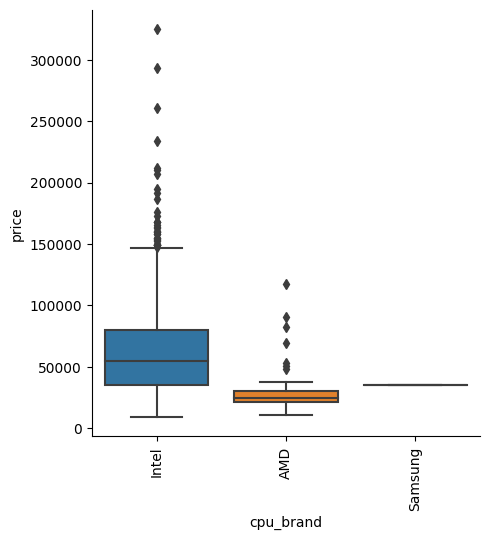

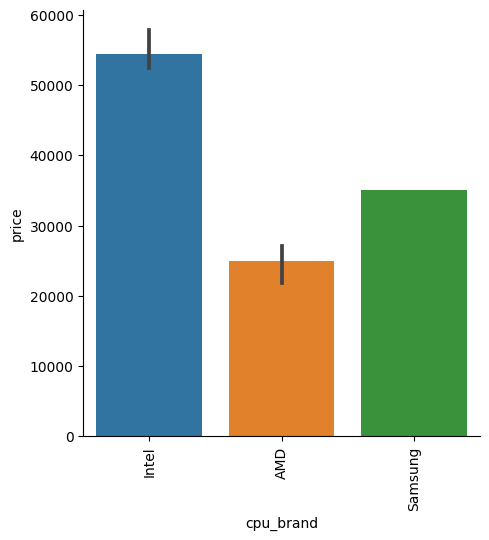

In [233]:
# price vs cpu_brand
sns.catplot(data = df, x = 'cpu_brand', y = 'price', kind = 'box')
plt.xticks(rotation = 90)

sns.catplot(data = df, x = 'cpu_brand', y = 'price', kind = 'bar',estimator = 'median')
plt.xticks(rotation = 90)

plt.show()

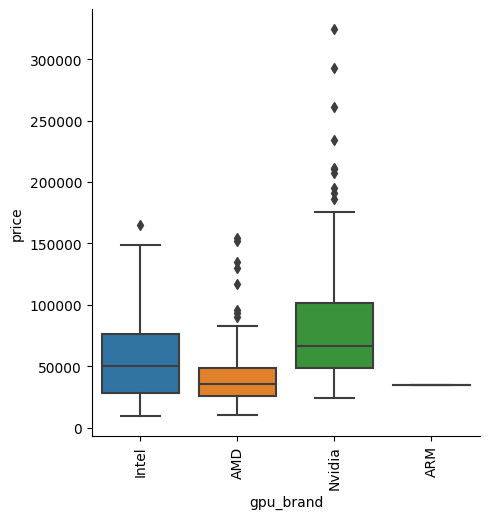

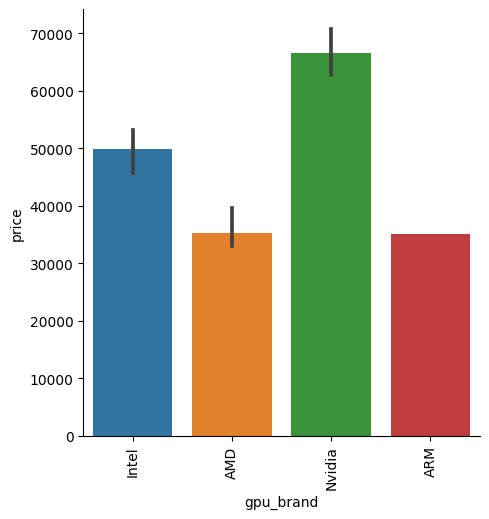

In [234]:
# price vs gpu_brand
sns.catplot(data = df, x = 'gpu_brand', y = 'price', kind = 'box')
plt.xticks(rotation = 90)

sns.catplot(data = df, x = 'gpu_brand', y = 'price', kind = 'bar',estimator = 'median')
plt.xticks(rotation = 90)

plt.show()
# nvidia's median price is highest and the price also varies.
# intel has second highest median price.

In [235]:
df.columns

Index(['company', 'typename', 'inches', 'screenresolution', 'ram', 'opsys',
       'weight', 'price', 'px_width', 'px_height', 'display_ips_panel',
       'display_is_touch_screen', 'cpu_brand', 'clock_speed', 'gpu_brand',
       'ssd_capacity', 'hdd_capacity', 'ssd_count', 'hdd_count',
       'flash_storage', 'cpu_details', 'ppi_whole'],
      dtype='object')

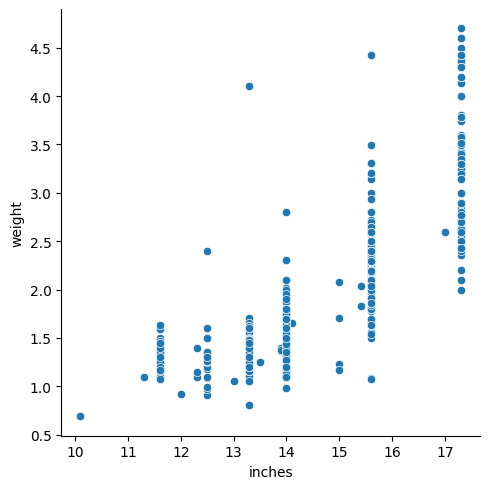

In [236]:
# inches vs weight 
# numerical vs numerical
# corr = 0.82 high correlation
sns.relplot(data = df,x = 'inches', y = 'weight', kind = 'scatter')
# weight at the same screen size - varies. -- reason?

0.19438105126073255


/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning: All-NaN slice encountered
  boot_dist.append(f(*sample, **func_kwargs))


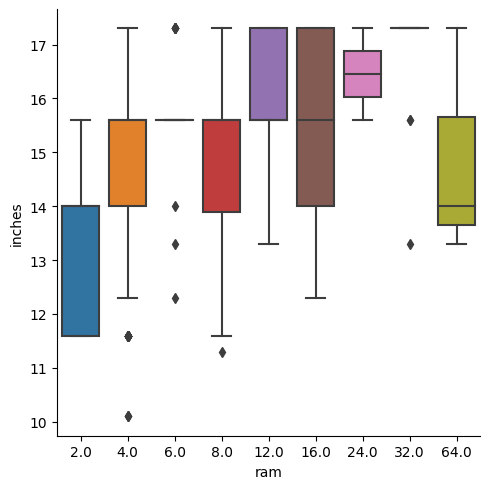

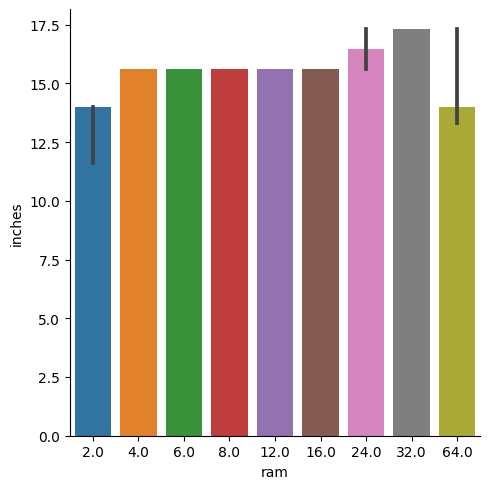

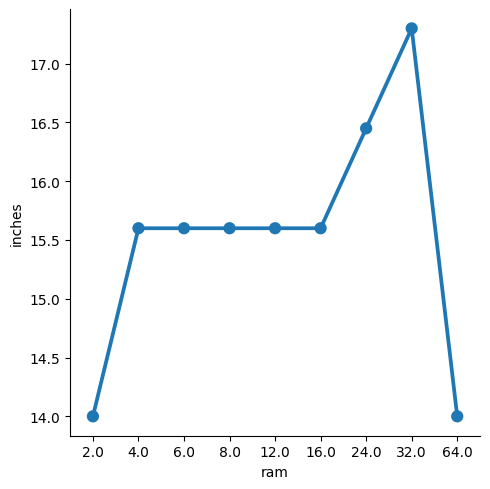

In [237]:
# inches vs ram
# numerical vs categorical
print(df['inches'].corr(df['ram']))
sns.catplot(data = df, x = 'ram', y = 'inches',kind = 'box')
sns.catplot(data = df, x = 'ram', y = 'inches',kind = 'bar', estimator = 'median')
sns.catplot(data = df, x = 'ram', y = 'inches',kind = 'point', estimator = 'median',errorbar = None)

# corr is very low and no consistent relation.
# the variability is more for each ram type.

0.5352448221201842


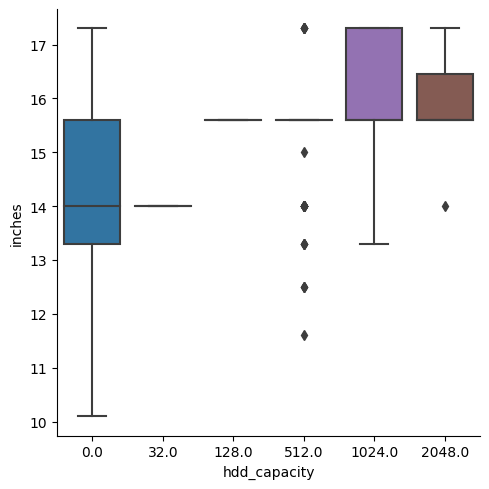

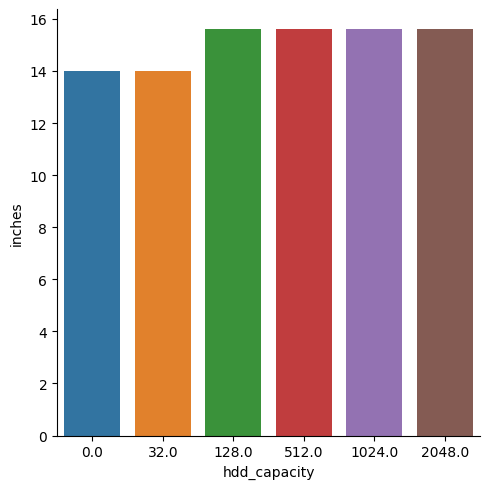

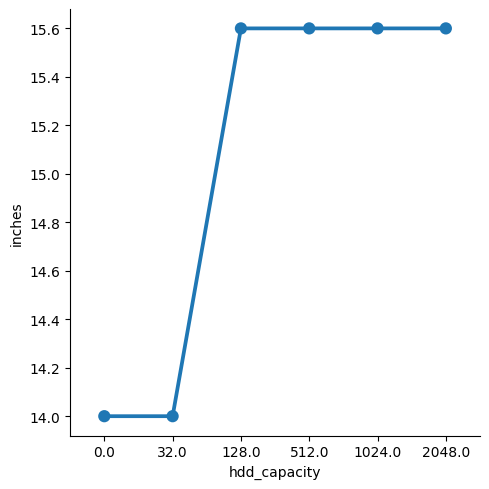

In [238]:
# inches and hdd_capacity
# numerical vs categorical
print(df['inches'].corr(df['hdd_capacity']))
sns.catplot(data = df, x = 'hdd_capacity', y = 'inches',kind = 'box')
sns.catplot(data = df, x = 'hdd_capacity', y = 'inches',kind = 'bar', estimator = 'median')
sns.catplot(data = df, x = 'hdd_capacity', y = 'inches',kind = 'point', estimator = 'median',errorbar = None)
# corr is +ve 0.5 but its largely because of the jump form 32 to 128gb

0.2934727303309212


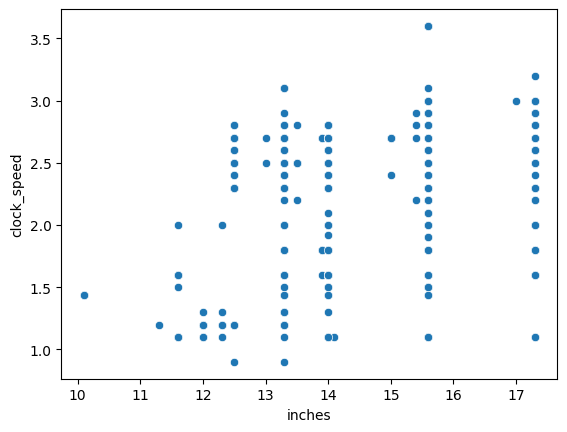

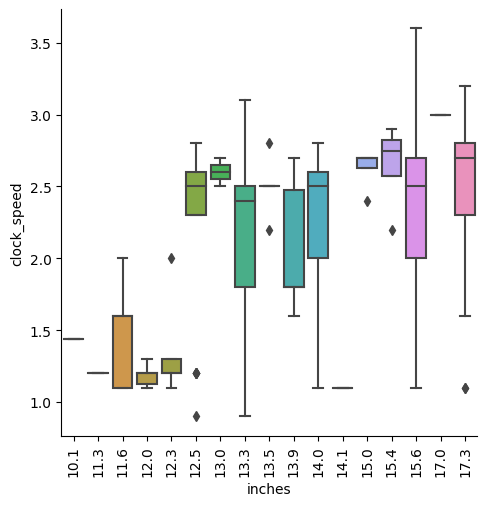

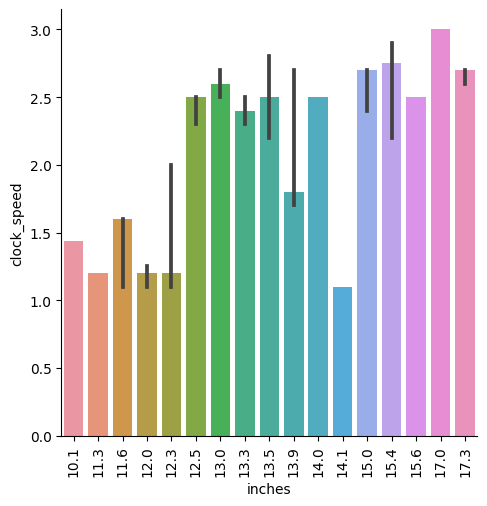

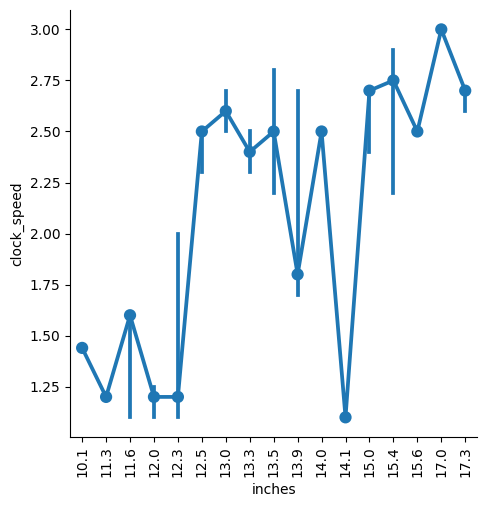

In [239]:
# inches vs clockspeed.
# numerical/categorical vs numerical
print(df['inches'].corr(df['clock_speed']))
sns.scatterplot(data = df, x = df['inches'], y = df['clock_speed'])
# categorical vs numerical.
sns.catplot(data = df, x = 'inches', y = 'clock_speed', kind = 'box')
plt.xticks(rotation = 90)
sns.catplot(data = df, x = 'inches', y = 'clock_speed', kind = 'bar', estimator = 'median')
plt.xticks(rotation = 90)
sns.catplot(data = df, x = 'inches', y = 'clock_speed', kind = 'point', estimator = 'median')
plt.xticks(rotation = 90)
plt.show()

0.5652484206661458


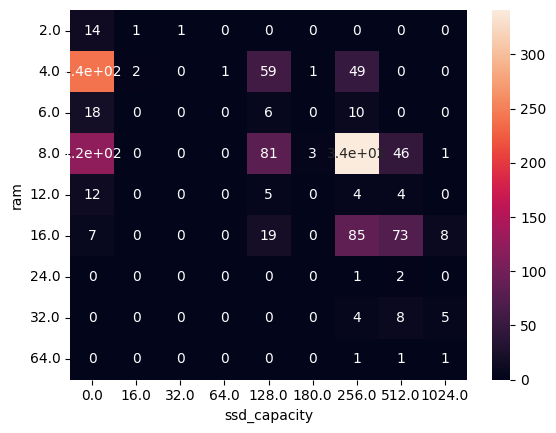

In [240]:
# ram vs ssd_capacity
# categorical and categorical,column
print(df['ram'].corr(df['ssd_capacity']))
sns.heatmap(pd.crosstab(index = df['ram'], columns = df['ssd_capacity']), annot = True)
plt.xticks(rotation = 0)
plt.yticks(rotation = 0)
plt.show()

# this correlation is mostly because of the 256gb ssd and 8gb ram combination.

0.3986442196121573


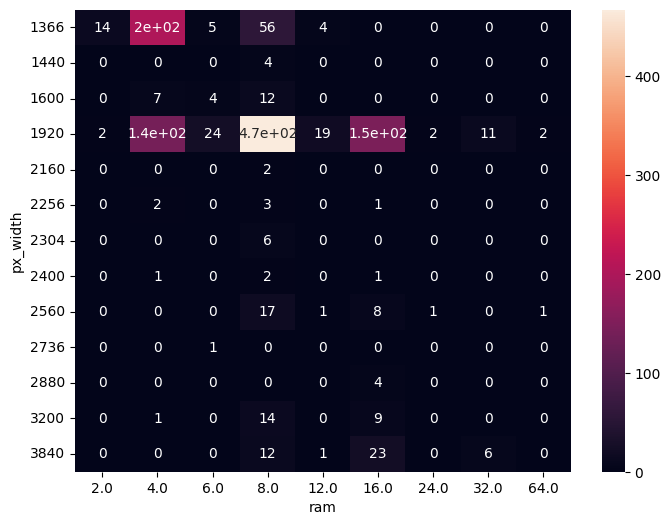

In [241]:
# ram vs px_width
# categorical vs categorical
# corr - 0.39
print(df['px_width'].corr(df['ram']))
plt.figure(figsize = (8,6))
sns.heatmap(pd.crosstab(index = df['px_width'], columns = df['ram']), annot = True)
plt.yticks(rotation = 0)
plt.show()
# this higher correaltion is because of the 8gb ram combination and the 1920 px_width combination - which is common for most of the devices

# the same can be said about the ram vs px_height.

# because of this there is also correlation present between the ram and ppi.

0.3278497640572143


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


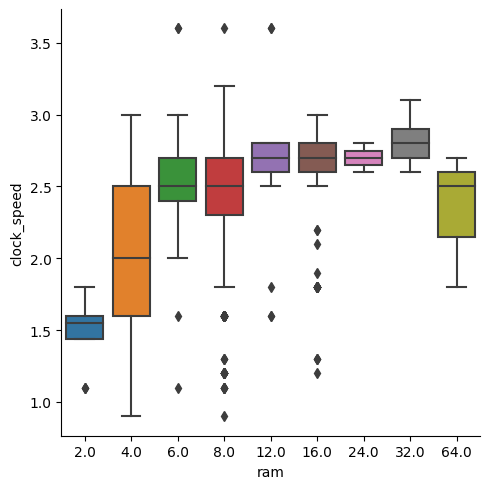

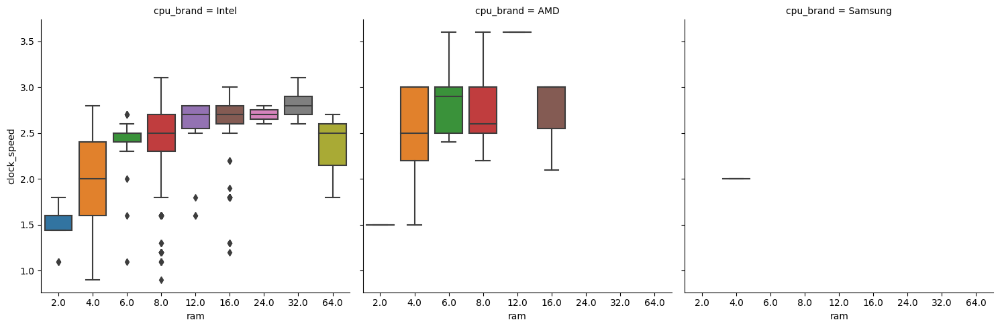

In [242]:
# ram vs clock_speed
# categorical vs numerical
print(df['ram'].corr(df['clock_speed']))
sns.catplot(data = df, x = 'ram', y = 'clock_speed', kind = 'box')
sns.catplot(data = df, x = 'ram', y = 'clock_speed', kind = 'box', col = 'cpu_brand')
# the median clock_speed increases as the ram increases. across all the cpu brands.

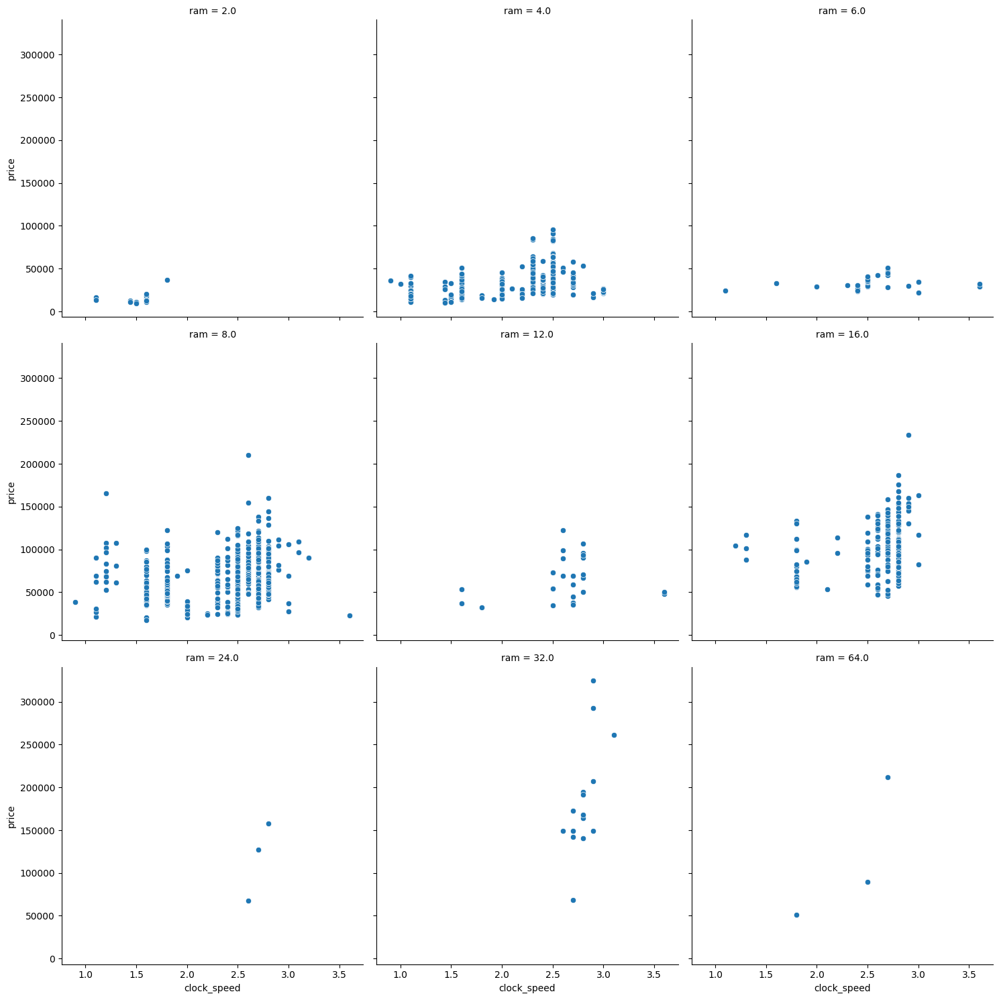

In [243]:
# now as the ram and clock_speed are corrlated.
sns.relplot(data = df, kind = 'scatter',x = 'clock_speed', y = 'price', col = 'ram', col_wrap = 3)
# here also price varies a lot at the same clock_speed this shows that price depends on other characteristics as well.

In [244]:
df['screenresolution'].value_counts()

screenresolution
Full HD 1920x1080                                492
1366x768                                         254
IPS Panel Full HD 1920x1080                      220
IPS Panel Full HD / Touchscreen 1920x1080         49
Full HD / Touchscreen 1920x1080                   45
1600x900                                          23
Touchscreen 1366x768                              16
Quad HD+ / Touchscreen 3200x1800                  14
IPS Panel 4K Ultra HD 3840x2160                   12
IPS Panel 4K Ultra HD / Touchscreen 3840x2160     11
4K Ultra HD / Touchscreen 3840x2160                9
IPS Panel 1366x768                                 7
4K Ultra HD 3840x2160                              7
Touchscreen 2560x1440                              6
IPS Panel Retina Display 2304x1440                 6
IPS Panel Retina Display 2560x1600                 6
Touchscreen 2256x1504                              6
IPS Panel Touchscreen 2560x1440                    5
1440x900                     

In [245]:
temp_df_4 =df.copy()

In [246]:
screen_data = {
    "Resolution": [
        "3840 x 2160", "2256 x 1504", "2880 x 1800", "2736 x 1824", 
        "2560 x 1600", "2560 x 1440", "2400 x 1600", "2304 x 1440", 
        "3200 x 1800", "2160 x 1440", "1920 x 1200", "1920 x 1080", 
        "1600 x 900", "1440 x 900", "1366 x 768"
    ],
    "Name": [
        "4K UHD (Ultra High Definition)", "Custom (close to 3:2 aspect ratio)", 
        "Retina Display (Common in MacBook Pros)", "Custom (close to 3:2 aspect ratio)", 
        "WQXGA (Wide Quad Extended Graphics Array)", "WQHD (Wide Quad HD)", 
        "WQXGA (Wide Quad Extended Graphics Array)", "WQHD (Wide Quad HD)", 
        "QHD+ (Quad HD Plus)", "QHD+ (Quad HD Plus)", 
        "WUXGA (Widescreen Ultra Extended Graphics Array)", "Full HD (1080p)", 
        "HD+", "WXGA+ (Wide Extended Graphics Array Plus)", "HD Ready"
    ],
    "Aspect Ratio": [
        "16:9", "3:2", "16:10", "3:2", "16:10", "16:9", "3:2", "16:9", 
        "16:9", "3:2", "16:10", "16:9", "16:9", "16:10", "16:9"
    ],
    "Quality Rank": [
        "Very High", "Very High", "Very High", "High", "High", "High", 
        "High", "High", "High", "High", "Mid", "Mid", "Lower-Mid", 
        "Lower-Mid", "Lower"
    ]
}

# Create a pandas dataframe
screen_df = pd.DataFrame(screen_data)

In [247]:
screen_df

,Resolution,Name,Aspect Ratio,Quality Rank
0,3840 x 2160,4K UHD (Ultra High Definition),16:9,Very High
1,2256 x 1504,Custom (close to 3:2 aspect ratio),3:2,Very High
2,2880 x 1800,Retina Display (Common in MacBook Pros),16:10,Very High
3,2736 x 1824,Custom (close to 3:2 aspect ratio),3:2,High
4,2560 x 1600,WQXGA (Wide Quad Extended Graphics Array),16:10,High
5,2560 x 1440,WQHD (Wide Quad HD),16:9,High
6,2400 x 1600,WQXGA (Wide Quad Extended Graphics Array),3:2,High
7,2304 x 1440,WQHD (Wide Quad HD),16:9,High
8,3200 x 1800,QHD+ (Quad HD Plus),16:9,High
9,2160 x 1440,QHD+ (Quad HD Plus),3:2,High


In [248]:
def joining_func(row):
    width = str(row['px_width'])
    height = str(row['px_height'])
    return ' x '.join([width,height])
df['resoultion'] = df.apply(joining_func, axis = 1)

In [249]:
df = df.merge(screen_df, left_on = 'resoultion', right_on = 'Resolution', how = 'left')

In [250]:
df = df.drop(columns = 'resoultion')

In [251]:
df = df.rename(columns = {
    'Resolution' : 'resolution',
    'Name' : 'resolution_type',
    'Aspect Ratio' : 'aspect_ratio',
    'Quality Rank' : 'quality_rank'
})

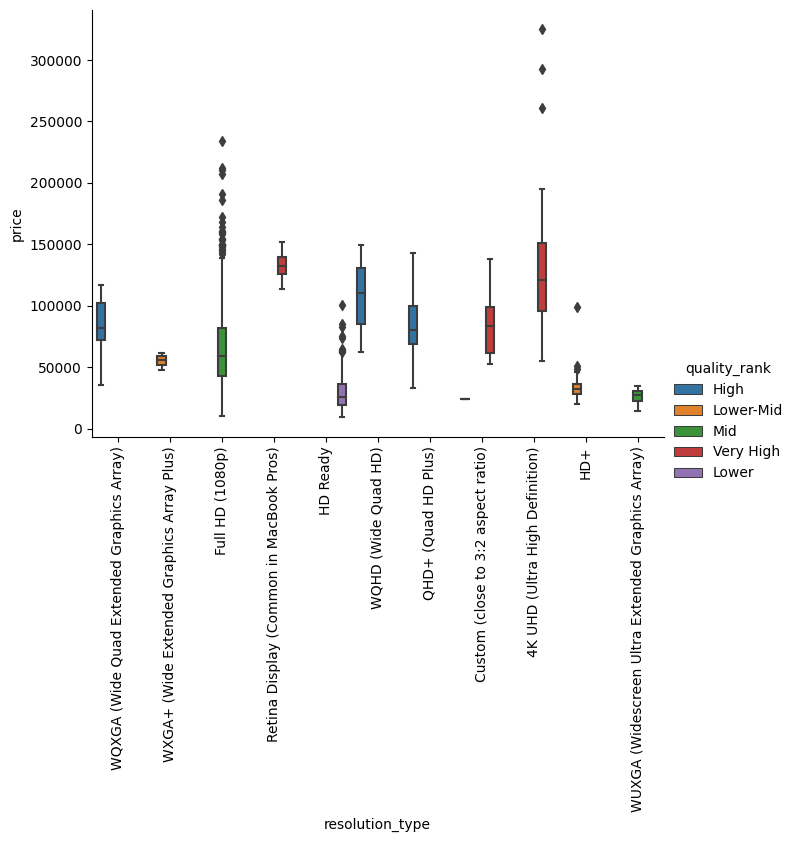

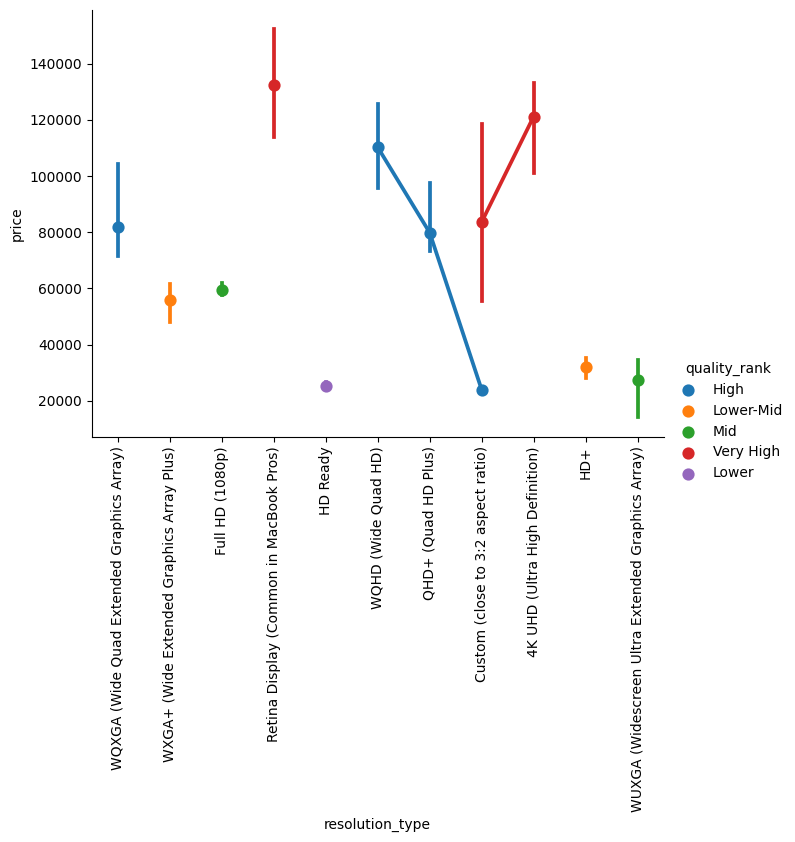

In [252]:
sns.catplot(data = df, x = 'resolution_type', y = 'price', kind = 'box', height = 5, aspect = 1.5, hue = 'quality_rank')
plt.xticks(rotation = 90)
sns.catplot(data = df, x = 'resolution_type', y = 'price', kind = 'point', height = 5, aspect = 1.5, hue = 'quality_rank',estimator = 'median')
plt.xticks(rotation = 90)
plt.show()

# form the graph we can clearly see that the resolution_type/screen type- dictates the price.
# for the higer quality - 4K ultra HD median price is genrally higher
# for full hd screen with the resolution of 1920 X 1080 px the price range varies - present at both higher and lower costs.
# mac books made by apple have retina display and the price is higer and the quality/resolution is higher.

In [253]:
df.isnull().sum()
# inches columns - has 10 null
# so ppi_whole columns - also has 10 null
df[df['inches'].isnull()].groupby(['company','typename']).size()

company    typename          
Asus       Notebook              1
Dell       2 in 1 Convertible    1
           Gaming                1
Lenovo     Notebook              4
           Ultrabook             1
MSI        Gaming                1
Microsoft  Ultrabook             1
dtype: int64

In [254]:
# asus notebook - 11.6 inches.
# dell 2 in one convertible - 13.3 inches.
# dell gaming - 15.6 inches.
# lenovo notebook - 11.6 inches.
# lenovo ultrabook - 14.0 inches.
# MSI gaming - 17.3 inches.
# Microsoft Ultrabook - 13.5 inches.    # these are the mode values.
inches_map = {
    ('Asus', 'Notebook'): 11.6,
    ('Dell', '2 in 1 Convertible'): 13.3,
    ('Dell', 'Gaming'): 15.6,  # You had 13.3 before, but I think you meant 15.6 for gaming.
    ('Lenovo', 'Notebook'): 11.6,
    ('Lenovo', 'Ultrabook'): 14.0,
    ('MSI', 'Gaming'): 17.3,
    ('Microsoft', 'Ultrabook'): 13.5
}

# Step 2: Define a function to fill missing 'inches' based on the mapping
def fill_inch(row):
    if pd.isnull(row['inches']):
        return inches_map.get((row['company'], row['typename']), row['inches'])  # getting the value from the mapping.
    else:
        return row['inches']

# Step 3: Apply the function
df['inches'] = df.apply(fill_inch, axis=1)

In [255]:
null_ppi = df[df['ppi_whole'].isnull()].index
df.loc[null_ppi,'ppi_whole'] = np.round(((df.loc[null_ppi]['px_width']**2 + df.loc[null_ppi]['px_height']**2)**0.5)/df.loc[null_ppi]['inches'])

In [256]:
df['ppi_whole'].isnull().sum()

0

In [257]:
df[df['weight'].isnull()].groupby(['company','typename','inches']).size()

company  typename   inches
Acer     Notebook   15.6      2
Asus     Ultrabook  14.0      1
Dell     Notebook   15.6      1
         Ultrabook  15.6      1
Lenovo   Notebook   15.6      1
                    17.3      1
         Ultrabook  14.0      1
Toshiba  Notebook   15.6      1
dtype: int64

In [258]:
# 'Acer','Notebook',15.6 - 2.1
# 'Asus','2 in 1 Convertible',13.3 - 1.1
# 'Asus','Ultrabook',14.0 - 1.0
# 'Dell','Notebook',15.6 - 2.2
# 'Dell','Notebook',17.3 - 2.8
# 'Dell','Ultrabook',15.6 - 1.88
# 'Lenovo','Notebook',15.6 - 2.2
# 'Lenovo','Notebook',17.3 - 2.8
# 'Lenovo','Ultrabook',14.0 - 1.13
# 'Toshiba','Notebook',15.6 - 2.0

def mode_func(var):
    return var.mode()[0]
df.groupby(['company','typename','inches']).agg({
    'weight' : mode_func
}).loc[('Toshiba','Notebook',15.6)]

weights_map = {
    ('Acer','Notebook',15.6) :2.1,
     ('Acer','Notebook',15.6): 2.1,
     ('Asus','2 in 1 Convertible',13.3) :1.1,
     ('Asus','Ultrabook',14.0) : 1.0,
     ('Dell','Notebook',15.6) : 2.2,
     ('Dell','Notebook',17.3) : 2.8,
     ('Dell','Ultrabook',15.6) : 1.88,
     ('Lenovo','Notebook',15.6) : 2.2,
     ('Lenovo','Notebook',17.3) : 2.8,
     ('Lenovo','Ultrabook',14.0): 1.13,
     ('Toshiba','Notebook',15.6) : 2.0
}

def fill_weight(row):
    if pd.isnull(row['weight']):
        return weights_map.get((row['company'], row['typename'],row['inches']), row['weight'])  # getting the value from the mapping.
    else:
        return row['weight']
df['weight'] = df.apply(fill_weight, axis=1)

In [259]:
df['weight'].isnull().sum()

0

In [260]:
df['weight'].isnull().sum()

0

In [261]:
df.isnull().sum()

company                    0
typename                   0
inches                     0
screenresolution           0
ram                        1
opsys                      0
weight                     0
price                      0
px_width                   0
px_height                  0
display_ips_panel          0
display_is_touch_screen    0
cpu_brand                  0
clock_speed                0
gpu_brand                  0
ssd_capacity               0
hdd_capacity               0
ssd_count                  0
hdd_count                  0
flash_storage              0
cpu_details                0
ppi_whole                  0
resolution                 0
resolution_type            0
aspect_ratio               0
quality_rank               0
dtype: int64

In [262]:
df[df['ram'].isnull()]
df.loc[683,'ram'] = 8

In [263]:
df.isnull().sum()

company                    0
typename                   0
inches                     0
screenresolution           0
ram                        0
opsys                      0
weight                     0
price                      0
px_width                   0
px_height                  0
display_ips_panel          0
display_is_touch_screen    0
cpu_brand                  0
clock_speed                0
gpu_brand                  0
ssd_capacity               0
hdd_capacity               0
ssd_count                  0
hdd_count                  0
flash_storage              0
cpu_details                0
ppi_whole                  0
resolution                 0
resolution_type            0
aspect_ratio               0
quality_rank               0
dtype: int64

#### regular bivariate analysis

0.5229494491570627


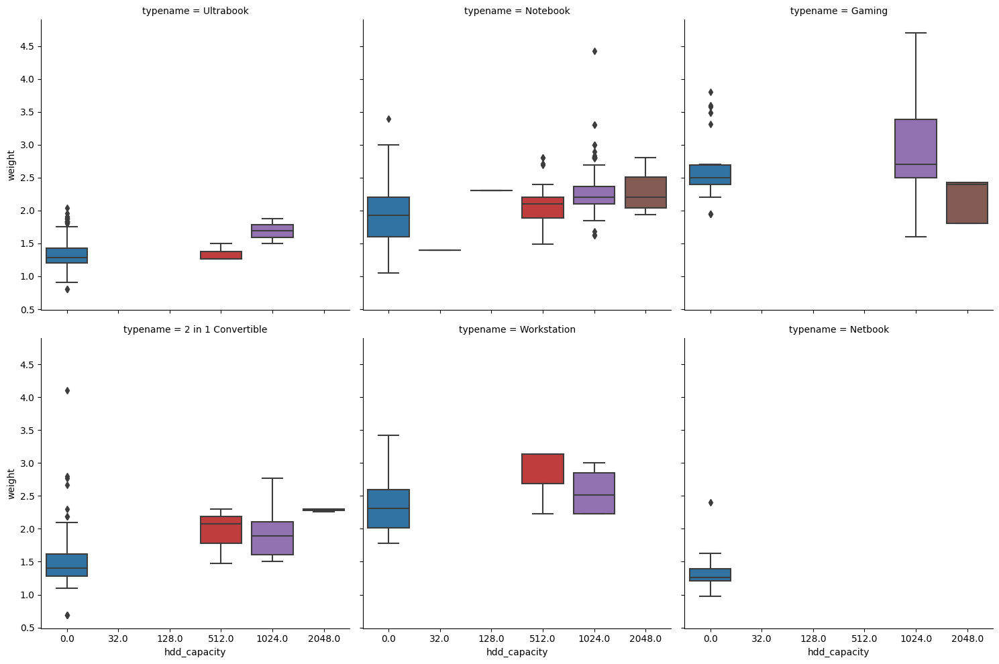

In [264]:
# weight vs hdd capacity
# numerical vs categorical
# doesnt actually matter.
print(df['weight'].corr(df['hdd_capacity']))
sns.catplot(data = df, x = 'hdd_capacity', y = 'weight', kind = 'box', col = 'typename', col_wrap = 3)

0.33465900574855695


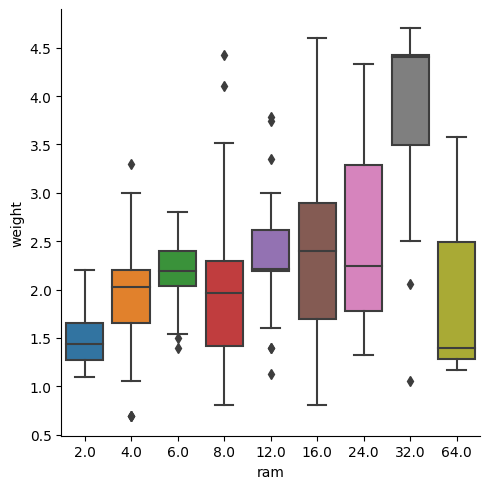

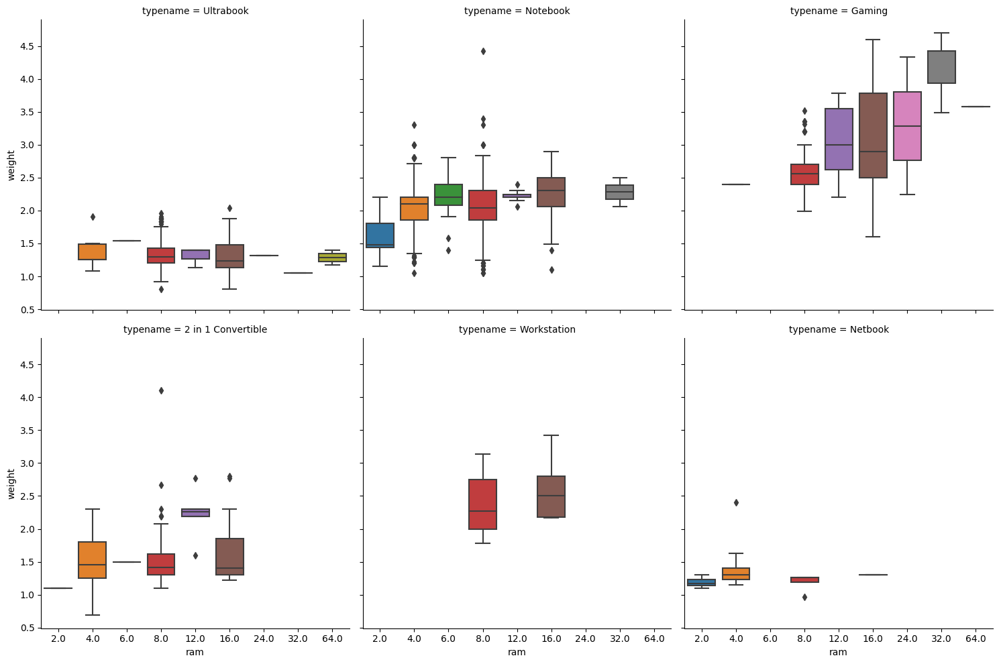

In [265]:
# ram vs weight
# categorical vs numerical(weight) 

# corr - 0.338
print(df['weight'].corr(df['ram']))

# weight distribution across categories
sns.catplot(data = df, x = 'ram', y = 'weight', kind = 'box')
# in general the weight is increasing as the ram is increasing  
#this is because the higher ram is present in the gaming laptops where the weight is higher.
sns.catplot(data = df, x = 'ram', y = 'weight', kind = 'box', col = 'typename', col_wrap = 3)

In [266]:
# we know that the higer the screen quality higher the price.
# company vs quality_rank(screen_quality)
# categorical vs categorical.

pd.crosstab(columns = df['company'], index = df['quality_rank'], normalize = 'columns', margins = True) * 100

# of all the laptops of acer in dataset - 47% have the low screen quality. -- so acer laptops tends to be cheaper.
# of all the laptops of apple in dataset - 57% have high screen quality, and 19% very high and 19% lower mid.
# most of the laptops around 65% have a mid quality screen.  -- 1920X 1080 or 1920 X 1200.
# 22% of the total laptops have HD Ready screen quality. -- 1366 x 768.
# lenevo,hp,dell - makes laptops with all kinds of screen.
# apple doesnt make - mid quality screened laptops.

company,Acer,Apple,Asus,Chuwi,Dell,Fujitsu,Google,HP,Huawei,LG,Lenovo,MSI,Mediacom,Microsoft,Razer,Samsung,Toshiba,Vero,Xiaomi,All
quality_rank,,,,,,,,,,,,,,,,,,,,
High,0.000000,57.142857,1.342282,33.333333,6.049822,0.0,100.0,3.088803,100.0,0.0,6.737589,0.000000,0.0,0.0,0.000000,11.111111,0.000000,0.0,0.0,5.246166
Lower,47.524752,4.761905,23.489933,0.000000,22.775801,100.0,0.0,25.096525,0.0,0.0,17.375887,0.000000,0.0,0.0,0.000000,11.111111,31.914894,25.0,0.0,22.679580
Lower-Mid,1.980198,19.047619,0.671141,0.000000,0.355872,0.0,0.0,2.316602,0.0,0.0,4.609929,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,2.179177
Mid,50.495050,0.000000,72.483221,66.666667,64.056940,0.0,0.0,67.181467,0.0,100.0,68.439716,96.226415,100.0,0.0,42.857143,77.777778,68.085106,75.0,100.0,65.698144
Very High,0.000000,19.047619,2.013423,0.000000,6.761566,0.0,0.0,2.316602,0.0,0.0,2.836879,3.773585,0.0,100.0,57.142857,0.000000,0.000000,0.0,0.0,4.196933


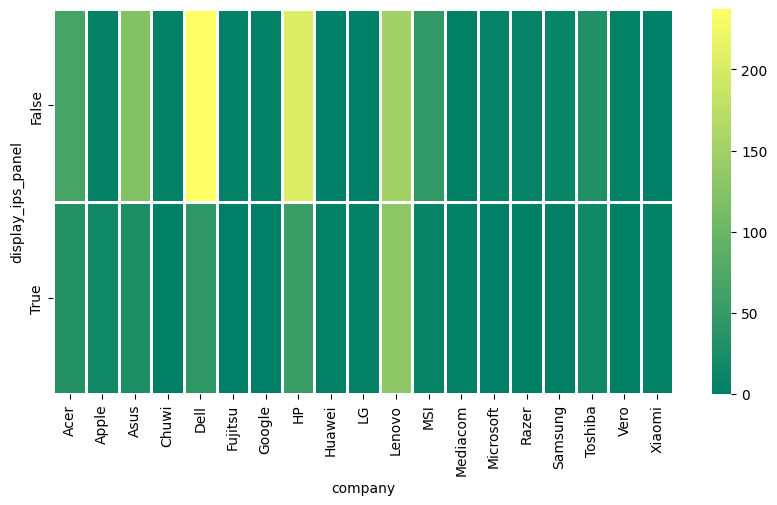

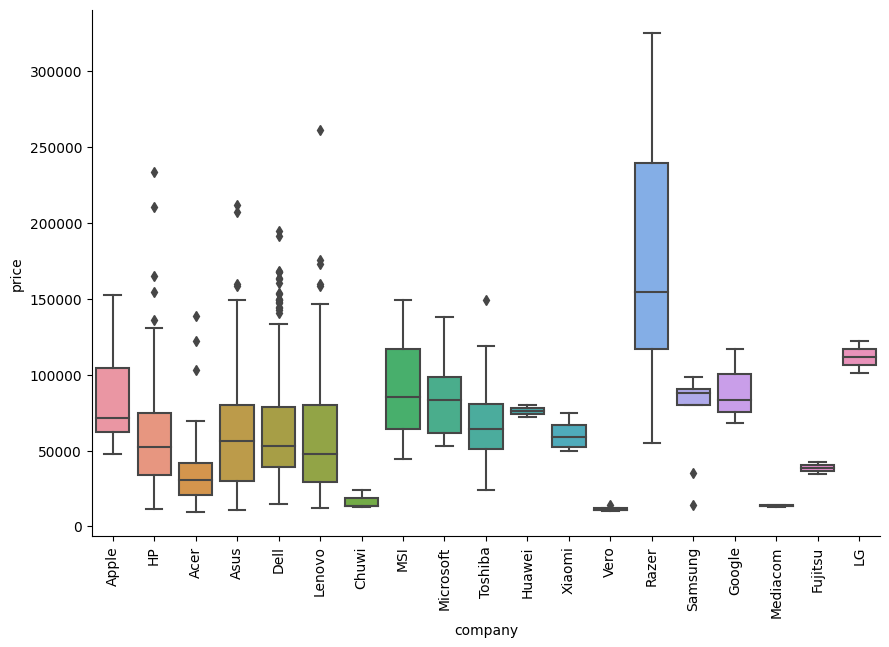

In [267]:
# company vs ips_panel
# we know that the ips_panel - leads to higher prices.
plt.figure(figsize = (10,5))
sns.heatmap(pd.crosstab(index = df['display_ips_panel'], columns = df['company']), cmap = 'summer', linewidth = 1)
sns.catplot(data = df, x = 'company',y = 'price',kind = 'box', height = 6, aspect = 1.5)
plt.xticks(rotation = 90)
plt.show()

# from the two graphs below - we can see
# higher priced laptops tend to have ips panels.
# lenevo offers almost same number of devices - with and without ips panels -- so the price varies.

In [268]:
# checking for why the lenevo price - tends to rise after 150000
df[(df['company'] == 'Lenovo') & (df['price'] > 150000)]['display_ips_panel']

548     True
592     True
720     True
985     True
1048    True
Name: display_ips_panel, dtype: bool

In [269]:
df[(df['company'] == 'HP') & (df['price'] > 130000)]['display_ips_panel']  
# at index - 830 and 1070 - ips panel is not present.  -- indicates price not only depends on the display_ips_panel.
# at 884 - 4k ultra hd screen

306      True
724      True
830     False
884     False
1070     True
1103     True
Name: display_ips_panel, dtype: bool

In [270]:
df.loc[830]

company                                                 HP
typename                                2 in 1 Convertible
inches                                                13.3
screenresolution           Full HD / Touchscreen 1920x1080
ram                                                    8.0
opsys                                              Windows
weight                                                1.28
price                                            136343.52
px_width                                              1920
px_height                                             1080
display_ips_panel                                    False
display_is_touch_screen                               True
cpu_brand                                            Intel
clock_speed                                            2.8
gpu_brand                                            Intel
ssd_capacity                                         256.0
hdd_capacity                                           0

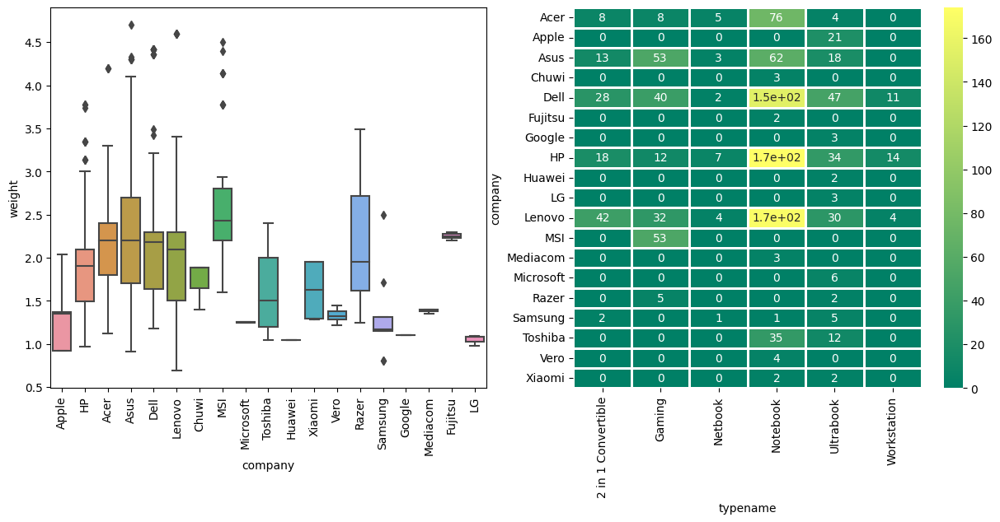

In [271]:
# company vs weight and
# categorical vs numerical
fig = plt.figure(figsize = (15,6))
ax1 = fig.add_subplot(1,2,1)
sns.boxplot(data = df, x = 'company', y = 'weight',ax = ax1)
plt.xticks(rotation = 90)
ax2 = fig.add_subplot(1,2,2)
sns.heatmap(pd.crosstab(index = df['company'], columns = df['typename']), cmap = 'summer', linewidth = 1, ax = ax2, annot = True)
plt.xticks(rotation = 90)
plt.show()

# the companies making - gaming laptops - have heavier devices.
# most common category is notebook and they tend to be on the lighter side.

<Axes: xlabel='opsys', ylabel='company'>

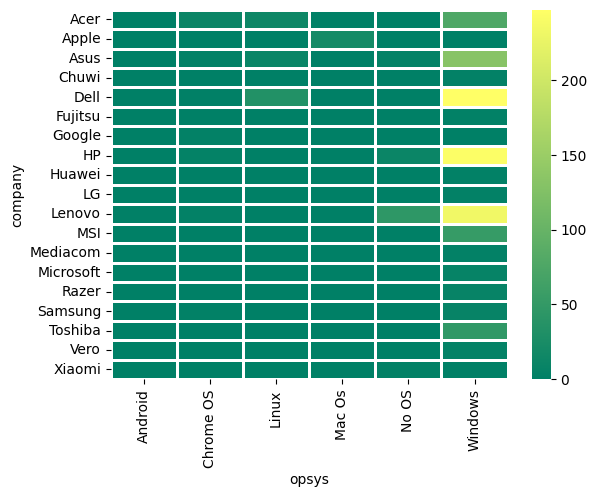

In [272]:
# company vs opsys
# categorical vs categorical.
sns.heatmap(pd.crosstab(index = df['company'], columns = df['opsys']), linewidth = 1, cmap = 'summer')
# windows is the most popular opsys for the dataset.

In [273]:
# company vs cpu_brand
# categorical vs categorical
pd.crosstab(columns = df['company'], index = df['cpu_brand'])
# most of the companies use the intel cpu

company,Acer,Apple,Asus,Chuwi,Dell,Fujitsu,Google,HP,Huawei,LG,Lenovo,MSI,Mediacom,Microsoft,Razer,Samsung,Toshiba,Vero,Xiaomi
cpu_brand,,,,,,,,,,,,,,,,,,,
AMD,10,0,11,0,0,0,0,23,0,0,16,0,0,0,0,0,0,0,0
Intel,91,21,138,3,281,2,3,236,2,3,266,53,3,6,7,8,47,4,4
Samsung,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


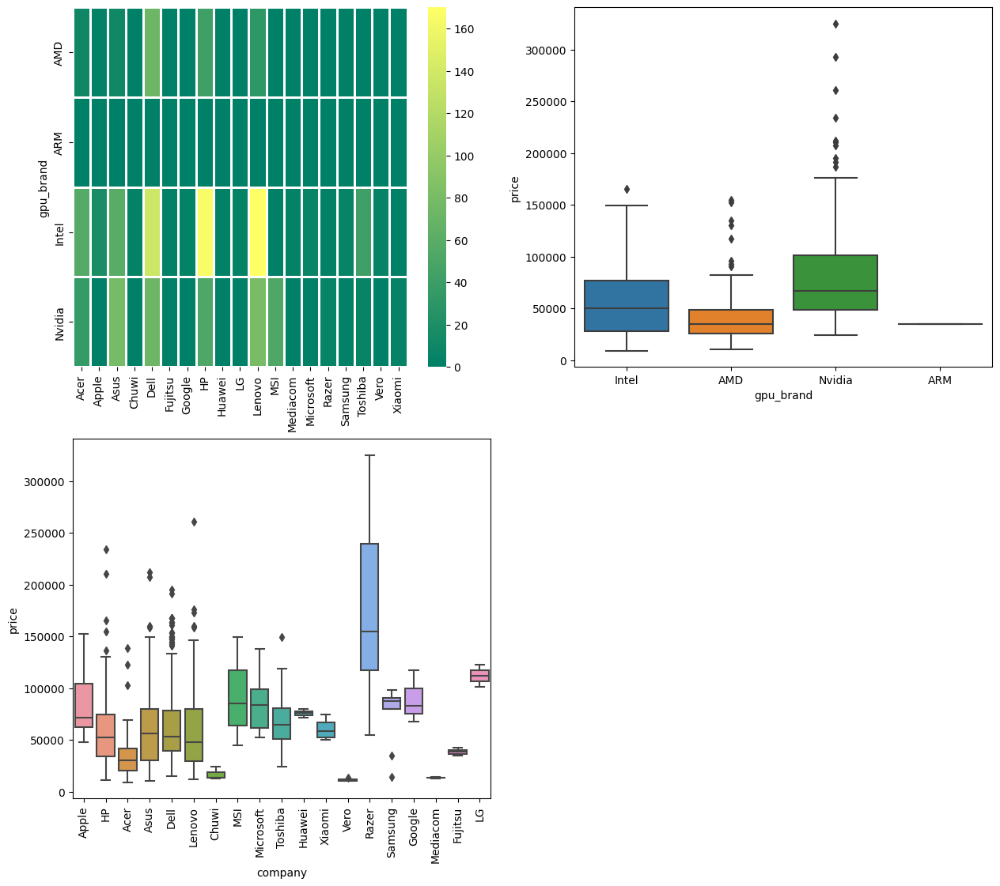

Lenovo
gpu_brand
Nvidia    5
Name: count, dtype: int64
clock_speed
2.8    2
2.7    2
3.1    1
Name: count, dtype: int64
ram
32.0    2
16.0    2
8.0     1
Name: count, dtype: int64
********************
Dell
gpu_brand
Nvidia    18
Intel      1
Name: count, dtype: int64
clock_speed
2.8    12
2.9     3
2.7     2
3.0     1
2.6     1
Name: count, dtype: int64
ram
16.0    11
32.0     7
8.0      1
Name: count, dtype: int64
********************
HP
gpu_brand
Nvidia    2
Intel     2
AMD       1
Name: count, dtype: int64
clock_speed
2.6    2
2.9    1
2.8    1
1.2    1
Name: count, dtype: int64
ram
8.0     4
16.0    1
Name: count, dtype: int64
********************
Asus
gpu_brand
Nvidia    4
Name: count, dtype: int64
clock_speed
2.9    2
2.8    1
2.7    1
Name: count, dtype: int64
ram
32.0    1
16.0    1
24.0    1
64.0    1
Name: count, dtype: int64
********************
Acer
gpu_brand
Nvidia    3
Name: count, dtype: int64
clock_speed
2.8    2
2.6    1
Name: count, dtype: int64
ram
16.0    3
Name: co

In [274]:
# company vs gpu_brand compared with the price 
fig = plt.figure(figsize = (15,13))
ax1 = fig.add_subplot(2,2,1)
sns.heatmap(pd.crosstab(columns = df['company'], index = df['gpu_brand']), cmap = 'summer', linewidth = 1, ax = ax1)
plt.xticks(rotation = 90)

ax2 = fig.add_subplot(2,2,2)
sns.boxplot(data = df, x = df['gpu_brand'], y = df['price'], ax = ax2)

ax3 = fig.add_subplot(2,2,3)
sns.boxplot(data = df, x = df['company'], y = df['price'], ax = ax3)
plt.xticks(rotation = 90)
plt.show()

# List of companies with their respective price thresholds
companies_prices = [
    ('Lenovo', 150000),
    ('Dell', 135000),
    ('HP', 135000),
    ('Asus', 150000),
    ('Acer', 70000)
]

for company, price_threshold in companies_prices:
    print(company)
    filtered_df = df[(df['company'] == company) & (df['price'] > price_threshold)]
    print(filtered_df['gpu_brand'].value_counts())
    print(filtered_df['clock_speed'].value_counts())
    print(filtered_df['ram'].value_counts())
    print('*' * 20)

# from the graphs - we can see that the lenovo - has both the intel's and the nvidia's gpu -- but the outlier as per price in the lenovo
# all have gpu of nvidia - that the and the median price range of nvidia's gpu is highest among all gpu_brands - so thats why there are devices of lenovo above 150000.
# and they have higher clock speeds - 2.8 to 3.1 ghz-- the higher the clock speed the more is the price.
# and they also have higher ram capacity.

# for dell also the outliers as per price - have gpu of nvidia.
# clock speed is in the higher range.
# ram is higher 

# the hp - price is depending on other factors apart from gpu_brand.
# clock_speed - is in lower ranges.
    
# for asus the reasoning holds true
# clock speed is in higher range.
# ram - higher range
    
# for acer also.
# clock_speed - higher range
# ram - high

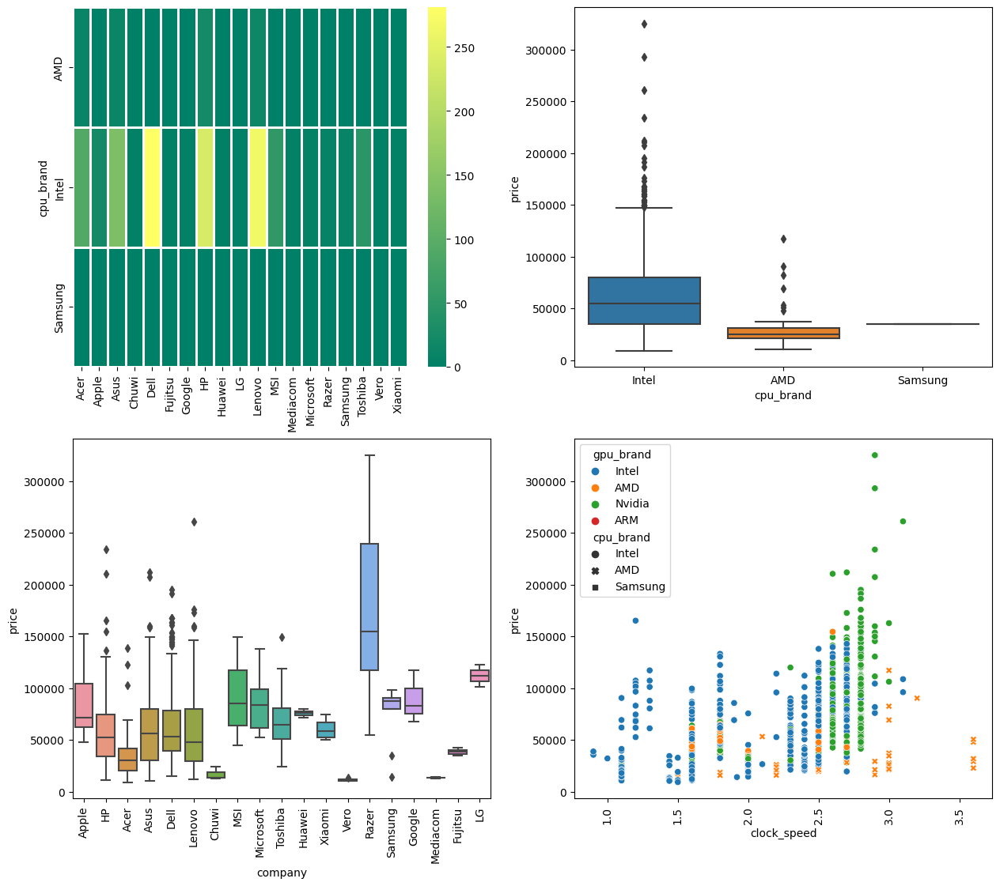

gpu_brand
Nvidia    63563.0400
Intel     52161.1200
AMD       41421.7368
Name: price, dtype: float64

In [275]:
# company,cpu_brand,price,clock_speed
fig = plt.figure(figsize = (15,13))
ax1 = fig.add_subplot(2,2,1)
sns.heatmap(pd.crosstab(columns = df['company'], index = df['cpu_brand']), cmap = 'summer', linewidth = 1, ax = ax1)
plt.xticks(rotation = 90)

ax2 = fig.add_subplot(2,2,2)
sns.boxplot(data = df, x = df['cpu_brand'], y = df['price'], ax = ax2)

ax3 = fig.add_subplot(2,2,3)
sns.boxplot(data = df, x = df['company'], y = df['price'], ax = ax3)
plt.xticks(rotation = 90)

ax4 = fig.add_subplot(2,2,4)
sns.scatterplot(data = df, x = df['clock_speed'], y = df['price'], ax = ax4, hue = 'gpu_brand', style = 'cpu_brand')
plt.xticks(rotation = 90)
plt.show()

# at the higher clock_speeds the gpu present is of nvidias and the median price of nvidias gpu is higher.

# from the graphs we see that there are many higher priced laptop when is cpu is of intel.
# and its mostly used in lenevo ,hp , dell.
# and see the 4th graph - there at the higer price - with intel cpu - nvidia gpu is used. -- increasing the price.

df[(df['company'].isin(['Dell','Lenovo','HP']))  & (df['cpu_brand'] == 'Intel')].groupby('gpu_brand')['price'].median().sort_values(ascending = False)

<Axes: xlabel='company', ylabel='ram'>

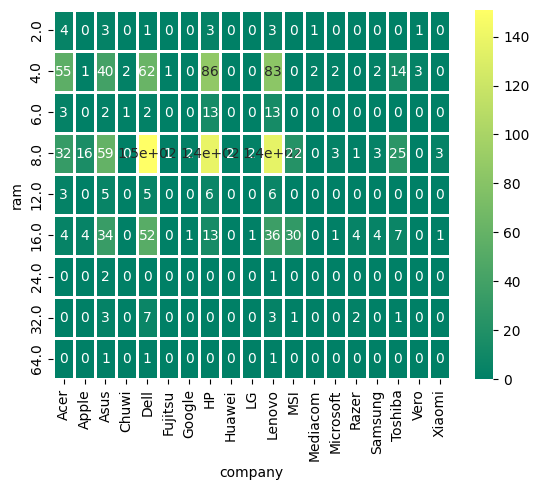

In [276]:
# company vs ram
# categorical vs categorical
sns.heatmap(pd.crosstab(df['ram'],df['company']), cmap = 'summer', annot = True, linewidth = 1)
# 4gb, 8gb, 16gb ram is popular among companies.

2.5

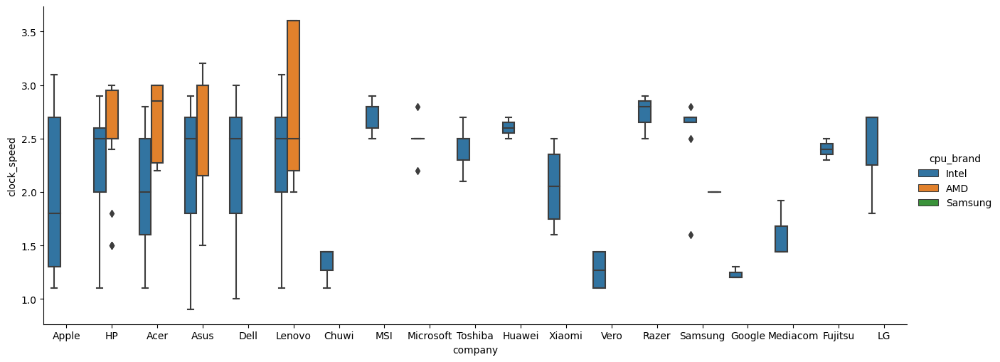

In [277]:
# company vs clock_speed
sns.catplot(data = df , x = 'company', y = 'clock_speed', kind = 'box', hue = 'cpu_brand', aspect = 2.5,height = 5.2)
df['clock_speed'].mode()[0]
# cant conclude much.

<Axes: xlabel='company', ylabel='ssd_capacity'>

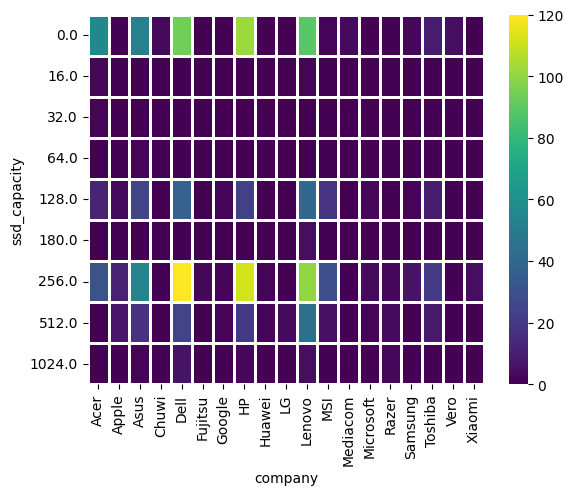

In [278]:
# company vs ssd_capacity
# categorical vs categorical
# we know that most of the laptops have ssd present in them
sns.heatmap(pd.crosstab(columns = df['company'] , index = df['ssd_capacity']), cmap = 'viridis', linewidth = 1)
# not much to conclude.

<Axes: xlabel='company', ylabel='hdd_capacity'>

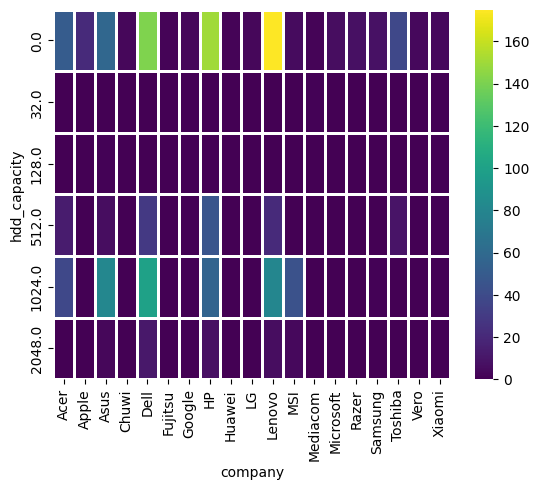

In [279]:
sns.heatmap(pd.crosstab(columns = df['company'] , index = df['hdd_capacity']), cmap = 'viridis', linewidth = 1)
# not worth a lot.

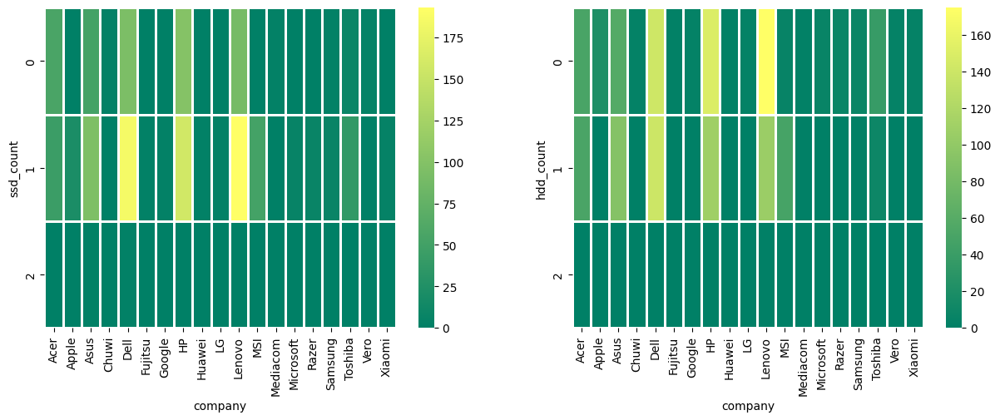

In [280]:
# company vs ssd_count/hdd_count - not much worth. 
fig = plt.figure(figsize = (15,5))
ax1 = fig.add_subplot(1,2,1)
sns.heatmap(pd.crosstab(columns = df['company'] , index = df['ssd_count']), cmap = 'summer', linewidth = 1, ax = ax1)
ax2 = fig.add_subplot(1,2,2)
sns.heatmap(pd.crosstab(columns = df['company'] , index = df['hdd_count']), cmap = 'summer', linewidth = 1, ax = ax2)
plt.show()

<Axes: xlabel='ppi_whole', ylabel='company'>

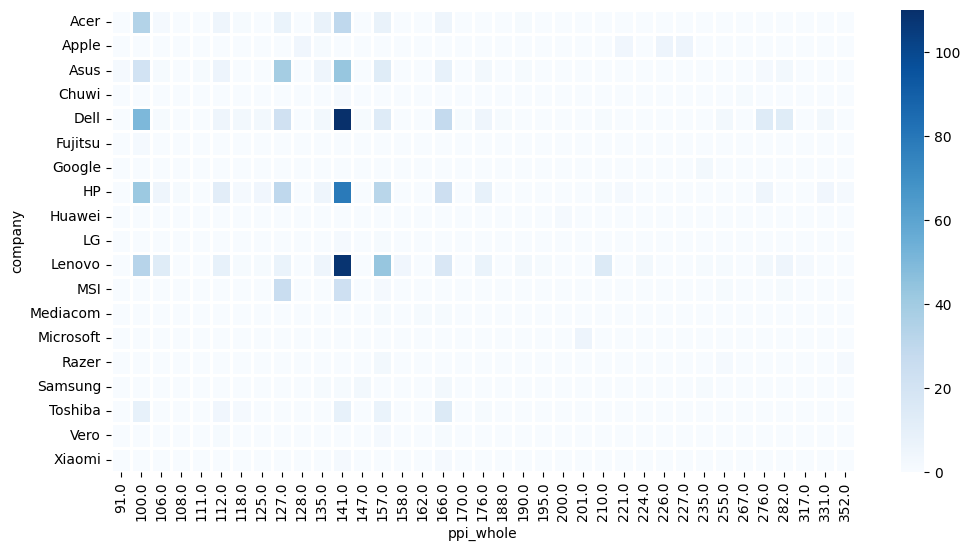

In [281]:
# company vs ppi_whole
# categorical vs categorical
plt.figure(figsize = (12,6))
sns.heatmap(pd.crosstab(index = df['company'] , columns = df['ppi_whole']), cmap = 'Blues', linewidth = 1)
# most popular ppi - 141 - with the screen size of 15.6".
# the most common ppi used by the companies are 100,141,157,127,166. etc
# the ppi above 200 is for the QHD and 4K ultra hd monitors.

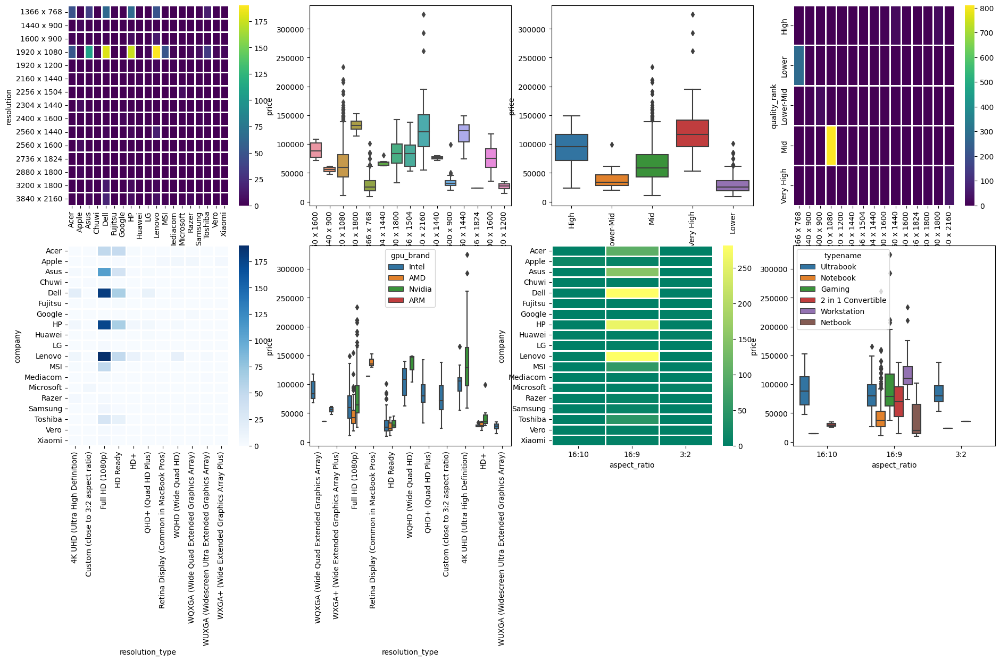

In [282]:
# company vs resoltion/quality_ran
# categorical vs categorical
fig = plt.figure(figsize = (22.5,22.5))
ax1 = fig.add_subplot(4,4,1)
sns.heatmap(pd.crosstab(df['resolution'], df['company']), cmap = 'viridis', linewidth = 1, ax = ax1)
plt.xticks(rotation = 90)

# price vs resolution.
ax2 = fig.add_subplot(4,4,2)
sns.boxplot(data = df, x = 'resolution', y = 'price',ax = ax2)
plt.xticks(rotation = 90)

# price vs quality_rank
ax3 = fig.add_subplot(4,4,3)
sns.boxplot(data = df, x = 'quality_rank', y = 'price',ax = ax3)
plt.xticks(rotation = 90)


# resolution vs quality_rank
ax4 = fig.add_subplot(4,4,4)
sns.heatmap(pd.crosstab(df['quality_rank'], df['resolution']), cmap = 'viridis', linewidth = 1, ax = ax4)
plt.xticks(rotation = 90)


# company vs resolution_type
ax5 = fig.add_subplot(4,4,5)
sns.heatmap(pd.crosstab(df['company'],df['resolution_type']), cmap = 'Blues', linewidth = 1, ax = ax5)
plt.xticks(rotation = 90)


# price vs resolution_type

ax6 = fig.add_subplot(4,4,6)
sns.boxplot(data = df, x = 'resolution_type', y = 'price',ax = ax6, hue = 'gpu_brand')
plt.xticks(rotation = 90)


# company vs aspect_ratio
ax7 = fig.add_subplot(4,4,7)   # here we have the 
sns.heatmap(pd.crosstab(index = df['company'], columns = df['aspect_ratio']), cmap = 'summer', linewidth = 1.0)

# price vs aspect_ratio
ax8 = fig.add_subplot(4,4,8)
sns.boxplot(data = df, x = 'aspect_ratio', y = 'price', hue = 'typename', ax = ax8)
plt.show()


# most of the companies use the std 1920 x 1080 Full HD display.
# the second most popular display is HD ready - 1366 X 768.
# the price varies a lot - in this type of screens. -- because of other factors - gpu   (the clock_speed and cpu_brand - doesnt contribute much to the price)
# from second graph - the higher the resolution the median price is higher.
# the better the scrren like 4k the costlier gpu is used there - increasing the price.
# Very High/High quality ranks are more associated with higher resolutions.
# Lower quality ranks are tied to 1366 x 768 and 1920 x 1080 screens.
# 16.9 aspect ratio is most popular among companies.

# aspect ratio isn't driving the price - 16:9 is present in both the cheaper and costlier laptops.
# gaming and workstation laptops have higher price at the 16.9 aspect ratio.


In [283]:
df[df['quality_rank'] == 'Mid']['resolution_type'].value_counts()
# in this mid quality_rank - most of the screens are full hd. 1920 X 1080 px.

resolution_type
Full HD (1080p)                                     810
WUXGA (Widescreen Ultra Extended Graphics Array)      4
Name: count, dtype: int64

In [284]:
df[df['quality_rank'] == 'Mid'].groupby('gpu_brand').agg({
    'price' : ['mean','median']
})

price            
                   mean      median
gpu_brand                          
AMD        46011.954741  42010.7472
Intel      61413.119213  58687.6536
Nvidia     77041.611200  63936.0000

In [285]:
df[df['quality_rank'] == 'Mid']['clock_speed'].value_counts()

clock_speed
2.50    194
2.80    142
2.70    130
1.60     62
1.80     62
2.60     56
2.30     46
2.00     32
2.40     30
2.90     13
3.00     10
1.44      8
1.10      8
1.20      5
3.60      4
1.90      2
1.50      2
1.30      2
0.90      2
3.20      1
2.20      1
1.92      1
2.10      1
Name: count, dtype: int64

In [286]:
df[(df['company'] == 'Lenovo') & (df['quality_rank'] == 'Mid')]

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details,ppi_whole,resolution,resolution_type,aspect_ratio,quality_rank
18,Lenovo,Notebook,15.6,Full HD 1920x1080,8.0,No OS,2.20,26586.7200,1920,1080,...,1024.0,0,1,0.0,Core i3 7100U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
20,Lenovo,Gaming,15.6,IPS Panel Full HD 1920x1080,8.0,Windows,2.50,53226.7200,1920,1080,...,1024.0,1,1,0.0,Core i5 7300HQ,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
59,Lenovo,Notebook,14.0,IPS Panel Full HD 1920x1080,8.0,No OS,1.70,31914.7200,1920,1080,...,0.0,1,0,0.0,Core i3 7130U,157.0,1920 x 1080,Full HD (1080p),16:9,Mid
64,Lenovo,Notebook,15.6,Full HD 1920x1080,4.0,Windows,1.90,29250.7200,1920,1080,...,1024.0,0,1,0.0,Core i5 7200U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
72,Lenovo,Notebook,15.6,Full HD 1920x1080,8.0,No OS,2.20,27652.3200,1920,1080,...,2048.0,0,1,0.0,Core i5 7200U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1218,Lenovo,Notebook,14.0,IPS Panel Full HD 1920x1080,8.0,Windows,1.90,57116.1600,1920,1080,...,0.0,1,0,0.0,Core i5 6200U,157.0,1920 x 1080,Full HD (1080p),16:9,Mid
1223,Lenovo,Notebook,15.6,Full HD 1920x1080,8.0,Windows,2.32,47685.6000,1920,1080,...,1024.0,0,1,0.0,Core i7 6500U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
1225,Lenovo,2 in 1 Convertible,14.0,Full HD / Touchscreen 1920x1080,4.0,Windows,1.80,44382.7728,1920,1080,...,0.0,1,0,0.0,Core i5 6200U,157.0,1920 x 1080,Full HD (1080p),16:9,Mid
1230,Lenovo,Notebook,15.6,IPS Panel Full HD 1920x1080,8.0,Windows,2.60,47898.7200,1920,1080,...,1024.0,0,1,0.0,Core i7 6700HQ,141.0,1920 x 1080,Full HD (1080p),16:9,Mid


In [287]:
df[df['quality_rank'] == 'Mid']['ppi_whole'].value_counts()   # ppi is not contributing a lot to the price - for laptops with the mid quality screen.

ppi_whole
141.0    409
127.0    131
157.0    126
166.0    105
176.0     25
190.0      5
158.0      4
147.0      4
224.0      3
162.0      1
195.0      1
Name: count, dtype: int64

In [288]:
df[df['quality_rank'] == 'Mid']['inches'].value_counts()

inches
15.6    409
17.3    131
14.0    127
13.3    105
12.5     25
11.6      5
13.9      4
15.0      4
10.1      3
11.3      1
Name: count, dtype: int64

In [289]:
df[df['resolution_type'] == 'HD Ready'].groupby('ssd_capacity').agg({'price' : ['mean','median']})

price            
                      mean      median
ssd_capacity                          
0.0           26636.430240  23922.7200
16.0          11952.480000  11135.5200
32.0           9270.720000   9270.7200
64.0          14811.307200  14811.3072
128.0         32249.491200  27119.5200
180.0         58554.720000  58554.7200
256.0         48803.471486  44928.3600

In [290]:
# typename vs opsys 
pd.crosstab(index = df['typename'] , columns = df['opsys'], margins = True)
# windows is most popular os , followed by the linux, then mac_os.
# the mac_os is only for macbooks and - available at higher prices.

opsys,Android,Chrome OS,Linux,Mac Os,No OS,Windows,All
typename,,,,,,,
2 in 1 Convertible,1,7,0,0,0,103,111
Gaming,0,0,4,0,9,190,203
Netbook,0,8,0,0,0,14,22
Notebook,0,9,51,0,53,572,685
Ultrabook,0,3,2,21,1,162,189
Workstation,0,0,0,0,0,29,29
All,1,27,57,21,63,1070,1239


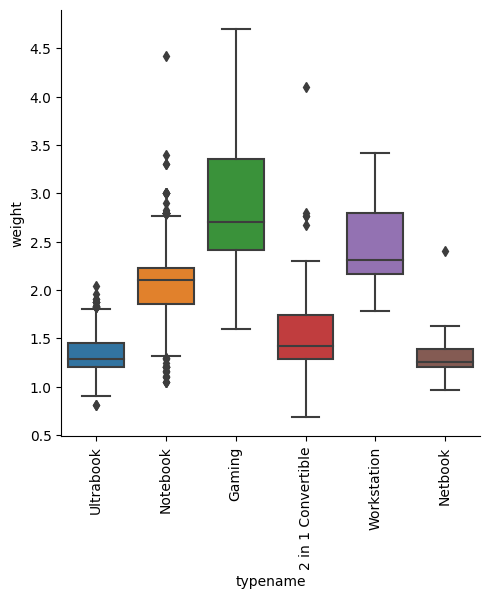

In [291]:
# typename vs weight.
sns.catplot(data = df, x = 'typename', y = 'weight', kind = 'box')
plt.xticks(rotation = 90)
plt.show()
# there are two outliers -- one in the - notebook and second one in the 2 in 1 convertible according to the weight.

In [292]:
df.loc[257,'weight'] = np.NaN

In [293]:
df.loc[443,'weight'] = np.NaN

In [294]:
df.loc[257,'weight'] = 1.1   # mode for the asus 2 in 1 convertible of 13.3 inches screen.
df.loc[443,'weight'] = 2.8   # mode for the dell notebook 17.3 inches -- 2.8kg.

In [295]:
df.loc[443]

company                                           Dell
typename                                      Notebook
inches                                            17.3
screenresolution           IPS Panel Full HD 1920x1080
ram                                                8.0
opsys                                          Windows
weight                                             2.8
price                                        109010.88
px_width                                          1920
px_height                                         1080
display_ips_panel                                 True
display_is_touch_screen                          False
cpu_brand                                        Intel
clock_speed                                        2.7
gpu_brand                                       Nvidia
ssd_capacity                                       0.0
hdd_capacity                                    1024.0
ssd_count                                            0
hdd_count 

In [296]:
# filling the weights as per the notebook type:
# 

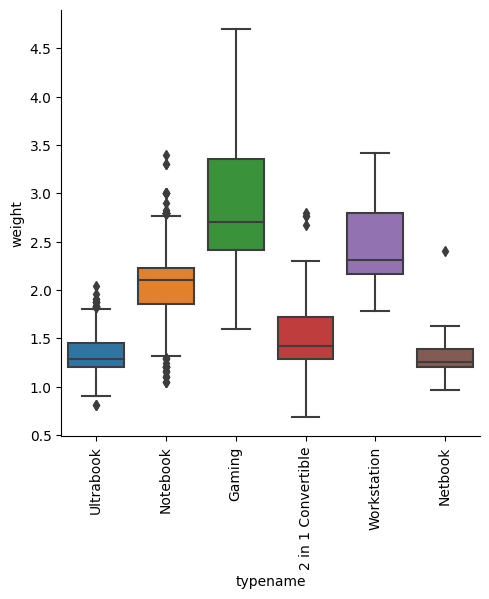

In [297]:
sns.catplot(data = df, x = 'typename', y = 'weight', kind = 'box')
plt.xticks(rotation = 90)
plt.show()
# the gaming laptops are the heaviest,
# and the workstations - rest other are around 1.5 to 2.5kg

In [298]:
# typename vs cpu_brand
# categorical vs categorical
pd.crosstab(index = df['cpu_brand'], columns = df['typename'])
# entire dataset has mostly intel chips - so intel is dominating among all formats - for dataset.

typename,2 in 1 Convertible,Gaming,Netbook,Notebook,Ultrabook,Workstation
cpu_brand,,,,,,
AMD,0,6,0,53,1,0
Intel,110,197,22,632,188,29
Samsung,1,0,0,0,0,0


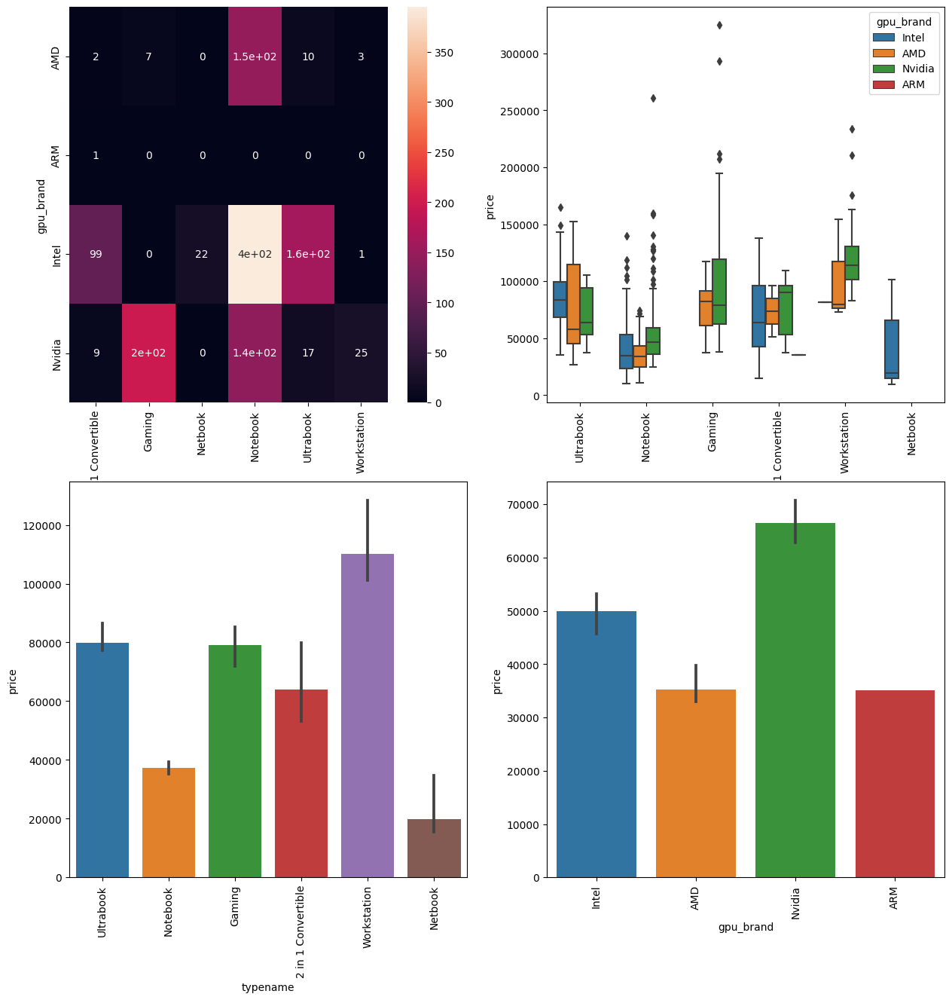

In [299]:
# typename vs gpu_brands:  -- with other column.
fig = plt.figure(figsize = (15,15))
ax1 = fig.add_subplot(2,2,1)
sns.heatmap(pd.crosstab(index = df['gpu_brand'], columns = df['typename']), annot = True, ax = ax1)
ax2 = fig.add_subplot(2,2,2)
sns.boxplot(data = df, x = 'typename', y = 'price', hue = 'gpu_brand', ax = ax2)
plt.xticks(rotation = 90)
ax3 = fig.add_subplot(2,2,3)
sns.barplot(data = df, x = 'typename', y = 'price', ax = ax3, estimator = 'median')
plt.xticks(rotation = 90)
ax4 = fig.add_subplot(2,2,4)
sns.barplot(data = df, x = 'gpu_brand', y = 'price', ax = ax4, estimator = 'median')
plt.xticks(rotation = 90)
plt.show()
# from the heatmap - we can see that gaming laptops uses the nvidia gpu and from the box plot of type vs price with gpu_brand
# the nvidia gpu - for gaming laptops are expensive.
# the notebooks uses the intel chips mostly followed by amd and then nividia gpus.
# and the intel gpus are cheper due to which the mean for entire - notebook type is lesser - bar plot.

# for the ultrabooks - which also include macs - the intel gpus are used -  and the median price is higher for this category as compared to the other
# significantly - due to which the median price of the intel gpu increases for the overall dataset.

# workstations have nvidia gpus - so costlier.
# for the 2 in 1 convertible lesser priced gpus are used mostly - but for some the nvidia gpu are use which makes the price higher.

# these ultrabooks are mostly apple macbooks in the dataset - due to which in the 4 plot the median price of intel gpu_brand

In [300]:
df[df['typename'] == 'Ultrabook'].groupby('gpu_brand')['price'].median()

gpu_brand
AMD       57818.9232
Intel     83596.3200
Nvidia    63563.0400
Name: price, dtype: float64

<Axes: xlabel='resolution_type', ylabel='typename'>

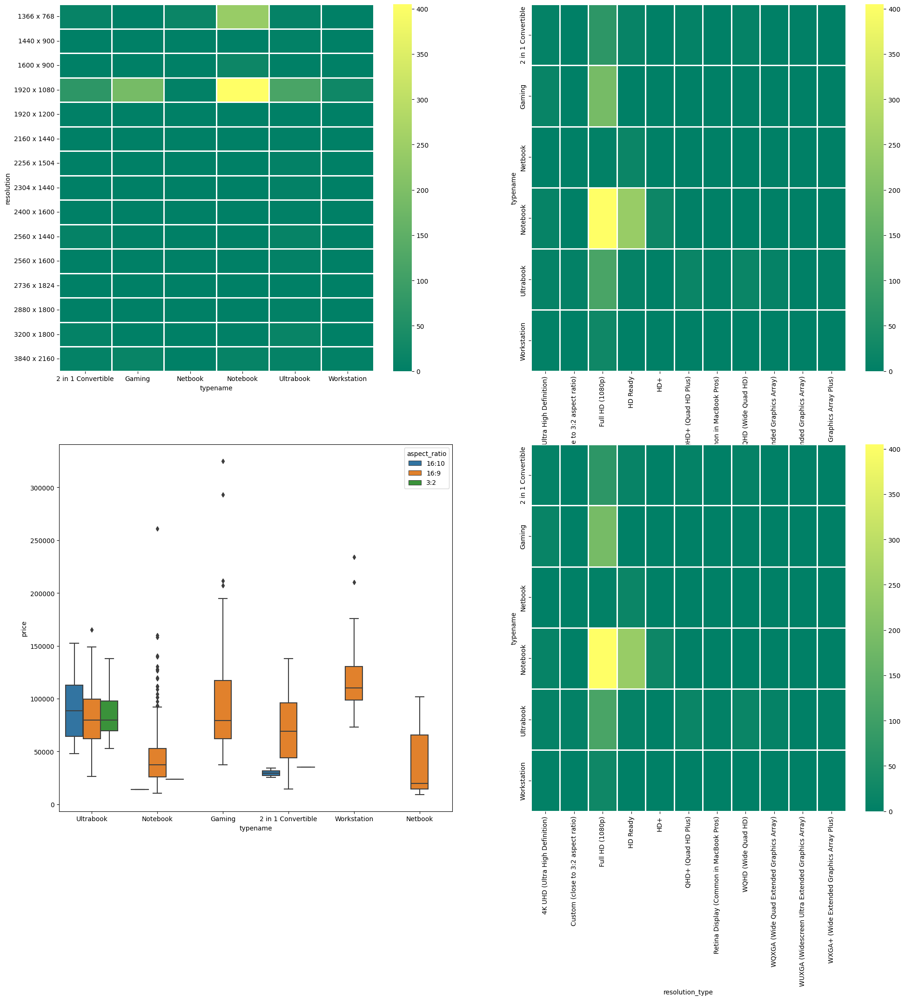

In [301]:
# typename vs screendetails.
fig = plt.figure(figsize = (24, 22.5))

# typename vs resolution
# catogorcial vs categorical
ax1 = fig.add_subplot(2,2,1)
sns.heatmap(pd.crosstab(index = df['resolution'], columns = df['typename']), cmap = 'summer', linewidth = 1.0, ax = ax1)

# typename vs resolution_type.
ax2 = fig.add_subplot(2,2,2)
sns.heatmap(pd.crosstab(columns = df['resolution_type'], index = df['typename']), cmap = 'summer', linewidth = 1.0, ax = ax2)

# typename vs aspect_ratio and price.
ax3 = fig.add_subplot(2,2,3)
sns.boxplot(data = df, x = 'typename', y = 'price', hue = 'aspect_ratio',ax = ax3)

# typename vs quality_rank. -- mid type most popular -- full hd or 1920 x 1080.
ax4 = fig.add_subplot(2,2,4)
sns.heatmap(pd.crosstab(columns = df['resolution_type'], index = df['typename']), cmap = 'summer', linewidth = 1.0, ax = ax4)

# among all the type -full hd 1920 X 1080 is the most popular display followed by the hd ready - 1366 X 768(for - notebooks)
# in ultrabook category the aspect ratio of 16:10 and 3:2 is present -  which is not present in any other category

(0.0, 64.0)

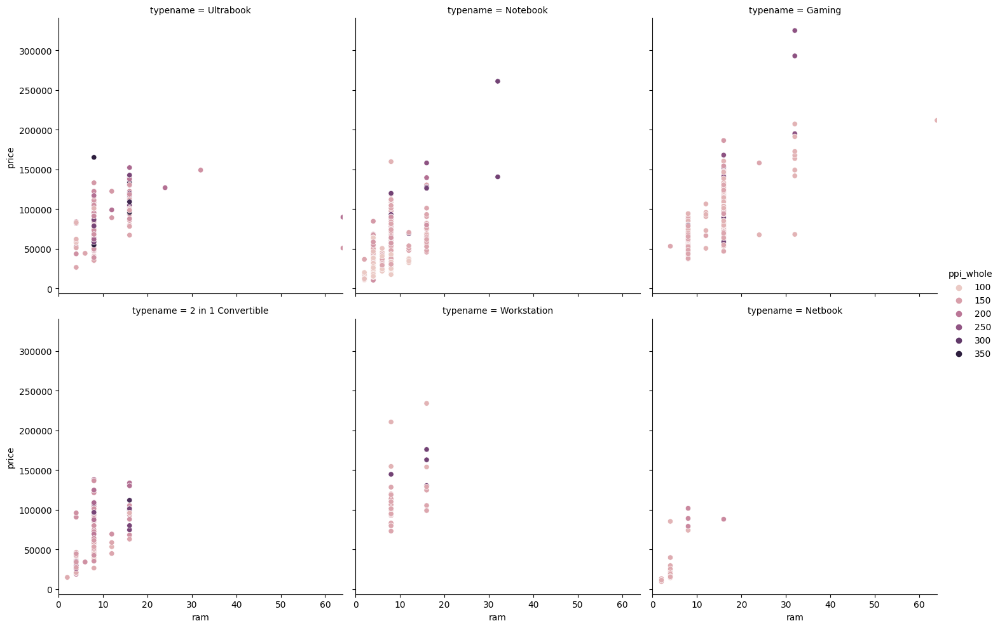

In [302]:
# typename vs ram
pd.crosstab(index = df['ram'], columns = df['typename'])
# most popular among all the ram type - 256 gb - across all the formats.
# higher ram is present in gaming, ultabooks and some notebooks.  
#- these notebook are premium notebooks with the core i7 processor and 
# screen are either full hd, quad hd , 4k ultra hd. -- some have high ppi but most are lowers.
# these higher ram ultrabooks have higher ppi and fullhd/uhd.

# at higher ram the screen quality and resolution are better so the price increases with the ram.

# ram increases - price increases the screen_quality increases as higher the ppi the better the screen_quality across all the types.
sns.relplot(data = df, x = 'ram', y = 'price', col = 'typename', hue = 'ppi_whole', col_wrap = 3)
plt.xlim(0,64)



In [303]:
df[(df['typename'] == 'Notebook') & (df['ram'] > 8)]

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details,ppi_whole,resolution,resolution_type,aspect_ratio,quality_rank
57,Dell,Notebook,17.3,Full HD 1920x1080,16.0,Windows,2.80,69210.7200,1920,1080,...,2048.0,1,1,0.0,Core i7 8550U,127.0,1920 x 1080,Full HD (1080p),16:9,Mid
88,HP,Notebook,13.3,Full HD 1920x1080,16.0,Windows,1.49,63776.1600,1920,1080,...,0.0,1,0,0.0,Core i7 8550U,166.0,1920 x 1080,Full HD (1080p),16:9,Mid
118,HP,Notebook,17.3,Full HD 1920x1080,16.0,Windows,2.50,67718.8800,1920,1080,...,0.0,1,0,0.0,Core i7 8550U,127.0,1920 x 1080,Full HD (1080p),16:9,Mid
122,Dell,Notebook,17.3,Full HD 1920x1080,16.0,Windows,2.80,74378.8800,1920,1080,...,2048.0,1,1,0.0,Core i7 8550U,127.0,1920 x 1080,Full HD (1080p),16:9,Mid
173,Dell,Notebook,15.6,Full HD 1920x1080,16.0,Linux,2.02,55890.7200,1920,1080,...,2048.0,1,1,0.0,Core i7 8550U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
178,Dell,Notebook,17.3,Full HD / Touchscreen 1920x1080,16.0,Windows,2.77,82530.7200,1920,1080,...,0.0,1,0,0.0,Core i7 8550U,127.0,1920 x 1080,Full HD (1080p),16:9,Mid
179,Dell,Notebook,15.6,4K Ultra HD / Touchscreen 3840x2160,16.0,Windows,2.06,127712.1600,3840,2160,...,0.0,1,0,0.0,Core i7 7700HQ,282.0,3840 x 2160,4K UHD (Ultra High Definition),16:9,Very High
217,Dell,Notebook,15.6,Full HD / Touchscreen 1920x1080,16.0,Windows,2.30,45768.0528,1920,1080,...,1024.0,0,1,0.0,Core i7 7500U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
226,Dell,Notebook,15.6,Full HD 1920x1080,16.0,Linux,2.36,47898.7200,1920,1080,...,0.0,1,0,0.0,Core i7 7500U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
248,HP,Notebook,17.3,IPS Panel Full HD 1920x1080,16.0,Windows,2.90,56423.5200,1920,1080,...,1024.0,0,1,0.0,Core i7 8550U,127.0,1920 x 1080,Full HD (1080p),16:9,Mid


In [304]:
df[(df['typename'] == 'Ultrabook') & (df['ram'] > 8)]

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details,ppi_whole,resolution,resolution_type,aspect_ratio,quality_rank
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,16.0,Mac Os,1.83,135195.3360,2880,1800,...,0.0,1,0,0.0,Core i7,221.0,2880 x 1800,Retina Display (Common in MacBook Pros),16:10,Very High
6,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,16.0,Mac Os,2.04,114017.6016,2880,1800,...,0.0,1,0,0.0,Core i7,221.0,2880 x 1800,Retina Display (Common in MacBook Pros),16:10,Very High
8,Asus,Ultrabook,14.0,Full HD 1920x1080,16.0,Windows,1.30,79653.6000,1920,1080,...,0.0,1,0,0.0,Core i7 8550U,157.0,1920 x 1080,Full HD (1080p),16:9,Mid
12,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,16.0,Mac Os,1.83,130001.6016,2880,1800,...,0.0,1,0,0.0,Core i7,221.0,2880 x 1800,Retina Display (Common in MacBook Pros),16:10,Very High
17,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,16.0,Mac Os,1.83,152274.2400,2880,1800,...,0.0,1,0,0.0,Core i7,221.0,2880 x 1800,Retina Display (Common in MacBook Pros),16:10,Very High
32,Dell,Ultrabook,13.3,Touchscreen / Quad HD+ 3200x1800,16.0,Windows,1.20,99580.3200,3200,1800,...,0.0,1,0,0.0,Core i7 8550U,276.0,3200 x 1800,QHD+ (Quad HD Plus),16:9,High
62,Asus,Ultrabook,15.6,Full HD 1920x1080,16.0,Windows,1.80,105654.2400,1920,1080,...,0.0,1,0,0.0,Core i7 7700HQ,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
67,Dell,Ultrabook,13.3,IPS Panel Full HD 1920x1080,64.0,Windows,1.40,50882.4000,1920,1080,...,0.0,1,0,0.0,Core i7 8550U,166.0,1920 x 1080,Full HD (1080p),16:9,Mid
106,Asus,Ultrabook,15.6,Full HD 1920x1080,16.0,Windows,1.50,67239.3600,1920,1080,...,1024.0,1,1,0.0,Core i7 8550U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
289,Asus,Ultrabook,15.6,Full HD 1920x1080,16.0,Windows,1.63,78215.0400,1920,1080,...,0.0,1,0,0.0,Core i7 7500U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid


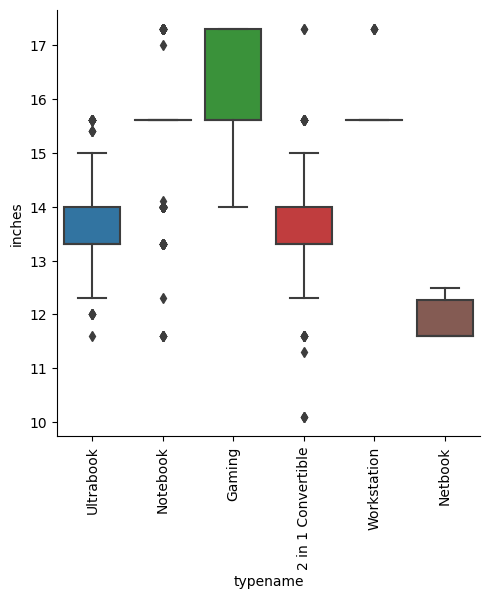

In [305]:
# typename vs inches
sns.catplot(data = df, x = 'typename', y = 'inches', kind = 'box')
plt.xticks(rotation = 90)
plt.show()
# most of the gaming laptops are from the 15.6 to 17.3 inches.
# netbooks are smaller in size.
# workstations are moslty of 15.6 inches.
# notebooks comes in various size - predominantly - 15.6 inches.

In [306]:
df[df['display_ips_panel'] == True].groupby('typename').agg({'price' : 'median'}).merge(df[df['display_ips_panel'] == False].groupby('typename').agg({'price' : 'median'}) , left_index = True, right_index = True, suffixes = ['_True','_False'])

,price_True,price_False
typename,,
2 in 1 Convertible,66546.72,62817.1200
Gaming,77202.72,79375.7448
Netbook,24189.12,19314.0000
Notebook,50562.72,34525.4400
Ultrabook,84395.52,79866.7200
Workstation,124568.64,101418.2136


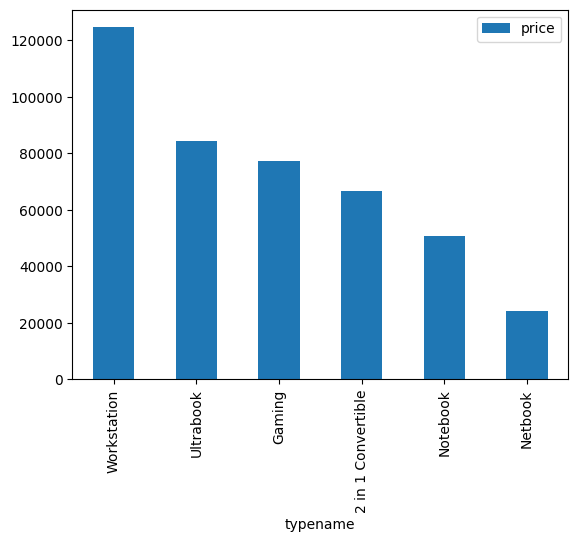

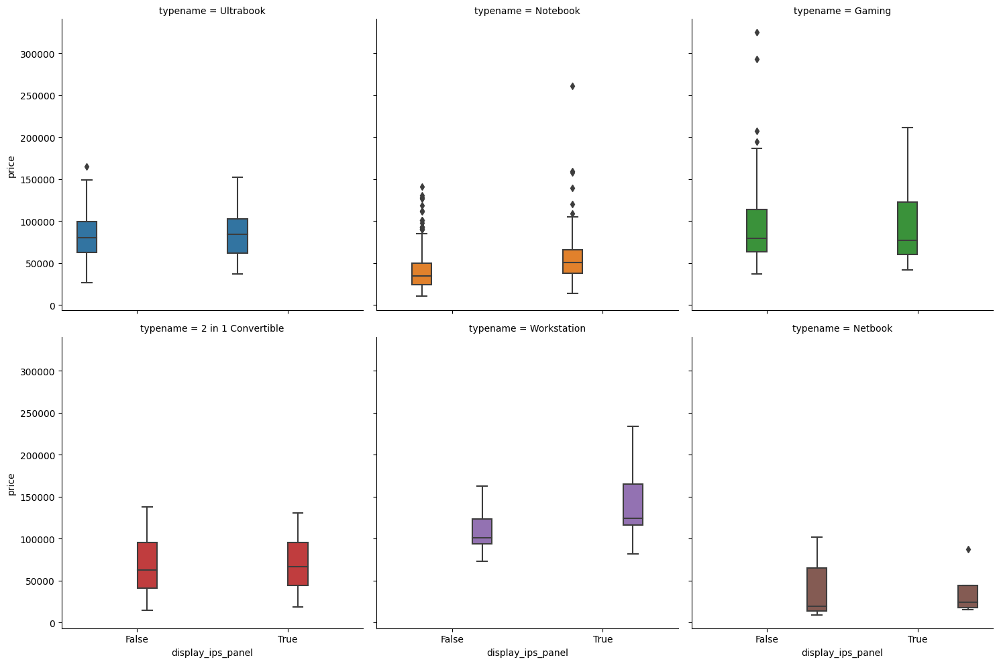

In [307]:
# typename vs display_ips_panel
pd.crosstab(columns = df['typename'], index = df['display_ips_panel'])
# in general the device doesnt have the ips panel.
# the higer price devices have the ips panel.
df[df['display_ips_panel'] == True].groupby('typename').agg({'price': 'median'}).sort_values(by = 'price', ascending = False).plot(kind = 'bar')
sns.catplot(data = df, x = 'display_ips_panel', y = 'price', kind = 'box',hue = 'typename', col = 'typename', col_wrap = 3)

# from the above table and the graphs below - we can see that for most of the dtypes when the display is ips panel then the median price is hihger.
# this difference in price is even more significant in the case of the workstation,gaming,notebook.
# the price , typename and display_ips_panel - they all are related.

In [308]:
df.groupby('typename').agg({'price': ['mean','median']})
# see the workstation laptops are much higher than the other categories.

price             
                             mean       median
typename                                      
2 in 1 Convertible   69063.172800   63882.7200
Gaming               92204.328662   79215.1056
Netbook              37043.888727   19713.6000
Notebook             42086.544028   37242.7200
Ultrabook            83392.545143   79920.0000
Workstation         121497.525683  110017.8720

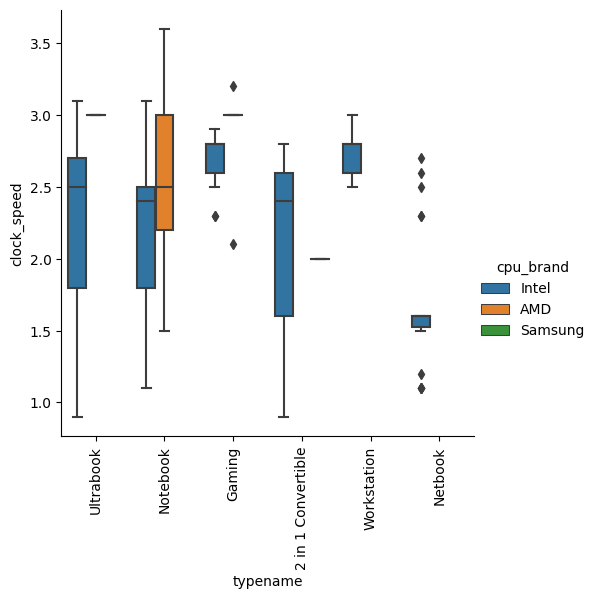

In [309]:
# typename vs clock_speed
# categorical vs numerical analysis.

sns.catplot(data = df, x = 'typename', y = 'clock_speed', kind = 'box', hue = 'cpu_brand')
plt.xticks(rotation = 90)


plt.xticks(rotation = 90)
plt.show()
# in general the devices across all the datatypes are available in various clock speeds  - 
# but for the workstation type laptops the clock speed is higher than rest of the data.
# the gaming also follows the same trend --  higher clock speed then rest of the data.

# the notebooks - offer variety of clock speeds but - the notebooks with the intel chips - offer lower clock_speeds as compared to the notebooks
# with the amd chip set.

In [310]:
# typename,ssd_capacity and typename , hdd_capacity.
# categorical vs categorical analysis.
pd.crosstab(index = df['typename'], columns = df['ssd_capacity'])
# 256ssd most popular - mostly present in notebooks and ultrabooks.
pd.crosstab(index = df['typename'],columns = df['hdd_capacity'])
# 1 tb hdd most popular -  mostly present in notebooks.
# second most popular - is 512 gb varient - used in the notebooks mostly.

hdd_capacity,0.0,32.0,128.0,512.0,1024.0,2048.0
typename,,,,,,
2 in 1 Convertible,97,0,0,3,8,3
Gaming,30,0,0,0,168,5
Netbook,22,0,0,0,0,0
Notebook,327,1,1,115,218,23
Ultrabook,184,0,0,3,2,0
Workstation,22,0,0,3,4,0


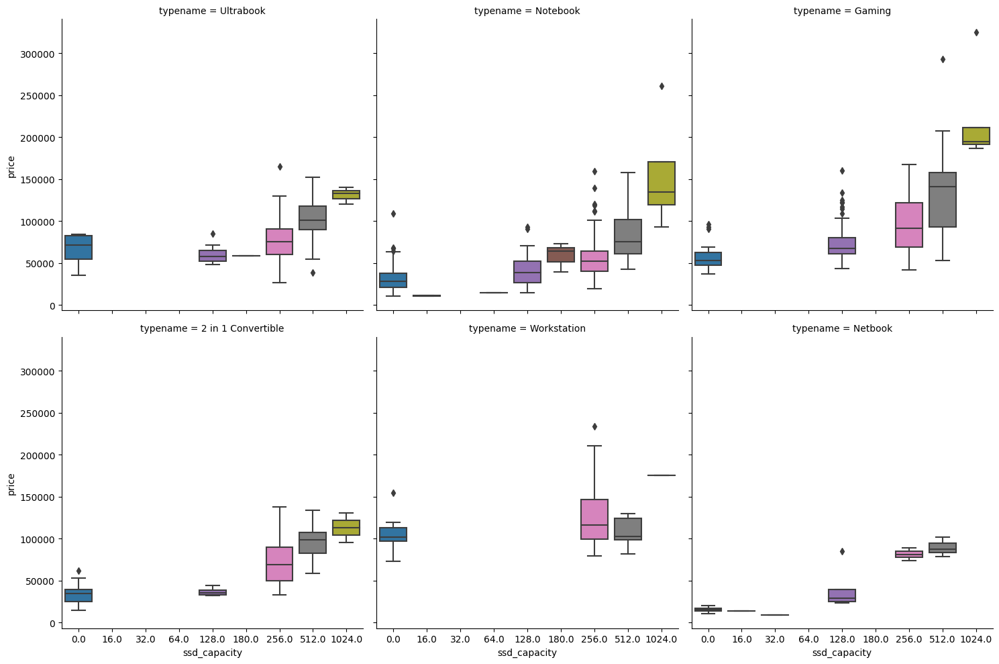

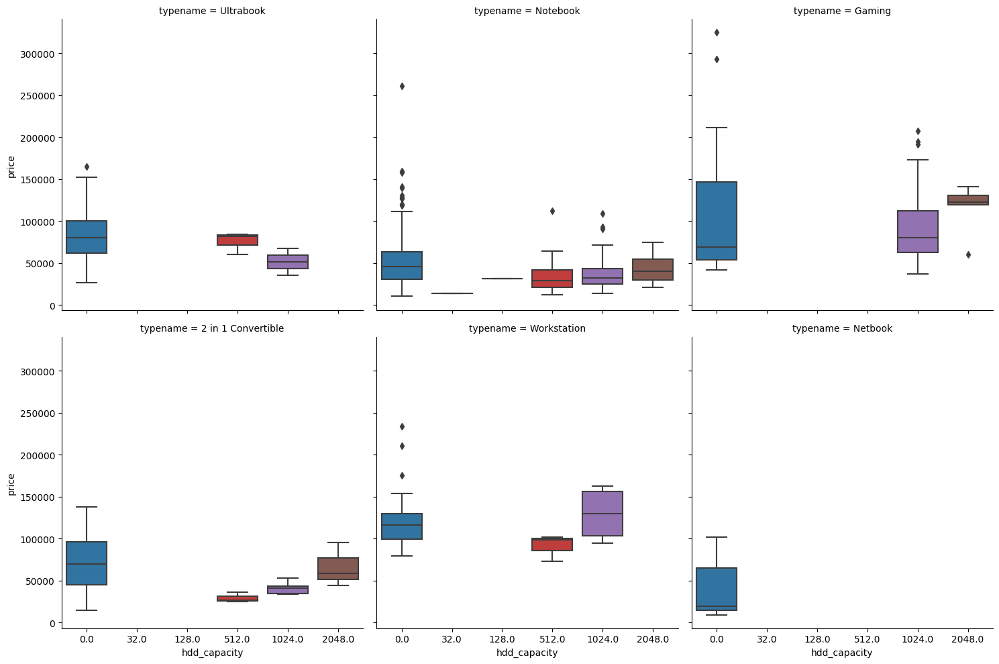

In [311]:
sns.catplot(data = df, x = 'ssd_capacity', y = 'price', kind = 'box', col = 'typename', col_wrap = 3)
# for every category - as the ssd_capacity increases the price increases.
sns.catplot(data = df, x = 'hdd_capacity', y = 'price', kind = 'box', col = 'typename', col_wrap = 3)
# general trend price tends to increase as the hdd_capacity increases - but for the ultrabooks the price has decreased.
# only 2 1 tb hdd laptops present in the dataset for ultrabook - and price of one of them is very low - so the median - reduces.

In [312]:
df[(df['typename'] == 'Ultrabook') & (df['hdd_capacity'] >= 512)][['ssd_capacity','hdd_capacity','hdd_count','ssd_count','price','cpu_brand','clock_speed','gpu_brand','ram','company','resolution']]

,ssd_capacity,hdd_capacity,hdd_count,ssd_count,price,cpu_brand,clock_speed,gpu_brand,ram,company,resolution
106,256.0,1024.0,1,1,67239.360,Intel,1.8,Nvidia,16.0,Asus,1920 x 1080
338,0.0,1024.0,1,0,35324.640,Intel,1.6,AMD,8.0,Dell,1920 x 1080
902,0.0,512.0,1,0,84129.120,Intel,2.3,Intel,4.0,HP,1920 x 1080
979,0.0,512.0,1,0,81997.920,Intel,2.5,Intel,4.0,HP,1920 x 1080
1067,0.0,512.0,1,0,60480.792,Intel,2.3,Intel,4.0,Dell,1366 x 768


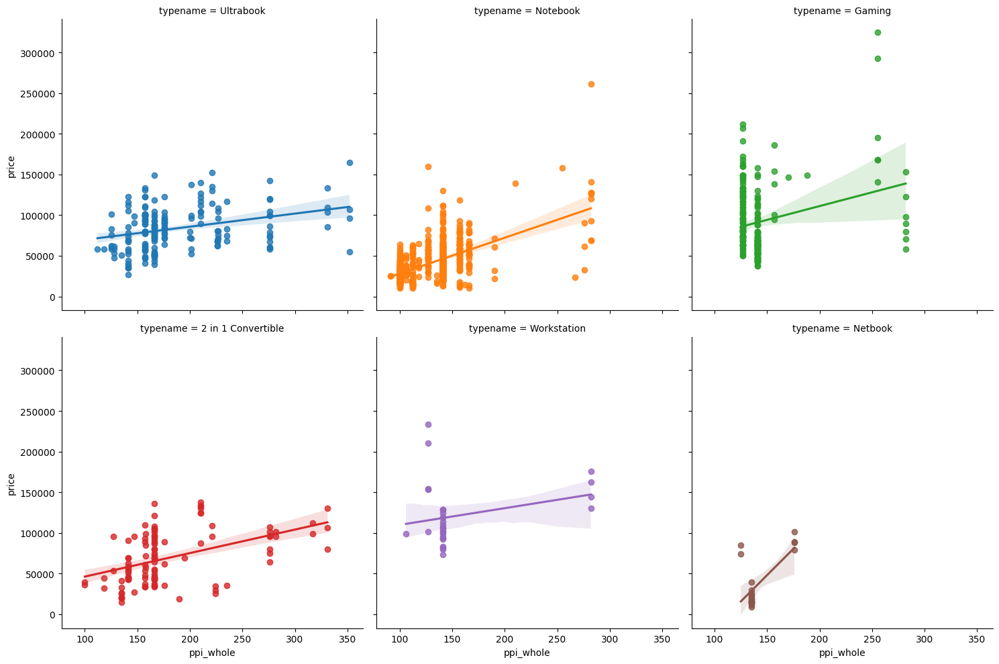

In [313]:
# typename vs ppi_whole and price.
# categorical vs numerical data.
sns.lmplot(data = df, x = 'ppi_whole', y = 'price', hue = 'typename', col = 'typename', col_wrap = 3)
# as ppi increases the price increases across - across all the types of laptops.

In [314]:
# opsys and cpu_brand
print(pd.crosstab(index = df['opsys'], columns = df['cpu_brand']))
# mostly windows and intel combination.
df.groupby(['opsys','cpu_brand']).agg({'price':['mean','median']})
# macos and intel combination costs the most - because the price is higher for the apple products.

cpu_brand  AMD  Intel  Samsung
opsys                         
Android      0      1        0
Chrome OS    0     26        1
Linux        0     57        0
Mac Os       0     21        0
No OS        2     61        0
Windows     58   1012        0


price            
                             mean      median
opsys     cpu_brand                          
Android   Intel      29250.720000  29250.7200
Chrome OS Intel      29278.999385  19553.7600
          Samsung    35111.520000  35111.5200
Linux     Intel      33182.494232  31409.6256
Mac Os    Intel      83340.499886  71378.6832
No OS     AMD        15104.880000  15104.8800
          Intel      32443.362413  28185.1200
Windows   AMD        30399.574593  25251.7896
          Intel      66277.430139  58554.7200

In [315]:
# opsys vs gpu_brand.
print(pd.crosstab(index = df['opsys'], columns = df['gpu_brand']))
# most common - windows and intel gpu. followed by windows and nividia.
df.groupby(['opsys','gpu_brand']).agg({'price':['mean','median']}).sort_values(by = [('price','median')], ascending = False)
# macos and amd - costliest.  -- 3 such laptops present in dataset: with very high ppi,i7 processor.
# followed by windows and nvidia.

gpu_brand  AMD  ARM  Intel  Nvidia
opsys                             
Android      0    0      1       0
Chrome OS    0    1     26       0
Linux       19    0     25      13
Mac Os       3    0     18       0
No OS        6    0     30      27
Windows    142    0    579     349


price             
                              mean       median
opsys     gpu_brand                            
Mac Os    AMD        139157.059200  135195.3360
Windows   Nvidia      83755.668419   69929.4672
Mac Os    Intel       74037.740000   68704.5600
Windows   Intel       58391.354686   53386.5600
Linux     Nvidia      42996.960000   45074.8800
No OS     Nvidia      43799.830400   41505.1200
Linux     AMD         37245.327916   36089.2080
Windows   AMD         40821.211166   35218.0800
Chrome OS ARM         35111.520000   35111.5200
Android   Intel       29250.720000   29250.7200
No OS     Intel       22561.202880   22577.4000
          AMD         24970.560000   22564.0800
Linux     Intel       24991.218432   20965.1472
Chrome OS Intel       29278.999385   19553.7600

In [316]:
df[(df['opsys'] == 'Mac Os') & (df['gpu_brand'] == 'AMD')]

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details,ppi_whole,resolution,resolution_type,aspect_ratio,quality_rank
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,16.0,Mac Os,1.83,135195.3360,2880,1800,...,0.0,1,0,0.0,Core i7,221.0,2880 x 1800,Retina Display (Common in MacBook Pros),16:10,Very High
12,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,16.0,Mac Os,1.83,130001.6016,2880,1800,...,0.0,1,0,0.0,Core i7,221.0,2880 x 1800,Retina Display (Common in MacBook Pros),16:10,Very High
17,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,16.0,Mac Os,1.83,152274.2400,2880,1800,...,0.0,1,0,0.0,Core i7,221.0,2880 x 1800,Retina Display (Common in MacBook Pros),16:10,Very High


<Axes: xlabel='opsys', ylabel='aspect_ratio'>

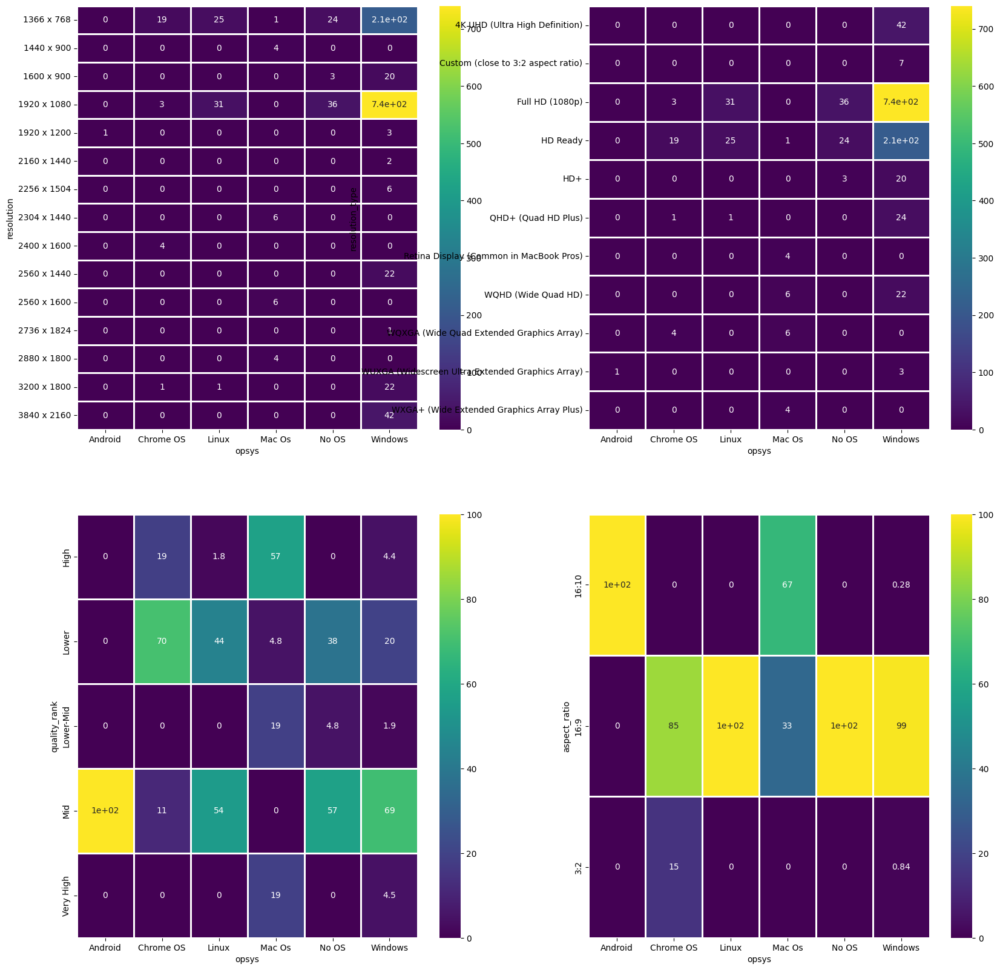

In [317]:
# opsys vs screen_details
# opsys vs resolution
fig = plt.figure(figsize = (20,20))
ax1 = fig.add_subplot(2,2,1)
sns.heatmap(pd.crosstab(columns = df['opsys'], index= df['resolution']), cmap = 'viridis', linewidth = 1, annot = True, ax = ax1)

# opsys vs resolution_type
ax2 = fig.add_subplot(2,2,2)
sns.heatmap(pd.crosstab(columns = df['opsys'], index= df['resolution_type']), cmap = 'viridis', linewidth = 1, annot = True, ax = ax2)

# opsys vs quality_rank
ax3 = fig.add_subplot(2,2,3)
sns.heatmap(pd.crosstab(columns = df['opsys'], index= df['quality_rank'], normalize = 'columns')*100, cmap = 'viridis', linewidth = 1, annot = True, ax = ax3)

ax4 = fig.add_subplot(2,2,4)
sns.heatmap(pd.crosstab(columns = df['opsys'], index= df['aspect_ratio'], normalize = 'columns')*100, cmap = 'viridis', linewidth = 1, annot = True, ax = ax4)

# windows mostly uses the mid(69%) and lower quality screens(20%) so price are lower - but also has some higher quality screens.(4%) - which combined with higher specs leads to some high prices.
# mac uses 57% high quality screen along with 19% very high quality screens so the price of mac is higher - generally.
# Mac OS prefers 16:10, - productivity (more vertical space).
# Chrome OS and Mac OS offer 3:2 screens, good for reading/coding.
# Windows devices mostly stick to 16:9, which is standard for general-use and entertainment.
# Chrome OS devices target the budget sector, mainly HD Ready and Full HD, rarely going premium.

<Axes: xlabel='opsys', ylabel='inches'>

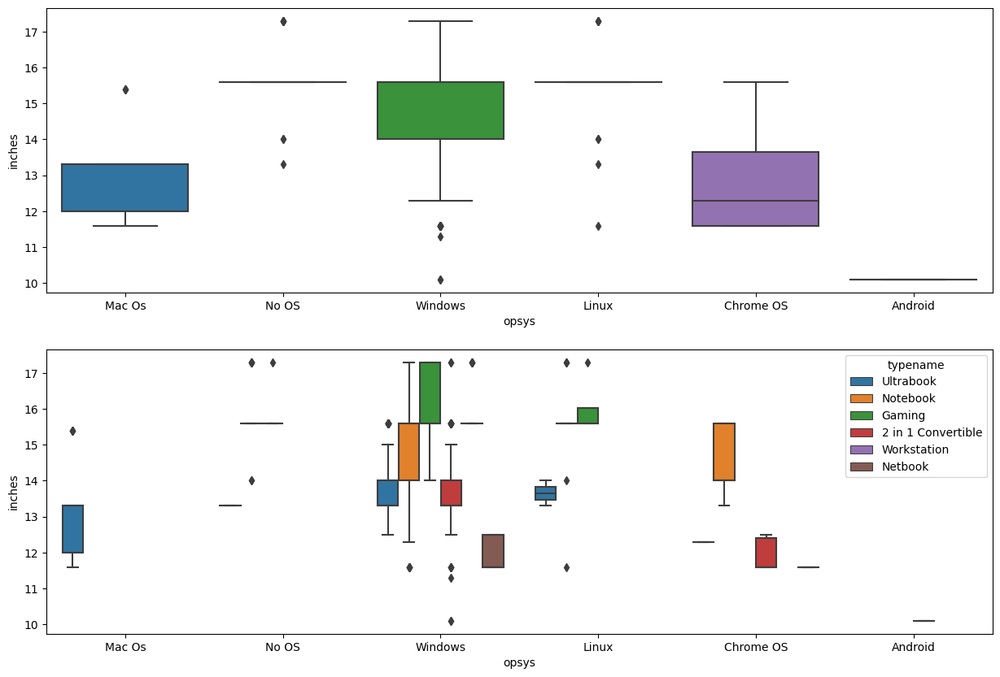

In [318]:
# opsys vs inches.
fig = plt.figure(figsize = (15,10))
ax1 = fig.add_subplot(2,1,1)
sns.boxplot(data = df, x = 'opsys', y = 'inches', ax = ax1)

ax2 = fig.add_subplot(2,1,2)
sns.boxplot(data = df, x = 'opsys', y = 'inches', ax = ax2, hue = 'typename')

# mostly windows and linux - laptops - offer the 17.3 inches size.-- mostly for the special purpose - like workstation, gaming. -- got from second graph.
# Mac OS laptops are generally consistent in screen size, focusing on 13 to 15 inches, typical of Ultrabooks targeting portability and premium design.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


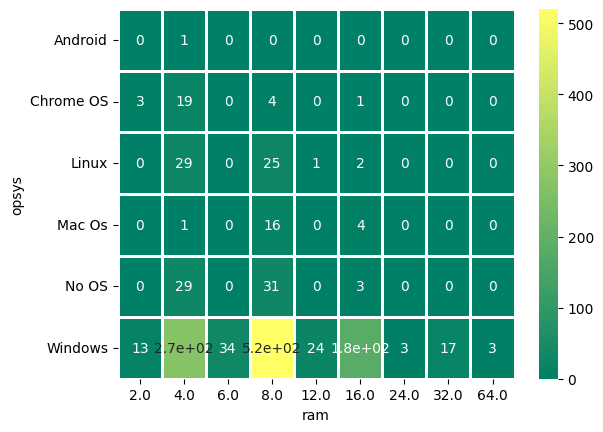

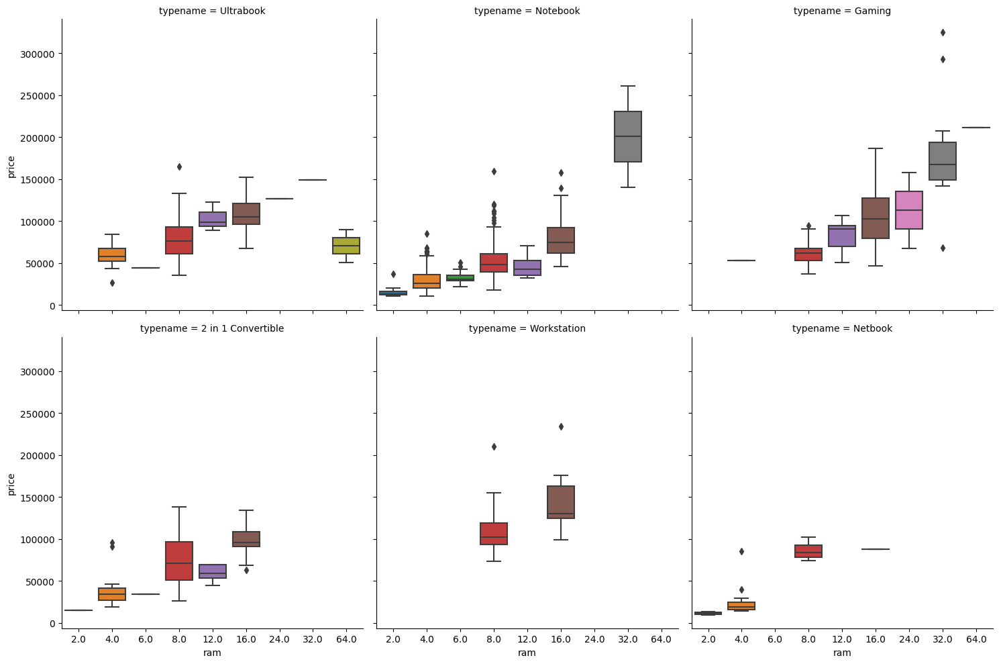

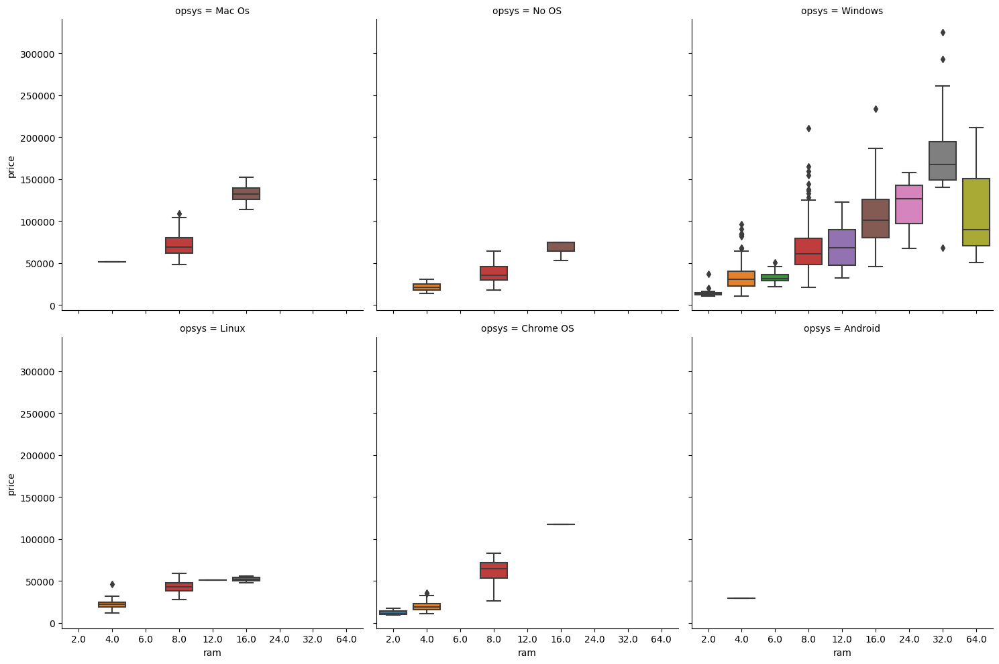

In [319]:
# opsys vs ram
sns.heatmap(pd.crosstab(index = df['opsys'], columns = df['ram']), annot = True, cmap = 'summer', linewidth = 1)
sns.catplot(data = df, x = 'ram', y = 'price', kind = 'box', col = 'typename', col_wrap = 3) 
# as ram increases price increases across - all the categories of opsys and.
# in general also as the ram increases the price increases.
sns.catplot(data = df, x = 'ram', y = 'price', kind = 'box', col = 'opsys', col_wrap = 3)

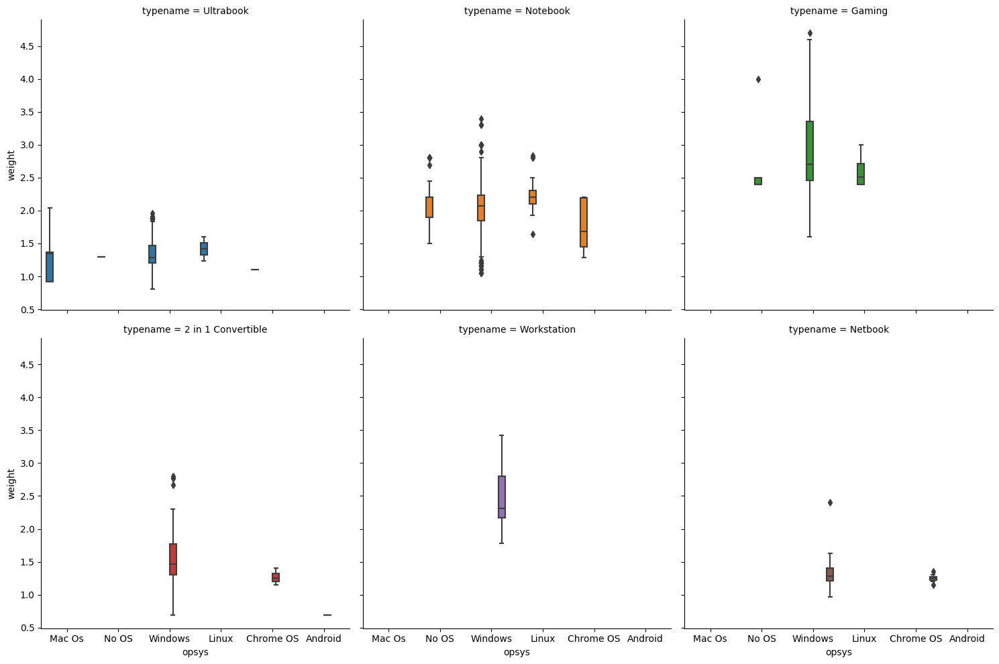

In [320]:
# opsys vs weight
# categorical vs numerical
sns.catplot(data = df, x = 'opsys', y = 'weight', kind = 'box', hue = 'typename',col = 'typename', col_wrap = 3)
# ultrabooks of all opsys generally lighter.
# notebooks of all opsys types are around 2 kgs. - while for chrome os the weight is slightly below 2kg.
# gaming laptops are heavier - and mostly comes with windows opsys.
# workstation - mostly linux and windows and heavier.
# convertible laptops and netbooks are lightest.

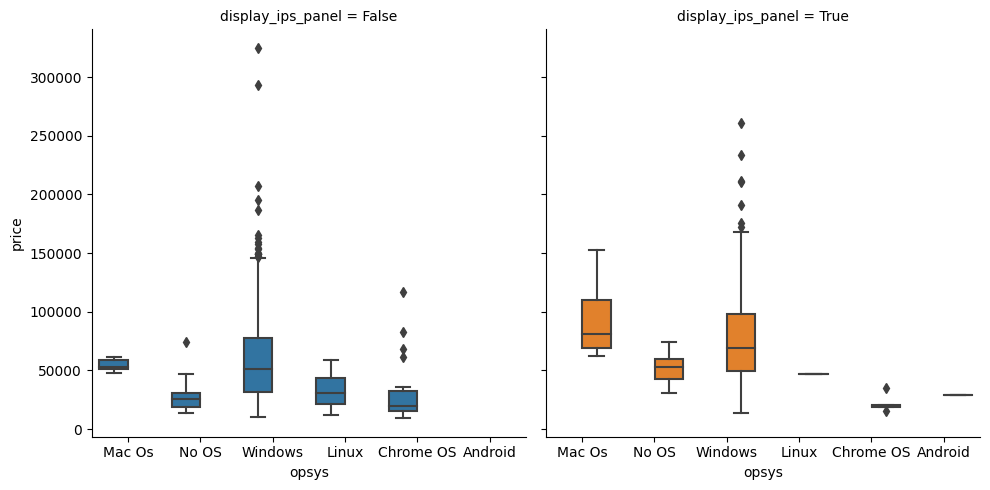

In [321]:
# opsys vs display_ips_panel.
pd.crosstab(index = df['display_ips_panel'], columns = df['opsys'])

# we know that the ips panel - leads to increases price.
sns.catplot(data = df , x = 'opsys', y = 'price', hue = 'display_ips_panel', kind = 'box', col = 'display_ips_panel')
# across all the os categories if ips panel is present the prices are higher.

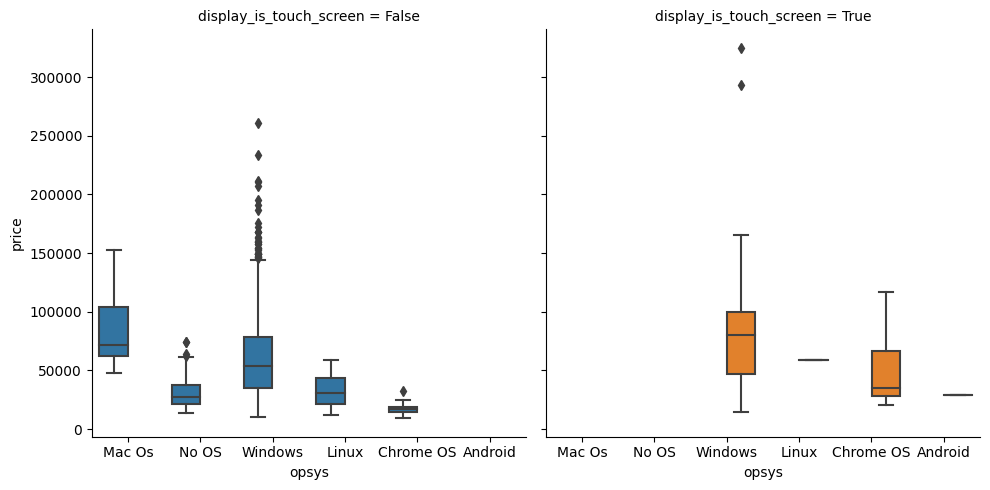

In [322]:
sns.catplot(data = df , x = 'opsys', y = 'price', hue = 'display_is_touch_screen', kind = 'box', col = 'display_is_touch_screen')
# for windows if touch screen is present the prices are higher.
# for chromos if touch screen is present the prices are higher.
# even for linux.

In [323]:
pd.crosstab(index = df['opsys'], columns = df['resolution_type'], normalize = 'columns') * 100

resolution_type,4K UHD (Ultra High Definition),Custom (close to 3:2 aspect ratio),Full HD (1080p),HD Ready,HD+,QHD+ (Quad HD Plus),Retina Display (Common in MacBook Pros),WQHD (Wide Quad HD),WQXGA (Wide Quad Extended Graphics Array),WUXGA (Widescreen Ultra Extended Graphics Array),WXGA+ (Wide Extended Graphics Array Plus)
opsys,,,,,,,,,,,
Android,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,25.0,0.0
Chrome OS,0.0,0.0,0.370370,6.761566,0.000000,3.846154,0.0,0.000000,40.0,0.0,0.0
Linux,0.0,0.0,3.827160,8.896797,0.000000,3.846154,0.0,0.000000,0.0,0.0,0.0
Mac Os,0.0,0.0,0.000000,0.355872,0.000000,0.000000,100.0,21.428571,60.0,0.0,100.0
No OS,0.0,0.0,4.444444,8.540925,13.043478,0.000000,0.0,0.000000,0.0,0.0,0.0
Windows,100.0,100.0,91.358025,75.444840,86.956522,92.307692,0.0,78.571429,0.0,75.0,0.0


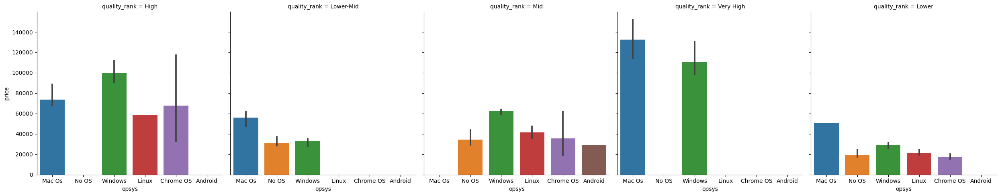

In [324]:
# opsys vs quality_rank vs price.    
sns.catplot(data = df, x = 'opsys', y = 'price', col = 'quality_rank', kind = 'bar', estimator = 'median')
# not a direct relation in the opsys and screen_quality 
# except for the mac_os - the screen quality is high/very high - so higher price.

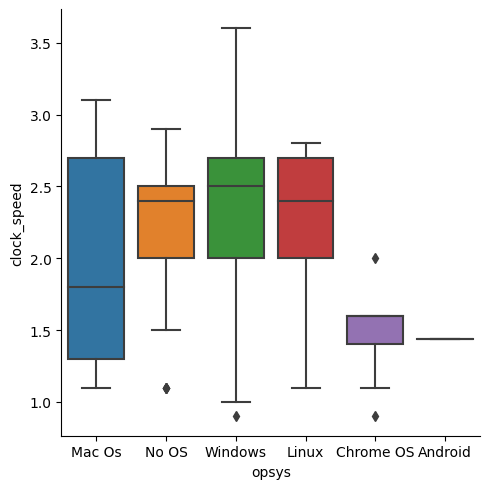

In [325]:
# opsys vs clock_speed.
# categorical vs numerical  --  they technically dont depend on each other.
sns.catplot(data = df, x = 'opsys', y = 'clock_speed', kind = 'box')

In [326]:
# opsys vs ssd_capacity.
# cateogorical vs categorical
pd.crosstab(index = df['opsys'], columns = df['ssd_capacity'])

# windows 256gb ssd  most common choice
# mac comes in 256 gb and 512 gb ssd.
# linux devices as the os itself is lighter and faster and used for specific purposes - so most of linux devices dont have ssd.
# if ssd is present  for linux then its mostly - 256 gb or 512gb.
# chrome os devices - most of them have no ssd.

ssd_capacity,0.0,16.0,32.0,64.0,128.0,180.0,256.0,512.0,1024.0
opsys,,,,,,,,,
Android,1,0,0,0,0,0,0,0,0
Chrome OS,20,3,1,0,1,0,1,1,0
Linux,38,0,0,0,3,0,16,0,0
Mac Os,0,0,0,0,3,0,11,7,0
No OS,40,0,0,0,7,0,14,2,0
Windows,316,0,0,1,156,4,454,124,15


In [327]:
# opsys vs hdd_capacity.
pd.crosstab(index = df['opsys'], columns = df['hdd_capacity'])
# linux devices mostly comes with a 1 TB HDD
# if hdd is present with the windows devices then - it's usually 1TB and sometimes 512gb - 2TB is also possible but few in dataset.
# chrome_os devices- most of them have no hdd.
# mac devices - doesnt have hdd for this dataset.

hdd_capacity,0.0,32.0,128.0,512.0,1024.0,2048.0
opsys,,,,,,
Android,1,0,0,0,0,0
Chrome OS,27,0,0,0,0,0
Linux,16,0,0,9,31,1
Mac Os,21,0,0,0,0,0
No OS,19,0,0,12,28,4
Windows,598,1,1,103,341,26


In [328]:
# opsys vs flash_storage.
pd.crosstab(index = df['opsys'], columns = df['flash_storage'])
# most of the chrome_os devices have flash_storage.
# windows , linux and other os - devices dont have flash storage. they have ssd/hdd.

flash_storage,0.0,16.0,32.0,64.0
opsys,,,,
Android,0,0,0,1
Chrome OS,7,7,10,3
Linux,57,0,0,0
Mac Os,21,0,0,0
No OS,63,0,0,0
Windows,1036,0,25,9


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When groupi

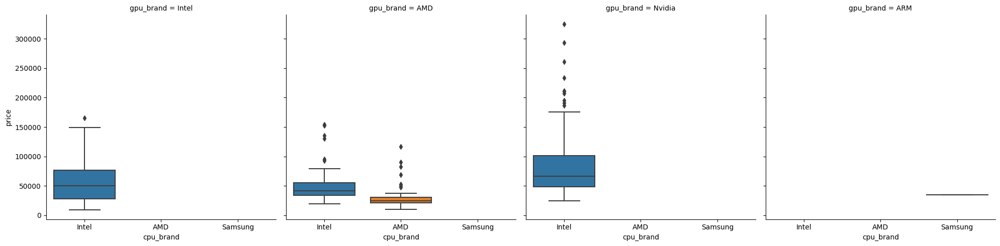

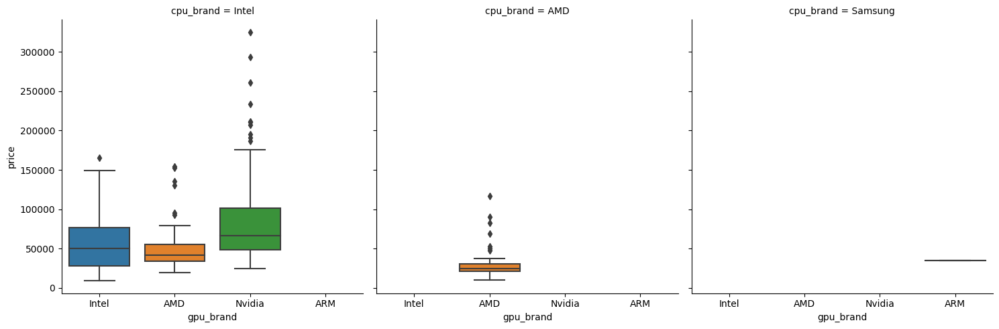

In [329]:
# cpu_brand vs gpu_brand vs price.
sns.catplot(data = df, x = 'cpu_brand', y = 'price', col = 'gpu_brand', kind = 'box')
# when nvidia gpu are use and the intel cpu are used the price is generally higher.
sns.catplot(data = df, x = 'gpu_brand', y = 'price', col = 'cpu_brand', kind = 'box')
# for the amd cpu and amd gpu - price tends to be lower but some higher priced devices are also present.

In [330]:
# lets find the reasons why - cpu - intel, gpu - nvidia - price is higher. -- so better ppi,ram and gaming/notebook/workstation - so higher prices.
df[(df['cpu_brand'] == 'Intel') & (df['gpu_brand'] == 'Nvidia')].groupby('ppi_whole').size().sort_values(ascending = False) 
# significant amount of higher ppi devices are present and they tend to be expensive.

ppi_whole
141.0    198
127.0    109
282.0     21
157.0     20
106.0     12
100.0     11
255.0      7
166.0      4
91.0       2
147.0      1
188.0      1
170.0      1
210.0      1
190.0      1
dtype: int64

In [331]:
df[(df['cpu_brand'] == 'Intel') & (df['gpu_brand'] == 'Nvidia')].groupby('ram').size().sort_values(ascending = False) 
# higher ram is also present.
df[(df['cpu_brand'] == 'Intel') & (df['gpu_brand'] == 'Nvidia')].groupby('typename').size().sort_values(ascending = False) 
# mostly gaming , notebooks and workstation.

typename
Gaming                196
Notebook              142
Workstation            25
Ultrabook              17
2 in 1 Convertible      9
dtype: int64

In [332]:
# cpu_brand vs resolution/resolution_type
pd.crosstab(index = df['cpu_brand'], columns = df['resolution_type'])
# most of the devices in dataset have intel cpus.
# the better and higher quality screen/display all have the intel cpu.
# amd cpus are present for some full hd and hd ready. - screens.

resolution_type,4K UHD (Ultra High Definition),Custom (close to 3:2 aspect ratio),Full HD (1080p),HD Ready,HD+,QHD+ (Quad HD Plus),Retina Display (Common in MacBook Pros),WQHD (Wide Quad HD),WQXGA (Wide Quad Extended Graphics Array),WUXGA (Widescreen Ultra Extended Graphics Array),WXGA+ (Wide Extended Graphics Array Plus)
cpu_brand,,,,,,,,,,,
AMD,0,0,30,26,4,0,0,0,0,0,0
Intel,42,7,780,255,19,26,4,28,9,4,4
Samsung,0,0,0,0,0,0,0,0,1,0,0


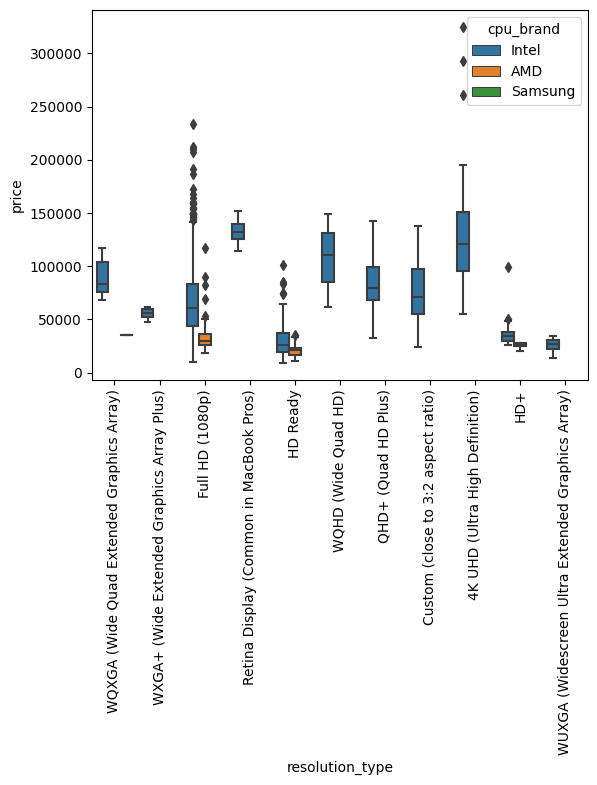

In [333]:
sns.boxplot(data = df , x = 'resolution_type', y = 'price',hue = 'cpu_brand')
plt.xticks(rotation = 90)
plt.show()
# some models with intel cpu are with the full hd screen but at higher price - why?
# nvidia gpu, higher screen size , higher ram etc.

In [334]:
df[(df['cpu_brand'] == 'Intel') & (df['resolution_type'] == 'Full HD (1080p)') & (df['price'] > 150000)].groupby('ppi_whole').size().sort_values(ascending = False)
# lower ppi.

ppi_whole
127.0    13
157.0     2
141.0     1
dtype: int64

In [335]:
df[(df['cpu_brand'] == 'Intel') & (df['resolution_type'] == 'Full HD (1080p)') & (df['price'] > 150000)].groupby('ram').size().sort_values(ascending = False)
# higher ram is present.

ram
16.0    6
32.0    5
8.0     3
24.0    1
64.0    1
dtype: int64

In [336]:
df[(df['cpu_brand'] == 'Intel') & (df['resolution_type'] == 'Full HD (1080p)') & (df['price'] > 150000)].groupby('inches').size().sort_values(ascending = False)
# higher screensize

inches
17.3    13
14.0     2
15.6     1
dtype: int64

In [337]:

df[(df['cpu_brand'] == 'Intel') & (df['resolution_type'] == 'Full HD (1080p)') & (df['price'] > 150000)].groupby('gpu_brand').size().sort_values(ascending = False)
# nvidia gpu are present - so higher price is there.

gpu_brand
Nvidia    15
AMD        1
dtype: int64

In [338]:
df[(df['cpu_brand'] == 'Intel') & (df['resolution_type'] == 'Full HD (1080p)') & (df['price'] > 150000)].groupby('ssd_capacity').size().sort_values(ascending = False)

ssd_capacity
256.0     6
512.0     5
1024.0    3
0.0       1
128.0     1
dtype: int64

In [339]:
# cpu_brand vs aspect ratio.
pd.crosstab(index = df['cpu_brand'], columns = df['aspect_ratio'])
# laptops with the amd cpu - are available in the std aspect ratio.

aspect_ratio,16:10,16:9,3:2
cpu_brand,,,
AMD,0,60,0
Intel,18,1148,12
Samsung,0,0,1


In [340]:
# cpu_brand vs quality_rank
pd.crosstab(index = df['cpu_brand'], columns = df['quality_rank'])
# not much to conclude from here.

quality_rank,High,Lower,Lower-Mid,Mid,Very High
cpu_brand,,,,,
AMD,0,26,4,30,0
Intel,64,255,23,784,52
Samsung,1,0,0,0,0


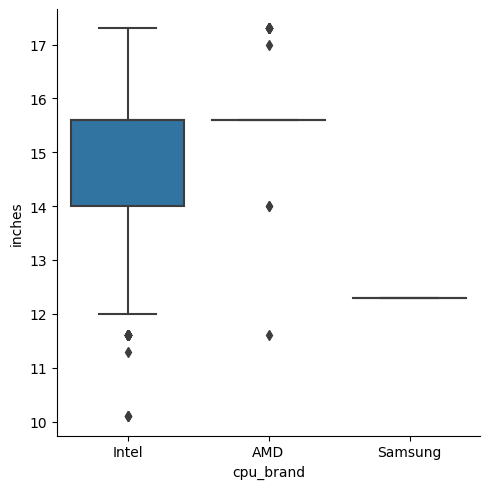

In [341]:
# cpu_brand vs inches.
sns.catplot(data = df, x = 'cpu_brand', y = 'inches', kind = 'box')  # most of the laptops are of 15.6 inches as we can crosscheck it form this graph

In [342]:
# cpu_brand vs ram
pd.crosstab(index = df['cpu_brand'], columns = df['ram'])
# 8gb ram and intel cpu - most frequent in dataset.
# follwed by 4 gb ram and intel cpu.
# then 16gb ram and intel cpu.
# for laptops with the amd cpu - they are generally available at the lower ram capacity < 16gb.

ram,2.0,4.0,6.0,8.0,12.0,16.0,24.0,32.0,64.0
cpu_brand,,,,,,,,,
AMD,1,31,11,12,2,3,0,0,0
Intel,15,321,23,584,23,189,3,17,3
Samsung,0,1,0,0,0,0,0,0,0


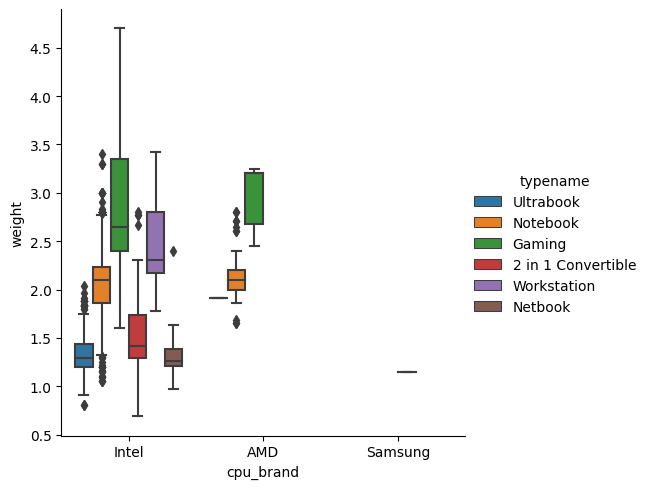

In [343]:
# cpu_brand vs weight.  ascross diff diff categories.
sns.catplot(data = df, x = 'cpu_brand', y = 'weight' , kind  = 'box', hue = 'typename')
# the weight doesnt depend on the brand - and is in the same ranges 
# the gaming laptops and workstation laptops are heavier across all the cpu_brands categories.
# follwed by the notebooks.

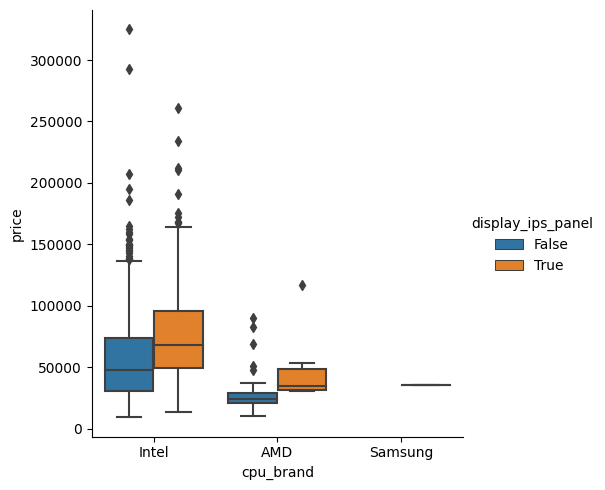

In [344]:
# cpu_brand vs display_ips_panel
# categorical vs categorical
pd.crosstab(index = df['display_ips_panel'], columns = df['cpu_brand'])

sns.catplot(data = df, x = 'cpu_brand', y = 'price', hue = 'display_ips_panel', kind = 'box')

# across all the cpu_categories also - if display is ips panel - the median price is higher.

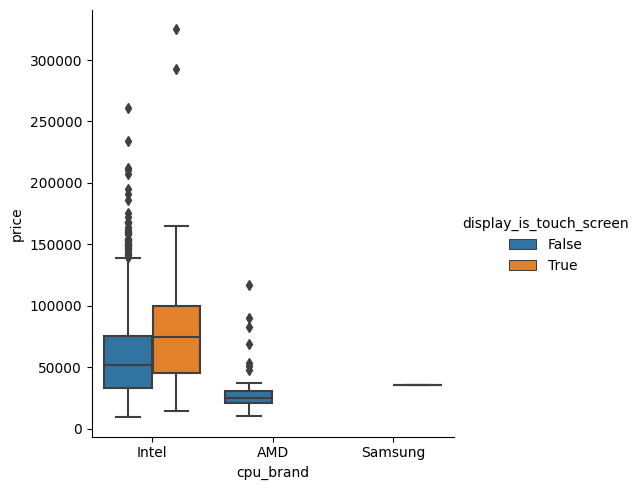

In [345]:
# cpu_brand vs display_is_touch_screen
# categorical vs categorical
pd.crosstab(index = df['display_is_touch_screen'], columns = df['cpu_brand'])

sns.catplot(data = df, x = 'cpu_brand', y = 'price', hue = 'display_is_touch_screen', kind = 'box')

# across all the cpu_categories also - if display is touch screen - the median price is higher.

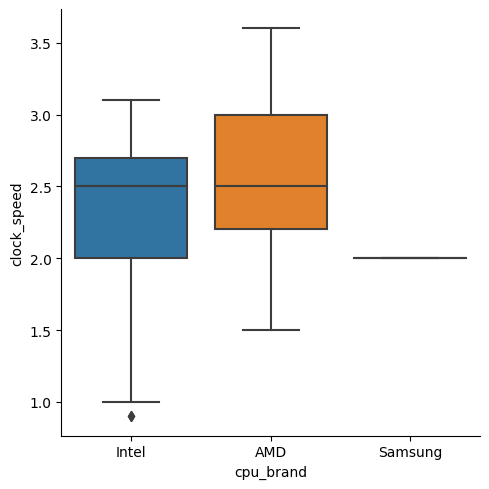

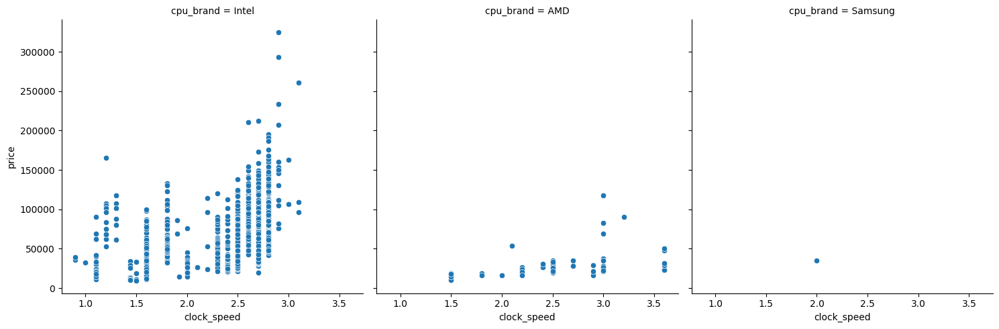

In [346]:
# cpu_brand vs clock_speed.
# categorical vs numerical.
sns.catplot(data = df, x = 'cpu_brand', y = 'clock_speed', kind = 'box')
sns.relplot(data = df, x = 'clock_speed', y = 'price', col = 'cpu_brand')
# intel_cpu are available in wide range of clock_speed.
# the median clock_speed of intel and amd cpu - is same.
# max clock speed of amd cpu is higher than the max clock speed of intel - present in the dataset.
# median clock speed is 2.5Ghz. - for amd and intel cpus
# price is dependent of the clock speed - as it increases the price follows.

In [347]:
pd.crosstab(index = df['gpu_brand'], columns = df['resolution_type'])
# laptops with the 4k Ultra hd - mostly have nividia gpu - making the device more expensive.
# intel gpu are present with wide variety of resolution_type from hd ready to 4k UltraHD 
# amd gpu are present in the standard full hp 1920X 1080p screens.

resolution_type,4K UHD (Ultra High Definition),Custom (close to 3:2 aspect ratio),Full HD (1080p),HD Ready,HD+,QHD+ (Quad HD Plus),Retina Display (Common in MacBook Pros),WQHD (Wide Quad HD),WQXGA (Wide Quad Extended Graphics Array),WUXGA (Widescreen Ultra Extended Graphics Array),WXGA+ (Wide Extended Graphics Array Plus)
gpu_brand,,,,,,,,,,,
AMD,0,0,115,46,6,0,3,0,0,0,0
ARM,0,0,0,0,0,0,0,0,1,0,0
Intel,14,7,362,222,5,26,1,25,9,4,4
Nvidia,28,0,333,13,12,0,0,3,0,0,0


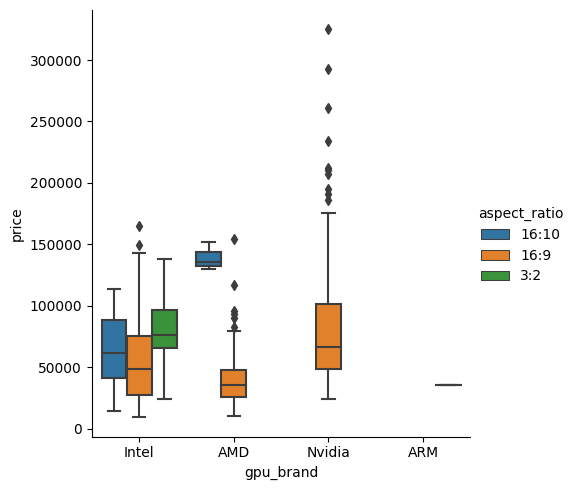

In [348]:
# gpu_brand vs aspect_ratio.
# cateogorical vs categorical.

pd.crosstab(index = df['gpu_brand'], columns = df['aspect_ratio'])
# most of the laptops have the aspect ratio of 16:9.

sns.catplot(data = df, x = 'gpu_brand', y = 'price', hue = 'aspect_ratio', kind = 'box')  
# the price doesnt get affected by the aspect ratio - its getting more affected by the gpu brand.

In [349]:
pd.crosstab(index = df['gpu_brand'], columns = df['quality_rank'])
# amd_gpu has more number of mid screens - some lower quality screens and very few - higher quality screens.
# intel_gpus are used with wide quality of screens.
# nvidia gpu are present in combination with the lower quality screens but - but the other specs for these laptop are of low quality - due to which
# the overall price drops.

quality_rank,High,Lower,Lower-Mid,Mid,Very High
gpu_brand,,,,,
AMD,0,46,6,115,3
ARM,1,0,0,0,0
Intel,61,222,9,366,21
Nvidia,3,13,12,333,28


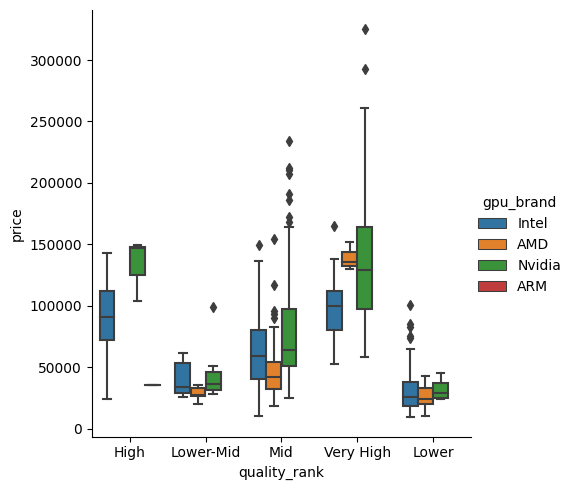

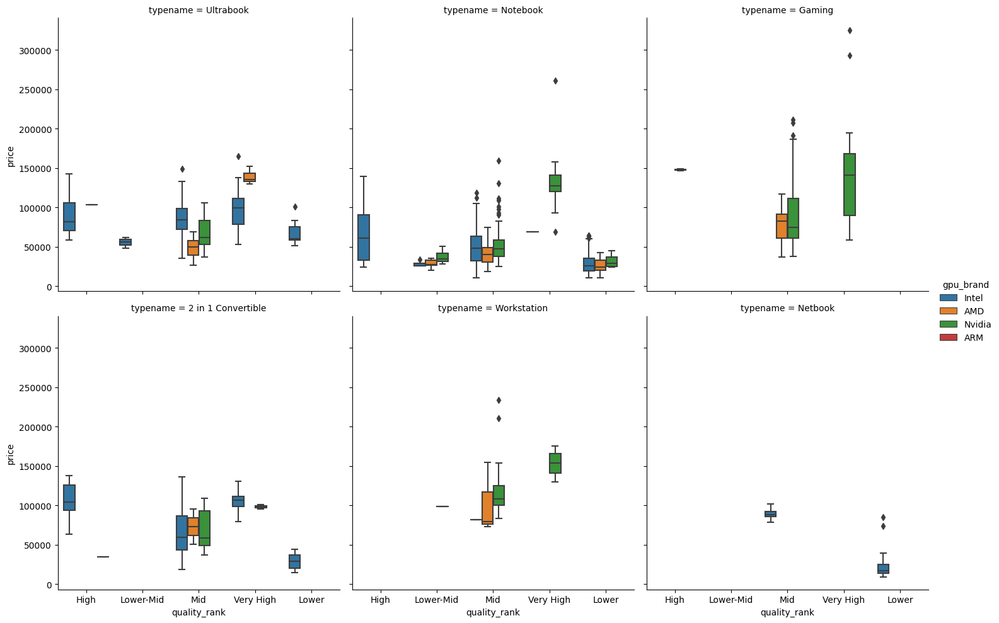

In [350]:
# gpu_brand vs quality_rank 
# categorical vs categorical.

pd.crosstab(index = df['gpu_brand'], columns = df['quality_rank'])
sns.catplot(data = df, x = 'quality_rank', y = 'price', hue = 'gpu_brand', kind = 'box')

sns.catplot(data = df, x = 'quality_rank', y = 'price', hue = 'gpu_brand', kind = 'box', col = 'typename', col_wrap = 3)
# nividia gpu are present with the mid and very high quality screens the price for these laptops is higher.


# nvidia gpu are present with the lower mid and lower quality screens -- in the notebook category of laptops.
# these devices have nvidia gpu - lower priced ones
# the ppi is lower.
# most of them dont have ssd. - only hdd.
# ram is good.
# resolution_type - HD Ready.  -- so the price is lower - even though the nvidia gpu is present.

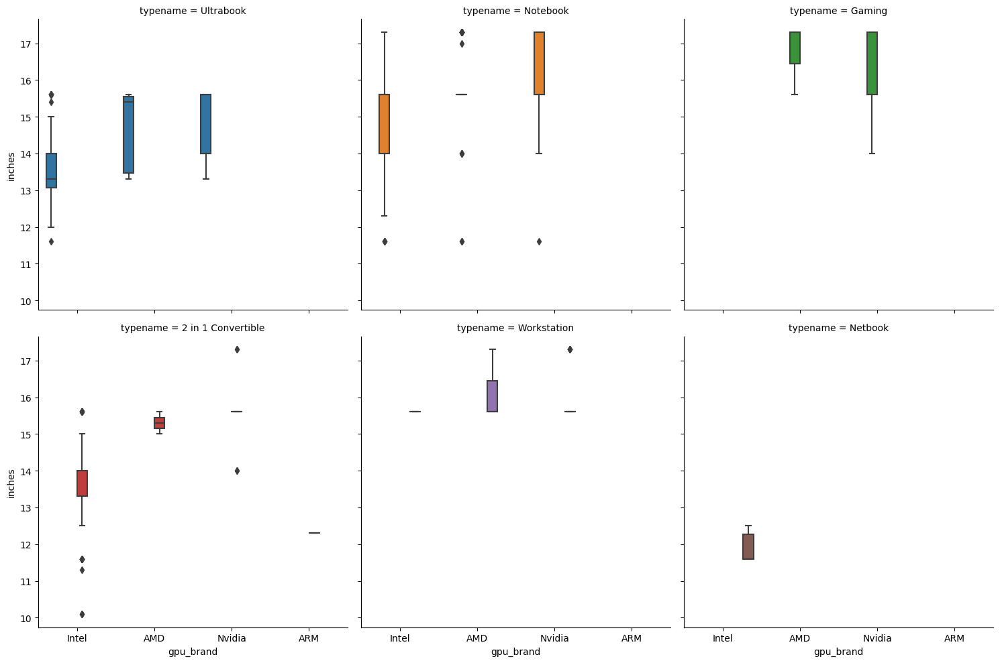

In [351]:
# gpu_brand vs inches.
# categorical vs numerical.

sns.catplot(data = df, x = 'gpu_brand',y = 'inches', kind = 'box', hue = 'typename', col = 'typename', col_wrap = 3)

# for gaming laptops with bigger screen size = amd and nvidia gpu are used.
# for workstation mostly amd gpu are used. - and workstation is usually 15.6 inch or greater than it.
# 2-in-1 Convertibles = Variety of GPU brands, but ARM is only here, and screens are smaller.
# Nvidia = High-performance machines, typically not in small/portable devices.
# ARM = Rare, very small devices.

In [352]:
plt.figure(figsize = (6,6))
print(pd.crosstab(index = df['gpu_brand'], columns = df['ram']))
pd.crosstab(index = df['gpu_brand'], columns = df['ram'], normalize = 'columns')*100

# overall dataset is dominated by the intel gpu.
# at lower ram config - the intel dominated followed by nvidia - upto 6gb ram
# at 8gb ram - the most common ram config - across the entire dataset. -- intel gpu(55%)dominates followed by nvidia(32) and then amd gpu.
# at higher ram config - nvidia dominates follwed by intel and then amd.
# and when nvidia gpu are costlier the screen is generally of better quality and ram is higher. 

ram        2.0   4.0   6.0   8.0   12.0  16.0  24.0  32.0  64.0
gpu_brand                                                      
AMD           1    60    15    73     3    17     0     0     1
ARM           0     1     0     0     0     0     0     0     0
Intel        14   263     8   333    10    48     1     1     1
Nvidia        1    29    11   190    12   127     2    16     1


ram,2.0,4.0,6.0,8.0,12.0,16.0,24.0,32.0,64.0
gpu_brand,,,,,,,,,
AMD,6.25,16.997167,44.117647,12.248322,12.0,8.854167,0.000000,0.000000,33.333333
ARM,0.00,0.283286,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
Intel,87.50,74.504249,23.529412,55.872483,40.0,25.000000,33.333333,5.882353,33.333333
Nvidia,6.25,8.215297,32.352941,31.879195,48.0,66.145833,66.666667,94.117647,33.333333


<Figure size 600x600 with 0 Axes>

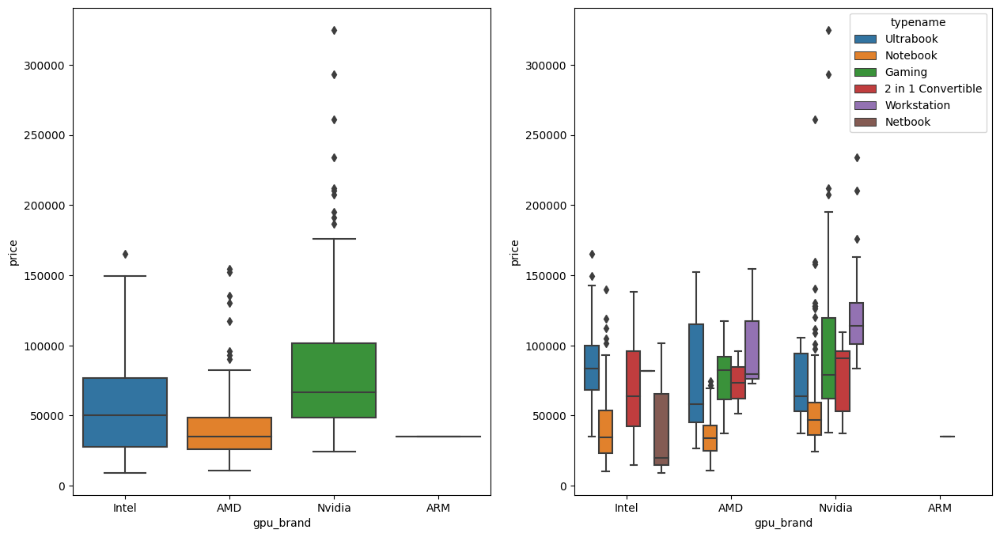

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


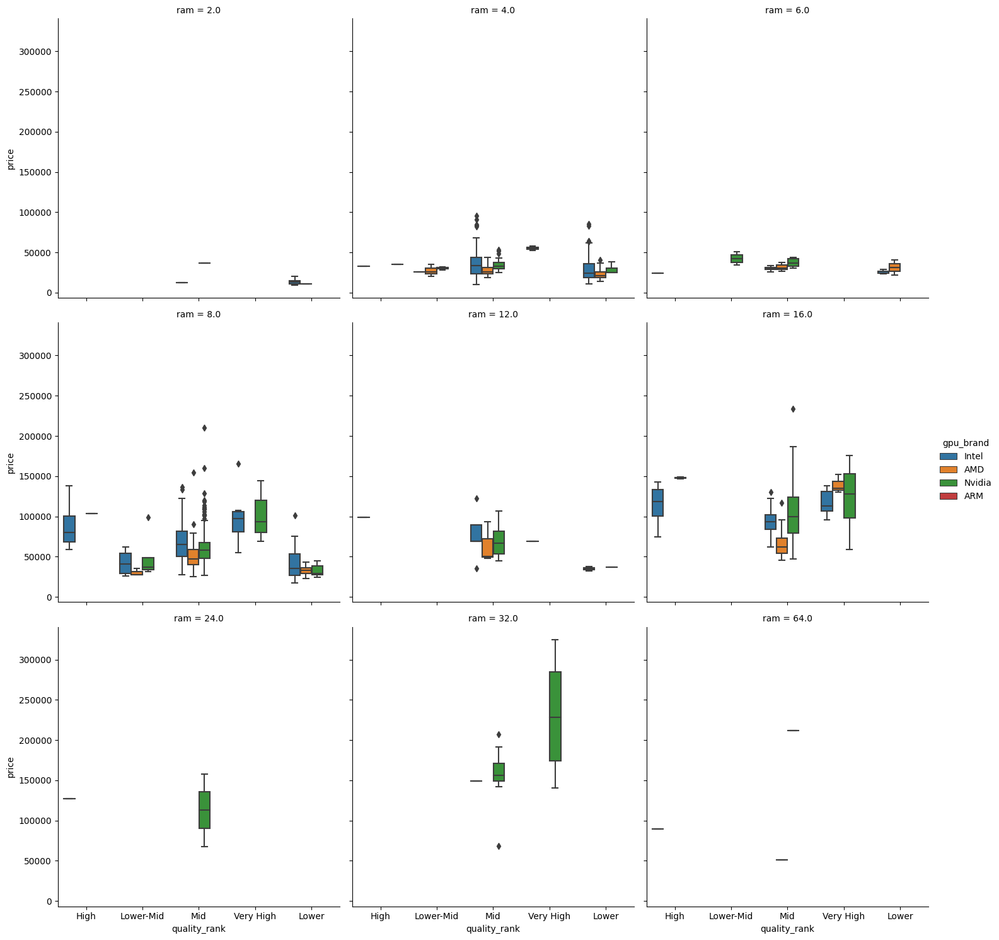

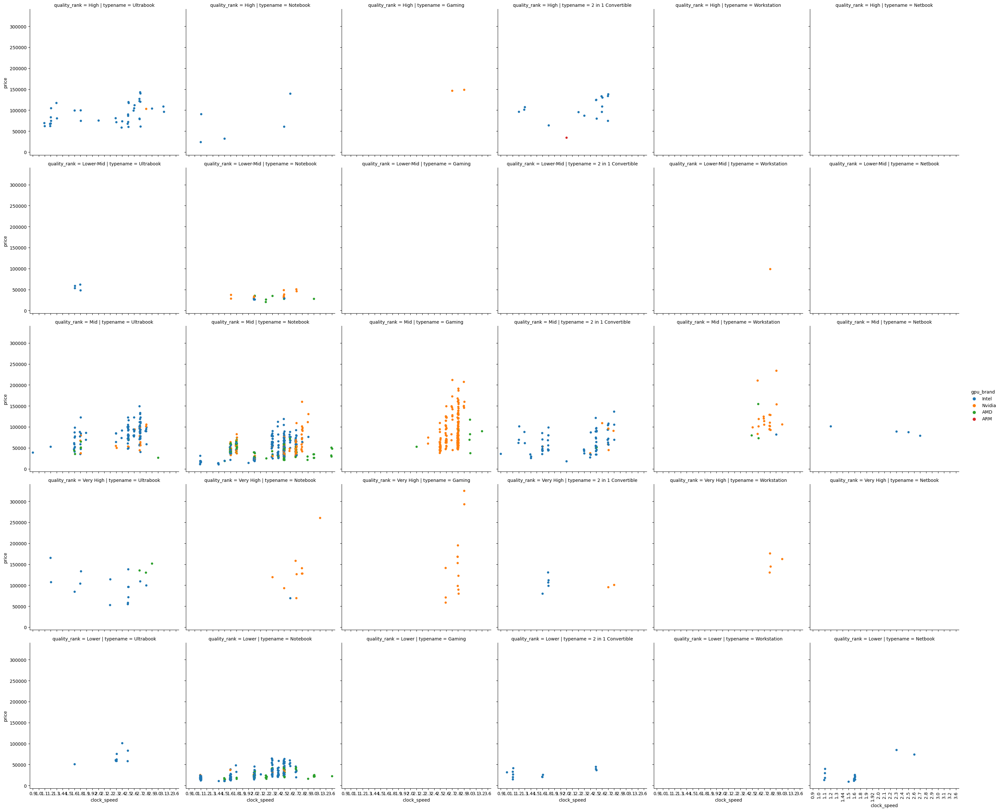

In [353]:
# gpu_brand vs ram
pd.crosstab(index = df['ram'], columns = df['gpu_brand'])

# higher priced gpu must be having better screens and - better clock_speed with good ram and ssd - to support all this.
fig = plt.figure(figsize = (15,8))
ax1 = fig.add_subplot(1,2,1)
sns.boxplot(data = df, x = 'gpu_brand', y = 'price', ax = ax1) 

# gpu_brand vs price
ax2 = fig.add_subplot(1,2,2)
sns.boxplot(data = df, x = 'gpu_brand', y = 'price', hue = 'typename', ax = ax2)  # whenever nvidia gpu - prices are higher.
plt.show()
# gpu_brand vs price vs quality_rank
sns.catplot(data = df, x = 'quality_rank', y = 'price', hue = 'gpu_brand', kind = 'box', col = 'ram', col_wrap = 3)

# gpu_brand vs prive vs clock_speed.
sns.catplot(data = df, x = 'clock_speed', y = 'price', hue = 'gpu_brand', col = 'typename', row = 'quality_rank')
plt.xticks(rotation = 90)
plt.show()


# whever the nvidia gpu is present then the price across all the type is higher - as compared to devices where other brand gpu is used ----
#But except for the case of ultrabooks - the ultrabooks with the nvidia gpu - are mostly usign the full hd screen with the lower ppi
# due to this the median price is actually lower when nvidia gpu are used for the ultrabooks.


# gaming,workstation and ultrabooks have - higher price - across all the gpu_brand.

# the 2 in one convertible laptops - have all the kinds of gpu_brand - intel,amd,nvidia - when nvidia gpu is present then the median price for them is higher.
# they come with the touchscreen - most of them are of mid quality but few with the very high quality screen quality too are present-- due to which they have higher price - but not as high as gaming and workstation laptops


# nvidia gpu - are mostly present with the combination of higher ram and mid and very high quality screens
# but for some laptops - even though nvidia gpu is present but other specs are lower - so overall price is lesser.

# ultrabooks are dominated by the intel gpus - at a wide variety of clock speed of cpu- means both the lower and higher clock_speeds are present and in combination of high and mid quality screens with some - very high quality screen(4k uhd.)


# notebooks are dominated by intel gpu followed by nvidia gpu - clock_speed of cpu - varies from the lower to higher range 
# here for notebooks intel gpu are present with all the qualities of screen but 
# if nvidia gpu is present with only the mid, lower-mid and very high screen quality with the higher clock_speed only.

# gaming laptops are dominated by the mid quality screens with the nvidia gpu - and cpu with higher clock speeds.
# intel_gpu - not present for gaming laptops in the dataset.

# 2 in 1 convertible - laptops = mostly come with the intel_gpu - with the wide range of cpu_clock_speed with mostly - high,mid and lower quality screens -- a very few - 2 in one convertible - have very high quality screens.

# workstation laptops are dominated by nvidia gpus and the cpu of higher clock_speed - with the mid screen quality or very high quality.

# netbooks - mid and lower quality screens with the slower cpu_clock_speed and intel_gpu.


In [354]:
checklist = ['ram','ssd_capacity','quality_rank','display_is_touch_screen','display_ips_panel','ppi_whole','inches']
for i in checklist:
    print(df[df['typename'] == '2 in 1 Convertible'].groupby(i).size().sort_values(ascending = False))
    print('*' * 20)
# higher ram is present.
# most of them have ssd.
# mid and high - mostly but few are of very high quality.
# dominated by touchscreen display.
# almost equal number of true/false. - not much effect.
# noticable - higher ppi.
# generally smaller.


# the 2 in one convertible laptops mostly have 8gb ram - and then 4gb ram and 16gb ram - is present almost in equal numbers.
# 2 in one convertible laptops are costlier that the notebook because
# most have good quality screen -with the touchscreen facitly with higher ppi.


# the price of 2 in one convertible laptops - is higher as compared to notebooks because of touchscreendisplay.
# the price of the 2 in one convertible laptops - is higher but not as high as compared to gaming and workstation and ultrabooks because
# even if the higher ram is present because the display size is smaller and with the lower ppi and gpu_used is of intel mostly.

ram
8.0     60
4.0     25
16.0    19
12.0     5
2.0      1
6.0      1
dtype: int64
********************
ssd_capacity
256.0     54
512.0     26
0.0       25
128.0      4
1024.0     2
dtype: int64
********************
quality_rank
Mid          75
High         17
Lower        12
Very High     7
dtype: int64
********************
display_is_touch_screen
True    111
dtype: int64
********************
display_ips_panel
True     58
False    53
dtype: int64
********************
ppi_whole
166.0    34
141.0    15
157.0    10
135.0     8
276.0     7
210.0     7
158.0     4
176.0     3
224.0     3
331.0     3
100.0     2
118.0     2
127.0     2
282.0     2
147.0     2
221.0     2
317.0     2
190.0     1
195.0     1
235.0     1
dtype: int64
********************
inches
13.3    48
15.6    19
14.0    17
11.6     9
13.9     6
12.5     3
10.1     3
17.3     2
15.0     2
11.3     1
12.3     1
dtype: int64
********************


In [355]:
checklist = ['ram','ssd_capacity','quality_rank','display_is_touch_screen','display_ips_panel','ppi_whole','inches']
for i in checklist:
    print(df[df['typename'] == 'Notebook'].groupby(i).size().sort_values(ascending = False))
    print('*' * 20)
# lower ram -mostly. 4gb and 8gb
# considerable number have ssd.
# mid quality scrren dominates follwed by lower and lower-mid.
# most dont have touch screen
# not present mostly.
# lower ppi - mostly.
# standard screen size of 15.6 inches.

ram
4.0     301
8.0     298
6.0      32
16.0     30
2.0      12
12.0     10
32.0      2
dtype: int64
********************
ssd_capacity
0.0       342
256.0     223
128.0      90
512.0      20
1024.0      4
180.0       3
16.0        2
64.0        1
dtype: int64
********************
quality_rank
Mid          406
Lower        242
Lower-Mid     22
Very High     10
High           5
dtype: int64
********************
display_is_touch_screen
False    667
True      18
dtype: int64
********************
display_ips_panel
False    576
True     109
dtype: int64
********************
ppi_whole
141.0    258
100.0    189
157.0     70
112.0     41
127.0     39
166.0     34
106.0     21
282.0      9
118.0      6
190.0      4
135.0      3
276.0      3
91.0       2
111.0      1
108.0      1
210.0      1
162.0      1
267.0      1
255.0      1
dtype: int64
********************
inches
15.6    456
14.0    113
17.3     63
13.3     43
11.6      7
12.3      1
14.1      1
17.0      1
dtype: int64
******************

In [356]:
# when gpu is of nvidia and when the typename is ultrabook.
df[(df['typename'] == 'Ultrabook') & (df['gpu_brand'] == 'Nvidia')]

# whever the nvidia gpu is present then the price across all the type is higher - as compared to devices where other brand gpu is used ----
#But except for the case of ultrabooks - the ultrabooks with the nvidia gpu - are mostly usign the full hd screen with the lower ppi
# due to this the median price is actually lower when nvidia gpu are used for the ultrabooks.

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details,ppi_whole,resolution,resolution_type,aspect_ratio,quality_rank
8,Asus,Ultrabook,14.0,Full HD 1920x1080,16.0,Windows,1.30,79653.600,1920,1080,...,0.0,1,0,0.0,Core i7 8550U,157.0,1920 x 1080,Full HD (1080p),16:9,Mid
62,Asus,Ultrabook,15.6,Full HD 1920x1080,16.0,Windows,1.80,105654.240,1920,1080,...,0.0,1,0,0.0,Core i7 7700HQ,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
82,HP,Ultrabook,15.6,IPS Panel Full HD 1920x1080,8.0,Windows,1.83,37242.720,1920,1080,...,0.0,1,0,0.0,Core i7 8550U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
99,HP,Ultrabook,13.3,IPS Panel Full HD 1920x1080,8.0,Windows,1.38,59620.320,1920,1080,...,0.0,1,0,0.0,Core i7 7500U,166.0,1920 x 1080,Full HD (1080p),16:9,Mid
103,Asus,Ultrabook,14.0,IPS Panel Full HD 1920x1080,8.0,Windows,1.30,63563.040,1920,1080,...,0.0,1,0,0.0,Core i7 7500U,157.0,1920 x 1080,Full HD (1080p),16:9,Mid
106,Asus,Ultrabook,15.6,Full HD 1920x1080,16.0,Windows,1.50,67239.360,1920,1080,...,1024.0,1,1,0.0,Core i7 8550U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
184,Xiaomi,Ultrabook,13.3,IPS Panel Full HD 1920x1080,8.0,No OS,1.30,53274.672,1920,1080,...,0.0,1,0,0.0,Core i5 7200U,166.0,1920 x 1080,Full HD (1080p),16:9,Mid
277,Asus,Ultrabook,15.6,Full HD 1920x1080,8.0,Windows,1.70,52054.560,1920,1080,...,0.0,1,0,0.0,Core i5 7200U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
289,Asus,Ultrabook,15.6,Full HD 1920x1080,16.0,Windows,1.63,78215.040,1920,1080,...,0.0,1,0,0.0,Core i7 7500U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
317,Asus,Ultrabook,15.6,Full HD 1920x1080,8.0,Windows,1.70,55938.672,1920,1080,...,0.0,1,0,0.0,Core i7 7500U,141.0,1920 x 1080,Full HD (1080p),16:9,Mid


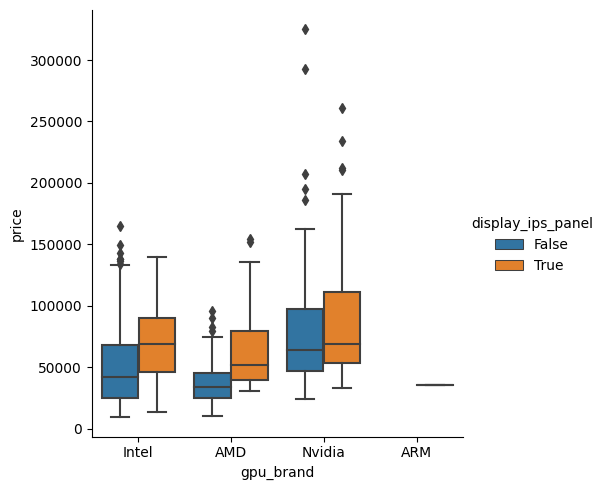

In [357]:
# gpu_brand vs display_ips_panel
pd.crosstab(index = df['display_ips_panel'], columns = df['gpu_brand'])
# better gpu_brand & better display_panel - so heigher price.

sns.catplot(data = df, x = 'gpu_brand', y = 'price', hue = 'display_ips_panel', kind = 'box')
# if display is ips panel then across all gpu_brands the price increases


In [358]:
# gpu_brand vs display_is_touch_screen
print(pd.crosstab(index = df['display_is_touch_screen'], columns = df['gpu_brand']))
df[(df['display_is_touch_screen'] == True)].groupby('gpu_brand').agg({
    'price' : ['mean','median']
})

# when the display is touch_screen then the intel gpu are mostly used and the typename is mostly - 2 in 1 convertible
# but for the 2 in 1 convertible - the prices are generally lower as compared to other categories of laptops 
# So here we can see that
# even though the nvidia gpu are used much lesser number of times than intel gpu in the dataset 
# still the mean , median prices for the nvidia gpu is higher than the intel  gpu when the touch screen is used in the display.

gpu_brand                AMD  ARM  Intel  Nvidia
display_is_touch_screen                         
False                    167    0    523     367
True                       3    1    156      22


price          
                    mean    median
gpu_brand                         
AMD         64238.097600  51095.52
ARM         35111.520000  35111.52
Intel       73581.292062  74005.92
Nvidia     109795.694400  94891.68

In [359]:
print(df[(df['display_is_touch_screen'] == True) & (df['gpu_brand'] == 'Intel')]['typename'].value_counts())
df[(df['display_is_touch_screen'] == True) & (df['gpu_brand'] == 'Intel')].groupby('typename').agg({'price' : ['mean','median']})

typename
2 in 1 Convertible    99
Ultrabook             44
Notebook              11
Netbook                2
Name: count, dtype: int64


price          
                            mean    median
typename                                  
2 in 1 Convertible  68662.436509  63882.72
Netbook             56610.000000  56610.00
Notebook            39600.844364  29783.52
Ultrabook           93915.251345  95610.96

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


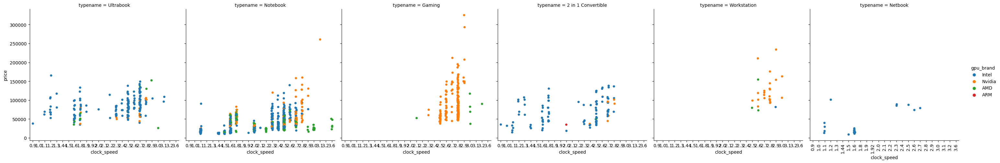

In [360]:
# gpu_brand vs prive vs clock_speed.
sns.catplot(data = df, x = 'clock_speed', y = 'price', hue = 'gpu_brand', col = 'typename')
plt.xticks(rotation = 90)
plt.show()

# conclusion written earlier.

ssd_capacity  0.0  16.0  32.0  64.0  128.0  180.0  256.0  512.0  1024.0   All
gpu_brand                                                                    
AMD            81     0     0     1     22      0     61      5       0   170
ARM             1     0     0     0      0      0      0      0       0     1
Intel         243     3     1     0     69      4    273     80       6   679
Nvidia         90     0     0     0     79      0    162     49       9   389
All           415     3     1     1    170      4    496    134      15  1239


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


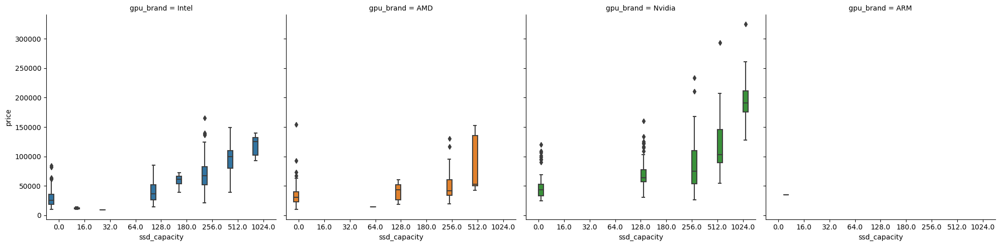

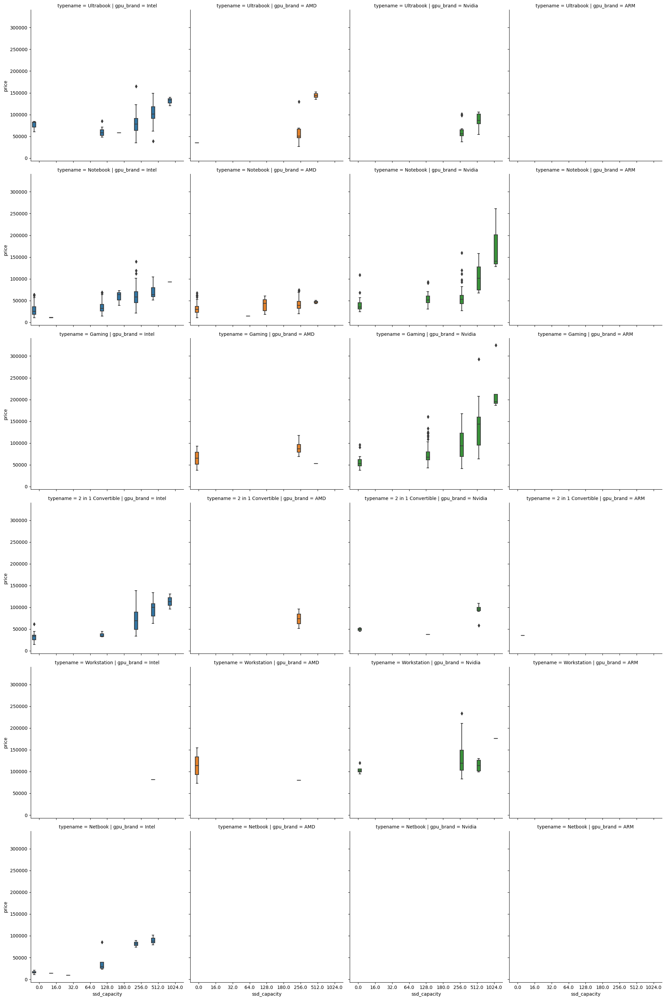

In [361]:
# gpu_brand vs ssd_capacity
# categorical vs categorical
print(pd.crosstab(index = df['gpu_brand'], columns = df['ssd_capacity'], margins = True))

sns.catplot(data = df, x = 'ssd_capacity', y = 'price', col = 'gpu_brand', kind = 'box', hue = 'gpu_brand')

sns.catplot(data = df, x = 'ssd_capacity', y = 'price', col = 'gpu_brand', kind = 'box', hue = 'gpu_brand', row = 'typename')

# as ssd_capacity increases across all the gpu_brands the price increases -- all the categories/typename of laptops follow this trend.
# this increase in price with the inc in ssd_capacity is most predominant in laptops with the nvidia gpu.

# from contingency table.
# as the 256gb ssd is most popular in the dataset so here also we see that 
# 256 gb ssd and intel gpu - most popular combination for the dataset.
# followed by 256gb ssd and nvidia gpu.
# then 128gb ssd with nvidia gpu is 3rd most popular.

# 512 gb ssd is more popular with the intel_gpu --- as most of the laptops in the dataset have intel_gpu i.e around 54% of whole dataset.
# 1024 gb ssd - i.e 1TB ssd os most popular with the nvidia gpu.  -- all have higher ppi, resolution -- they also have higher ram,and most of them have screen size of 17.3 inch etc

In [362]:
df[(df['ssd_capacity'] == 1024) & (df['gpu_brand'] == 'Nvidia')]

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details,ppi_whole,resolution,resolution_type,aspect_ratio,quality_rank
188,Razer,Gaming,17.3,4K Ultra HD / Touchscreen 3840x2160,32.0,Windows,3.49,324954.720,3840,2160,...,0.0,1,0,0.0,Core i7 7820HK,255.0,3840 x 2160,4K UHD (Ultra High Definition),16:9,Very High
319,Dell,Notebook,15.6,4K Ultra HD / Touchscreen 3840x2160,32.0,Windows,2.06,140605.920,3840,2160,...,0.0,1,0,0.0,Core i7 7700HQ,282.0,3840 x 2160,4K UHD (Ultra High Definition),16:9,Very High
592,Lenovo,Notebook,15.6,IPS Panel 4K Ultra HD 3840x2160,32.0,Windows,2.50,261018.720,3840,2160,...,0.0,1,0,0.0,Xeon E3-1535M v6,282.0,3840 x 2160,4K UHD (Ultra High Definition),16:9,Very High
618,Dell,Notebook,15.6,4K Ultra HD / Touchscreen 3840x2160,16.0,Windows,2.06,127818.720,3840,2160,...,0.0,1,0,0.0,Core i7 7700HQ,282.0,3840 x 2160,4K UHD (Ultra High Definition),16:9,Very High
700,Dell,Gaming,17.3,4K Ultra HD 3840x2160,32.0,Windows,4.36,194972.832,3840,2160,...,1024.0,1,1,0.0,Core i7 7700HQ,255.0,3840 x 2160,4K UHD (Ultra High Definition),16:9,Very High
720,Lenovo,Workstation,15.6,IPS Panel 4K Ultra HD 3840x2160,16.0,Windows,2.50,175770.720,3840,2160,...,0.0,1,0,0.0,Core i7 7600U,282.0,3840 x 2160,4K UHD (Ultra High Definition),16:9,Very High
753,Dell,Gaming,17.3,IPS Panel Full HD 1920x1080,32.0,Windows,4.42,191211.264,1920,1080,...,1024.0,1,1,0.0,Core i7 7700HQ,127.0,1920 x 1080,Full HD (1080p),16:9,Mid
1033,Asus,Gaming,17.3,IPS Panel Full HD 1920x1080,64.0,Windows,3.58,211788.000,1920,1080,...,0.0,1,0,0.0,Core i7 6820HK,127.0,1920 x 1080,Full HD (1080p),16:9,Mid
1197,Razer,Gaming,14.0,Full HD 1920x1080,16.0,Windows,1.95,186426.720,1920,1080,...,0.0,1,0,0.0,Core i7 7700HQ,157.0,1920 x 1080,Full HD (1080p),16:9,Mid


In [363]:
# gpu_brand vs hdd_capacity.

hdd_capacity  0.0     32.0    128.0   512.0   1024.0  2048.0
gpu_brand                                                   
AMD               64       0       0      20      71      15
ARM                1       0       0       0       0       0
Intel            483       1       1      96      93       5
Nvidia           134       0       0       8     236      11


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


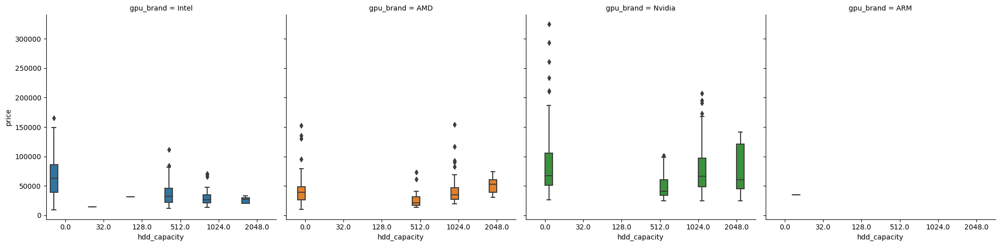

In [364]:
print(pd.crosstab(index = df['gpu_brand'], columns = df['hdd_capacity']))
sns.catplot(data = df, x = 'hdd_capacity', y = 'price', col = 'gpu_brand', kind = 'box', hue = 'gpu_brand')

# 1 TB HDD with nvidia_gpu is the most popular combination.
# as the hdd_capacity increases so does the price - across all the gpu_brands -- except for intel - median price doesnt chagnes a lot - with the increase in hdd_capacity.

company
Asus       57
Dell       44
MSI        44
Lenovo     43
HP         26
Acer       21
Samsung     1
dtype: int64

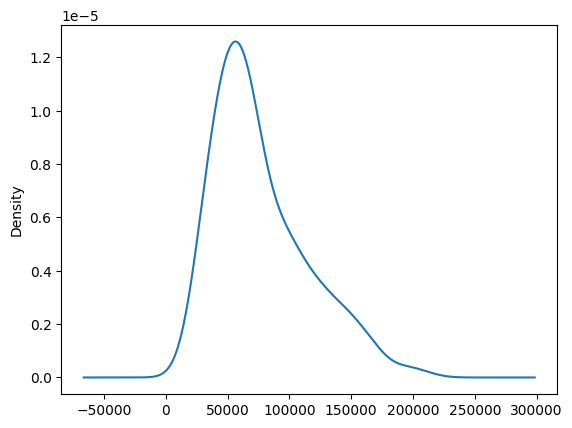

In [365]:
df[(df['gpu_brand'] == 'Nvidia') & (df['hdd_capacity'] == 1024)]['price'].plot(kind = 'kde')
# ram,ppi_whole,ssd_capacity, quality_rank,resolution_type,company, typename.
df[(df['gpu_brand'] == 'Nvidia') & (df['hdd_capacity'] == 1024)].groupby('ram').size().sort_values(ascending = False)  #- higher ram
df[(df['gpu_brand'] == 'Nvidia') & (df['hdd_capacity'] == 1024)].groupby('ppi_whole').size().sort_values(ascending = False) # lower ppi.
df[(df['gpu_brand'] == 'Nvidia') & (df['hdd_capacity'] == 1024)].groupby('ssd_capacity').size().sort_values(ascending = False) # either the ssd is not preset if present the capacity is lower.
df[(df['gpu_brand'] == 'Nvidia') & (df['hdd_capacity'] == 1024)].groupby('quality_rank').size().sort_values(ascending = False) # most of them have mid quality screens.
df[(df['gpu_brand'] == 'Nvidia') & (df['hdd_capacity'] == 1024)].groupby('resolution_type').size().sort_values(ascending = False) # std full hd display.
df[(df['gpu_brand'] == 'Nvidia') & (df['hdd_capacity'] == 1024)].groupby('company').size().sort_values(ascending = False) 
# most of these are in the lowerpriced.


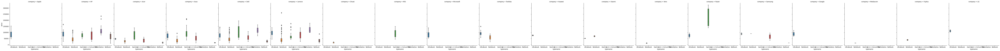

In [366]:
sns.catplot(data = df, x = 'typename', y = 'price', col = 'company', kind = 'box', hue = 'typename')
# apple only make the ultrabooks
# hp makes all kind of laptops - their workstation are usually the costliest.
# acer - make all kinds of laptops except workstation ones - and their gaming laptops are most costlier. 
# asus = also makes all kinds of laptops except the workstation ones - gaming laptops are their costliest.
# dell makes all kinds of laptops median price of workstation is higher thatn the median price of gaming laptops but their gaming laptops comes in wider price range.
# lenovo makes all kinds of laptops and the workstations are their costliest followed by ultrabooks and then 2 in one convertibles.
# msi makes only gaming laptops as per the dataset.
# microsoft only makes the ultrabooks as per the dataset.
# chuwi only makes notebooks as per the dataset.
# Razer make gaming laptops and ultrabooks - but their gaming laptops are very expensive.
# Lg only makes ultrabooks - and they are expensive.


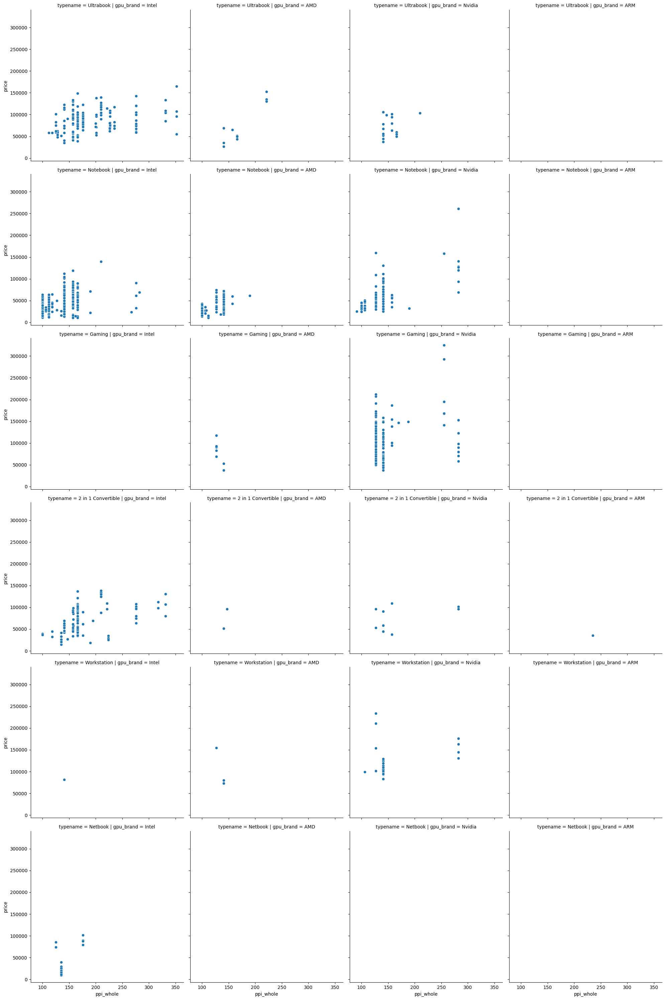

In [367]:
# gpu_brand vs ppi_whole
sns.relplot(data = df, kind = 'scatter', x = 'ppi_whole', y = 'price', col = 'gpu_brand', row = 'typename')
# as ppi increases the price increases across all the gpu_brands -- and across all the categories of laptops.
# in case of nvidia gpu - the ppi is mostly in the range of 150 -- but significant number of other better ppi are also present.
# gaming laptops dont use the intel brand gpu - they either use nvidia or the amd gpu. -- and they tend to be higher priced.
# the notebook laptops uses intel,amd, nvidia gpu - most of them still use the intel gpu.
# ultrabooks majorly use the intel gpu.

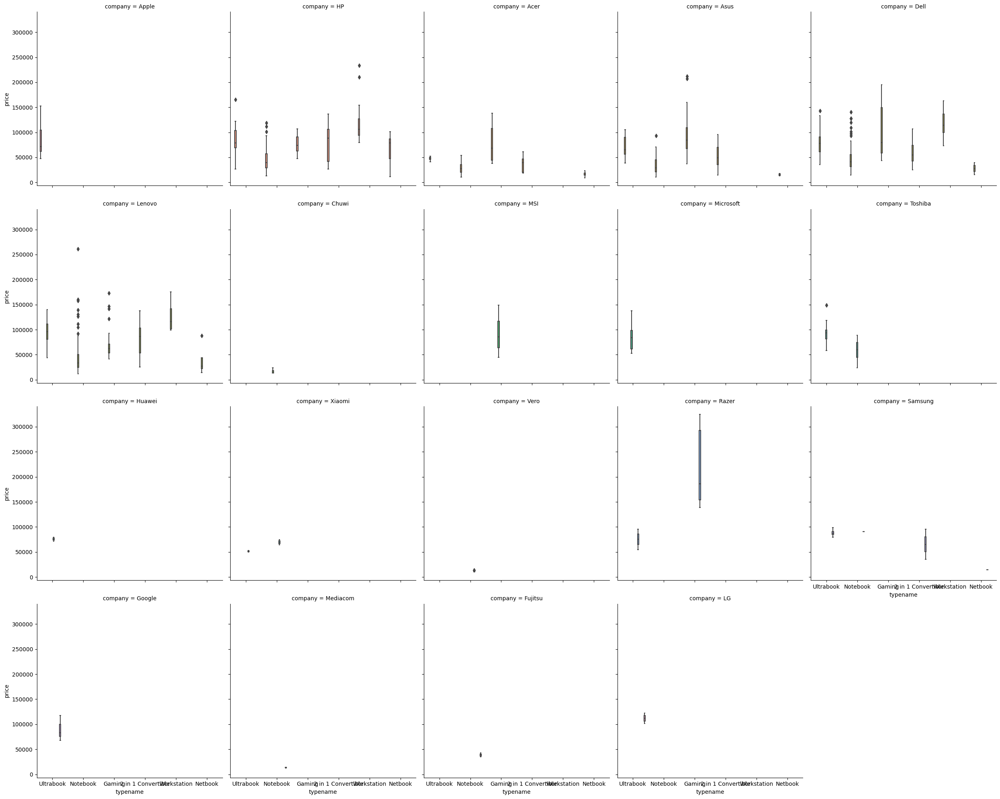

In [368]:
# multivariate analysis 
# company vs price vs typename.
sns.catplot(data = df, x = 'typename', y = 'price', col = 'company', hue = 'company',col_wrap = 5, kind = 'box')

In [369]:
# overall median price of the gaming laptops.
df[df['typename'] == 'Gaming']['price'].median()

79215.1056

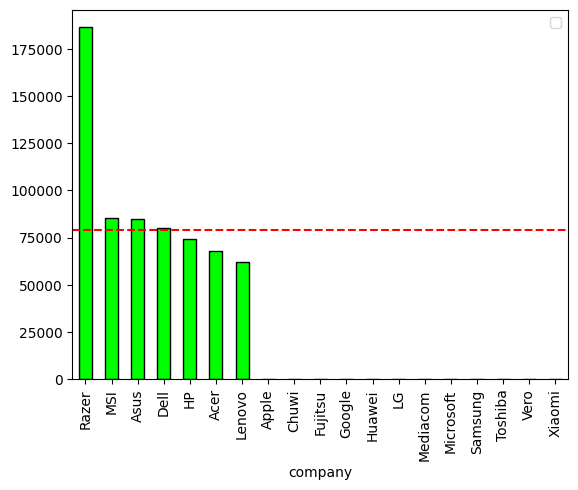

In [370]:
# across all the companies what is the median price of gaming laptops.
def median_finder(var):
    return var[var['typename'] == 'Gaming']['price'].median()
df.groupby('company').apply(median_finder, include_groups = False).sort_values(ascending = False).plot(kind = 'bar', edgecolor = 'black', color = 'lime')
plt.axhline(df[df['typename'] == 'Gaming']['price'].median(), color = 'red', linestyle = 'dashed')
plt.legend()

In [371]:
df[(df['company'] == 'HP') & df['typename'].isin(['Netbook','Ultrabook','2 in 1 Convertible','Workstation'])].groupby('typename').agg({'price':['mean','median']})

price             
                             mean       median
typename                                      
2 in 1 Convertible   80601.984000   88684.5600
Netbook              65777.965714   79014.2400
Ultrabook            82966.456376   79067.5200
Workstation         122527.064571  105837.7896

<Axes: xlabel='typename'>

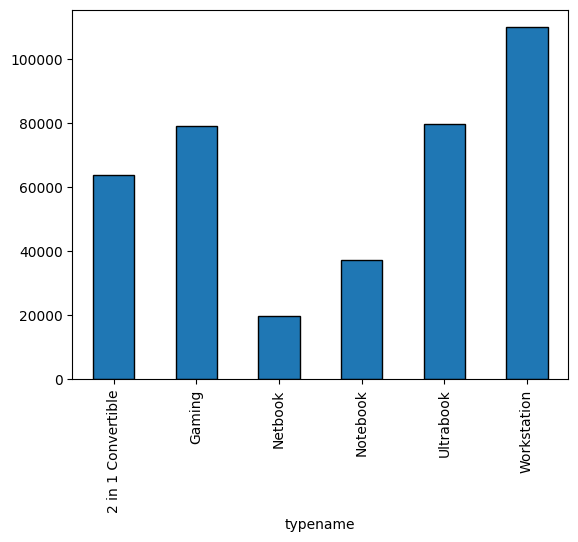

In [372]:
df.groupby('typename')['price'].median().plot(kind = 'bar', edgecolor = 'black')

In [373]:
def median_finder(var):
    return var.groupby('typename')['price'].median()
df.groupby('company').apply(median_finder, include_groups = False).sort_values(ascending = False)

company    typename          
Razer      Gaming                186426.7200
Lenovo     Workstation           116416.8000
Dell       Workstation           113752.8000
LG         Ultrabook             111834.7200
HP         Workstation           105837.7896
Lenovo     Ultrabook              95824.0800
Toshiba    Ultrabook              93533.0400
Samsung    Notebook               90522.7200
HP         2 in 1 Convertible     88684.5600
Samsung    Ultrabook              87858.7200
Lenovo     2 in 1 Convertible     86207.0400
MSI        Gaming                 85194.7200
Asus       Gaming                 84768.4800
Microsoft  Ultrabook              83622.9600
Google     Ultrabook              83063.5200
Dell       Gaming                 79840.0800
HP         Ultrabook              79067.5200
           Netbook                79014.2400
Dell       Ultrabook              77682.2400
Huawei     Ultrabook              75870.7200
Razer      Ultrabook              75337.9200
HP         Gaming        

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


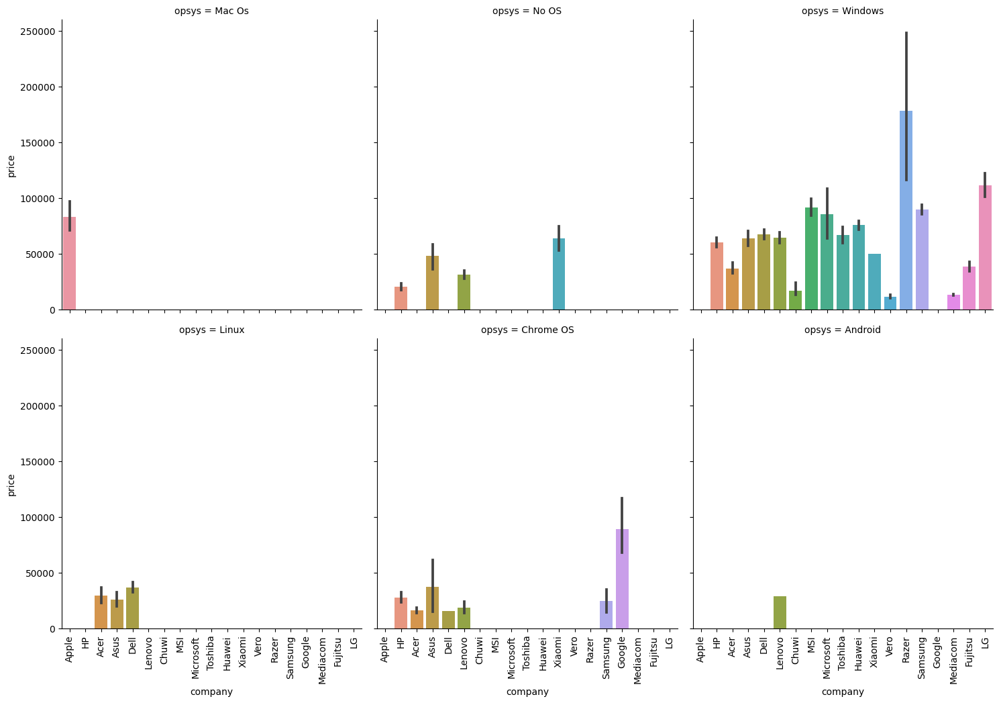

In [374]:
# company vs opsys vs price 
g = sns.catplot(data = df, x = 'company', y = 'price', kind = 'bar', col = 'opsys', col_wrap = 3)
# Rotate x-tick labels for each subplot
[ax.tick_params(axis='x', labelrotation=90) for ax in g.axes.flat]
plt.show()
# nothing surpising - conclusions are similar as derived earlier.

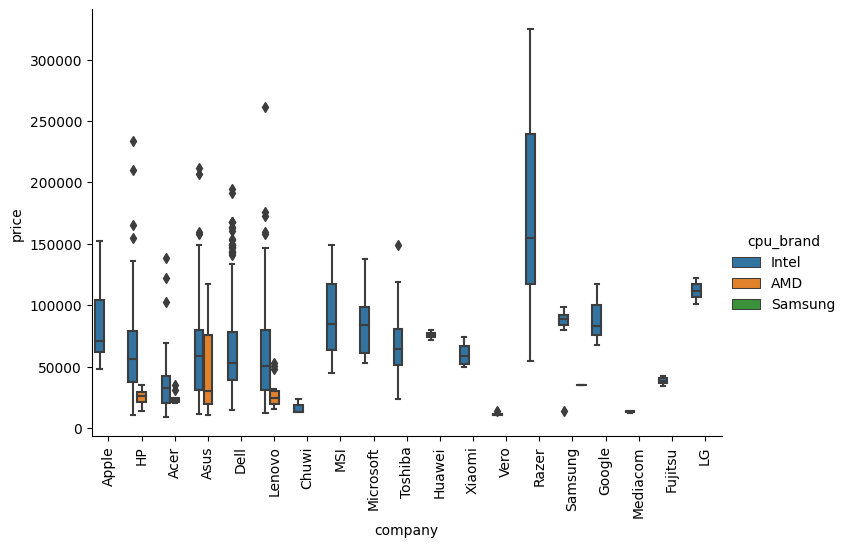

In [375]:
# company vs cpu_brand vs price
sns.catplot(data = df, x = 'company', y = 'price', hue = 'cpu_brand', kind = 'box', height = 5,aspect = 1.5)
plt.xticks(rotation = 90)
plt.show()

# intel cpus - dominate in the dataset
# amd cpu are present in the lower and middle price laptops - offering value.
# Samsung is unique in using its own processors, focused on mid-tier pricing.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


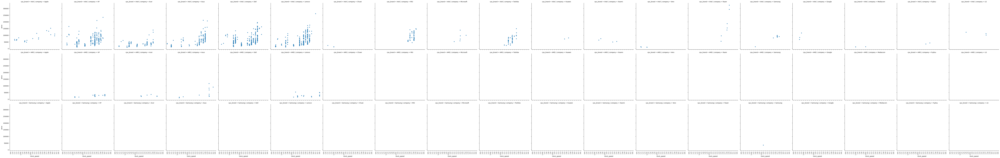

In [376]:
# company vs cpu_brand vs clock_speed.
# categorical vs categorical vs numerical.

g = sns.catplot(data = df, x = 'clock_speed', y = 'price', row = 'cpu_brand', col = 'company')
[ax.tick_params(axis='x', labelrotation=90) for ax in g.axes.flat]
plt.show()
# no new conclusion.

In [377]:
# company vs gpu_brand vs price -- done earlier.
# company vs screen_details --- done earlier.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


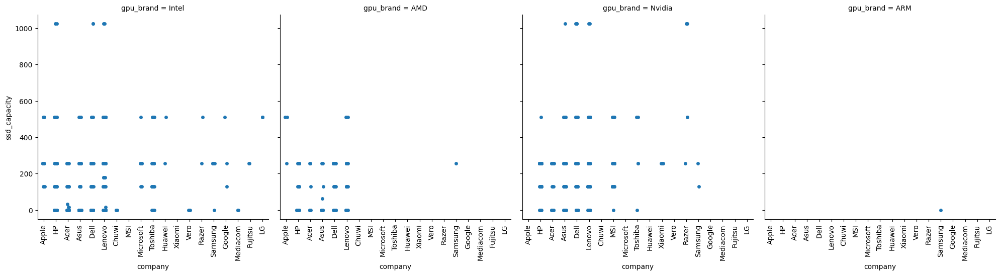

In [378]:
# company vs gpu_brand vs ssd_capacity.
# categorical vs categorical vs cateogrical/numerical.
g = sns.catplot(data = df, x = 'company' , y = 'ssd_capacity', col = 'gpu_brand')
[ax.tick_params(axis='x', labelrotation=90) for ax in g.axes.flat]
plt.show()
# similar conclusions - mostly 256gb ssd followed by 512 gb.

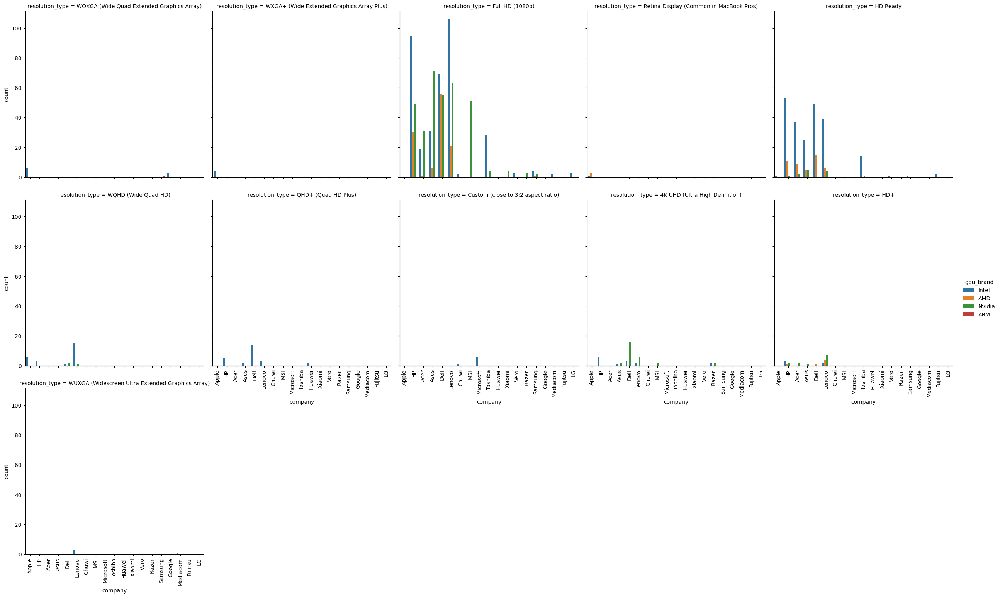

In [379]:
# company vs gpu_brand vs resolution_type.
g = sns.catplot(data=df, kind='count', x='company', hue='gpu_brand', col='resolution_type', col_wrap = 5)
[ax.tick_params(axis='x', labelrotation=90) for ax in g.axes.flat]
plt.show()
# for full hd screens(1920 X 1080) --> most all the companies - mostly use - intel gpu.
# for ultrahd and hd+ screens --> companies use nvidia gpus

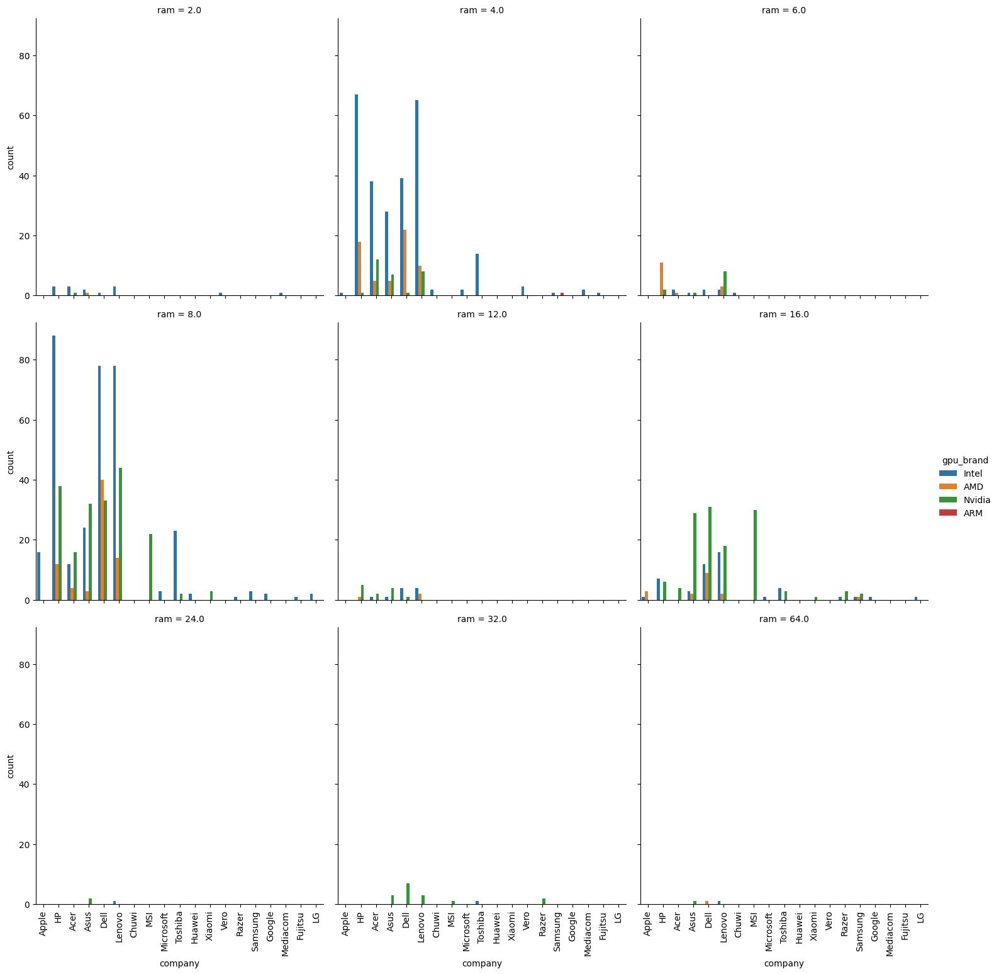

In [380]:
# company vs gpu_brand vs ram
g = sns.catplot(data=df, kind='count', x='company', hue='gpu_brand', col='ram', col_wrap = 3)
[ax.tick_params(axis='x', labelrotation=90) for ax in g.axes.flat]
plt.show()
# at lower ram capacity - across all the companies intel gpu are more popular.
# at higher ram capacity - across all the companies nvidia gpu are more popular.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


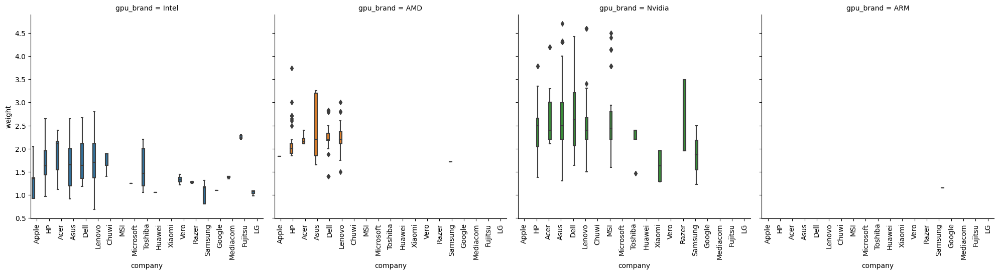

In [381]:
# company vs gpu_brand vs weight.
# cat vs cat vs numerical.
s = sns.catplot(data = df, x = 'company', y = 'weight', kind = 'box', hue = 'gpu_brand', col = 'gpu_brand')
[ax.tick_params(axis='x', labelrotation=90) for ax in s.axes.flat]
plt.show()

# across all the companies/brands intel gpu - are present with the lighter laptops.
# across all the companies/brands nvidia and amd gpu - comes with the heavier laptops.

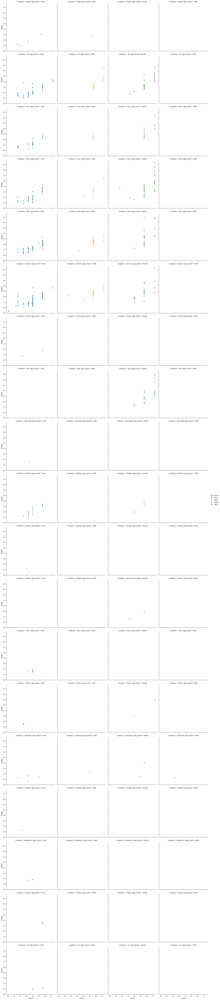

In [382]:
# company vs gpu_brand vs weight vs inches.
sns.relplot(data = df, x = 'inches', y = 'weight', row = 'company', col = 'gpu_brand', hue = 'gpu_brand')
# from the graph higher screen_size is proportional to the weight as it increases, weight follows.
# at higher scrrensizes - nvidia and amd gpu are most popular and intel gpu are popular among the regular and smaller sized products.

[None, None]

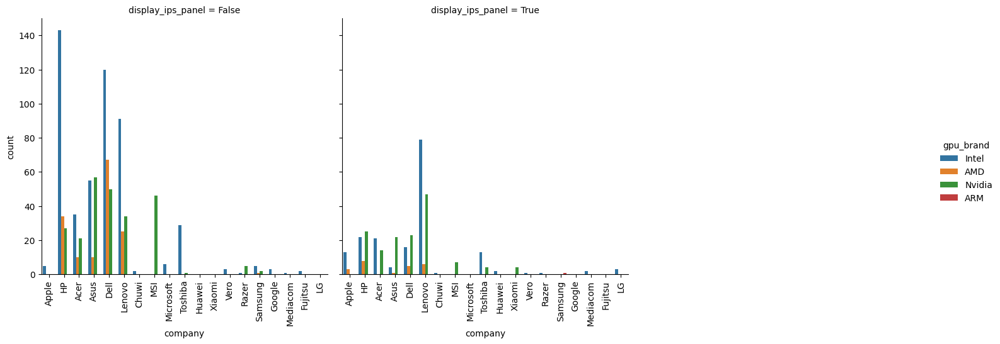

In [383]:
# company vs gpu_brand vs display_ips_panel 
# company vs gpu_brand vs display_is_touch_screen

g = sns.catplot(data=df, kind='count', x='company', hue='gpu_brand', col='display_ips_panel', col_wrap = 3)
[ax.tick_params(axis='x', labelrotation=90) for ax in g.axes.flat]

# from graph its looks lik ips_panel and gpu_brand are not much related.

In [384]:
def func1(var1):
    return var1[var1['display_ips_panel'] == True]['price'].median()

def func2(var2):
    return var2[var2['display_ips_panel'] == False]['price'].median()
    
temp_df_1 = df.groupby(['company','gpu_brand']).apply(func1, include_groups = False)
temp_df_2 = df.groupby(['company','gpu_brand']).apply(func2, include_groups = False)

ans_df = pd.concat([temp_df_1, temp_df_2], axis = 1)
ans_df.columns = [['display_ips_true','display_ips_false']]

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


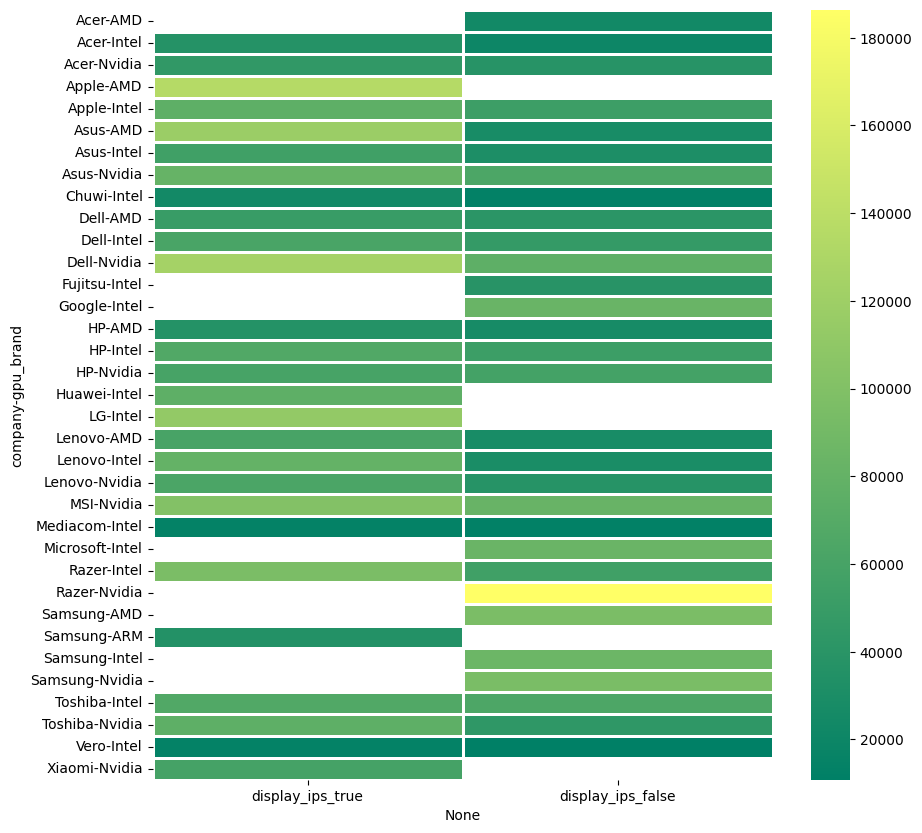

In [385]:
plt.figure(figsize = (10,10))
sns.heatmap(ans_df, cmap = 'summer', linewidth = 1)
plt.show()
# across all the brands - if the ips_panel is present the price is slighlty higher - not much - mostly due other factors -- like gpu_brand.

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


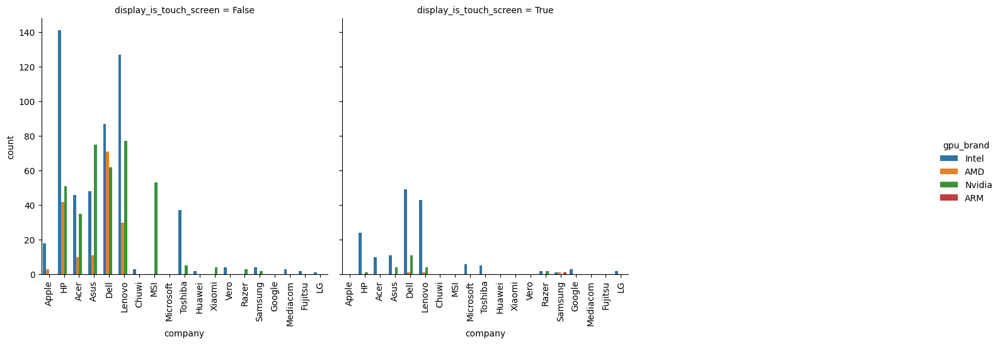

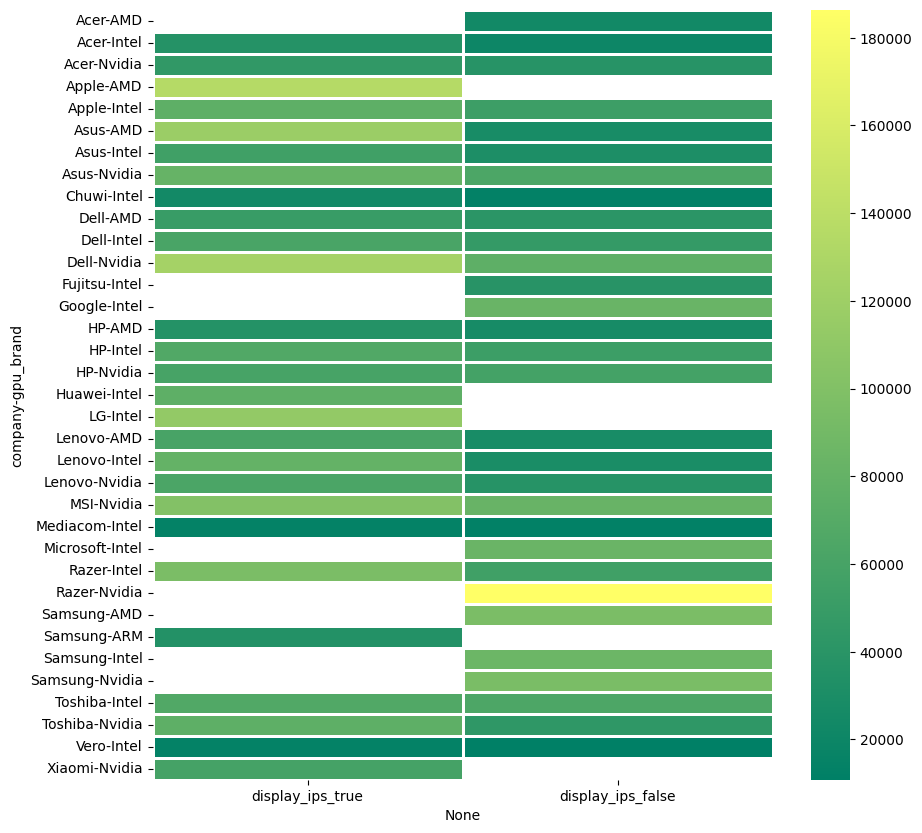

In [386]:
g = sns.catplot(data=df, kind='count', x='company', hue='gpu_brand', col='display_is_touch_screen', col_wrap = 3)
[ax.tick_params(axis='x', labelrotation=90) for ax in g.axes.flat]

def func3(var3):
    return var3[var3['display_is_touch_screen'] == True]['price'].median()

def func4(var4):
    return var4[var4['display_is_touch_screen'] == False]['price'].median()
    
temp_df_3 = df.groupby(['company','gpu_brand']).apply(func3, include_groups = False)
temp_df_4 = df.groupby(['company','gpu_brand']).apply(func4, include_groups = False)

plt.figure(figsize = (10,10))
sns.heatmap(ans_df, cmap = 'summer', linewidth = 1)
plt.show()
# touch_screen_display mostly comes with intel gpus.
# touch_screen_display is present - then the screen quality is mostly mid,high and very high. -- increasing price.
# touch_screen_display is usually - present with the higher - ppi.
# mostly 2 in one convertible - are the those with the touchscreen.
# higher ram is present in these touch_screen devices.
# mostly ssd is present.

In [387]:
df[df['display_is_touch_screen'] == True].groupby('quality_rank').size()

quality_rank
High          34
Lower         19
Mid          100
Very High     29
dtype: int64

In [388]:
df[df['display_is_touch_screen'] == True].groupby('ppi_whole').size().sort_values(ascending = False)

ppi_whole
166.0    43
141.0    21
276.0    19
157.0    13
282.0     9
135.0     9
100.0     8
210.0     8
176.0     8
201.0     6
331.0     6
235.0     5
352.0     4
127.0     4
158.0     4
224.0     3
118.0     2
147.0     2
221.0     2
255.0     2
317.0     2
195.0     1
190.0     1
dtype: int64

In [389]:
df[df['display_is_touch_screen'] == True].groupby('typename').size().sort_values(ascending = False)

typename
2 in 1 Convertible    111
Ultrabook              44
Notebook               18
Gaming                  5
Netbook                 2
Workstation             2
dtype: int64

In [390]:
df[df['display_is_touch_screen'] == True].groupby('ram').size().sort_values(ascending = False)

ram
8.0     98
16.0    39
4.0     29
12.0     7
32.0     4
6.0      3
2.0      1
24.0     1
dtype: int64

In [391]:
df[df['display_is_touch_screen'] == True].groupby('ssd_capacity').size().sort_values(ascending = False)

ssd_capacity
256.0     81
512.0     46
0.0       35
128.0     13
1024.0     7
dtype: int64

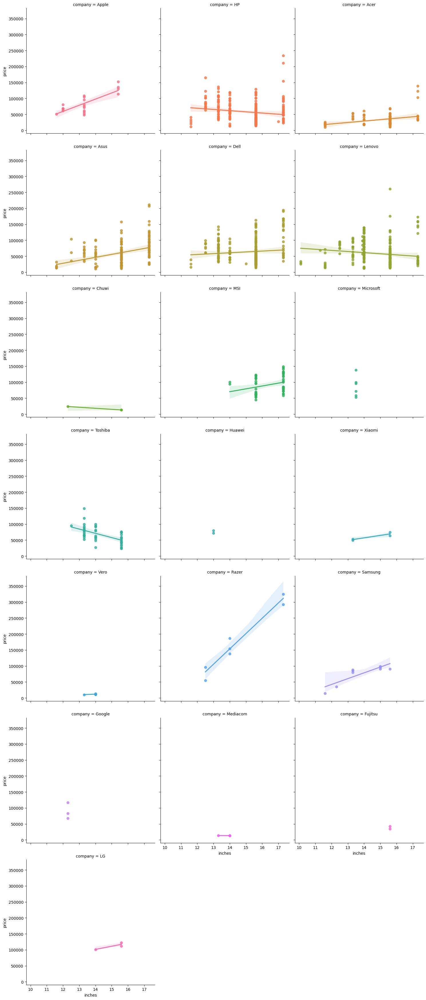

In [392]:
# company vs inches vs price.
#vategorical vs numerical vs numerial
sns.lmplot(data = df, x = 'inches', y = 'price', hue = 'company', col = 'company', col_wrap = 3)
# from the table and graph - we can see that whereever there is negative correlation in the inches and price - there - its lower - indicates that 
# for those brand the screen size doesn't affect the pricing of their products.
# these brands are - hp,lenovo,toshiba.
# for chuwi
# The correlation is ~ -1, which is perfect negative correlation.
# It suggests that bigger screen laptops tend to be cheaper, or Chuwi prices are consistent, regardless of screen size.

In [393]:
df.groupby('company')[['inches','price']].corr()

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


inches     price
company                             
Acer      inches  1.000000  0.317650
          price   0.317650  1.000000
Apple     inches  1.000000  0.795548
          price   0.795548  1.000000
Asus      inches  1.000000  0.379502
          price   0.379502  1.000000
Chuwi     inches  1.000000 -0.999860
          price  -0.999860  1.000000
Dell      inches  1.000000  0.092606
          price   0.092606  1.000000
Fujitsu   inches       NaN       NaN
          price        NaN  1.000000
Google    inches       NaN       NaN
          price        NaN  1.000000
HP        inches  1.000000 -0.162751
          price  -0.162751  1.000000
Huawei    inches       NaN       NaN
          price        NaN  1.000000
LG        inches  1.000000  0.866025
          price   0.866025  1.000000
Lenovo    inches  1.000000 -0.128690
          price  -0.128690  1.000000
MSI       inches  1.000000  0.304836
          price   0.304836  1.000000
Mediacom  inches  1.000000 -0.132068
          price  -0.132068  1.000000
Microsoft inches       NaN       NaN
          price        NaN  1.000000
Razer     inches  1.000000  0.976331
          price   0.976331  1.000000
Samsung   inches  1.000000  0.848124
          price   0.848124  1.000000
Toshiba   inches  1.000000 -0.561515
          price  -0.561515  1.000000
Vero      inches  1.000000  0.492185
          price   0.492185  1.000000
Xiaomi    inches  1.000000  0.912015
          price   0.912015  1.000000

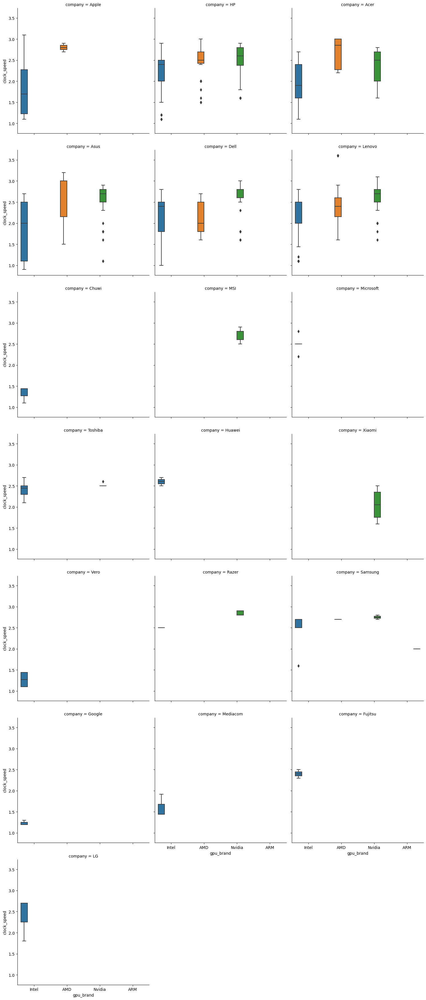

In [394]:
# company vs gpu_brand vs clock_speed
# categorical vs categorical vs numerical.
sns.catplot(data = df, x = 'gpu_brand', y = 'clock_speed', kind = 'box', col = 'company', col_wrap = 3,hue = 'gpu_brand')

# nvidia and amd gpu are present in devices with the cpu of higher clock speeds for most of the brands in dataset.
# but for brands like lenovo,dell and HP nvidia gpu - also comes with cpu of lower clock_speed
# intel_gpu are present with the wide range of cpu_clock_speed.

In [395]:
df['ram'].value_counts()

ram
8.0     596
4.0     353
16.0    192
6.0      34
12.0     25
32.0     17
2.0      16
64.0      3
24.0      3
Name: count, dtype: int64

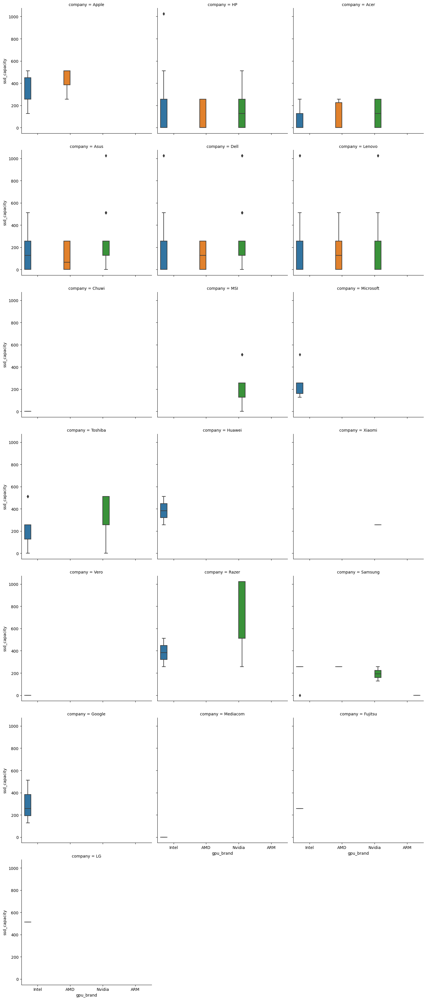

In [396]:
# company vs gpu_brand vs ssd_capacity.
# cat vs cat vs cat/num.
sns.catplot(data = df, x = 'gpu_brand', y = 'ssd_capacity', col= 'company', col_wrap = 3, kind = 'box', hue = 'gpu_brand')
# nvidia gpu is mostly present with higher ssd_capaties.
# intel_gpu - present with both the lower_ssd and higher_ssd capacity.
# amd gpu - are present with the moderated -ssd_capacities excpet for the apple devices - they are present at the higher ssd capacities.

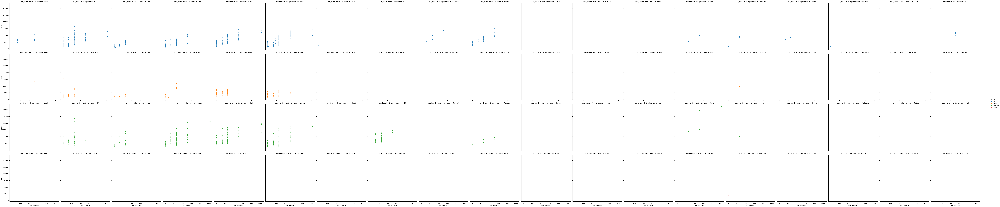

In [397]:
# company vs gpu_brand vs ssd_capacity. vs price.
sns.relplot(data = df, x = 'ssd_capacity', y = 'price', col= 'company', row = 'gpu_brand', kind = 'scatter', hue = 'gpu_brand')
# ssd capacity increases so price also increases
# across all the companies amd gpu is present with the mostly with the lower i.e 128gb or mid ssd capacity 256gb.
# across all the companies nvidia gpu is present with the higher ssd_capacites also.

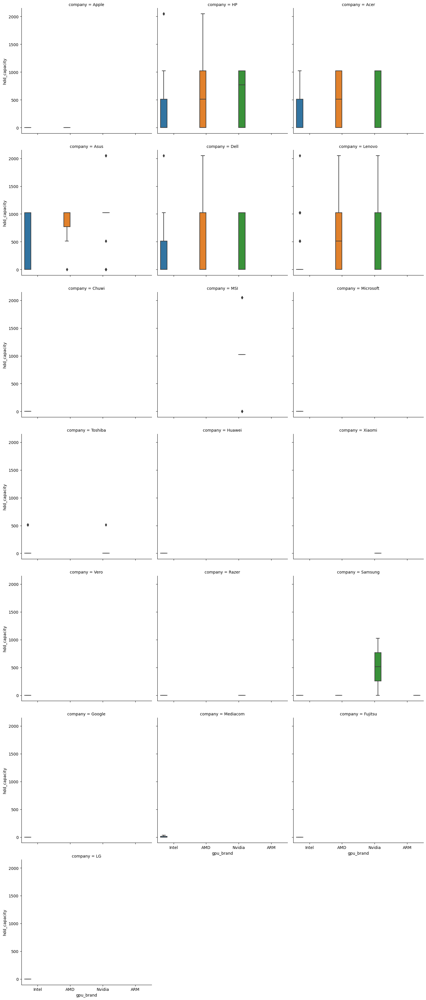

In [398]:
# company vs gpu_brand vs hdd_capacity
sns.catplot(data = df, x = 'gpu_brand', y = 'hdd_capacity', col= 'company', col_wrap = 3, kind = 'box', hue = 'gpu_brand')

# intel_gpu across all the companies is present with the lower hdd capacity devices.
# across all the companies nvidia, amd gpu are present with higher hdd capacity devices.


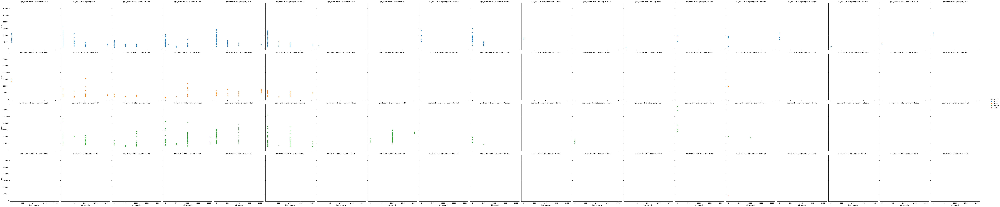

In [399]:
sns.relplot(data = df, x = 'hdd_capacity', y = 'price', col= 'company', row = 'gpu_brand', kind = 'scatter', hue = 'gpu_brand')
# for devices with the intel_gpu - as hdd capacity increases the price decreases - we can see it from the graph.
# for devices with the amd_gpu -  as hdd capacity increases the price doesnt get affected, but varies at the same hdd_capacity level
# for devices with the nvidia gpu - prices tend to increase as HDD capacity increases. High-capacity HDDs often come with higher-priced devices, indicating that Nvidia GPUs are typically found in higher-spec, premium devices.

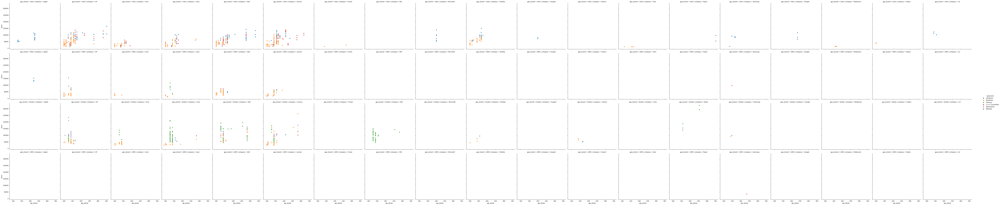

In [400]:
# company vs gpu_brand vs ppi_whole vs price.
sns.relplot(data = df, x = 'ppi_whole', y = 'price', col = 'company', row = 'gpu_brand', kind = 'scatter', hue = 'typename')
# across all the companies, across all the gpu brand - the price increases with the ppi.
# but the price also varies at the same ppi level.
# 2 in one convertible are available at higher prices with higher ppi - mostly with the intel_gpu configuration.
# ultrabooks mostly use the intel_gpu and they are at the higher ppi.
# gaming laptops mostly have lesser ppi - but other specs are top notch -- except specs related to display.

# higher ppi is mostly present in notebooks,ultrabooks, 2 in one convertible.

# Gaming laptops often prioritize refresh rate over PPI:
# Many have lower PPI because they stick to Full HD (1920x1080) resolution on larger screens (15"-17") for better frame rates and reduced GPU load.
# They focus on high refresh rates (120Hz/144Hz/240Hz) and response times instead of PPI.
# However, their other specs are high-end: powerful GPUs (Nvidia/AMD), fast processors, more RAM, and advanced cooling systems.

In [401]:
df[df['ppi_whole'] > 150]['typename'].value_counts()

typename
Ultrabook             155
Notebook              124
2 in 1 Convertible     80
Gaming                 20
Workstation             4
Netbook                 4
Name: count, dtype: int64

In [402]:
checklist = ['ram','inches','ssd_capacity','hdd_capacity','ppi_whole','resolution_type','quality_rank']
for i in checklist:
    print(df[df['typename'] == 'Gaming'].groupby(i).size().sort_values(ascending = False))
    print(25 * '*')
# ram is higher mostly
# std display size of 15.6inches
# mostly ssd is present.
# higher hdd 
# lower ppi
# full hd display (1920 X 1080 p)

ram
16.0    97
8.0     81
32.0    14
12.0     7
24.0     2
4.0      1
64.0     1
dtype: int64
*************************
inches
15.6    106
17.3     92
14.0      5
dtype: int64
*************************
ssd_capacity
256.0     86
128.0     60
0.0       27
512.0     25
1024.0     5
dtype: int64
*************************
hdd_capacity
1024.0    168
0.0        30
2048.0      5
dtype: int64
*************************
ppi_whole
141.0    98
127.0    85
282.0     7
255.0     6
157.0     5
188.0     1
170.0     1
dtype: int64
*************************
resolution_type
Full HD (1080p)                   188
4K UHD (Ultra High Definition)     13
WQHD (Wide Quad HD)                 2
dtype: int64
*************************
quality_rank
Mid          188
Very High     13
High           2
dtype: int64
*************************


In [403]:
df[df['typename'] == 'Gaming'].groupby(['display_ips_panel']).agg({'price':['mean','median']})

price            
                           mean      median
display_ips_panel                          
False              92728.438510  79375.7448
True               91505.515531  77202.7200

In [404]:
df[df['typename'] == 'Gaming'].groupby(['display_is_touch_screen']).agg({'price':['mean','median']})

price            
                                  mean      median
display_is_touch_screen                           
False                     90497.702618  79375.7448
True                     159786.720000  67612.3200

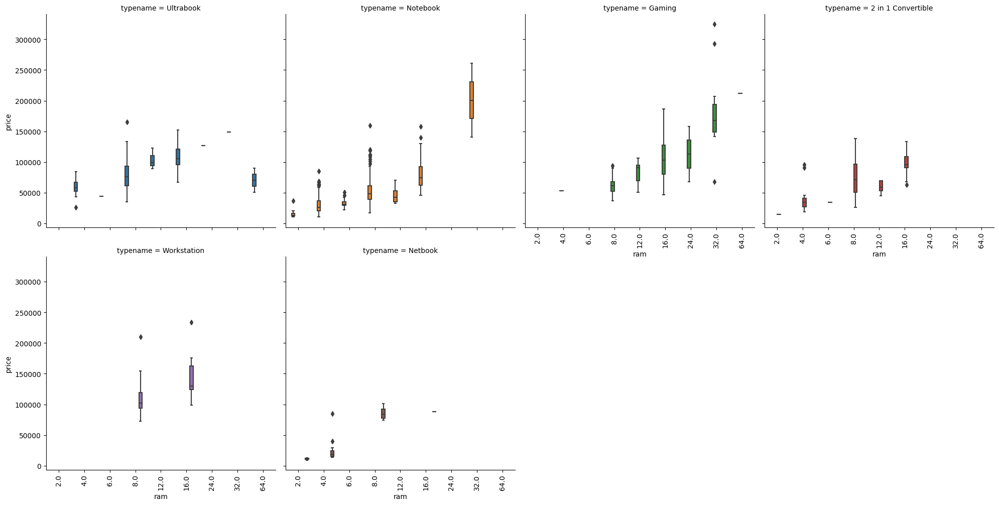

In [405]:
# typename vs ram vs price
# categorical vs categorical/numerical vs numerical 

x = sns.catplot(data = df, x = 'ram', y = 'price', col = 'typename', kind = 'box', col_wrap = 4, hue = 'typename')
[ax.tick_params(axis='x', labelrotation=90) for ax in x.axes.flat]
plt.show()

# conclusion done - previously.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When groupi

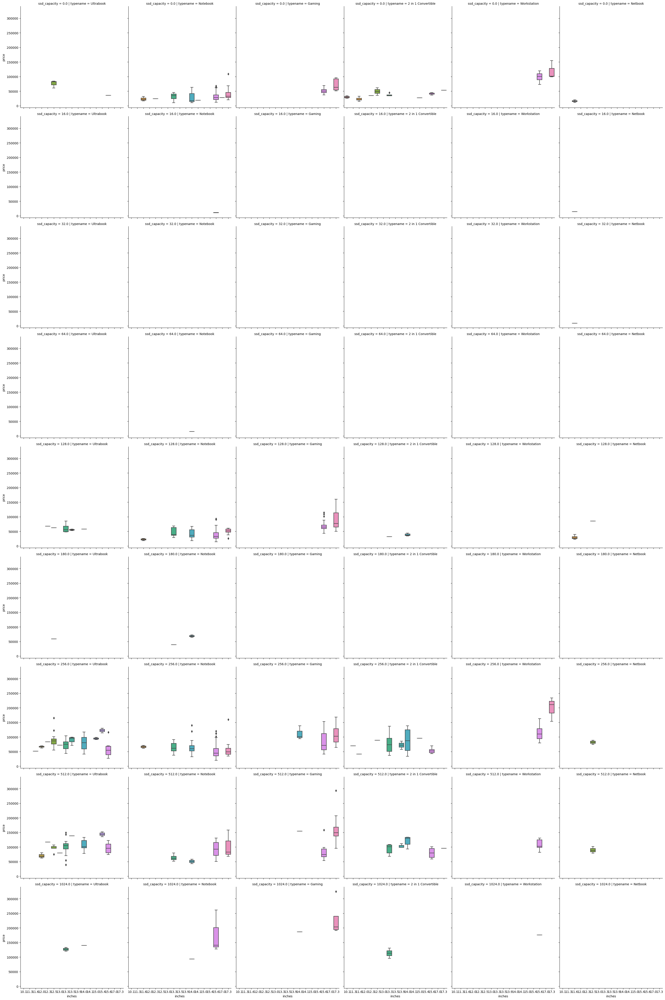

In [406]:
# typename ,inches, price, ssd_capacity

sns.catplot(data = df, x = 'inches', y = 'price', col = 'typename', row = 'ssd_capacity',kind = 'box')

# higher ssds push the prices.
# for ultrabook, notebooks and gaming laptops and workstation
# as the screen size increases the price increases , but not for the other categories of laptops the price either remains same or inc/dec but not by a huge amount.
# ultrabooks and the 2 in one convertible -- offers products at premium even at the smaller screens.


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


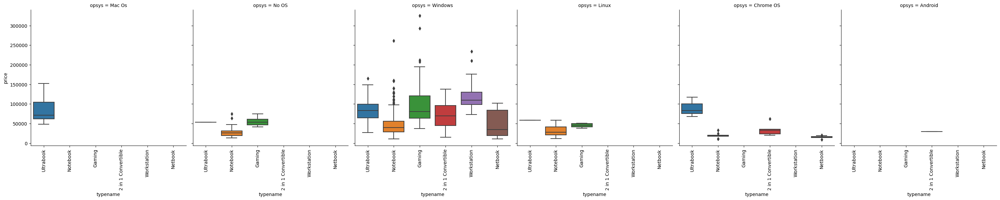

In [407]:
# typename vs opsys vs price.
# categorical vs categorical vs numerical

x = sns.catplot(data = df, x = 'typename', y = 'price', col = 'opsys', kind = 'box')
[ax.tick_params(axis='x', labelrotation = 90) for ax in x.axes.flat]
plt.show()

# windows comes in all the kinds of laptops and with a wide price range.
# ultrabooks are always charged at premium - except when they dont have an os with them.
# chromeos is mostly present in the netbooks but they all are very low price and its also present in very very few - utlrabooks
# but they are expensive as have better ram, cpu, screen quality and other factors.

In [408]:
df.groupby('opsys').agg({
    'price' : ['mean','median']
})

price            
                   mean      median
opsys                              
Android    29250.720000  29250.7200
Chrome OS  29495.018667  19980.0000
Linux      33182.494232  31409.6256
Mac Os     83340.499886  71378.6832
No OS      31892.934400  27652.3200
Windows    64332.649184  57489.1200

In [409]:
df.groupby('typename').agg({
    'price' : ['mean','median']
})

price             
                             mean       median
typename                                      
2 in 1 Convertible   69063.172800   63882.7200
Gaming               92204.328662   79215.1056
Netbook              37043.888727   19713.6000
Notebook             42086.544028   37242.7200
Ultrabook            83392.545143   79920.0000
Workstation         121497.525683  110017.8720

In [410]:
df[df['opsys'] == 'Chrome OS'].groupby('typename').size()

typename
2 in 1 Convertible    7
Netbook               8
Notebook              9
Ultrabook             3
dtype: int64

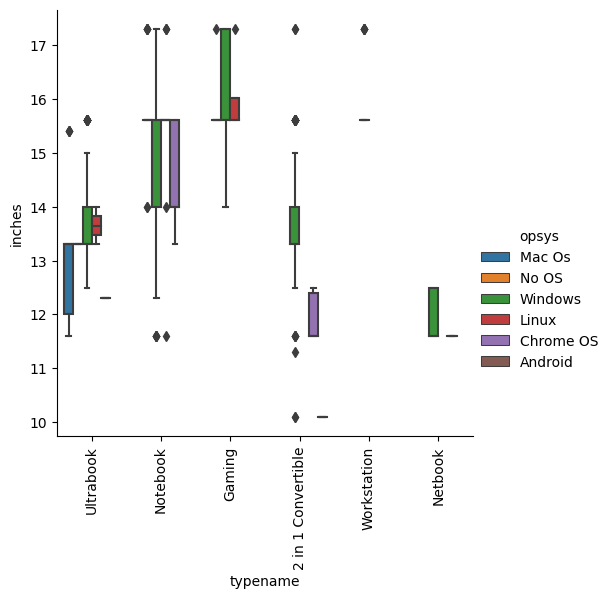

In [411]:
# typename vs opsys vs inches.
# cat, cat, vs numerical

sns.catplot(data = df, x = 'typename', y = 'inches', kind = 'box', hue = 'opsys')
plt.xticks(rotation = 90)
plt.show()
# ultrabooks - from apple(mac books) -- they generally have the smaller sized screens.
# chromeos - is usually present in the notebooks or 2 in one convertible with the smaller sizes.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When groupi

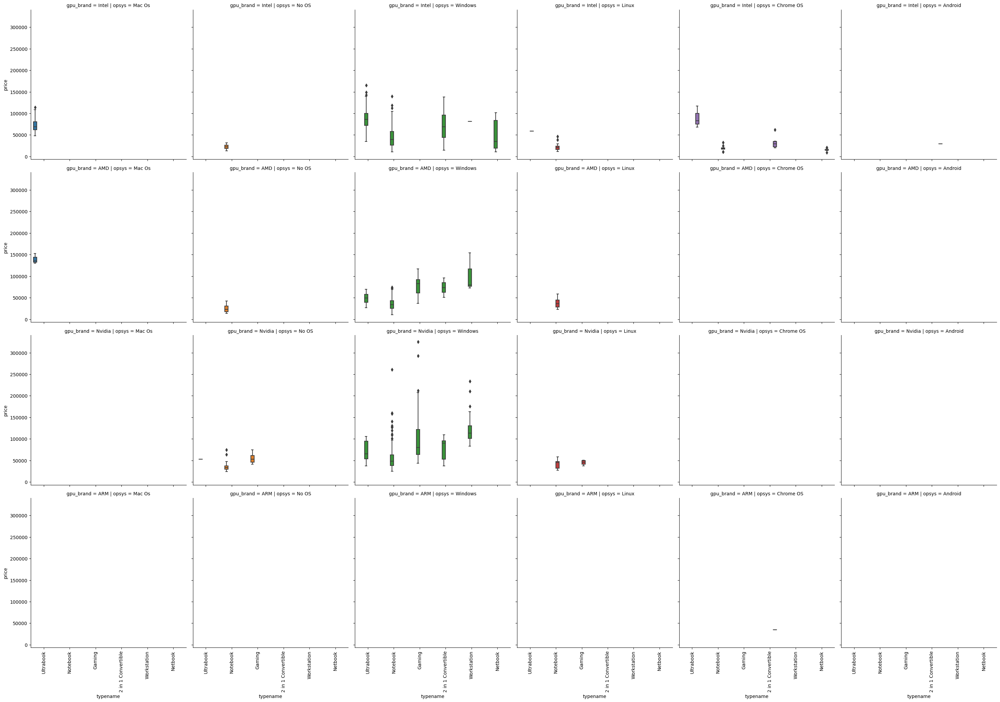

In [412]:
# typename vs opsys vs gpu_brand 
# cat vs cat vs cat
x = sns.catplot(data = df , x = 'typename', y = 'price', col = 'opsys', hue = 'opsys',row = 'gpu_brand', kind = 'box')
[ax.tick_params(axis='x', labelrotation = 90) for ax in x.axes.flat]
plt.show()

# the median price of the nvidia gpu - mac books is higer than the mackbooks with the amd gpu.
# for any brand of gpu -  a workstation with the windows opsys is more expensive than the other categories of laptops with the windows opsys.
# laptops with the windows opsys -- for any kind of gpu the workstation costs more than the gaming laptops.

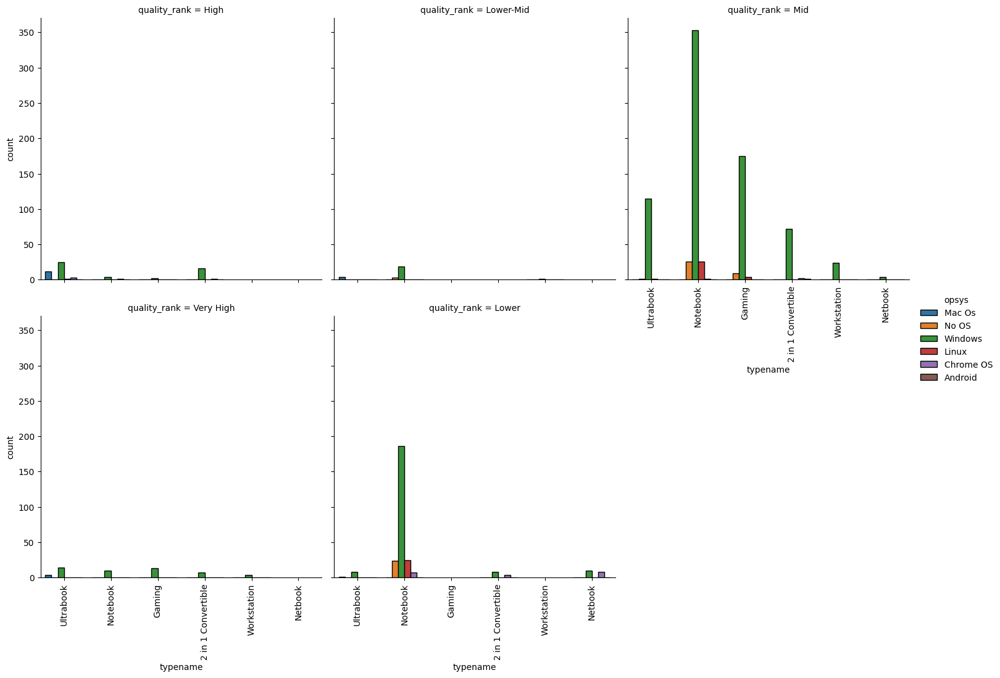

In [413]:
# typename, opsys vs resolution_type
# categorical vs categorical vs categorical.

x = sns.catplot(data = df, kind = 'count', x = 'typename', col = 'quality_rank', hue = 'opsys', col_wrap = 3,edgecolor = 'black')
[ax.tick_params(axis='x', labelrotation = 90) for ax in x.axes.flat]
plt.show()


# most of the devices have the mid_quality_screens.
# notebooks mostly contain the windows opsys and mid quality screens.
# ultrabooks mostly contains windows/mac os - opsys and high, very high or lower quality screens.
# the lowerquality screens mostly comes in the notebooks - with the windows opsys.

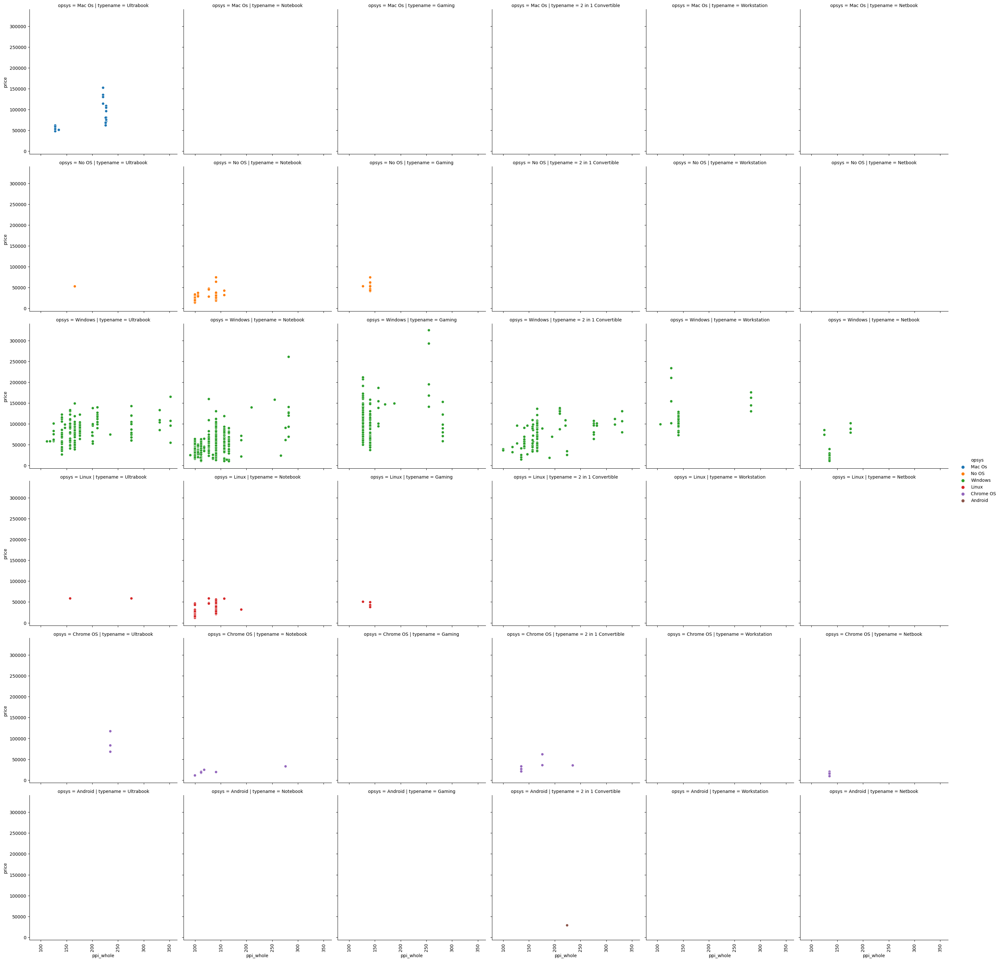

In [414]:
# typename vs opsys vs ppi_whole vs price
# categorical vs categorical vs numerical vs numerical

s = sns.relplot(data = df, x = 'ppi_whole', y = 'price', col = 'typename', row = 'opsys', hue = 'opsys')
[ax.tick_params(axis='x', labelrotation = 90) for ax in s.axes.flat]
plt.show()

# as ppi increases - price increases across all typename/type of laptops - with all the kinds of opsys.
# and at the same ppi level the price varies because of the other factors.

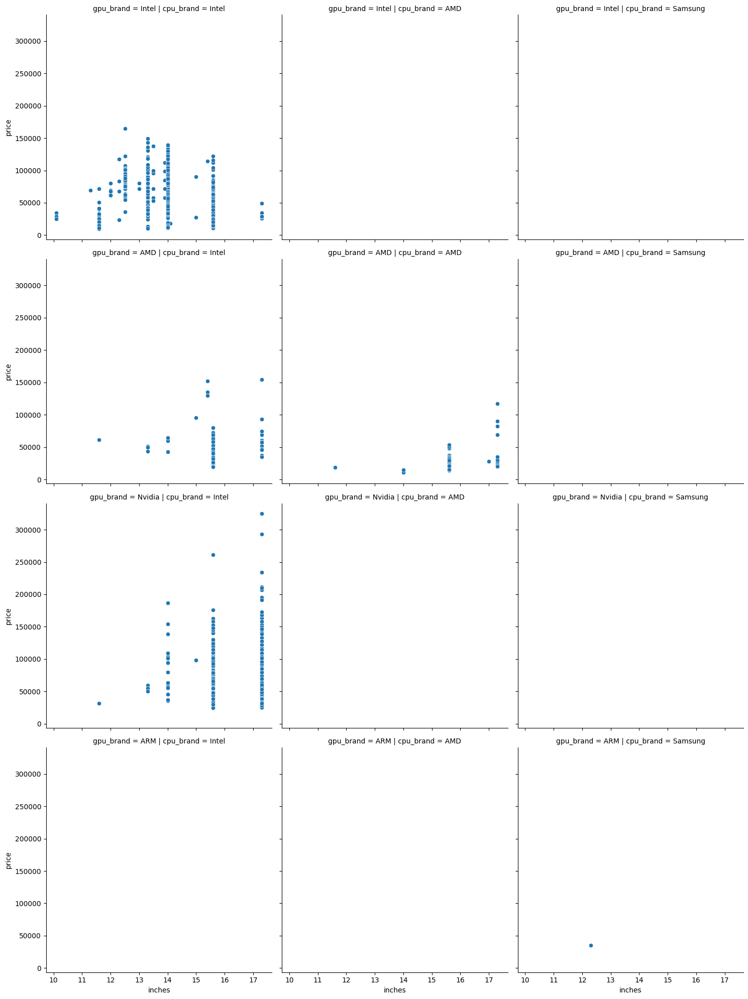

In [415]:
# cpu_brand vs gpu_brand vs inches vs price.
sns.relplot(data = df, x = 'inches', y = 'price', col = 'cpu_brand', row = 'gpu_brand')
# price increases with the inches but mostly because of the other specs like ram, gpu_brand etc
# the most common combination intel_gpu, intel cpu.  -- not extremely expensive
# the most expensive combination is the gpu_brand = nvidia, cpu_brand - intel.
# moderately expensive combination is the gpu_brand = intel and cpu_brand = amd.

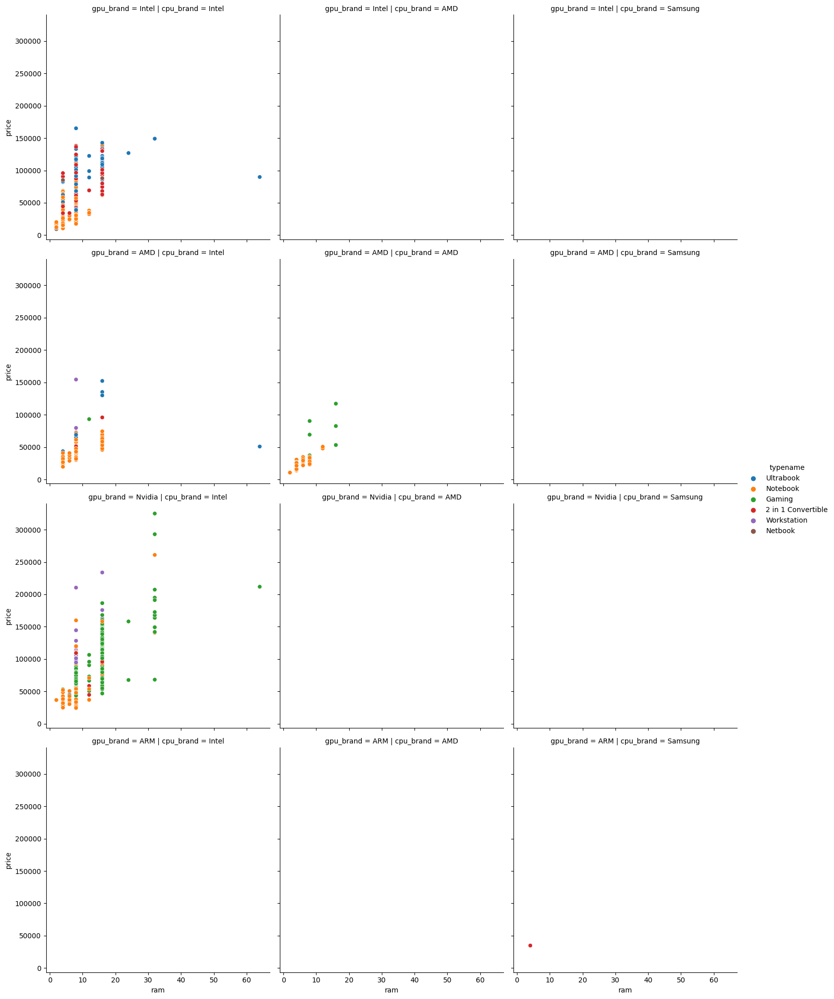

In [416]:
# cpu_brand vs gpu_brand vs ram vs price vs typename.

sns.relplot(data = df, x = 'ram', y = 'price', col = 'cpu_brand', row = 'gpu_brand', hue = 'typename')
plt.show()

# for the intel gpu and intel cpu - combination the price is moderately expensive and the ram is usually in the silghtly higher ranges ~ upto 16gb --- 
# ultrabooks and 2 in 1 convertible dominates here and both are at the higher prices and the notebooks are available here at the lower prices.

# for the amd gpu and intel cpu -combination is moderately expensive and the ram is in the slightly higher range upto 16gb. -- mostly notebooks , then workstation and ultrabooks.
# for the amd gpu and amd cpu -combination is moderately expensive and the ram is in the slightly higher range upto 16gb.   -- mostly notebooks and the gaming one make the price higher.
# for the nvidia gpu and intel cpu -combination is expensive and the ram is higher.  -- they are gaming(dominates here.), notebooks , workstation and few 2 in 1 convertible.
# workstation also have - intel cpu and nvidia gpu - combination moslty and have higher prices.

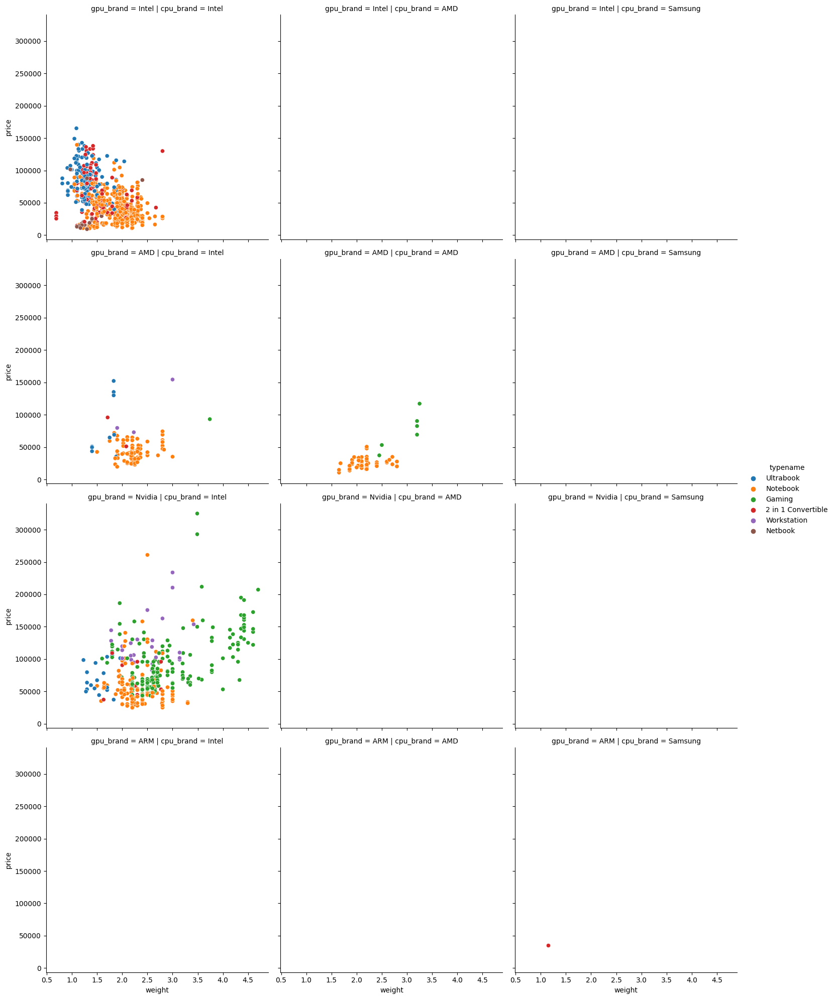

In [417]:
# cpu_brand vs gpu_brand vs weight vs price.
# categorical vs categorical vs numerical vs numerical.

sns.relplot(data = df, x = 'weight', y = 'price', col = 'cpu_brand', row = 'gpu_brand', hue = 'typename')

# ultrabooks - lesser in weight - higher in price.  -- mostly intel cpu, intel gpu.
# notebooks of intel cpu and intel gpu - weighs upto 2.5kg -3kg mostly - moderately expensive not as high as ultrabooks.
# notebooks of the amd gpu and intel cpu - lower price under 70k mostly. -- weight under 2.5kg - 3kg
# notebooks of the amd gpu and amd cpu - also around the price under 70k mostly. -- weight around 2.5 - 3kg.
# gaming laptops most of them - have intel cpu and nvidia gpu - and weight more than 2.5kg.
# workstation laptops most of them have intel cpu and nvidia gpu and they are moderately expensive.

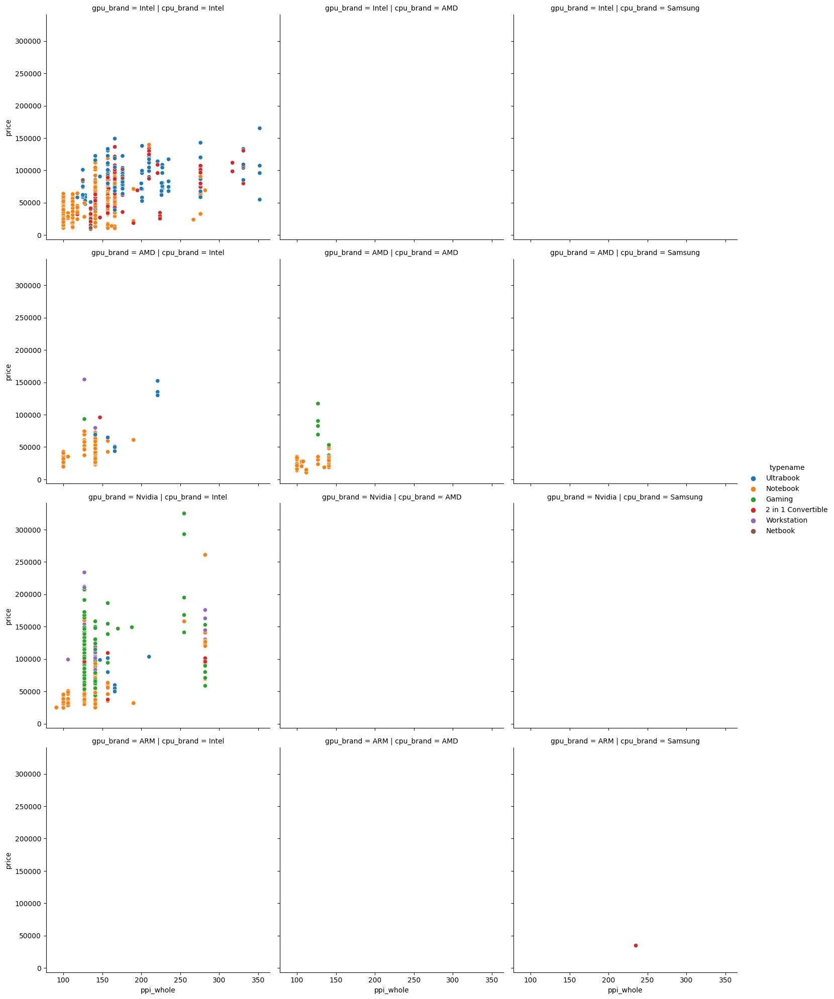

In [418]:
# cpu_brand vs gpu_brand vs ppi_whole vs price.
# cat vs cat vs num vs num
sns.relplot(data = df, x = 'ppi_whole',y = 'price',col = 'cpu_brand', row = 'gpu_brand', hue = 'typename')

# as ppi is increasing - the prices do increase generally.
# for the ultrabooks - which are mostly made of intel_cpu and intel_gpu - they are available at a higher and lower ppi level and the price still remains higher.
# the notebooks in general have lower ppi  -- across all the cpu_brand, gpu_brand combination. -- and most of them have moderate price.
# gaming laptops mostly have the combination of nvidia gpu and intel cpu -- have lower ppi  -- price vary - but mostly higher prices.
# 2 in 1 Convertible laptops are moderately expensive(50k - 100k) but have a huge range of ppi_whole.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


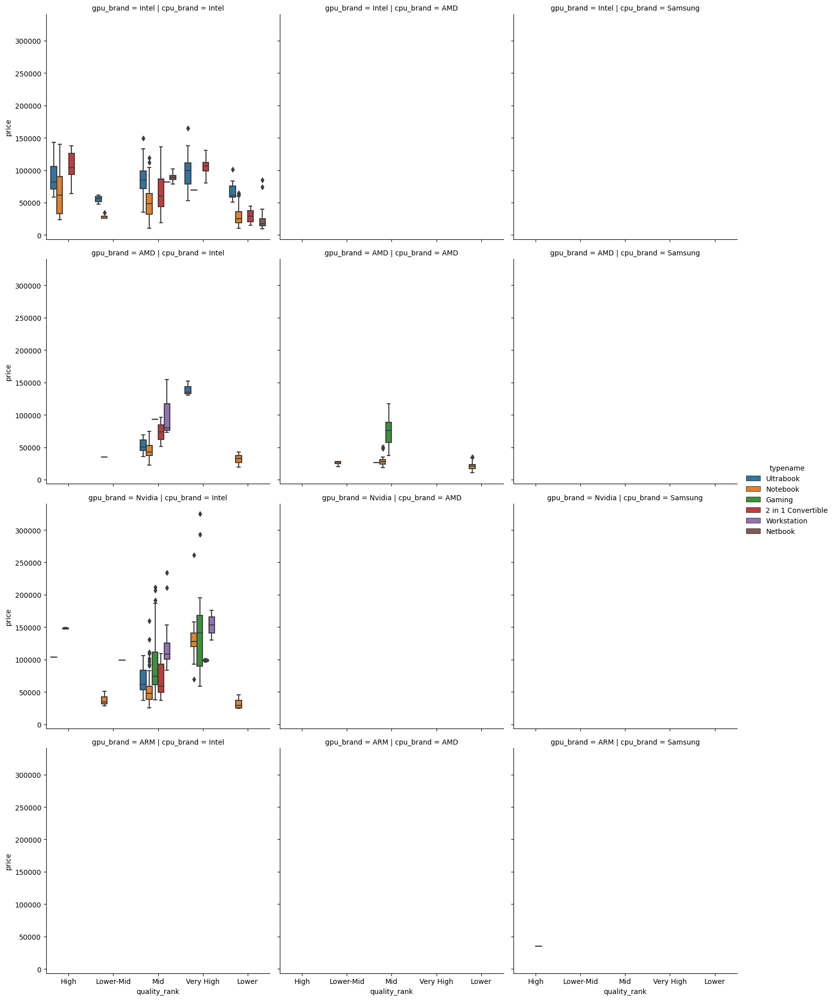

In [419]:
sns.catplot(data = df, x = 'quality_rank',y = 'price',col = 'cpu_brand', row = 'gpu_brand', hue = 'typename', kind = 'box')
# similar conclusions
# workstation and gaming pc - expensive even at the relatively lower screen quality because of the other parameters.

# 2 in one convertible laptops - have moderately expensive price, but at the lower quality screen - the price reduces and at the higher quality screens
# the price is usually higher - because a 2 in 1 device is intended to be used as a laptop and tablet. - so if screen quality is not good the price will be lesser.

# rest for the other type across all the cpu_brand and gpu_brand combination if the screen quality increases the price increases.

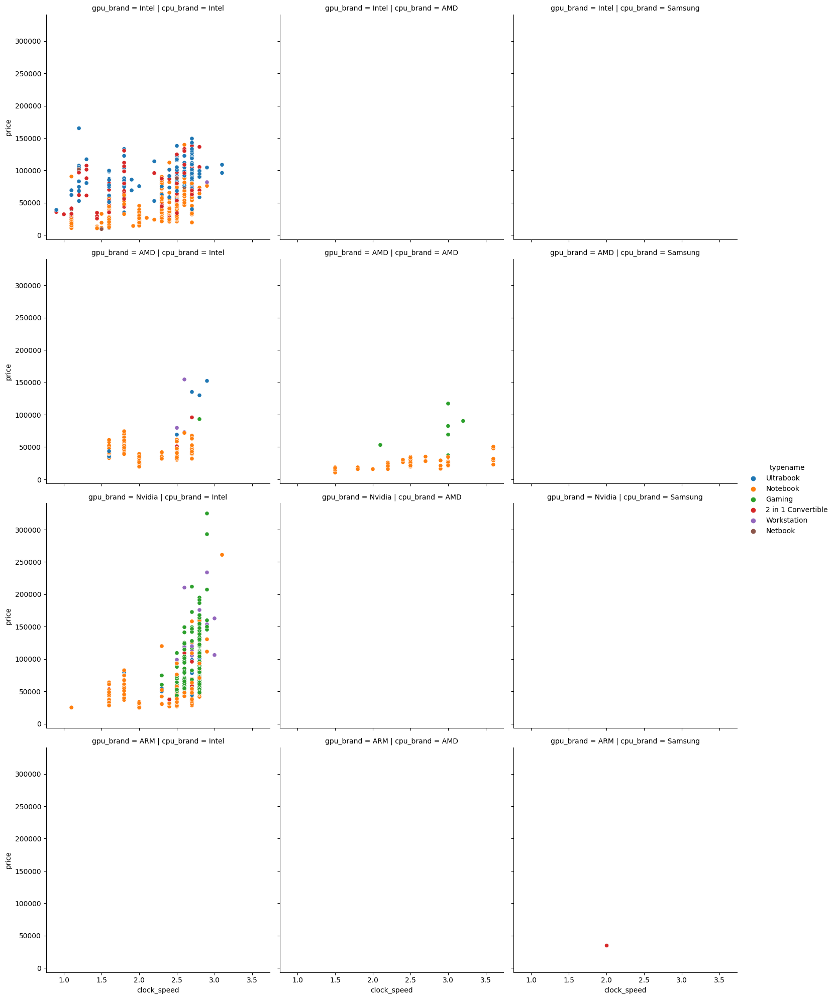

In [420]:
# cpu_brand vs gpu_brand vs clock_speed vs price
# cat vs cat vs num vs num

sns.relplot(data = df, x = 'clock_speed', y = 'price', col = 'cpu_brand', row = 'gpu_brand', kind = 'scatter', hue = 'typename')

# its clear form the graph as the clock_speed inc price inc.
# notebooks comes in the wide range of clock_speed.
# gaming laptops usually comes at the higher range of clock_speed.
# the 2 in 1 convertible comes in wide range of clock_speed.
# ultrabooks also come in the wide range of clock_speed - but the cost of ultrabooks is still higher even at the lower speed - intel cpu vs nvidia gpu.
# workstation also come at the higher clock speed and higher price - intel cpu and nvidia gpu.

# for the notebooks with the amd_cpu and amd_gpu - the clock speeds are higher at the lower price -- this lower price is because of these factors
#  mostly std sized screen - 15.6 inches,lower ram config,mostly no ssd(more that 50% dont have ssd and if present 256gb or less,mostly 1 tb hdd, and 512gb hdd,
# low ppi 100 to 141, full hd or hd ready display,  screen quality is - mid, lower, lower-mid quality, display is not ips, not a touch screen display.
# the gaming laptops with the amd_cpu and amd_gpu - have high clock speed but still lower priced.  -- same reasons as above ones.

In [421]:
checklist = ['typename','inches','ram','display_ips_panel','display_is_touch_screen','gpu_brand','clock_speed','ssd_capacity','ppi_whole']
for i in checklist:
    print(df[(df['cpu_brand'] == 'AMD') & (df['gpu_brand'] == 'AMD')].groupby(i).size().sort_values(ascending = False))
    print(25 * '*')
#  mostly std sized screen - 15.6 inches
# lower ram config.
# mostly no ssd(more that 50% dont have ssd and if present 256gb or less.)
# mostly 1 tb hdd, and 512gb hdd.
# low ppi 100 to 141.
 # mid, lower, lower-mid quality.
# full hd or hd ready display.
# display is not ips
# no touch screen

typename
Notebook     53
Gaming        6
Ultrabook     1
dtype: int64
*************************
inches
15.6    46
17.3    10
14.0     2
11.6     1
17.0     1
dtype: int64
*************************
ram
4.0     31
8.0     12
6.0     11
16.0     3
12.0     2
2.0      1
dtype: int64
*************************
display_ips_panel
False    54
True      6
dtype: int64
*************************
display_is_touch_screen
False    60
dtype: int64
*************************
gpu_brand
AMD    60
dtype: int64
*************************
clock_speed
3.0    17
2.5    14
2.2     7
1.5     5
3.6     5
2.9     3
1.8     2
2.4     2
2.7     2
2.0     1
2.1     1
3.2     1
dtype: int64
*************************
ssd_capacity
0.0      33
256.0    16
128.0     8
512.0     2
64.0      1
dtype: int64
*************************
ppi_whole
100.0    23
141.0    23
127.0     7
106.0     3
112.0     2
108.0     1
135.0     1
dtype: int64
*************************


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


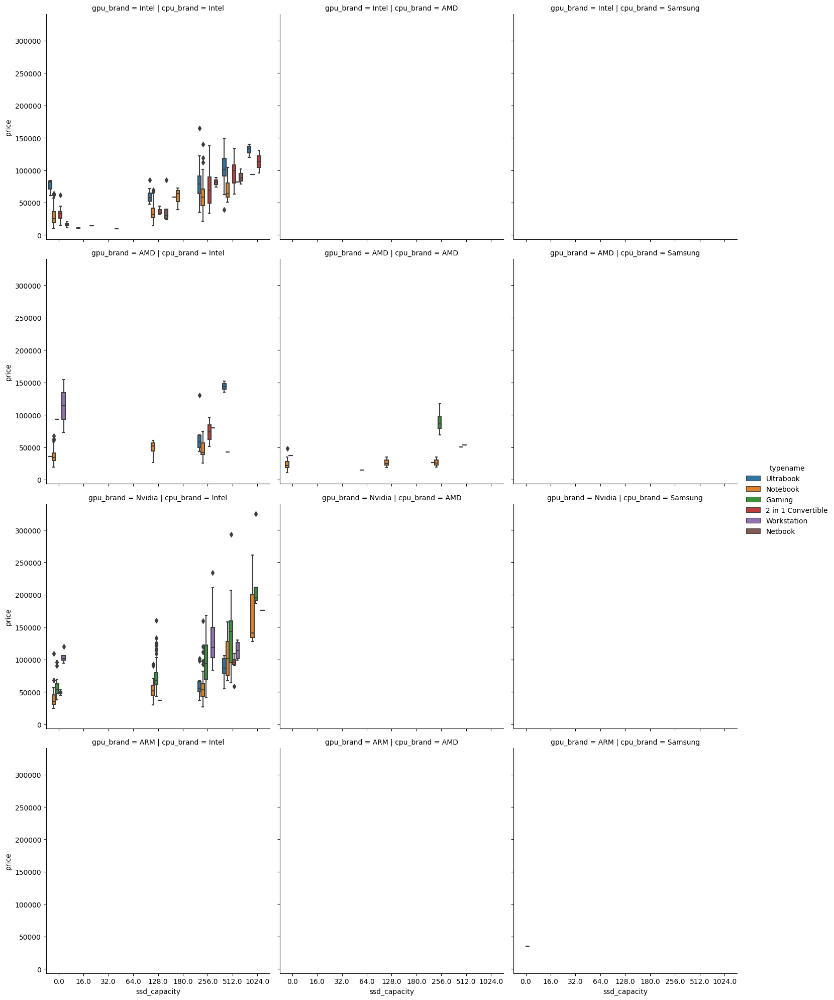

In [422]:
# cpu_brand vs gpu_brand vs ssd_capacity vs price
# categorical vs categorical vs categorical vs numerical.

sns.catplot(data = df, x = 'ssd_capacity', y = 'price', col = 'cpu_brand', row = 'gpu_brand', hue = 'typename', kind = 'box')
# across all the cpu_brand, gpu_brand combination as the ssd_capaicty increases the price increases.
# for intel cpu and nvidia gpu - combination as the ssd_capacity increases the price for all the categories/typename of laptops increases
# but for the workstation the median price remain same.


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


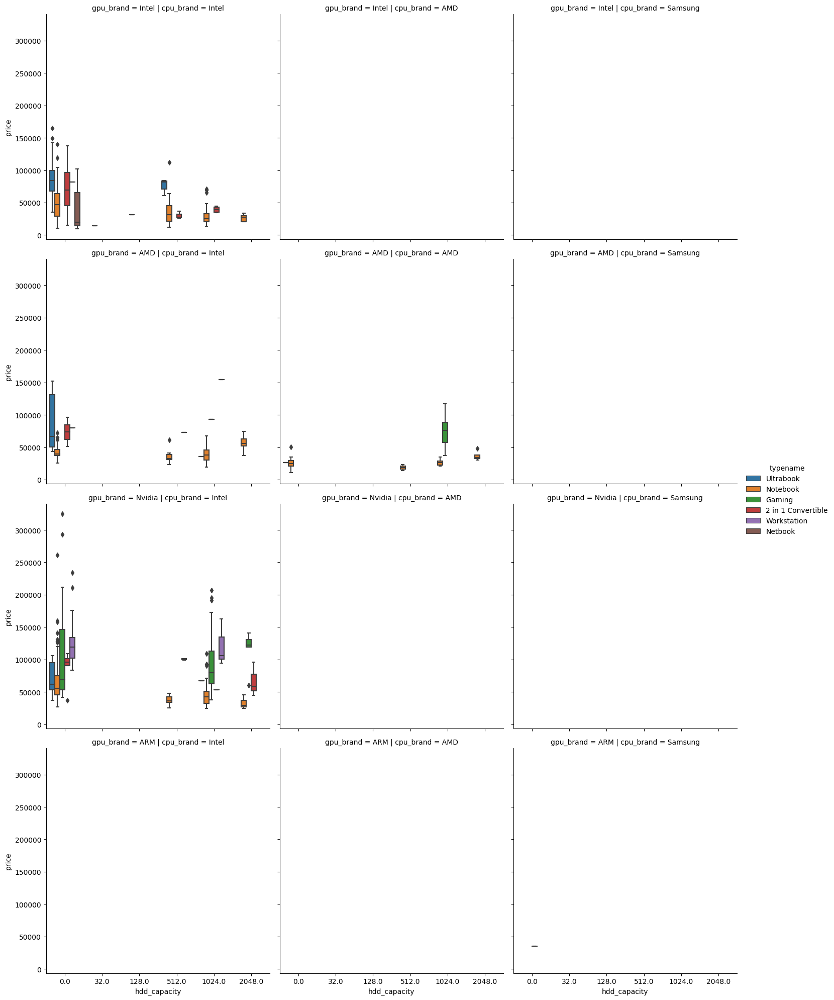

In [423]:
# cpu_brand vs gpu_brand vs hdd_capacity vs price
# categorical vs categorical vs categorical vs numerical.

sns.catplot(data = df, x = 'hdd_capacity', y = 'price', col = 'cpu_brand', row = 'gpu_brand', hue = 'typename', kind = 'box')

# median price across all the gpu_brand and cpu_brands as the hdd_capacity increases the price doenst change significantly.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


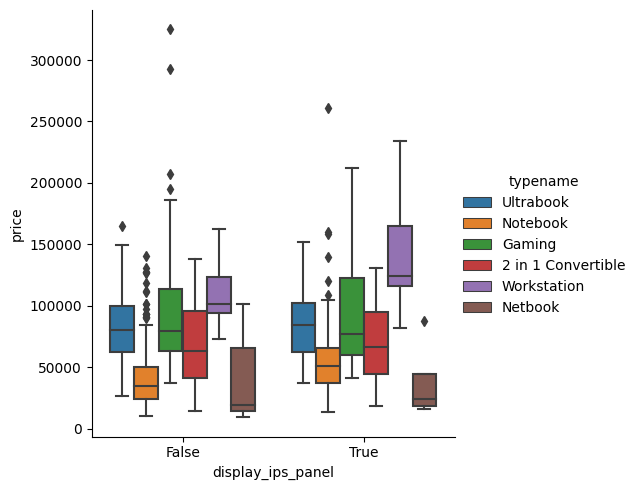

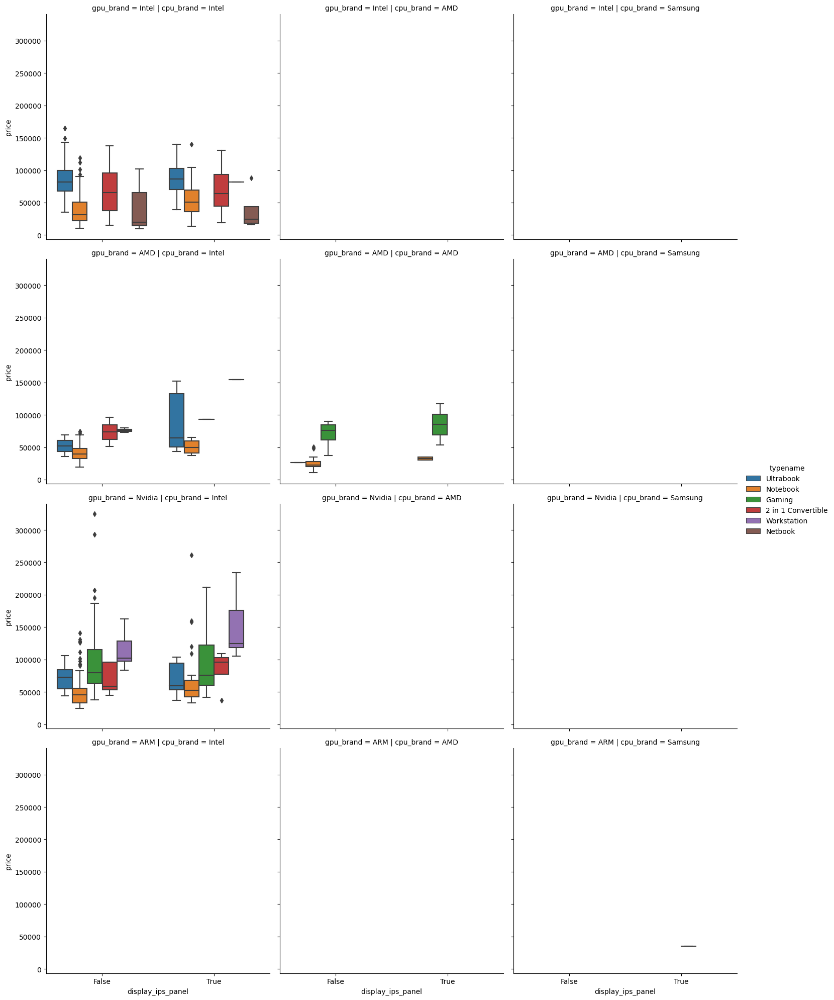

In [424]:
# cpu_brand vs gpu_brand vs price vs display_ips_panel

sns.catplot(data = df, x = 'display_ips_panel', y = 'price',hue = 'typename', kind = 'box')
sns.catplot(data = df, x = 'display_ips_panel', y = 'price', col = 'cpu_brand', row = 'gpu_brand', hue = 'typename', kind = 'box')


# IPS displays increase price, more common in laptops (Workstation, Notebook).
# Budget laptops (Notebook, Netbook) often don’t have IPS, leading to lower prices.
# for the gaming laptops - ips panel doesnt increases the price - by a significant amount.
# the price of ultrabooks increases - but mostly because of the ppi and screen quality factors.
# but for the notebooks of the intel gpu and intel cpu - the presence of ips panel display -- moderately increases the price - but not by a lot. -- still the laptop remains budget laptop.
# CPU-GPU brands don’t change this trend much, but the combo of Intel CPU + Nvidia GPU covers a wide range of prices.

In [425]:
df[df['typename'] == 'Ultrabook'].groupby('display_ips_panel').agg({
    'price' : ['mean','median','max','min']
})

price                               
                           mean    median        max       min
display_ips_panel                                             
False              82769.428931  79866.72  165168.00  26586.72
True               84260.175311  84395.52  152274.24  37242.72

In [426]:
df[df['typename'] == 'Gaming']['display_ips_panel'].value_counts()

display_ips_panel
False    116
True      87
Name: count, dtype: int64

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


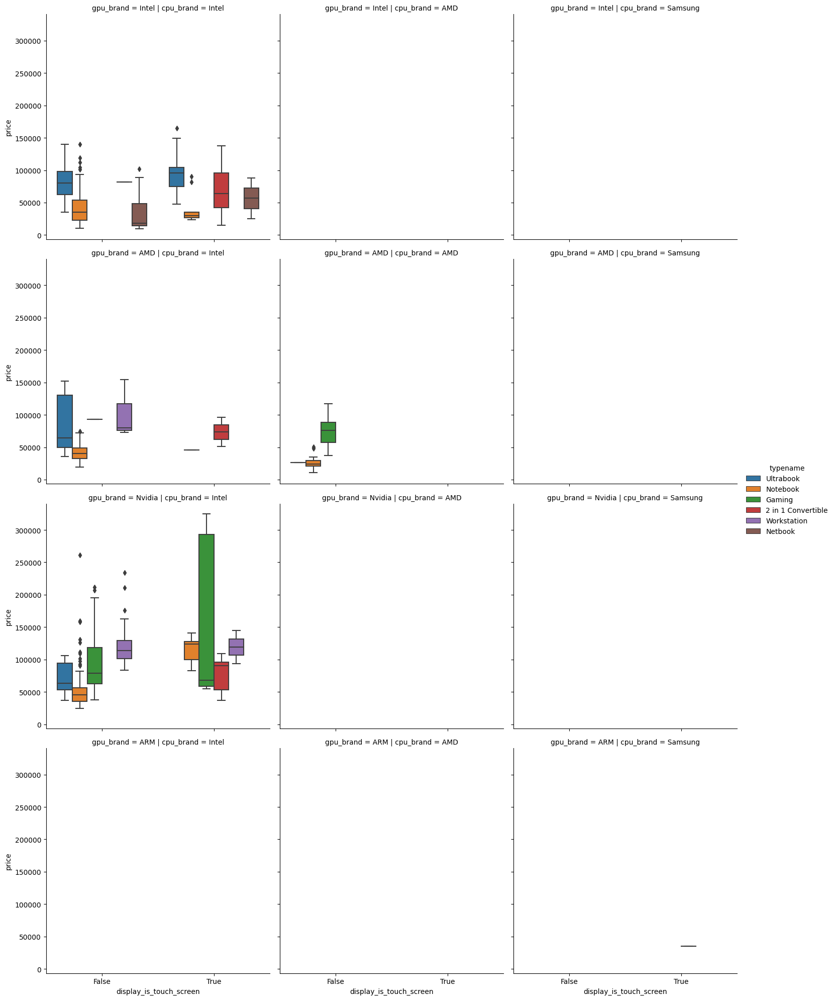

In [427]:
# cpu_brand vs gpu_brand vs display_is_touch_screen vs price.
sns.catplot(data = df, x = 'display_is_touch_screen', y = 'price', col = 'cpu_brand', row = 'gpu_brand', hue = 'typename', kind = 'box')
# the price increases if touch screen is present: only for the and 2 in 1 convertibles,Ultrabooks, notebooks and netbooks.
# as the touch screen is present only in these categories of laptops
# very few arm processor based devices are present in the dataset.

In [428]:
df[df['display_is_touch_screen'] == True]['typename'].value_counts()

typename
2 in 1 Convertible    111
Ultrabook              44
Notebook               18
Gaming                  5
Workstation             2
Netbook                 2
Name: count, dtype: int64

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


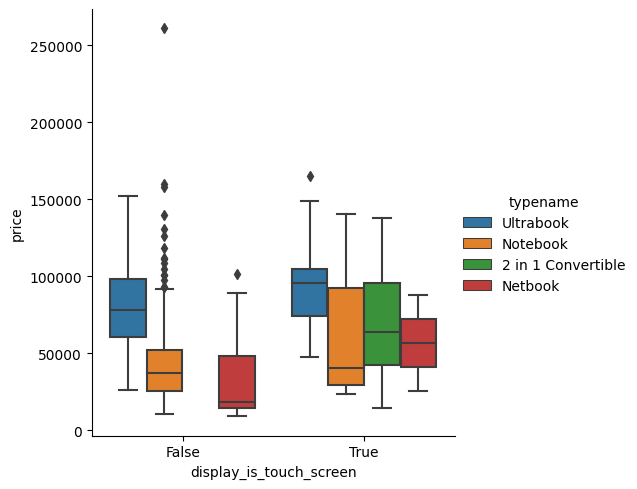

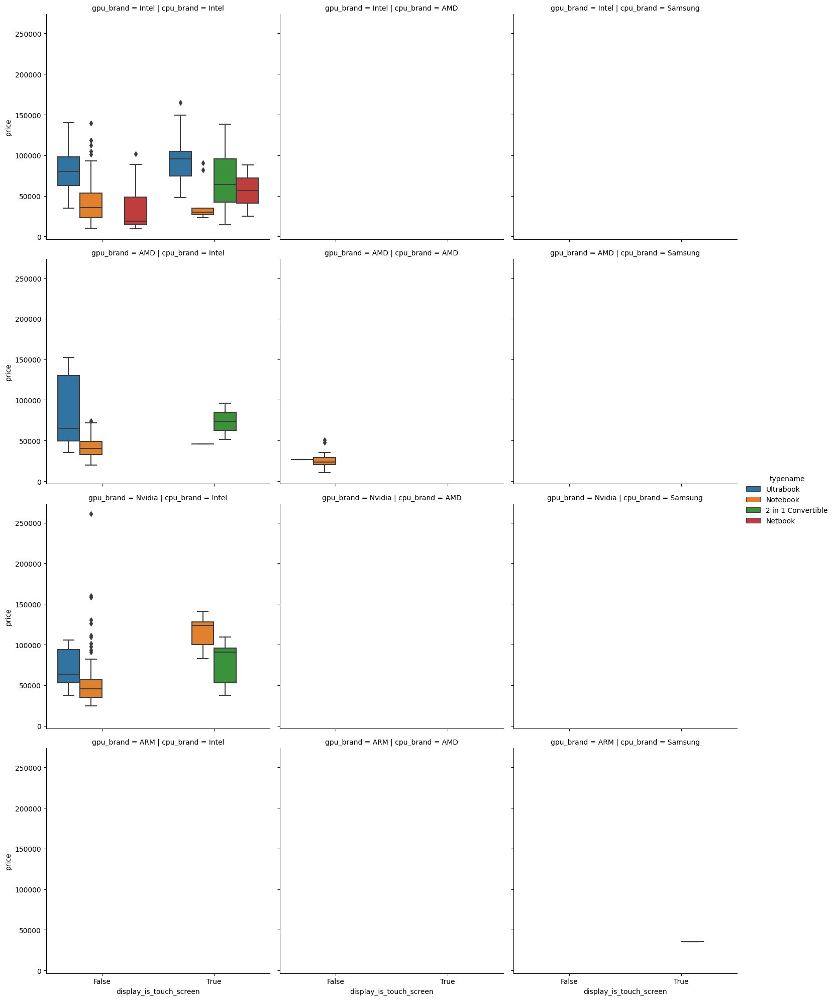

In [429]:
# now just checking the effect of the touchscreen for those categories of laptops where its mostly present
temp_df = df[df['typename'].isin(['2 in 1 Convertible','Ultrabook','Notebook','Netbook'])]
sns.catplot(data = temp_df, x = 'display_is_touch_screen', y = 'price',hue = 'typename', kind = 'box')
sns.catplot(data = temp_df, x = 'display_is_touch_screen', y = 'price', col = 'cpu_brand', row = 'gpu_brand', hue = 'typename', kind = 'box')
# for the brands if display is touch screen then the price increases.
# amd cpu and amd gpu present in the lower priced devices.

In [430]:
# opsys vs display_ips_panel vs price vs typename
# opsys vs clock_speed vs price vs typename


In [431]:
# opsys vs display_is_touch_screen vs price vs typename
# categorical vs categorical vs numerical vs categorical.

print(pd.crosstab(columns = df['opsys'], index = df['display_is_touch_screen']))
# touch screen devices come mostly with the windows and chrome os mostly.

opsys                    Android  Chrome OS  Linux  Mac Os  No OS  Windows
display_is_touch_screen                                                   
False                          0         17     56      21     63      900
True                           1         10      1       0      0      170


In [432]:
pd.crosstab(columns = df['opsys'], index = df['typename'])
# android only comes in the 2 in 1 convertible - makes sense - more like a tablet kind of device.
# chrome os - mostly comes in the notebooks,netbooks and 2 in 1 convertible formats.
# the chrome os - is mostly used in the budget devices mostly for the light browsing and entertainment - but some are are high priced - they have high screen quality , higher ram, higher ppi --  increasing their price.

opsys,Android,Chrome OS,Linux,Mac Os,No OS,Windows
typename,,,,,,
2 in 1 Convertible,1,7,0,0,0,103
Gaming,0,0,4,0,9,190
Netbook,0,8,0,0,0,14
Notebook,0,9,51,0,53,572
Ultrabook,0,3,2,21,1,162
Workstation,0,0,0,0,0,29


424    Intel
459    Intel
736    Intel
923    Intel
Name: gpu_brand, dtype: object

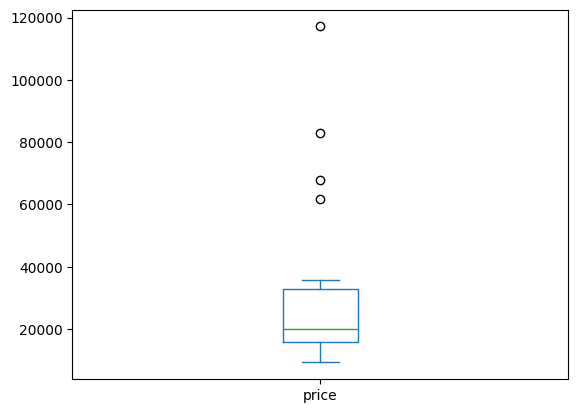

In [433]:
df[df['opsys'] == 'Chrome OS']['price'].plot(kind = 'box')
df[(df['opsys'] == 'Chrome OS') & (df['price'] > 40000)]['gpu_brand']

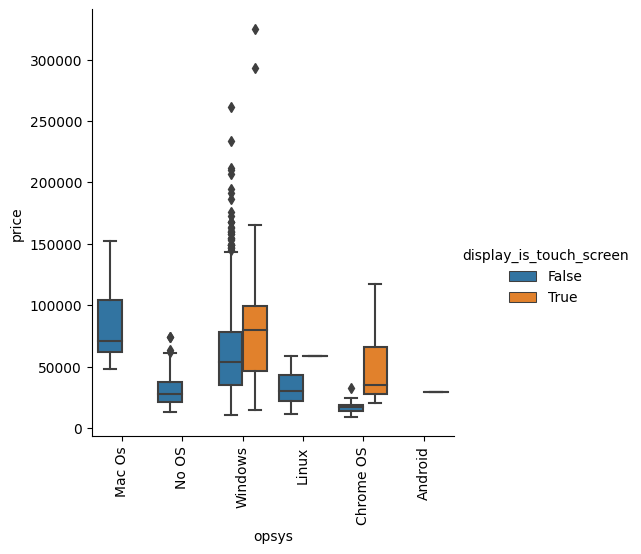

In [434]:
# opsys vs display_is_touch_screen vs price
sns.catplot(data = df, x = 'opsys', y = 'price', hue = 'display_is_touch_screen', kind = 'box')
plt.xticks(rotation = 90)
plt.show()

# for windows and chrome os , linux the touch screen display is present 
# if touchscreen is present the median price increases -  as we see from the graph across the opsys - which comes with combination of touchscreen panel.
# the price varies for windows - a lot -- when touch screen is not present because of other factors.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When groupi

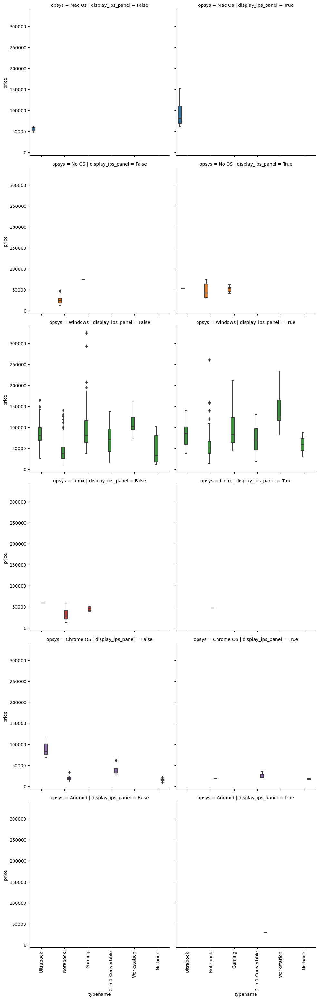

In [435]:
# typename vs opsys vs display_ips_panel vs price.

s = sns.catplot(data = df, x = 'typename', y = 'price', col = 'display_ips_panel', row = 'opsys', hue = 'opsys', kind = 'box')
[ax.tick_params(axis='x', labelrotation = 90) for ax in s.axes.flat]
plt.show()
# for mac os - ultrabook category - the price median increases if the display is ips panel.
# for windows os - for notebooks,workstation,netbook - the median price increases if the display is ips panel.
# for linux os - for notebook category the price increases if the display is ips panel.

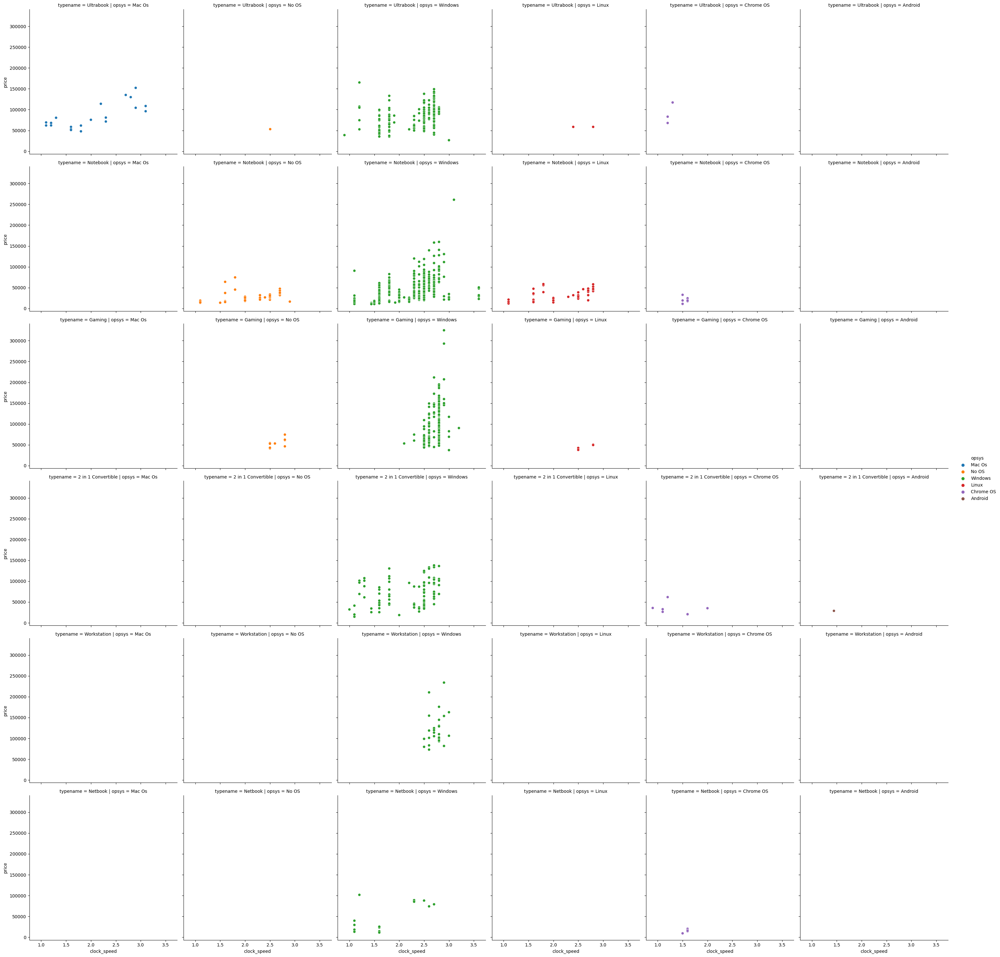

In [436]:
# opsys vs clock_speed vs price vs typename
sns.relplot(data = df,x = 'clock_speed', y = 'price', col = 'opsys', row = 'typename', hue = 'opsys', kind = 'scatter')

# as clockspeed increases the price increses across all typename across all the opsys.

In [437]:
df.select_dtypes(exclude = [np.float64,np.int64, bool]).columns

Index(['company', 'typename', 'screenresolution', 'opsys', 'cpu_brand',
       'gpu_brand', 'cpu_details', 'resolution', 'resolution_type',
       'aspect_ratio', 'quality_rank'],
      dtype='object')

In [438]:
df.select_dtypes(include = [np.float64,np.int64, bool]).columns

Index(['inches', 'ram', 'weight', 'price', 'px_width', 'px_height',
       'display_ips_panel', 'display_is_touch_screen', 'clock_speed',
       'ssd_capacity', 'hdd_capacity', 'ssd_count', 'hdd_count',
       'flash_storage', 'ppi_whole'],
      dtype='object')

In [439]:
df.columns

Index(['company', 'typename', 'inches', 'screenresolution', 'ram', 'opsys',
       'weight', 'price', 'px_width', 'px_height', 'display_ips_panel',
       'display_is_touch_screen', 'cpu_brand', 'clock_speed', 'gpu_brand',
       'ssd_capacity', 'hdd_capacity', 'ssd_count', 'hdd_count',
       'flash_storage', 'cpu_details', 'ppi_whole', 'resolution',
       'resolution_type', 'aspect_ratio', 'quality_rank'],
      dtype='object')

In [440]:
df.isnull().sum()

company                    0
typename                   0
inches                     0
screenresolution           0
ram                        0
opsys                      0
weight                     0
price                      0
px_width                   0
px_height                  0
display_ips_panel          0
display_is_touch_screen    0
cpu_brand                  0
clock_speed                0
gpu_brand                  0
ssd_capacity               0
hdd_capacity               0
ssd_count                  0
hdd_count                  0
flash_storage              0
cpu_details                0
ppi_whole                  0
resolution                 0
resolution_type            0
aspect_ratio               0
quality_rank               0
dtype: int64

In [441]:
# why companies like Razer, LG, MSI, and Apple stand out as brands with higher average prices.
# bigger screen size, higher ram, nvidia and amd higher priced gpu, -- are the main reason

In [442]:
# inches,ram, ssd_capacity, opsys, gpu_brand,ppi_whole, resolution_type, quality_rank
df[df['company'].isin(['Razer','LG','MSI','Apple'])].groupby('inches').size().sort_values(ascending = False)  # higher scrren sie 
df[df['company'].isin(['Razer','LG','MSI','Apple'])].groupby('ram').size().sort_values(ascending = False)  # higher ram mostly.
df[df['company'].isin(['Razer','LG','MSI','Apple'])].groupby('opsys').size().sort_values(ascending = False) # macos - for macbooks - which is expensive.
df[df['company'].isin(['Razer','LG','MSI','Apple'])].groupby('gpu_brand').size().sort_values(ascending = False) 
# the gpu present are of intel, nvidia and amd - but the devices with the nvidia and amd gpu - are high priced.
# only the devices of razer company with the intel gpu are high priced.
df[df['company'].isin(['Razer','LG','MSI','Apple'])].groupby('ppi_whole').size().sort_values(ascending = False)  # lower ppi mostly - but the apple and razer - have higher ppi - increasing price.
df[df['company'].isin(['Razer','LG','MSI','Apple'])].groupby('resolution_type').size().sort_values(ascending = False)  # standard - resolution type - 1920 X 1080 p.
df[df['company'].isin(['Razer','LG','MSI','Apple'])].groupby('quality_rank').size().sort_values(ascending = False)

quality_rank
Mid          57
High         12
Very High    10
Lower-Mid     4
Lower         1
dtype: int64

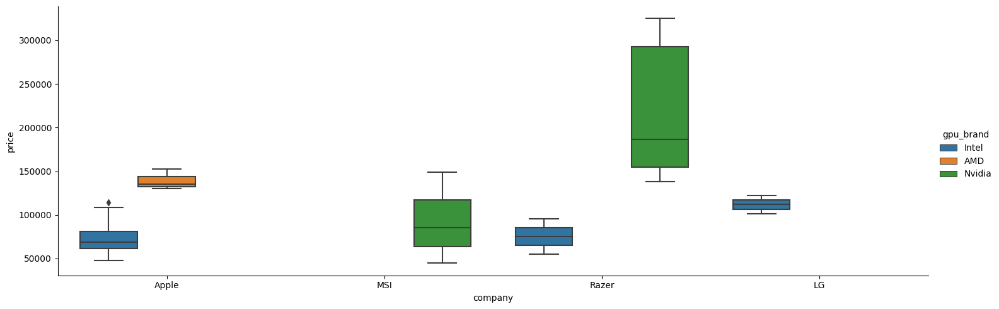

In [443]:
sns.catplot(data = df[df['company'].isin(['Razer','LG','MSI','Apple'])],
           x = 'company',
           y = 'price',
           kind = 'box',
           hue = 'gpu_brand',
           aspect = 3)

In [444]:
df[df['company'].isin(['Razer','LG','MSI','Apple'])].groupby('company')['ppi_whole'].median()

company
Apple    226.0
LG       141.0
MSI      141.0
Razer    255.0
Name: ppi_whole, dtype: float64

In [445]:
# To identify why some weight varies at the same screeninches and can also consider some other columns.

In [446]:
df['weight'].corr(df['inches']) 
# high correlation in the weight and the inches.

0.8114227799448113

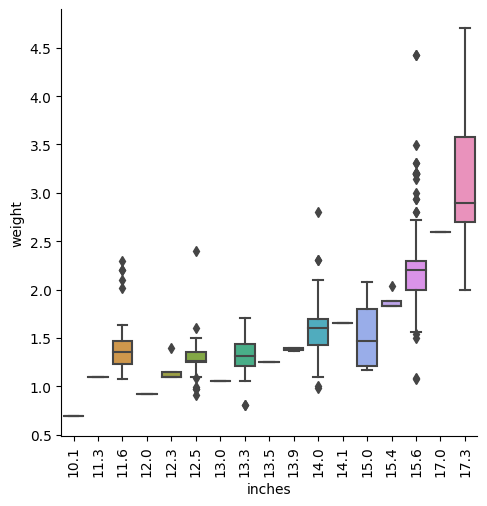

In [447]:
sns.catplot(data = df, x = 'inches', y = 'weight', kind = 'box')
plt.xticks(rotation = 90)
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


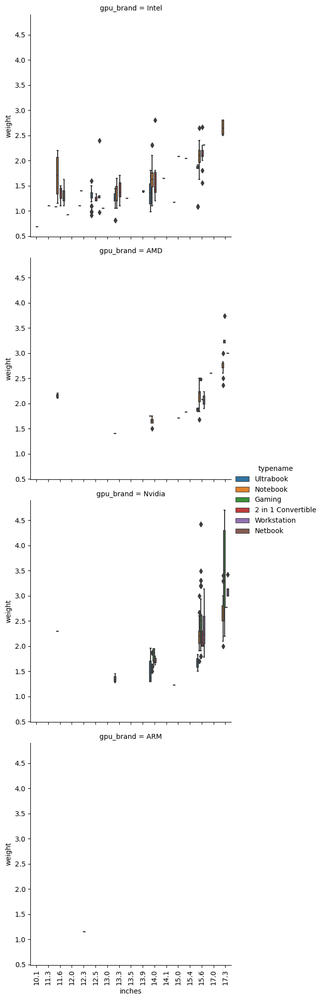

In [448]:
sns.catplot(data = df, x = 'inches', y = 'weight', kind = 'box', hue = 'typename', row = 'gpu_brand')
plt.xticks(rotation = 90)
plt.show()

# from the graph we can clearly see that the typename - is the cause of the weight fluctuation at the same screen size because.
# the workstation and the gaming laptops tends to be on the heavier side. -- because of the cooling systems, metal chassis, bigger batteries.  and other specs.

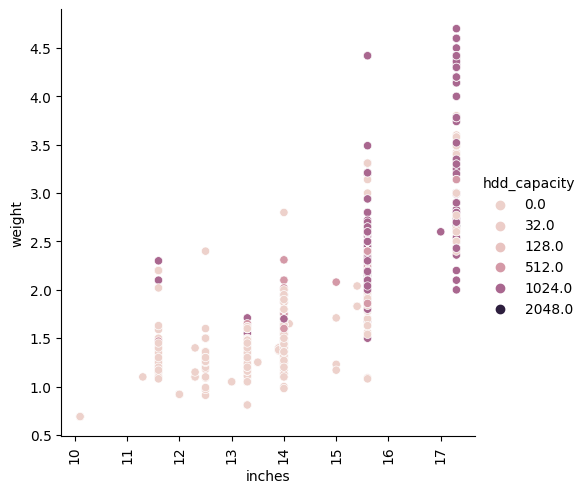

In [449]:
sns.relplot(data = df, x = 'inches', y = 'weight', kind = 'scatter',hue = 'hdd_capacity')
plt.xticks(rotation = 90)
plt.show()
# at the bigger screens lower hdd_capacity is present still the weight is higher, so the hdd_capacity - wont be a big contributer to the weight.

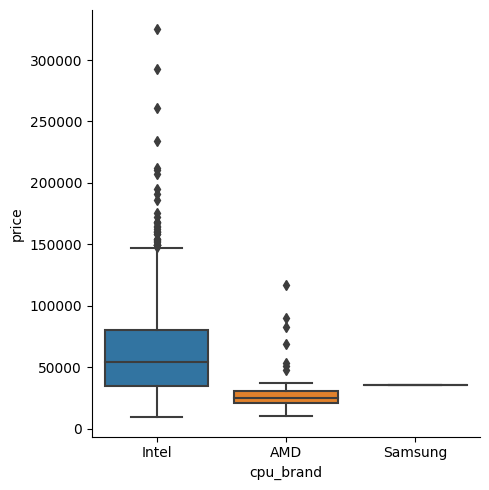

In [450]:
# why intel charges so much for its cpus. - is it because of higher clock speed, also analyse for the amd higher priced laptops.
sns.catplot(data = df, x = 'cpu_brand', y = 'price', kind = 'box')

# the laptops with the intel cpus fall under various categories - but the laptops which are expensive - are either gaming or workstation and few ultrabooks.
# they mostly have bigger screen 17.3 inches.
# higher ram  16,32gb
# significant number of devices have ips panel
# mostly nvidia gpu - they tends to be in expensive systems.
# slightly higher clock speed.
# mostly 512 or 256gb ssd.

In [451]:
# higher price within the same cpu brand because of the 
checklist = ['typename','inches','ram','display_ips_panel','display_is_touch_screen','gpu_brand','clock_speed','ssd_capacity','ppi_whole']
for i in checklist:
    print(df[(df['cpu_brand']  == 'Intel') & (df['price'] > 150000)][i].value_counts().sort_values(ascending = False))
    print(25 * '*')
# typename - gaming and workstations
# bigger screen size, higher ram, ips_panel display, nvidia gpu, slightly higher clock speeds, ssd_capacity - 

# for amd also similar reasons.

typename
Gaming         17
Workstation     6
Notebook        3
Ultrabook       2
Name: count, dtype: int64
*************************
inches
17.3    19
15.6     5
14.0     2
15.4     1
12.5     1
Name: count, dtype: int64
*************************
ram
16.0    12
32.0    10
8.0      4
24.0     1
64.0     1
Name: count, dtype: int64
*************************
display_ips_panel
True     17
False    11
Name: count, dtype: int64
*************************
display_is_touch_screen
False    25
True      3
Name: count, dtype: int64
*************************
gpu_brand
Nvidia    25
AMD        2
Intel      1
Name: count, dtype: int64
*************************
clock_speed
2.8    13
2.9     7
2.7     3
2.6     2
3.0     1
1.2     1
3.1     1
Name: count, dtype: int64
*************************
ssd_capacity
512.0     10
256.0      9
1024.0     7
128.0      1
0.0        1
Name: count, dtype: int64
*************************
ppi_whole
127.0    13
255.0     6
282.0     4
157.0     2
221.0     1
141.0     1
3

In [452]:
checklist = ['typename','inches','ram','display_ips_panel','display_is_touch_screen','gpu_brand','clock_speed','ssd_capacity','ppi_whole']
for i in checklist:
    print(df[(df['cpu_brand']  == 'AMD') & (df['price'] > 50000)][i].value_counts().sort_values(ascending = False))
    print(25 * '*')

typename
Gaming      5
Notebook    1
Name: count, dtype: int64
*************************
inches
17.3    4
15.6    2
Name: count, dtype: int64
*************************
ram
16.0    3
8.0     2
12.0    1
Name: count, dtype: int64
*************************
display_ips_panel
False    4
True     2
Name: count, dtype: int64
*************************
display_is_touch_screen
False    6
Name: count, dtype: int64
*************************
gpu_brand
AMD    6
Name: count, dtype: int64
*************************
clock_speed
3.0    3
3.2    1
3.6    1
2.1    1
Name: count, dtype: int64
*************************
ssd_capacity
256.0    4
512.0    2
Name: count, dtype: int64
*************************
ppi_whole
127.0    4
141.0    2
Name: count, dtype: int64
*************************


In [453]:
# when gpu is nvidia.

In [454]:
checklist = ['typename','inches','ram','display_ips_panel','display_is_touch_screen','cpu_brand','clock_speed','ssd_capacity','ppi_whole']
for i in checklist:
    print(df[(df['gpu_brand']  == 'Nvidia')][i].value_counts().sort_values(ascending = False))
    print(20 * '*')
# gaming,notebooks and workstation mostly.
# mostly std screens and significant number of bigger screens.
# higher ram
# equally yes or no.
# mostly no touchscreen.
# intel cpu
# slightly higher speed for most of the laptops.
# mostly lower ppi and few higher ppi.

typename
Gaming                196
Notebook              142
Workstation            25
Ultrabook              17
2 in 1 Convertible      9
Name: count, dtype: int64
********************
inches
15.6    231
17.3    131
14.0     21
13.3      4
11.6      1
15.0      1
Name: count, dtype: int64
********************
ram
8.0     190
16.0    127
4.0      29
32.0     16
12.0     12
6.0      11
24.0      2
2.0       1
64.0      1
Name: count, dtype: int64
********************
display_ips_panel
False    243
True     146
Name: count, dtype: int64
********************
display_is_touch_screen
False    367
True      22
Name: count, dtype: int64
********************
cpu_brand
Intel    389
Name: count, dtype: int64
********************
clock_speed
2.8    147
2.5     70
2.7     58
2.6     41
1.8     19
1.6     14
2.9     12
2.3      9
2.0      9
2.4      5
1.1      2
3.0      2
3.1      1
Name: count, dtype: int64
********************
ssd_capacity
256.0     162
0.0        90
128.0      79
512.0      49


In [455]:
# laptops with gpu of nvidia brand - outlier analysis(on price)
# mostly because of the higher ram, bigger screens and higher clock speed and ssd is present.

In [456]:
 # why their prices are higher.
checklist = ['typename','inches','ram','display_ips_panel','display_is_touch_screen','cpu_brand','clock_speed','ssd_capacity','ppi_whole']
for i in checklist:
    print(df[(df['gpu_brand']  == 'Nvidia') & (df['price'] > 150000)][i].value_counts().sort_values(ascending = False))
    print('*' * 20)
# gaming and workstation mostly.
# mostly bigger screens
# higher ram.
# approximately equal number of ips_panel present and not.
# mostly no touchscreen.
# intel cpu
# slightly higher clock speed
# mostly lower ppi and and few higher ppi.

typename
Gaming         17
Workstation     5
Notebook        3
Name: count, dtype: int64
********************
inches
17.3    18
15.6     5
14.0     2
Name: count, dtype: int64
********************
ram
16.0    11
32.0    10
8.0      2
24.0     1
64.0     1
Name: count, dtype: int64
********************
display_ips_panel
True     15
False    10
Name: count, dtype: int64
********************
display_is_touch_screen
False    23
True      2
Name: count, dtype: int64
********************
cpu_brand
Intel    25
Name: count, dtype: int64
********************
clock_speed
2.8    13
2.9     6
2.7     3
3.0     1
3.1     1
2.6     1
Name: count, dtype: int64
********************
ssd_capacity
512.0     9
256.0     8
1024.0    7
128.0     1
Name: count, dtype: int64
********************
ppi_whole
127.0    12
255.0     6
282.0     4
157.0     2
141.0     1
Name: count, dtype: int64
********************


In [457]:
df.columns

Index(['company', 'typename', 'inches', 'screenresolution', 'ram', 'opsys',
       'weight', 'price', 'px_width', 'px_height', 'display_ips_panel',
       'display_is_touch_screen', 'cpu_brand', 'clock_speed', 'gpu_brand',
       'ssd_capacity', 'hdd_capacity', 'ssd_count', 'hdd_count',
       'flash_storage', 'cpu_details', 'ppi_whole', 'resolution',
       'resolution_type', 'aspect_ratio', 'quality_rank'],
      dtype='object')

In [458]:
df['quality_rank'].unique()

array(['High', 'Lower-Mid', 'Mid', 'Very High', 'Lower'], dtype=object)

<Axes: >

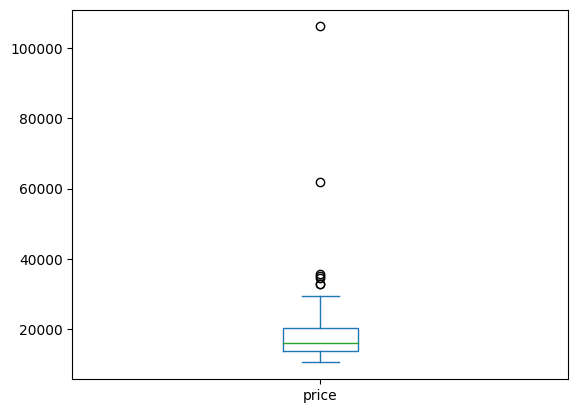

In [459]:
# opsys vs flash_stroage vs price vs typename
# cat vs cat vs cat vs num

df[~(df['flash_storage'] == 0)]['price'].plot(kind = 'box')

# mostly the flash storage is present in the lower priced products but for 1 product - which is a workstation with 1TB HDD and 64 gb flash stroage - combination combined with other price drivers - increases the price.
# the second outlier here - is a 2 in 1 convertible -- and is slighlty expensive because of touch screen.

In [460]:
df[~(df['flash_storage'] == 0) & (df['price'] > 50000)]

,company,typename,inches,screenresolution,ram,opsys,weight,price,px_width,px_height,...,hdd_capacity,ssd_count,hdd_count,flash_storage,cpu_details,ppi_whole,resolution,resolution_type,aspect_ratio,quality_rank
434,Dell,Workstation,15.6,Full HD 1920x1080,8.0,Windows,2.23,106187.04,1920,1080,...,1024.0,0,1,64.0,Xeon E3-1505M V6,141.0,1920 x 1080,Full HD (1080p),16:9,Mid
923,Asus,2 in 1 Convertible,12.5,Full HD 1920x1080,8.0,Chrome OS,1.20,61751.52,1920,1080,...,0.0,0,0,64.0,Core M M7-6Y75,176.0,1920 x 1080,Full HD (1080p),16:9,Mid


In [461]:
# opsys vs flash_storage
pd.crosstab(index = df['flash_storage'], columns = df['opsys'])   # mostly flash_storage is not present but if present 32 gb is the popular one.

opsys,Android,Chrome OS,Linux,Mac Os,No OS,Windows
flash_storage,,,,,,
0.0,0,7,57,21,63,1036
16.0,0,7,0,0,0,0
32.0,0,10,0,0,0,25
64.0,1,3,0,0,0,9


In [462]:
pd.crosstab(index = df['typename'], columns = df['flash_storage'])   

flash_storage,0.0,16.0,32.0,64.0
typename,,,,
2 in 1 Convertible,98,0,7,6
Gaming,203,0,0,0
Netbook,12,4,5,1
Notebook,654,3,23,5
Ultrabook,189,0,0,0
Workstation,28,0,0,1


In [463]:
df[(df['typename'] == 'Notebook')].shape

(685, 26)

In [464]:
df[(df['typename'] == 'Notebook') & (df['flash_storage'] == 0)].shape[0]/df[(df['typename'] == 'Notebook')].shape[0] * 100

95.47445255474453

In [465]:
# flash storage is usually present in the notebooks.
# notebooks where the flash_storage is not present the price varies.
# here the price is varying because some of the notebooks are premium one - with very high screen quality,high ram,ssd,higher ppi
# the notebooks where flash storage is present there - the prices are very low < 30000 INR

<Axes: >

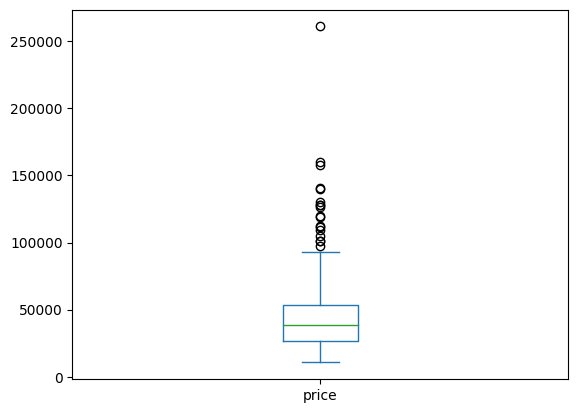

In [466]:
df[(df['typename'] == 'Notebook') & (df['flash_storage'] == 0)]['price'].plot(kind = 'box')

In [467]:
# the notebooks where flash storage is present there - the prices are very low.

<Axes: >

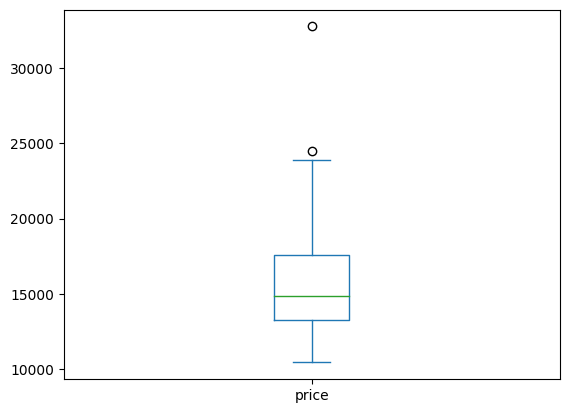

In [468]:
df[(df['typename'] == 'Notebook') & ~(df['flash_storage'] == 0)]['price'].plot(kind = 'box')

In [469]:
check_list = ['ram','clock_speed','ppi_whole','display_ips_panel','display_is_touch_screen',
              'ssd_capacity','hdd_capacity','flash_storage','resolution_type']
for i in check_list:
    print(df[(df['typename'] == 'Notebook') & ~(df['flash_storage'] == 0)].groupby(i).size().sort_values(ascending = False))
    print('*' * 20)
# lower ram
# lower clock_speeds
# lower ppi
# non ips panel and no touch screen display
# mostly only flash storage
# lower resolution_type -- mostly HD Ready.

ram
4.0    21
2.0     9
6.0     1
dtype: int64
********************
clock_speed
1.10    12
1.60    10
1.44     6
1.50     3
dtype: int64
********************
ppi_whole
112.0    16
157.0     5
141.0     3
166.0     2
111.0     1
135.0     1
118.0     1
267.0     1
276.0     1
dtype: int64
********************
display_ips_panel
False    27
True      4
dtype: int64
********************
display_is_touch_screen
False    31
dtype: int64
********************
ssd_capacity
0.0    31
dtype: int64
********************
hdd_capacity
0.0    31
dtype: int64
********************
flash_storage
32.0    23
64.0     5
16.0     3
dtype: int64
********************
resolution_type
HD Ready                              19
Full HD (1080p)                       10
Custom (close to 3:2 aspect ratio)     1
QHD+ (Quad HD Plus)                    1
dtype: int64
********************


In [470]:
df.columns

Index(['company', 'typename', 'inches', 'screenresolution', 'ram', 'opsys',
       'weight', 'price', 'px_width', 'px_height', 'display_ips_panel',
       'display_is_touch_screen', 'cpu_brand', 'clock_speed', 'gpu_brand',
       'ssd_capacity', 'hdd_capacity', 'ssd_count', 'hdd_count',
       'flash_storage', 'cpu_details', 'ppi_whole', 'resolution',
       'resolution_type', 'aspect_ratio', 'quality_rank'],
      dtype='object')